# Problem Description

### Background: A well-established bank in Asia Pacific is looking to use data to better their nonperforming loan ratio.

The bank aims to predict whether a loan will be payed back to the bank or not. To solve this problem, the bank needs to gather the right data, analyse it and create a model to predict whether a loan will be paid back or not. Since this is the first time the bank is attempting to use data actively, they will need help on finding the right data to predict nonperforming loans and if a client is able to pay the due installment. At the moment, the bank is fully dependent on the credit risk rating and their past experience. However, the bank is unable to accurately predict whether a client is able to pay their loan back on a continous basis, month to month, and hence is unable to serve their clients better and prevent clients from defaulting.

### The banks goals are to:

predict if a client is able to pay the installment in any given month
predict how much a client may be able to pay in any given period
accurately predict the risk of a client defaulting
Objective Describe the problem according to the stated goals and solve it.

### To solve the problem, you will need to find data. At a minimum the data should include:

client file, including diverse demographic data
loan data, including loan tenure, amount, payments, loan status, and a loand identifier
account transactions

### Deliverables

For every loan analyzed, the submission files should contain the predication as well as the predicted contribution on a monthly basis.

# Approach

We will do following
- Load application_train.csv
- Check dataset and do Data Cleaning by dropping columns with most missing values since our model will not learn anything from such features/variables
- Exploratory Data Analysis and check for good possible predictors
- Calculate <b><u>Weight of Evidence (WOE) and Information Value (IV)</u></b> of each predictor
- <b><u>Data Imputation</u></b>
    - We can do data imputation by using various methods such as
    - 1. Use WOE values and replace the coulmn values withappropriate woe values. This will handle the null values as well.
    - 2. Use FancyImputer to impute missing values 
    - 3. Use SimpleImputer to impute missing values with median/mode
    - 4. Manually replace missing values with median or mode by data visualisation techniques
    - 5. Replace null or infinite values with 0
    - Here we will replace missing values with value 0, this becuase after data analysis, using binary or multi-variate analysis we found that data is missing due to some reason like car age is null because the flag own car is 0 i.e. no car, similarly days of emplaoyed is 365243 for pensioners or unemployed people. Even though we can replace these values with FancyImputer techniques but that imputation will also not be relevant to the fact. So we choose to replace the null or infinite values with 0 for ease of assignment. 
- Data Preparation by doing Data Trasnformation for categorical columns using LabelEncoder

<b>Part - I (<u>with</u> only application_train.csv)</b>
- Create X and y and do Stratified fold to create X_train and y_train (stratified train-test split)
- Use RFE and choose first 30 important features /variables
- Build Stats Model and check for VIF of variables
    - Drop variables with high VIF
- Build Logistic Regression Model with filtered features from above step.
- Build Random Forest Model with all features
- Build Random Forest Model using SMOTE balancing algorithm to balance target class, 
- Build XGBoost Model
- Do Model Evaulation for train-test accuracy, specificity, ROC-AUC
- Check for probability cut-off value to get stabilised Specificity value
- List important features
- Choose the best model (Random Forest in this case)
    - Build the model
    - Check for feature Importance
    - Build Lift and Gain chart and check for top% of defaulters for 80% default rate

<b>Part - II (<b><u>with</u></b> all files like application_train.csv, previous_applications.csv, bureau data and installments data)</b>
- aggregate previous_applications.csv, bureau data and installments data by creating data frame with aggregate values. Use max, mean, sum etc. function for aggregation. Aggregate based on SK_ID_CURR which is parent Id
- Merge these aggregated dataframes with application dataframe
- Data Preparation by doing Data Trasnformation for categorical columns using LabelEncoder
- Create X and y and do Stratified fold to create X_train and y_train (stratified train-test split)
- Build Random Forest Model with all features
- Do Model Evaluation for train-test accuracy, specificty, ROC-AUC
- Check for probability cut-off value to get stabilised Specificity value
- List important features
- Create gain and lift charts and calculate the top percentage of clients that can be identified as defualters with 85% rate
- Evaluate model for credit loss saved and revenue loss without model

## Metrics to be used
- Specificity and ROC-AUC

# Library Imports

In [1811]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import roc_auc_score, roc_curve, precision_recall_curve
import statsmodels.api as sm
from statsmodels.compat import lzip
import scipy.stats as stats
from scipy.stats import norm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import StratifiedKFold, GridSearchCV, RepeatedStratifiedKFold, RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier

from imblearn.over_sampling import SMOTE
from imblearn.pipeline import make_pipeline
%matplotlib inline

pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)
pd.set_option('display.max_colwidth',-1)
warnings.filterwarnings('ignore')
sns.set(font_scale=1.5)

In [1480]:
%%HTML
<style type="text/css">
table.dataframe td, table.dataframe th {
    border: 1px  black solid !important;
  color: black !important;
}
</style>

# Load Application.csv

In [1481]:
application_df = pd.read_csv('./data/application_train.csv')
application_df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

# Check for Data Types and Column Names

In [1482]:
application_df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   SK_ID_CURR                    int64  
 1   TARGET                        int64  
 2   NAME_CONTRACT_TYPE            object 
 3   CODE_GENDER                   object 
 4   FLAG_OWN_CAR                  object 
 5   FLAG_OWN_REALTY               object 
 6   CNT_CHILDREN                  int64  
 7   AMT_INCOME_TOTAL              float64
 8   AMT_CREDIT                    float64
 9   AMT_ANNUITY                   float64
 10  AMT_GOODS_PRICE               float64
 11  NAME_TYPE_SUITE               object 
 12  NAME_INCOME_TYPE              object 
 13  NAME_EDUCATION_TYPE           object 
 14  NAME_FAMILY_STATUS            object 
 15  NAME_HOUSING_TYPE             object 
 16  REGION_POPULATION_RELATIVE    float64
 17  DAYS_BIRTH                    int64  
 18  DAYS_EMPLOYED          

## Observation from above data info
- There are total 122 columns
- 16 Columns are categorical
- 106 Columns are numerical

## Check for missing values

In [1483]:
pd.DataFrame([[application_df.shape],
             [application_df.isnull().sum().sum()],
             [application_df.duplicated().sum()]
             ],
            columns=['Application data set'],
            index=['Shape','Missingness','Duplicates'])

,Application data set
Shape,"(307511, 122)"
Missingness,9152465
Duplicates,0


## Look for missing value percentage

In [1484]:
percent_missing = application_df.isnull().sum()*100/len(application_df)
missing_df = pd.DataFrame({'column_name':application_df.columns,
                          'missing_percentage':percent_missing})
missing_df

,column_name,missing_percentage
SK_ID_CURR,SK_ID_CURR,0.000000
TARGET,TARGET,0.000000
NAME_CONTRACT_TYPE,NAME_CONTRACT_TYPE,0.000000
CODE_GENDER,CODE_GENDER,0.000000
FLAG_OWN_CAR,FLAG_OWN_CAR,0.000000
FLAG_OWN_REALTY,FLAG_OWN_REALTY,0.000000
CNT_CHILDREN,CNT_CHILDREN,0.000000
AMT_INCOME_TOTAL,AMT_INCOME_TOTAL,0.000000
AMT_CREDIT,AMT_CREDIT,0.000000
AMT_ANNUITY,AMT_ANNUITY,0.003902


### Get the list of column with missing percentage >15%

In [1485]:
missing_data_cols_list = list(missing_df[missing_df['missing_percentage']>15]['column_name'])
missing_data_cols_list

['OWN_CAR_AGE',
 'OCCUPATION_TYPE',
 'EXT_SOURCE_1',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXPLUATATION_MODE',
 'YEARS_BUILD_MODE',
 'COMMONAREA_MODE',
 'ELEVATORS_MODE',
 'ENTRANCES_MODE',
 'FLOORSMAX_MODE',
 'FLOORSMIN_MODE',
 'LANDAREA_MODE',
 'LIVINGAPARTMENTS_MODE',
 'LIVINGAREA_MODE',
 'NONLIVINGAPARTMENTS_MODE',
 'NONLIVINGAREA_MODE',
 'APARTMENTS_MEDI',
 'BASEMENTAREA_MEDI',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'YEARS_BUILD_MEDI',
 'COMMONAREA_MEDI',
 'ELEVATORS_MEDI',
 'ENTRANCES_MEDI',
 'FLOORSMAX_MEDI',
 'FLOORSMIN_MEDI',
 'LANDAREA_MEDI',
 'LIVINGAPARTMENTS_MEDI',
 'LIVINGAREA_MEDI',
 'NONLIVINGAPARTMENTS_MEDI',
 'NONLIVINGAREA_MEDI',
 'FONDKAPREMONT_MODE

### Observation from list of missing columns, 
- There are many columns with missing value percentage > 15%
- We can either choose to drop these columns or analyse further
- <font color=blue>For now, we will keep columns OWN_CAR_AGE, EXT_SOURCE_1, EXT_SOURCE_3, OCCUPATION_TYPE </font> because,
    - OWN_CAR_AGE - not everyone will own car. We will see where the data is missing and how to handle it. Asset verification during loan approval is important part of analysis so lets retain this column
    - EXT_SOURCE_1 & EXT_SOURCE_3 - These are the credit scores from external sources. We might not have scores coming in from all sources but wherever its available will add on to additional insight in loan approval process. So for now we will retain these columns
    - OCCUPATION_TYPE - This is also important feature in assessing loan application. Sometimes person is working as unauthorised worker so may be Occupation type is not available. We will furyher analyse where we need to check for Occupation type. For now we will still keep this column to visualize any helpful analyse
- <font color=blue>We will drop rest of the columns with missing value percentage > 15%</font>

In [1486]:
#Based on above assumptions lets retain 3 columns 
#and filter these columns from missing value columns list
print('number of items in missing data column list before removing items: {0}'.format(len(missing_data_cols_list)))
missing_data_cols_list = [col for col in missing_data_cols_list
                         if col not in ('OWN_CAR_AGE, EXT_SOURCE_1, EXT_SOURCE_3, OCCUPATION_TYPE')]
print('number of items in missing data column list after removing items: {0}'.format(len(missing_data_cols_list)))

number of items in missing data column list before removing items: 51
number of items in missing data column list after removing items: 47


### Lets now drop columns with high missing value percentage from application dataframe

In [1487]:
print('No. of columns tpo be dropped from application_df: {0}'.format(len(missing_data_cols_list)))
print('Total no. of rows {0} and columns {1} before dropping columns'.format(application_df.shape[0],
                                                                            application_df.shape[1]))
application_df = application_df.drop(columns=missing_data_cols_list)
print('Total no. of rows {0} and columns {1} after dropping columns'.format(application_df.shape[0],
                                                                            application_df.shape[1]))

No. of columns tpo be dropped from application_df: 47
Total no. of rows 307511 and columns 122 before dropping columns
Total no. of rows 307511 and columns 75 after dropping columns


# Data Analysis and Data Imputation

## Function to plot distribution and check skewness of column

In [1488]:
## Function to create histograms

def subplot_histograms(dist_df, list_of_columns, cols = 2):
    nrows = int(np.ceil(len(list_of_columns)/cols)) # Makes sure you have enough rows
    
    #Scales the height of the fig to accomodate a long list of features    
    fig, ax = plt.subplots(nrows=nrows, ncols=cols, figsize=(25, len(list_of_columns)*(10/cols)),squeeze=False) 
    ax = ax.ravel() # Ravel turns a matrix into a vector, which is easier to iterate
    for i, column in enumerate(list_of_columns): # Gives us an index value to get into all our lists

        sns.distplot(dist_df[dist_df['TARGET']==1][column],color='green',label='TARGET=1',ax=ax[i]);
        sns.distplot(dist_df[dist_df['TARGET']==0][column],color='blue',label='TARGET=0',ax=ax[i]);
        ax[i].set_title('Distribution Plot of {0} feature wrt Class'.format(list_of_columns[i]),color='blue');
        ax[i].set_xlabel(list_of_columns[i]);
        ax[i].legend();
        

## Lets check the Target class 

0    0.919271
1    0.080729
Name: TARGET, dtype: float64

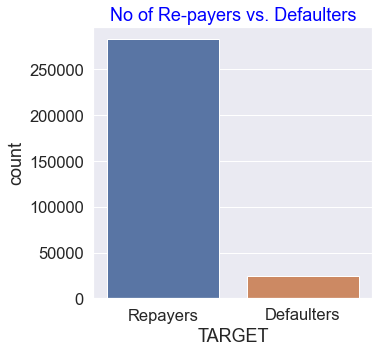

In [1489]:
plt.figure(figsize=(5,5))
sns.countplot(application_df['TARGET']);
plt.title('No of Re-payers vs. Defaulters',color='blue')
plt.xticks(np.arange(2),('Repayers','Defaulters'));
application_df['TARGET'].value_counts(1)

In [1490]:
# Print percentage Value "0" and "1" in Target column
print('Value "0" in TARGET column percentage: {0:.2%}'.format(application_df['TARGET'].value_counts(1)[0]))
print('Value "1" in TARGET column percentage: {0:.2%}'.format(application_df['TARGET'].value_counts(1)[1]))

Value "0" in TARGET column percentage: 91.93%
Value "1" in TARGET column percentage: 8.07%


## Observation
- The data is highly imbalanced with only 8.07% of TARGET variable with values as 1
- We will have to handle this during data preparation/modeling

### Data Imputation for OWN_CAR_AGE

#### To impute missing values of OWN_CAR_AGE we will use column FLAG_OWN_CAR

In [1491]:
## Check for columns FLAG_OWN_CAR and OWN_CAR_AGE
print('number of nulls when FLAG to OWN CAR is "N" and no information available about age of car: {0}'.
      format(application_df[application_df['FLAG_OWN_CAR']=='N']['OWN_CAR_AGE'].isna().sum()))
print('number of nulls when FLAG to OWN CAR is "Y" but no information available about age of car: {0}'.
      format(application_df[application_df['FLAG_OWN_CAR']=='Y']['OWN_CAR_AGE'].isna().sum()))

number of nulls when FLAG to OWN CAR is "N" and no information available about age of car: 202924
number of nulls when FLAG to OWN CAR is "Y" but no information available about age of car: 5


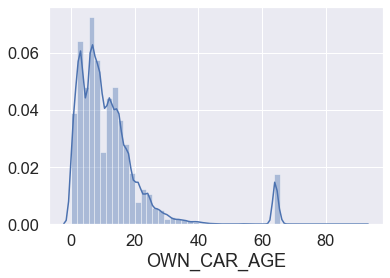

In [1492]:
sns.distplot(application_df['OWN_CAR_AGE']);

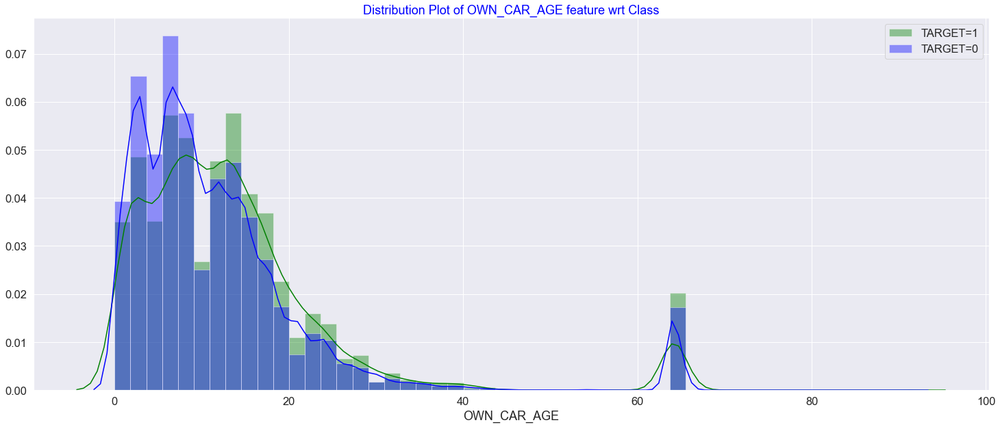

In [1493]:
subplot_histograms(application_df,['OWN_CAR_AGE'],1)

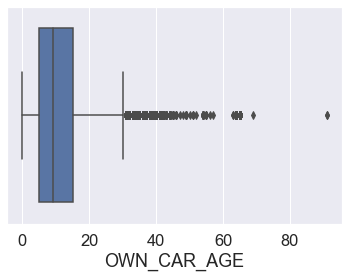

In [1494]:
#Lets check for outlier of car age
sns.boxplot(application_df['OWN_CAR_AGE']);

In [1495]:
application_df['OWN_CAR_AGE'].describe()

count    104582.000000
mean     12.061091    
std      11.944812    
min      0.000000     
25%      5.000000     
50%      9.000000     
75%      15.000000    
max      91.000000    
Name: OWN_CAR_AGE, dtype: float64

### Obseravtions
- 5 obseravtions have car flag as Y but car age information is null.
- As we can see from boxplot, there are many outliers with car age. Maximum value of car age is 91(may be vintage car) so with these outliers its better to impute value of car age with median i.e. 9
- This is because mostly the cars will be of this age (median as 9)
- Also from above, there are 202924 observations where car age is null and car ownership flag is N. This means because the person does not own car so no age is available for such observations. We can leave these values as it is
- <font color=blue>We will impute the missing value of car age of 5 obseravtions with median value and all other missing value with value 0</font>

In [1496]:
print('Total no. of null values before data imputation: {0}'.format(application_df['OWN_CAR_AGE'].isnull().sum()))
application_df['OWN_CAR_AGE'] = np.where((application_df['FLAG_OWN_CAR']=='Y'),
                           application_df['OWN_CAR_AGE'].median(), 
                           application_df['OWN_CAR_AGE'])
application_df['OWN_CAR_AGE'].fillna(0,inplace=True)
print('Total no. of null values after data imputation: {0}'.format(application_df['OWN_CAR_AGE'].isnull().sum()))

Total no. of null values before data imputation: 202929
Total no. of null values after data imputation: 0


### Data Imputation for EXT_SOURCE_1

In [1497]:
application_df['EXT_SOURCE_1'].isnull().sum()

173378

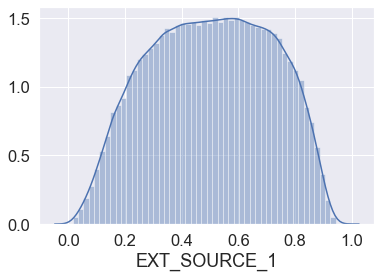

In [1498]:
sns.distplot(application_df['EXT_SOURCE_1']);

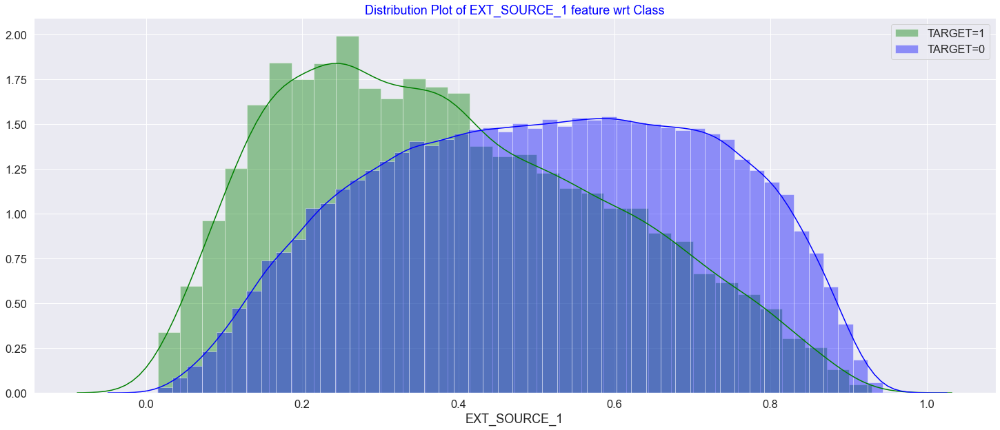

In [1499]:
subplot_histograms(application_df,['EXT_SOURCE_1'],1)

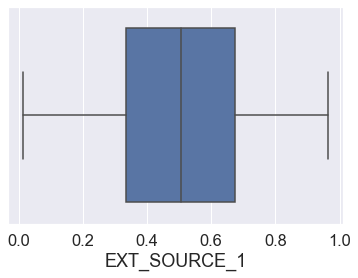

In [1500]:
sns.boxplot(application_df['EXT_SOURCE_1']);

In [1501]:
application_df['EXT_SOURCE_1'].describe()

count    134133.000000
mean     0.502130     
std      0.211062     
min      0.014568     
25%      0.334007     
50%      0.505998     
75%      0.675053     
max      0.962693     
Name: EXT_SOURCE_1, dtype: float64

### Observation
- The data is fairly distributed with mean and median around 0.5
- We will replace the missing value with median

In [1502]:
print('Total no. of null values before data imputation: {0}'.
      format(application_df['EXT_SOURCE_1'].isnull().sum()))
application_df['EXT_SOURCE_1'].fillna(application_df['EXT_SOURCE_1'].median(),inplace=True)
print('Total no. of null values after data imputation: {0}'.
      format(application_df['EXT_SOURCE_1'].isnull().sum()))

Total no. of null values before data imputation: 173378
Total no. of null values after data imputation: 0


In [1503]:
application_df['EXT_SOURCE_1'].describe()

count    307511.000000
mean     0.504311     
std      0.139408     
min      0.014568     
25%      0.505998     
50%      0.505998     
75%      0.505998     
max      0.962693     
Name: EXT_SOURCE_1, dtype: float64

### Data Imputation for EXT_SOURCE_2

In [1504]:
application_df['EXT_SOURCE_2'].isnull().sum()

660

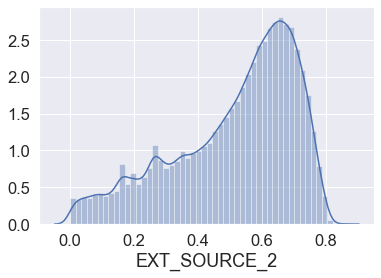

In [1505]:
sns.distplot(application_df['EXT_SOURCE_2']);

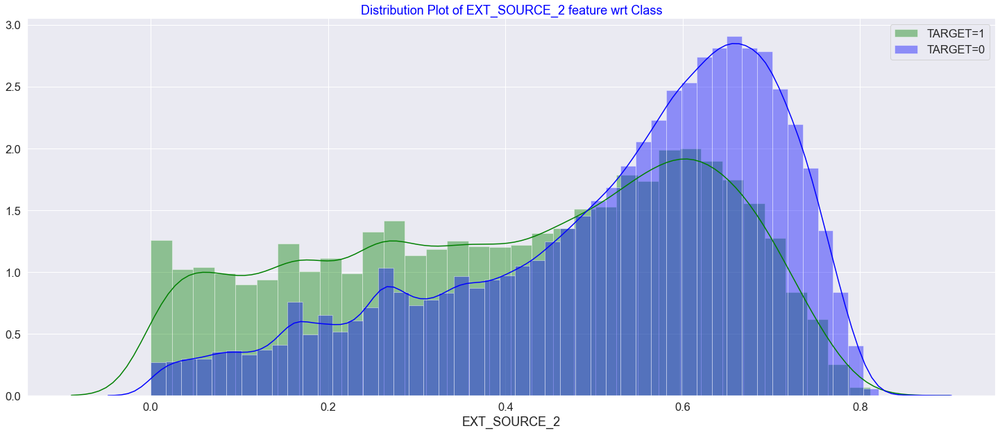

In [1506]:
subplot_histograms(application_df,['EXT_SOURCE_2'],1)

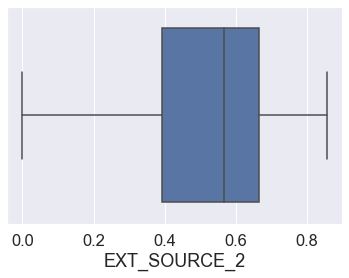

In [1507]:
sns.boxplot(application_df['EXT_SOURCE_2']);

In [1508]:
round(application_df['EXT_SOURCE_2'].describe(),5)

count    306851.00000
mean     0.51439     
std      0.19106     
min      0.00000     
25%      0.39246     
50%      0.56596     
75%      0.66362     
max      0.85500     
Name: EXT_SOURCE_2, dtype: float64

### Observation
- Data is left skewed
- We will replace the missing value with median due to skewness

In [1509]:
print('Total no. of null values before data imputation: {0}'.
      format(application_df['EXT_SOURCE_2'].isnull().sum()))
application_df['EXT_SOURCE_2'].fillna(application_df['EXT_SOURCE_2'].median(),inplace=True)
print('Total no. of null values after data imputation: {0}'.
      format(application_df['EXT_SOURCE_2'].isnull().sum()))

Total no. of null values before data imputation: 660
Total no. of null values after data imputation: 0


In [1510]:
round(application_df['EXT_SOURCE_2'].describe(),5)

count    307511.00000
mean     0.51450     
std      0.19087     
min      0.00000     
25%      0.39297     
50%      0.56596     
75%      0.66342     
max      0.85500     
Name: EXT_SOURCE_2, dtype: float64

### Data Imputation for EXT_SOURCE_3

In [1511]:
application_df['EXT_SOURCE_3'].isnull().sum()

60965

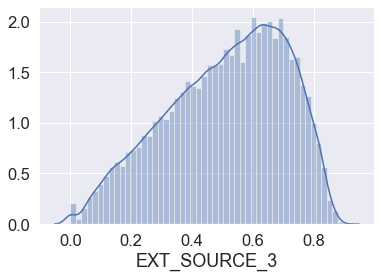

In [1512]:
sns.distplot(application_df['EXT_SOURCE_3']);

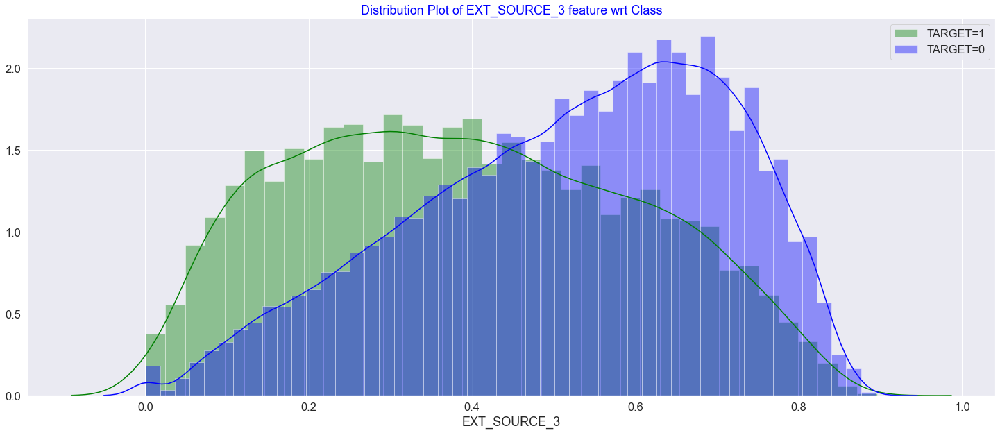

In [1513]:
subplot_histograms(application_df,['EXT_SOURCE_3'],1)

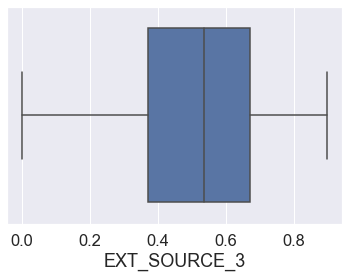

In [1514]:
sns.boxplot(application_df['EXT_SOURCE_3']);

In [1515]:
application_df['EXT_SOURCE_3'].describe()

count    246546.000000
mean     0.510853     
std      0.194844     
min      0.000527     
25%      0.370650     
50%      0.535276     
75%      0.669057     
max      0.896010     
Name: EXT_SOURCE_3, dtype: float64

### Observation
- Data is left skewed
- We will replace the missing value with median

In [1516]:
print('Total no. of null values before data imputation: {0}'.
      format(application_df['EXT_SOURCE_3'].isnull().sum()))
application_df['EXT_SOURCE_3'].fillna(application_df['EXT_SOURCE_3'].median(),inplace=True)
print('Total no. of null values after data imputation: {0}'.
      format(application_df['EXT_SOURCE_3'].isnull().sum()))

Total no. of null values before data imputation: 60965
Total no. of null values after data imputation: 0


In [1517]:
application_df['EXT_SOURCE_3'].describe()

count    307511.000000
mean     0.515695     
std      0.174736     
min      0.000527     
25%      0.417100     
50%      0.535276     
75%      0.636376     
max      0.896010     
Name: EXT_SOURCE_3, dtype: float64

### Observations
- The Target class is highly imbalanced with
- 91.93% of observations as "0" - labeled as repayers
- 8.07% of observations as "1" - labeled defaulters
- We need to handle data imbalance during data modeling

## Lets explore the categorical columns

### As we know there are 16 categorcial columns. 
We will check the unqiue values in these coluimns. We will then try to encode these columns using LabelEncoder

In [1518]:
application_df.select_dtypes('object').apply(pd.Series.nunique,axis=0)

NAME_CONTRACT_TYPE            2 
CODE_GENDER                   3 
FLAG_OWN_CAR                  2 
FLAG_OWN_REALTY               2 
NAME_TYPE_SUITE               7 
NAME_INCOME_TYPE              8 
NAME_EDUCATION_TYPE           5 
NAME_FAMILY_STATUS            6 
NAME_HOUSING_TYPE             6 
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START    7 
ORGANIZATION_TYPE             58
dtype: int64

#### OCCUPATION_TYPE

In [1519]:
application_df['OCCUPATION_TYPE'].value_counts()

Laborers                 55186
Sales staff              32102
Core staff               27570
Managers                 21371
Drivers                  18603
High skill tech staff    11380
Accountants              9813 
Medicine staff           8537 
Security staff           6721 
Cooking staff            5946 
Cleaning staff           4653 
Private service staff    2652 
Low-skill Laborers       2093 
Waiters/barmen staff     1348 
Secretaries              1305 
Realty agents            751  
HR staff                 563  
IT staff                 526  
Name: OCCUPATION_TYPE, dtype: int64

In [1520]:
occupation_list = list(application_df['OCCUPATION_TYPE'].value_counts().index.tolist())
occupation_list

['Laborers',
 'Sales staff',
 'Core staff',
 'Managers',
 'Drivers',
 'High skill tech staff',
 'Accountants',
 'Medicine staff',
 'Security staff',
 'Cooking staff',
 'Cleaning staff',
 'Private service staff',
 'Low-skill Laborers',
 'Waiters/barmen staff',
 'Secretaries',
 'Realty agents',
 'HR staff',
 'IT staff']

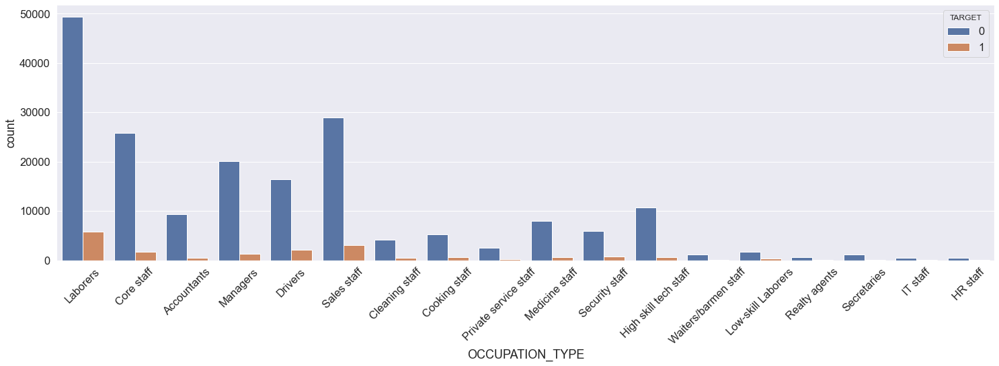

In [1521]:
plt.figure(figsize=(25,7))
chart = (sns.countplot(x='OCCUPATION_TYPE',data=application_df,hue='TARGET'))
chart.set_xticklabels(chart.get_xticklabels(), rotation=45);

### Obseravtions
- Values
 'Medicine staff',
 'Security staff',
 'Cooking staff',
 'Cleaning staff',
 'Private service staff',
 'Low-skill Laborers',
 'Waiters/barmen staff',
 'Secretaries',
 'Realty agents',
 'HR staff',
 'IT staff'
 have less count in comparison to other category values. We will create new catgeory value called 'Others' and will merge these values into new category value. There will be some information loss but it will help in label encoding during modeling
- Map 'Medicine staff',
 'Security staff',
 'Cooking staff',
 'Cleaning staff',
 'Private service staff',
 'Low-skill Laborers',
 'Waiters/barmen staff',
 'Secretaries',
 'Realty agents',
 'HR staff',
 'IT staff'
 with new value 'Others'

In [1522]:
application_df['OCCUPATION_TYPE'] = application_df['OCCUPATION_TYPE'].replace(['Medicine staff',
 'Security staff',
 'Cooking staff',
 'Cleaning staff',
 'Private service staff',
 'Low-skill Laborers',
 'Waiters/barmen staff',
 'Secretaries',
 'Realty agents',
 'HR staff',
 'IT staff'],'Others')
application_df['OCCUPATION_TYPE'].value_counts()

Laborers                 55186
Others                   35095
Sales staff              32102
Core staff               27570
Managers                 21371
Drivers                  18603
High skill tech staff    11380
Accountants              9813 
Name: OCCUPATION_TYPE, dtype: int64

In [1523]:
application_df['OCCUPATION_TYPE'].isnull().sum()

96391

<font color=blue>Replace null values in OCCUPATION_TYPE with new value 'Others'</font>

In [1524]:
application_df['OCCUPATION_TYPE'].fillna('Others',inplace=True)
application_df['OCCUPATION_TYPE'].isnull().sum()

0

#### ORGANIZATION_TYPE

In [1525]:
application_df['ORGANIZATION_TYPE'].isnull().sum()

0

<font color=blue>For Organization Type column, since there are no missing values, we will encode using LabelEncoder later in pipeline</font>

### Missing values less than 15%

In [1526]:
missing_data_cols_list = list(missing_df[(missing_df['missing_percentage']>0) &
                                         (missing_df['missing_percentage']<=15)]['column_name'])
missing_data_cols_list

['AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'NAME_TYPE_SUITE',
 'CNT_FAM_MEMBERS',
 'EXT_SOURCE_2',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR']

In [1527]:
missing_df[(missing_df['missing_percentage']>0) &
                                         (missing_df['missing_percentage']<=15)]

,column_name,missing_percentage
AMT_ANNUITY,AMT_ANNUITY,0.003902
AMT_GOODS_PRICE,AMT_GOODS_PRICE,0.090403
NAME_TYPE_SUITE,NAME_TYPE_SUITE,0.420148
CNT_FAM_MEMBERS,CNT_FAM_MEMBERS,0.000650
EXT_SOURCE_2,EXT_SOURCE_2,0.214626
OBS_30_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,0.332021
DEF_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,0.332021
OBS_60_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,0.332021
DEF_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,0.332021
DAYS_LAST_PHONE_CHANGE,DAYS_LAST_PHONE_CHANGE,0.000325


### Plot distribution plot to check for the distribution of these numerical columns

### AMT_ANNUITY

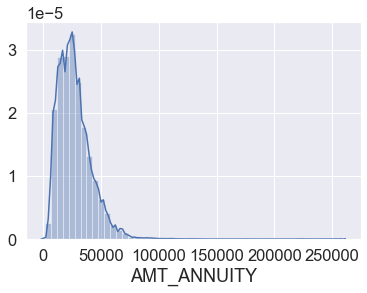

In [1528]:
sns.distplot(application_df['AMT_ANNUITY']);

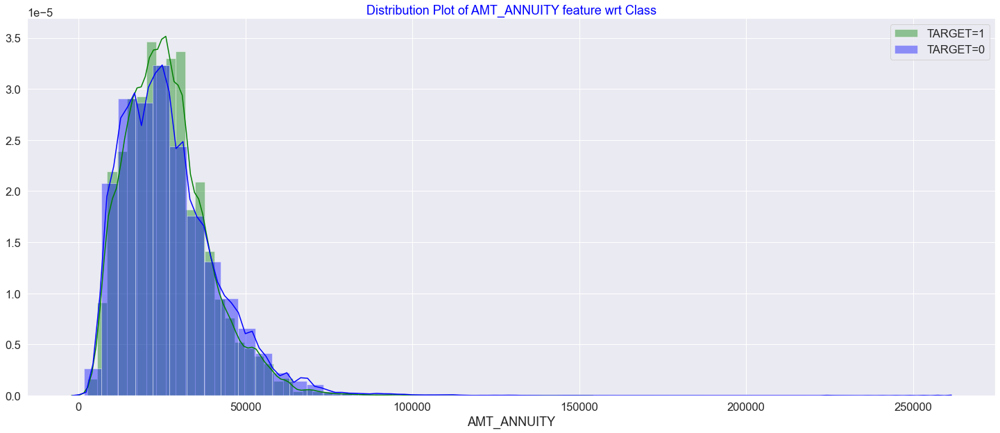

In [1529]:
subplot_histograms(application_df,['AMT_ANNUITY'],1)

In [1530]:
application_df['AMT_ANNUITY'].describe([.25, .5, .75,0.9,0.95])

count    307499.000000
mean     27108.573909 
std      14493.737315 
min      1615.500000  
25%      16524.000000 
50%      24903.000000 
75%      34596.000000 
90%      45954.000000 
95%      53325.000000 
max      258025.500000
Name: AMT_ANNUITY, dtype: float64

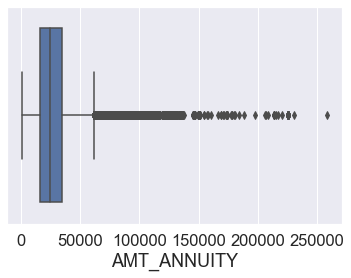

In [1531]:
sns.boxplot(application_df['AMT_ANNUITY'])

In [1532]:
application_df['AMT_ANNUITY'].isnull().sum()

12

### Observation
- majority of distribution is between 10000-55000
- data is right skewed. There are many outliers with max value of 258025
- we will replace null values with median value instead of mean because of the presence of outliers

In [1533]:
application_df['AMT_ANNUITY'].fillna(application_df['AMT_ANNUITY'].median(),inplace=True)
application_df['AMT_ANNUITY'].isnull().sum()

0

### AMT_GOODS_PRICE

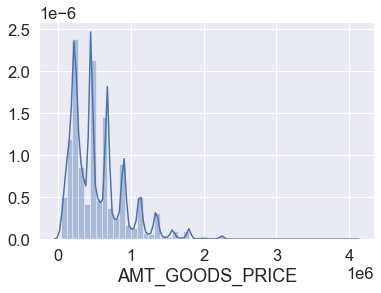

In [1534]:
sns.distplot(application_df['AMT_GOODS_PRICE']);

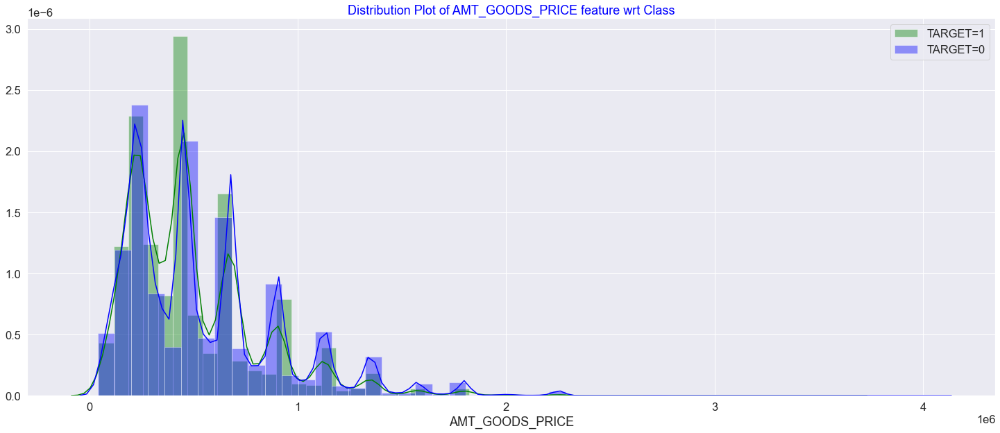

In [1535]:
subplot_histograms(application_df,['AMT_GOODS_PRICE'],1)

In [1536]:
application_df['AMT_GOODS_PRICE'].describe([.25, .5, .75,0.9,0.95])

count    3.072330e+05
mean     5.383962e+05
std      3.694465e+05
min      4.050000e+04
25%      2.385000e+05
50%      4.500000e+05
75%      6.795000e+05
90%      1.093500e+06
95%      1.305000e+06
max      4.050000e+06
Name: AMT_GOODS_PRICE, dtype: float64

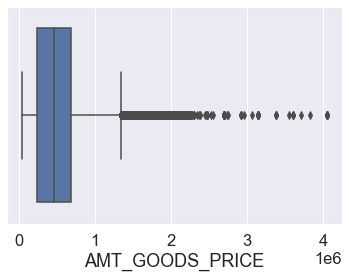

In [1537]:
sns.boxplot(application_df['AMT_GOODS_PRICE'])

In [1538]:
application_df['AMT_GOODS_PRICE'].isnull().sum()

278

### Observation
- majority of distribution is between 0.2 and 0.5. Also there are many peaks
- data is right skewed. There are many outliers
- we will replace null values with median value instead of mean because of the presence of outliers

In [1539]:
print('Total no. of null values before data imputation: {0}'.
      format(application_df['AMT_GOODS_PRICE'].isnull().sum()))
application_df['AMT_GOODS_PRICE'].fillna(application_df['AMT_GOODS_PRICE'].median(),inplace=True)
print('Total no. of null values after data imputation: {0}'.
      format(application_df['AMT_GOODS_PRICE'].isnull().sum()))

Total no. of null values before data imputation: 278
Total no. of null values after data imputation: 0


### NAME_TYPE_SUITE

In [1540]:
application_df['NAME_TYPE_SUITE'].value_counts()

Unaccompanied      248526
Family             40149 
Spouse, partner    11370 
Children           3267  
Other_B            1770  
Other_A            866   
Group of people    271   
Name: NAME_TYPE_SUITE, dtype: int64

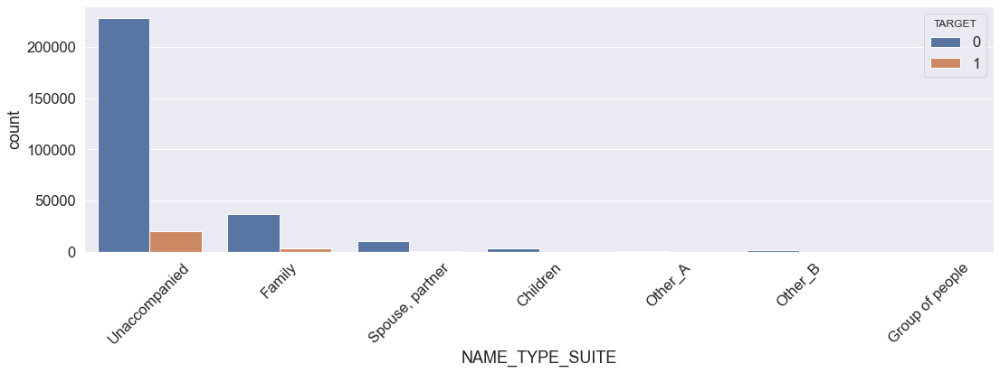

In [1541]:
plt.figure(figsize=(18,5))
chart = (sns.countplot(x='NAME_TYPE_SUITE',data=application_df,hue='TARGET'))
chart.set_xticklabels(chart.get_xticklabels(), rotation=45);

In [1542]:
application_df['NAME_TYPE_SUITE'].describe()

count     306219       
unique    7            
top       Unaccompanied
freq      248526       
Name: NAME_TYPE_SUITE, dtype: object

In [1543]:
application_df['NAME_TYPE_SUITE'].isnull().sum()

1292

In [1544]:
application_df['NAME_TYPE_SUITE'].mode()

0    Unaccompanied
dtype: object

### Observation
- we will replace null values with value 'Unaccompanied' which is majority

In [1545]:
print('Total no. of null values before data imputation: {0}'.
      format(application_df['NAME_TYPE_SUITE'].isnull().sum()))
application_df['NAME_TYPE_SUITE'].fillna('Unaccompanied',inplace=True)
print('Total no. of null values after data imputation: {0}'.
      format(application_df['NAME_TYPE_SUITE'].isnull().sum()))

Total no. of null values before data imputation: 1292
Total no. of null values after data imputation: 0


### CNT_FAM_MEMBERS

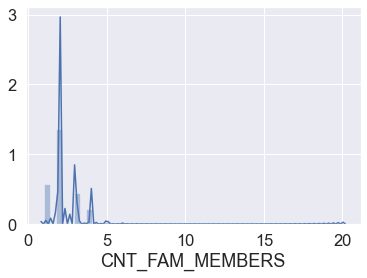

In [1546]:
sns.distplot(application_df['CNT_FAM_MEMBERS']);

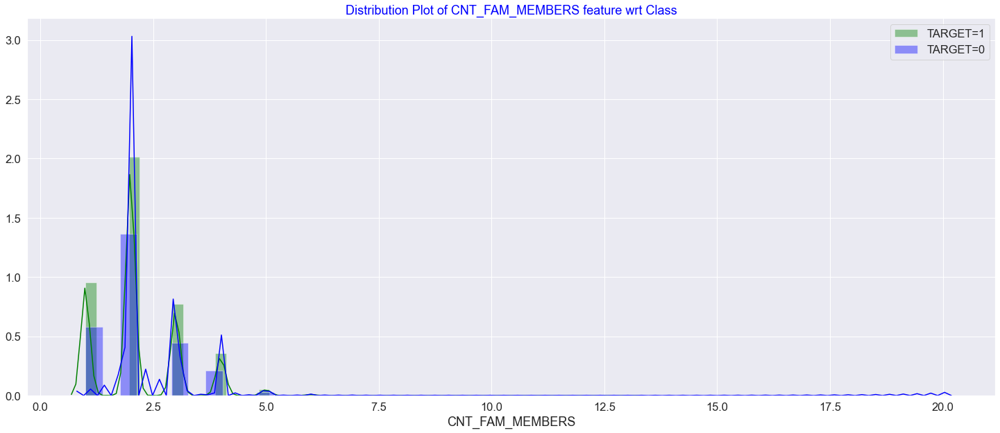

In [1547]:
subplot_histograms(application_df,['CNT_FAM_MEMBERS'],1)

In [1548]:
application_df['CNT_FAM_MEMBERS'].describe([.25, .5, .75,0.9,0.95])

count    307509.000000
mean     2.152665     
std      0.910682     
min      1.000000     
25%      2.000000     
50%      2.000000     
75%      3.000000     
90%      3.000000     
95%      4.000000     
max      20.000000    
Name: CNT_FAM_MEMBERS, dtype: float64

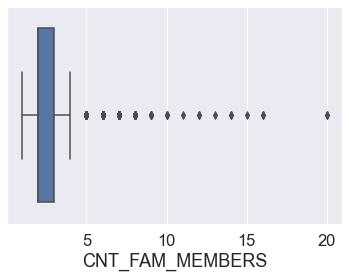

In [1549]:
sns.boxplot(application_df['CNT_FAM_MEMBERS'])

In [1550]:
application_df['CNT_FAM_MEMBERS'].isnull().sum()

2

### Observation
- majority of distribution is between 2-3
- data is highly right skewed with many peaks in between. There are few outliers in 95th percentile
- we will replace null values with median value instead of mean because of the presence of outliers

In [1551]:
print('Total no. of null values before data imputation: {0}'.format(application_df['CNT_FAM_MEMBERS'].isnull().sum()))
application_df['CNT_FAM_MEMBERS'].fillna(application_df['CNT_FAM_MEMBERS'].median(),inplace=True)
print('Total no. of null values after data imputation: {0}'.format(application_df['CNT_FAM_MEMBERS'].isnull().sum()))

Total no. of null values before data imputation: 2
Total no. of null values after data imputation: 0


### AMT_REQ_CREDIT_BUREAU_HOUR

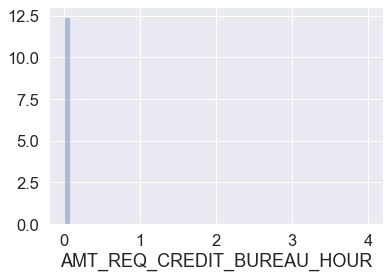

In [1552]:
sns.distplot(application_df['AMT_REQ_CREDIT_BUREAU_HOUR']);

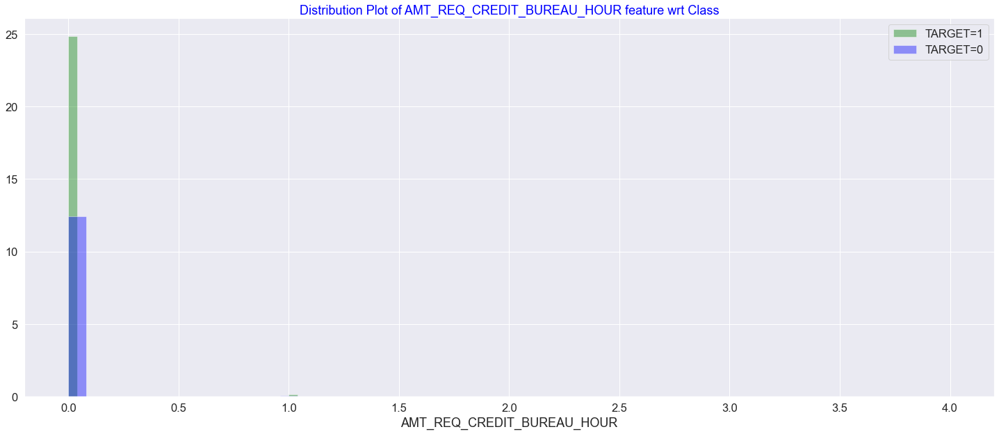

In [1553]:
subplot_histograms(application_df,['AMT_REQ_CREDIT_BUREAU_HOUR'],1)

In [1554]:
application_df['AMT_REQ_CREDIT_BUREAU_HOUR'].describe([.25, .5, .75,0.9,0.95])

count    265992.000000
mean     0.006402     
std      0.083849     
min      0.000000     
25%      0.000000     
50%      0.000000     
75%      0.000000     
90%      0.000000     
95%      0.000000     
max      4.000000     
Name: AMT_REQ_CREDIT_BUREAU_HOUR, dtype: float64

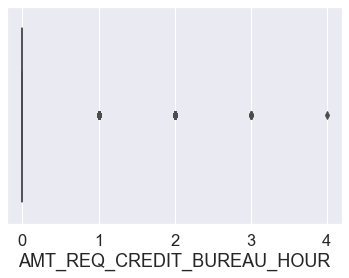

In [1555]:
sns.boxplot(application_df['AMT_REQ_CREDIT_BUREAU_HOUR'])

In [1556]:
application_df['AMT_REQ_CREDIT_BUREAU_HOUR'].isnull().sum()

41519

### Observation
- majority of distribution is between 0-0.2
- we will replace null values with median value instead of mean because of the presence of outliers

In [1557]:
print('Total no. of null values before data imputation: {0}'.format(application_df['AMT_REQ_CREDIT_BUREAU_HOUR'].isnull().sum()))
application_df['AMT_REQ_CREDIT_BUREAU_HOUR'].fillna(application_df['AMT_REQ_CREDIT_BUREAU_HOUR'].median(),inplace=True)
print('Total no. of null values after data imputation: {0}'.format(application_df['AMT_REQ_CREDIT_BUREAU_HOUR'].isnull().sum()))

Total no. of null values before data imputation: 41519
Total no. of null values after data imputation: 0


### AMT_REQ_CREDIT_BUREAU_DAY

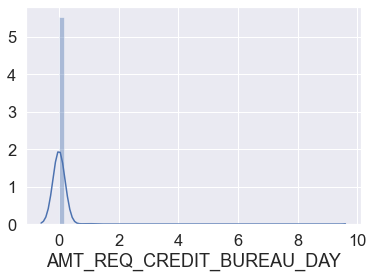

In [1558]:
sns.distplot(application_df['AMT_REQ_CREDIT_BUREAU_DAY'],kde_kws={"bw":0.2});

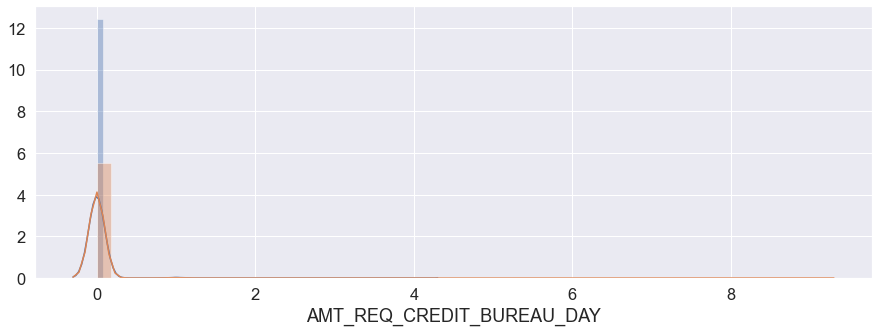

In [1559]:
plt.figure(figsize=(15,5))
sns.distplot(application_df[application_df['TARGET']==1]['AMT_REQ_CREDIT_BUREAU_DAY'],label='TARGET = 1',kde_kws={"bw":0.1});
sns.distplot(application_df[application_df['TARGET']==0]['AMT_REQ_CREDIT_BUREAU_DAY'],label='TARGET = 0',kde_kws={"bw":0.1});

In [1560]:
application_df['AMT_REQ_CREDIT_BUREAU_DAY'].describe([.25, .5, .75,0.9,0.95])

count    265992.000000
mean     0.007000     
std      0.110757     
min      0.000000     
25%      0.000000     
50%      0.000000     
75%      0.000000     
90%      0.000000     
95%      0.000000     
max      9.000000     
Name: AMT_REQ_CREDIT_BUREAU_DAY, dtype: float64

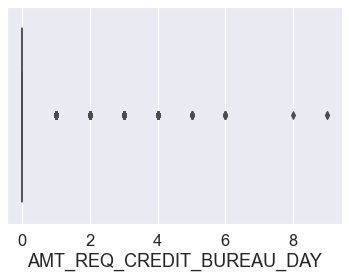

In [1561]:
sns.boxplot(application_df['AMT_REQ_CREDIT_BUREAU_DAY'])

In [1562]:
application_df['AMT_REQ_CREDIT_BUREAU_DAY'].isnull().sum()

41519

### Observation
- majority of distribution is between 0-0.1. The data is right skewed indicating presence of outliers
- we will replace null values with median value instead of mean because of the presence of outliers

In [1563]:
print('Total no. of null values before data imputation: {0}'.format(application_df['AMT_REQ_CREDIT_BUREAU_DAY'].isnull().sum()))
application_df['AMT_REQ_CREDIT_BUREAU_DAY'].fillna(application_df['AMT_REQ_CREDIT_BUREAU_DAY'].median(),inplace=True)
print('Total no. of null values after data imputation: {0}'.format(application_df['AMT_REQ_CREDIT_BUREAU_DAY'].isnull().sum()))

Total no. of null values before data imputation: 41519
Total no. of null values after data imputation: 0


### AMT_REQ_CREDIT_BUREAU_WEEK

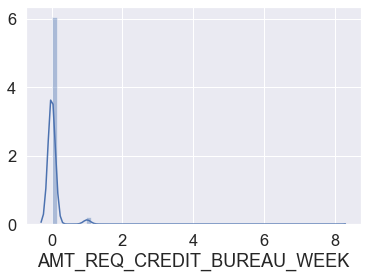

In [1564]:
sns.distplot(application_df['AMT_REQ_CREDIT_BUREAU_WEEK'],kde_kws={"bw":0.1});

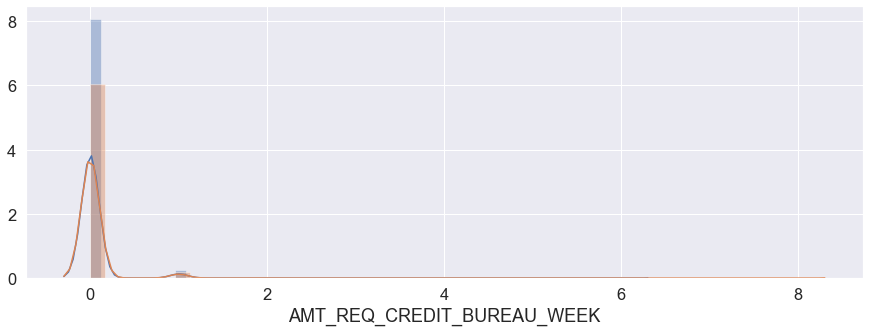

In [1565]:
plt.figure(figsize=(15,5))
sns.distplot(application_df[application_df['TARGET']==1]['AMT_REQ_CREDIT_BUREAU_WEEK'],label='TARGET = 1',kde_kws={"bw":0.1});
sns.distplot(application_df[application_df['TARGET']==0]['AMT_REQ_CREDIT_BUREAU_WEEK'],label='TARGET = 0',kde_kws={"bw":0.1});

In [1566]:
application_df['AMT_REQ_CREDIT_BUREAU_WEEK'].describe([.25, .5, .75,0.9,0.95])

count    265992.000000
mean     0.034362     
std      0.204685     
min      0.000000     
25%      0.000000     
50%      0.000000     
75%      0.000000     
90%      0.000000     
95%      0.000000     
max      8.000000     
Name: AMT_REQ_CREDIT_BUREAU_WEEK, dtype: float64

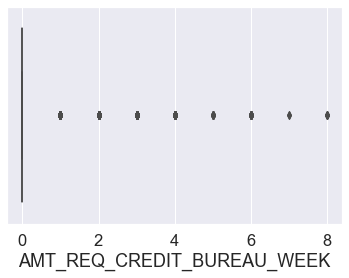

In [1567]:
sns.boxplot(application_df['AMT_REQ_CREDIT_BUREAU_WEEK'])

In [1568]:
application_df['AMT_REQ_CREDIT_BUREAU_WEEK'].isnull().sum()

41519

### Observation
- majority of distribution is between 0-0.1. The data is right skewed with presence of outlier
- we will replace null values with median value instead of mean because of the presence of outliers

In [1569]:
print('Total no. of null values before data imputation: {0}'.format(application_df['AMT_REQ_CREDIT_BUREAU_WEEK'].isnull().sum()))
application_df['AMT_REQ_CREDIT_BUREAU_WEEK'].fillna(application_df['AMT_REQ_CREDIT_BUREAU_WEEK'].median(),inplace=True)
print('Total no. of null values before data imputation: {0}'.format(application_df['AMT_REQ_CREDIT_BUREAU_WEEK'].isnull().sum()))

Total no. of null values before data imputation: 41519
Total no. of null values before data imputation: 0


### AMT_REQ_CREDIT_BUREAU_MON

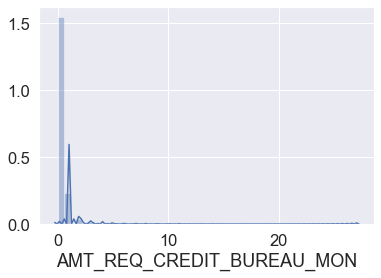

In [1570]:
sns.distplot(application_df['AMT_REQ_CREDIT_BUREAU_MON'],kde_kws={"bw":0.1});

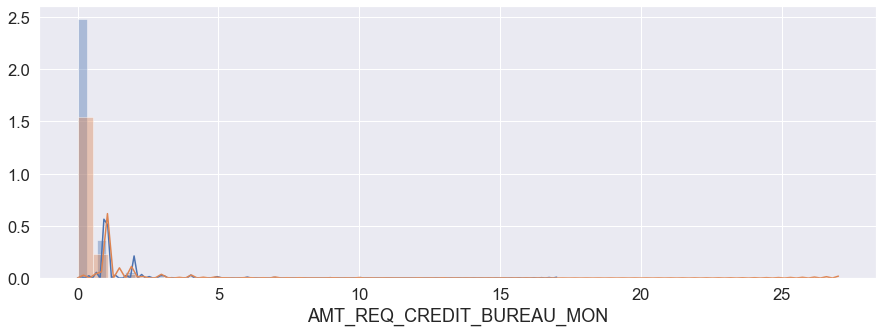

In [1571]:
plt.figure(figsize=(15,5))
sns.distplot(application_df[application_df['TARGET']==1]['AMT_REQ_CREDIT_BUREAU_MON'],label='TARGET = 1',kde_kws={"bw":0.001});
sns.distplot(application_df[application_df['TARGET']==0]['AMT_REQ_CREDIT_BUREAU_MON'],label='TARGET = 0',kde_kws={"bw":0.001});

In [1572]:
application_df['AMT_REQ_CREDIT_BUREAU_MON'].describe([.25, .5, .75,0.9,0.95])

count    265992.000000
mean     0.267395     
std      0.916002     
min      0.000000     
25%      0.000000     
50%      0.000000     
75%      0.000000     
90%      1.000000     
95%      1.000000     
max      27.000000    
Name: AMT_REQ_CREDIT_BUREAU_MON, dtype: float64

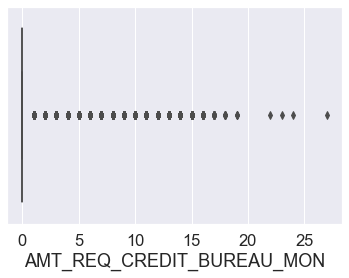

In [1573]:
sns.boxplot(application_df['AMT_REQ_CREDIT_BUREAU_MON'])

In [1574]:
application_df['AMT_REQ_CREDIT_BUREAU_MON'].isnull().sum()

41519

### Observation
- majority of distribution is between 0-0.1. The data is right skewed with outliers in 95th percentile
- we will replace null values with median value instead of mean because of the presence of outliers

In [1575]:
print('Total no. of null values before data imputation: {0}'.format(application_df['AMT_REQ_CREDIT_BUREAU_MON'].isnull().sum()))
application_df['AMT_REQ_CREDIT_BUREAU_MON'].fillna(application_df['AMT_REQ_CREDIT_BUREAU_MON'].median(),inplace=True)
print('Total no. of null values after data imputation: {0}'.format(application_df['AMT_REQ_CREDIT_BUREAU_MON'].isnull().sum()))

Total no. of null values before data imputation: 41519
Total no. of null values after data imputation: 0


### AMT_REQ_CREDIT_BUREAU_QRT

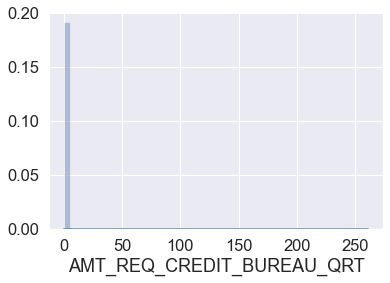

In [1576]:
sns.distplot(application_df['AMT_REQ_CREDIT_BUREAU_QRT'],kde_kws={"bw":0.01});

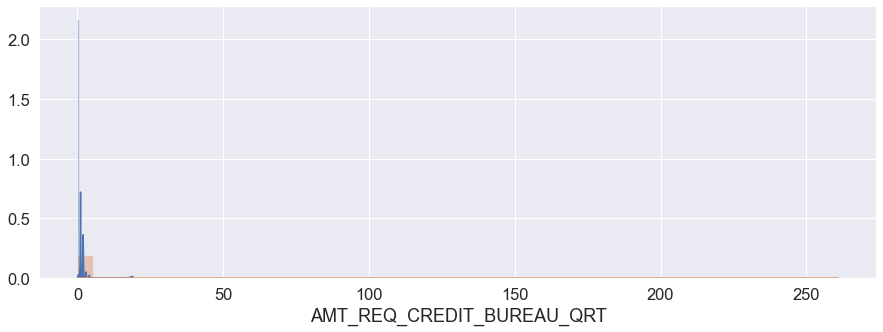

In [1577]:
plt.figure(figsize=(15,5))
sns.distplot(application_df[application_df['TARGET']==1]['AMT_REQ_CREDIT_BUREAU_QRT'],label='TARGET = 1',kde_kws={"bw":0.00001});
sns.distplot(application_df[application_df['TARGET']==0]['AMT_REQ_CREDIT_BUREAU_QRT'],label='TARGET = 0',kde_kws={"bw":0.00001});

In [1578]:
application_df['AMT_REQ_CREDIT_BUREAU_QRT'].describe([.25, .5, .75,0.9,0.95])

count    265992.000000
mean     0.265474     
std      0.794056     
min      0.000000     
25%      0.000000     
50%      0.000000     
75%      0.000000     
90%      1.000000     
95%      2.000000     
max      261.000000   
Name: AMT_REQ_CREDIT_BUREAU_QRT, dtype: float64

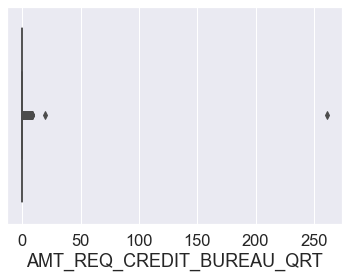

In [1579]:
sns.boxplot(application_df['AMT_REQ_CREDIT_BUREAU_QRT'])

In [1580]:
application_df['AMT_REQ_CREDIT_BUREAU_QRT'].isnull().sum()

41519

### Observation
- majority of distribution is between 0-01
- we will replace null values with median value instead of mean because of the presence of outliers

In [1581]:
print('Total no. of null values before data imputation: {0}'.format(application_df['AMT_REQ_CREDIT_BUREAU_QRT'].isnull().sum()))
application_df['AMT_REQ_CREDIT_BUREAU_QRT'].fillna(application_df['AMT_REQ_CREDIT_BUREAU_QRT'].median(),inplace=True)
print('Total no. of null values after data imputation: {0}'.format(application_df['AMT_REQ_CREDIT_BUREAU_QRT'].isnull().sum()))

Total no. of null values before data imputation: 41519
Total no. of null values after data imputation: 0


### AMT_REQ_CREDIT_BUREAU_YEAR

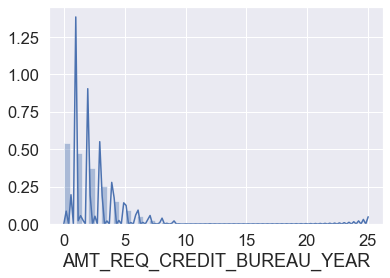

In [1582]:
sns.distplot(application_df['AMT_REQ_CREDIT_BUREAU_YEAR'],kde_kws={"bw":0.01});

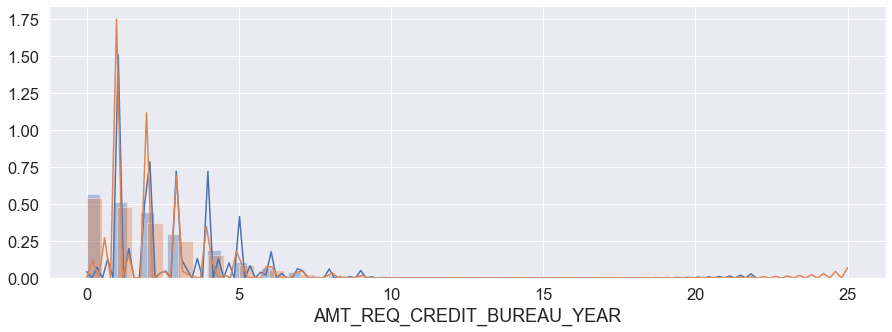

In [1583]:
plt.figure(figsize=(15,5))
sns.distplot(application_df[application_df['TARGET']==1]['AMT_REQ_CREDIT_BUREAU_YEAR'],label='TARGET = 1',kde_kws={"bw":0.00001});
sns.distplot(application_df[application_df['TARGET']==0]['AMT_REQ_CREDIT_BUREAU_YEAR'],label='TARGET = 0',kde_kws={"bw":0.00001});

In [1584]:
application_df['AMT_REQ_CREDIT_BUREAU_YEAR'].describe([.25, .5, .75,0.9,0.95])

count    265992.000000
mean     1.899974     
std      1.869295     
min      0.000000     
25%      0.000000     
50%      1.000000     
75%      3.000000     
90%      4.000000     
95%      6.000000     
max      25.000000    
Name: AMT_REQ_CREDIT_BUREAU_YEAR, dtype: float64

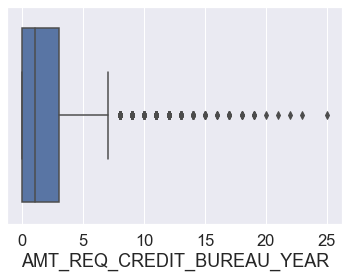

In [1585]:
sns.boxplot(application_df['AMT_REQ_CREDIT_BUREAU_YEAR'])

In [1586]:
application_df['AMT_REQ_CREDIT_BUREAU_YEAR'].isnull().sum()

41519

### Observation
- majority of distribution is between 1-3. The data is right skewed with outliers in 95th percentile
- we will replace null values with median value instead of mean because of the presence of outliers

In [1587]:
print('Total no. of null values before data imputation: {0}'.format(application_df['AMT_REQ_CREDIT_BUREAU_YEAR'].isnull().sum()))
application_df['AMT_REQ_CREDIT_BUREAU_YEAR'].fillna(application_df['AMT_REQ_CREDIT_BUREAU_YEAR'].median(),inplace=True)
print('Total no. of null values after data imputation: {0}'.format(application_df['AMT_REQ_CREDIT_BUREAU_YEAR'].isnull().sum()))

Total no. of null values before data imputation: 41519
Total no. of null values after data imputation: 0


### OBS_30_CNT_SOCIAL_CIRCLE

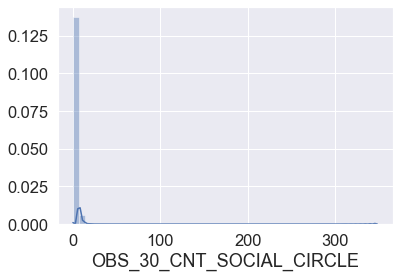

In [1588]:
sns.distplot(application_df['OBS_30_CNT_SOCIAL_CIRCLE'],kde_kws={"bw":0.01});

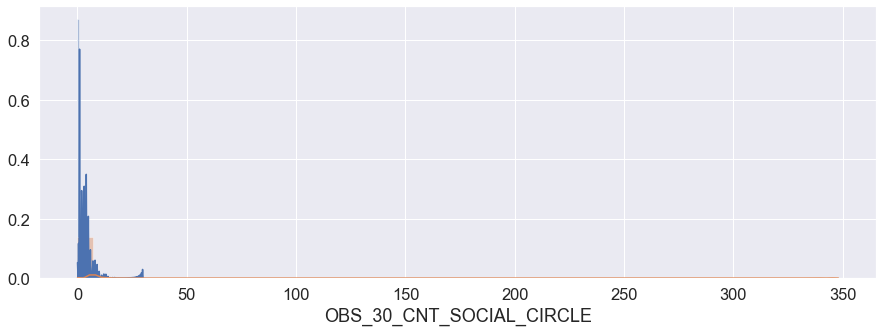

In [1589]:
plt.figure(figsize=(15,5))
sns.distplot(application_df[application_df['TARGET']==1]['OBS_30_CNT_SOCIAL_CIRCLE'],label='TARGET = 1',kde_kws={"bw":0.00001});
sns.distplot(application_df[application_df['TARGET']==0]['OBS_30_CNT_SOCIAL_CIRCLE'],label='TARGET = 0',kde_kws={"bw":0.00001});

In [1590]:
application_df['OBS_30_CNT_SOCIAL_CIRCLE'].describe([.25, .5, .75,0.9,0.95])

count    306490.000000
mean     1.422245     
std      2.400989     
min      0.000000     
25%      0.000000     
50%      0.000000     
75%      2.000000     
90%      4.000000     
95%      6.000000     
max      348.000000   
Name: OBS_30_CNT_SOCIAL_CIRCLE, dtype: float64

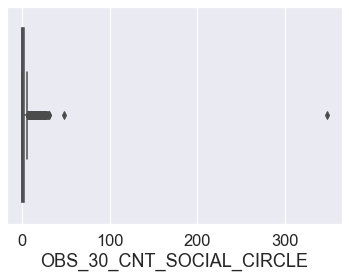

In [1591]:
sns.boxplot(application_df['OBS_30_CNT_SOCIAL_CIRCLE'])

In [1592]:
application_df['OBS_30_CNT_SOCIAL_CIRCLE'].isnull().sum()

1021

### Observation
- majority of distribution is between 0-2
- we will replace null values with median value instead of mean because of the presence of outliers

In [1593]:
print('Total no. of null values before data imputation: {0}'.format(application_df['OBS_30_CNT_SOCIAL_CIRCLE'].isnull().sum()))
application_df['OBS_30_CNT_SOCIAL_CIRCLE'].fillna(application_df['OBS_30_CNT_SOCIAL_CIRCLE'].median(),inplace=True)
print('Total no. of null values after data imputation: {0}'.format(application_df['OBS_30_CNT_SOCIAL_CIRCLE'].isnull().sum()))

Total no. of null values before data imputation: 1021
Total no. of null values after data imputation: 0


### DEF_30_CNT_SOCIAL_CIRCLE

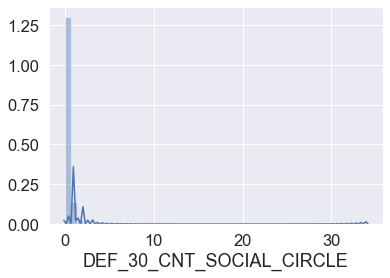

In [1594]:
sns.distplot(application_df['DEF_30_CNT_SOCIAL_CIRCLE'],kde_kws={"bw":0.05});

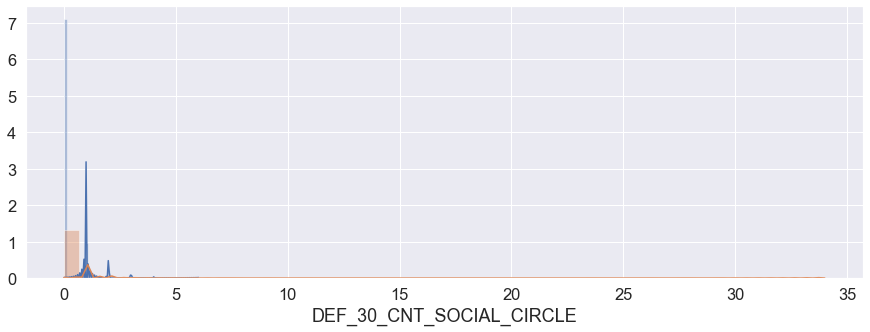

In [1595]:
plt.figure(figsize=(15,5))
sns.distplot(application_df[application_df['TARGET']==1]['DEF_30_CNT_SOCIAL_CIRCLE'],label='TARGET = 1',kde_kws={"bw":0.00005});
sns.distplot(application_df[application_df['TARGET']==0]['DEF_30_CNT_SOCIAL_CIRCLE'],label='TARGET = 0',kde_kws={"bw":0.00005});

In [1596]:
application_df['DEF_30_CNT_SOCIAL_CIRCLE'].describe([.25, .5, .75,0.9,0.95])

count    306490.000000
mean     0.143421     
std      0.446698     
min      0.000000     
25%      0.000000     
50%      0.000000     
75%      0.000000     
90%      1.000000     
95%      1.000000     
max      34.000000    
Name: DEF_30_CNT_SOCIAL_CIRCLE, dtype: float64

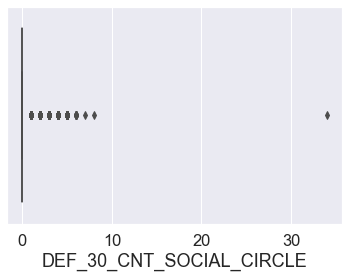

In [1597]:
sns.boxplot(application_df['DEF_30_CNT_SOCIAL_CIRCLE'])

In [1598]:
application_df['DEF_30_CNT_SOCIAL_CIRCLE'].isnull().sum()

1021

### Observation
- majority of distribution is between 0-0.1
- we will replace null values with median value instead of mean because of the presence of outliers

In [1599]:
print('Total no. of null values before data imputation: {0}'.format(application_df['DEF_30_CNT_SOCIAL_CIRCLE'].isnull().sum()))
application_df['DEF_30_CNT_SOCIAL_CIRCLE'].fillna(application_df['DEF_30_CNT_SOCIAL_CIRCLE'].median(),inplace=True)
print('Total no. of null values after data imputation: {0}'.format(application_df['DEF_30_CNT_SOCIAL_CIRCLE'].isnull().sum()))

Total no. of null values before data imputation: 1021
Total no. of null values after data imputation: 0


### OBS_60_CNT_SOCIAL_CIRCLE

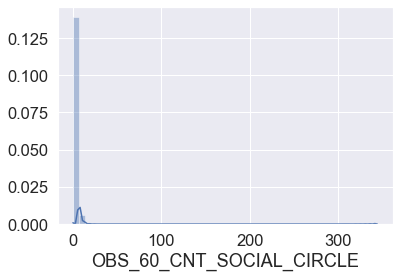

In [1600]:
sns.distplot(application_df['OBS_60_CNT_SOCIAL_CIRCLE'],kde_kws={"bw":0.001});

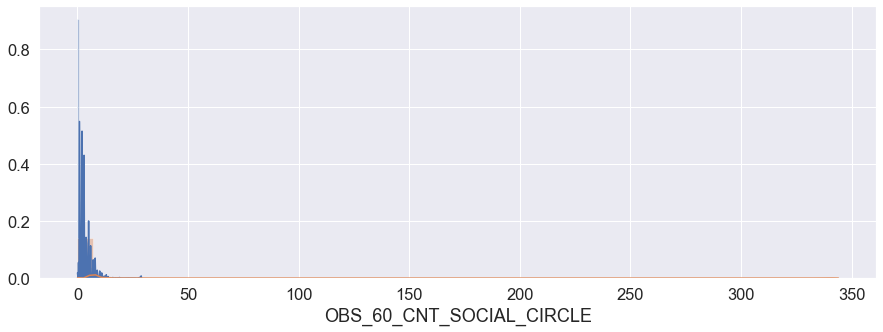

In [1601]:
plt.figure(figsize=(15,5))
sns.distplot(application_df[application_df['TARGET']==1]['OBS_60_CNT_SOCIAL_CIRCLE'],label='TARGET = 1',kde_kws={"bw":0.00005});
sns.distplot(application_df[application_df['TARGET']==0]['OBS_60_CNT_SOCIAL_CIRCLE'],label='TARGET = 0',kde_kws={"bw":0.00005});

In [1602]:
application_df['OBS_60_CNT_SOCIAL_CIRCLE'].describe([.25, .5, .75,0.9,0.95])

count    306490.000000
mean     1.405292     
std      2.379803     
min      0.000000     
25%      0.000000     
50%      0.000000     
75%      2.000000     
90%      4.000000     
95%      6.000000     
max      344.000000   
Name: OBS_60_CNT_SOCIAL_CIRCLE, dtype: float64

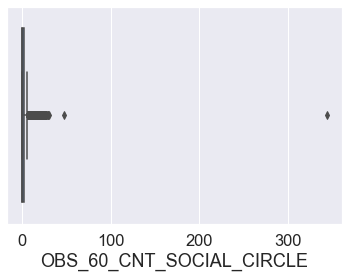

In [1603]:
sns.boxplot(application_df['OBS_60_CNT_SOCIAL_CIRCLE'])

In [1604]:
application_df['OBS_60_CNT_SOCIAL_CIRCLE'].isnull().sum()

1021

### Observation
- majority of distribution is between 0-0.1
- we will replace null values with median value instead of mean because of the presence of outliers

In [1605]:
print('Total no. of null values before data imputation: {0}'.format(application_df['OBS_60_CNT_SOCIAL_CIRCLE'].isnull().sum()))
application_df['OBS_60_CNT_SOCIAL_CIRCLE'].fillna(application_df['OBS_60_CNT_SOCIAL_CIRCLE'].median(),inplace=True)
print('Total no. of null values after data imputation: {0}'.format(application_df['OBS_60_CNT_SOCIAL_CIRCLE'].isnull().sum()))

Total no. of null values before data imputation: 1021
Total no. of null values after data imputation: 0


### DEF_60_CNT_SOCIAL_CIRCLE

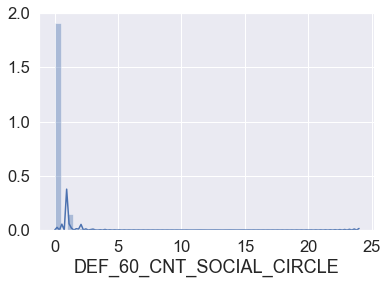

In [1606]:
sns.distplot(application_df['DEF_60_CNT_SOCIAL_CIRCLE'],kde_kws={"bw":0.001});

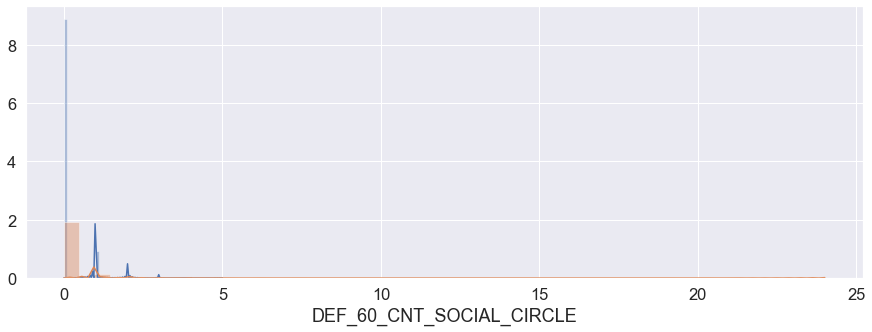

In [1607]:
plt.figure(figsize=(15,5))
sns.distplot(application_df[application_df['TARGET']==1]['DEF_60_CNT_SOCIAL_CIRCLE'],label='TARGET = 1',kde_kws={"bw":0.00005});
sns.distplot(application_df[application_df['TARGET']==0]['DEF_60_CNT_SOCIAL_CIRCLE'],label='TARGET = 0',kde_kws={"bw":0.00005});

In [1608]:
application_df['DEF_60_CNT_SOCIAL_CIRCLE'].describe([.25, .5, .75,0.9,0.95])

count    306490.000000
mean     0.100049     
std      0.362291     
min      0.000000     
25%      0.000000     
50%      0.000000     
75%      0.000000     
90%      0.000000     
95%      1.000000     
max      24.000000    
Name: DEF_60_CNT_SOCIAL_CIRCLE, dtype: float64

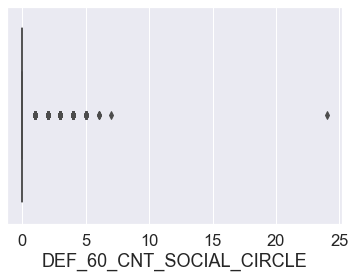

In [1609]:
sns.boxplot(application_df['DEF_60_CNT_SOCIAL_CIRCLE'])

In [1610]:
application_df['DEF_60_CNT_SOCIAL_CIRCLE'].isnull().sum()

1021

# Observation
- majority of distribution is between 0-0.1
- we will replace null values with median value instead of mean because of the presence of outliers

In [1611]:
print('Total no. of null values before data imputation: {0}'.format(application_df['DEF_60_CNT_SOCIAL_CIRCLE'].isnull().sum()))
application_df['DEF_60_CNT_SOCIAL_CIRCLE'].fillna(application_df['DEF_60_CNT_SOCIAL_CIRCLE'].median(),inplace=True)
print('Total no. of null values after data imputation: {0}'.format(application_df['DEF_60_CNT_SOCIAL_CIRCLE'].isnull().sum()))

Total no. of null values before data imputation: 1021
Total no. of null values after data imputation: 0


### DAYS_LAST_PHONE_CHANGE

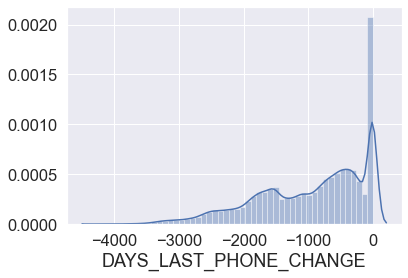

In [1612]:
sns.distplot(application_df['DAYS_LAST_PHONE_CHANGE']);

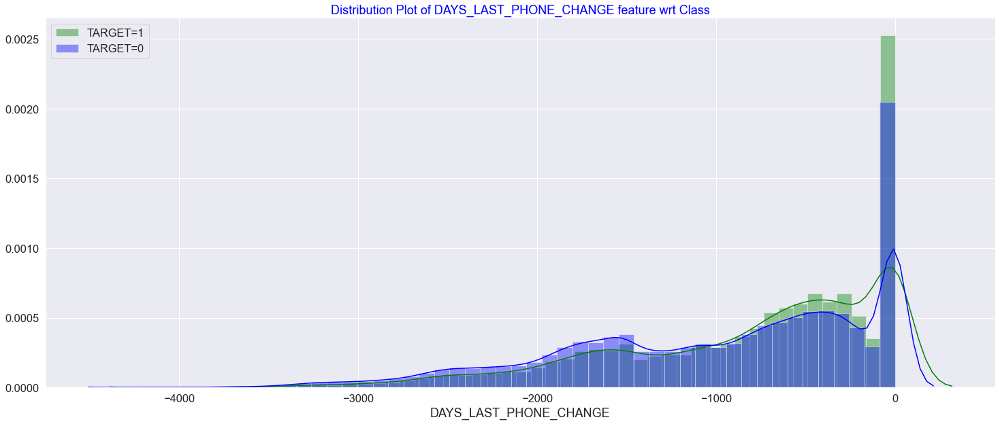

In [1613]:
subplot_histograms(application_df,['DAYS_LAST_PHONE_CHANGE'],1)

In [1614]:
application_df['DAYS_LAST_PHONE_CHANGE'].describe([.25, .5, .75,0.9,0.95])

count    307510.000000
mean    -962.858788   
std      826.808487   
min     -4292.000000  
25%     -1570.000000  
50%     -757.000000   
75%     -274.000000   
90%      0.000000     
95%      0.000000     
max      0.000000     
Name: DAYS_LAST_PHONE_CHANGE, dtype: float64

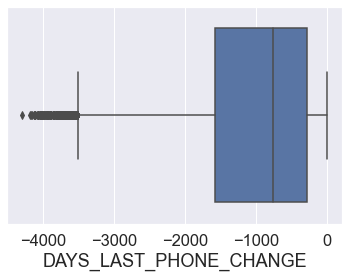

In [1615]:
sns.boxplot(application_df['DAYS_LAST_PHONE_CHANGE'])

In [1616]:
application_df['DAYS_LAST_PHONE_CHANGE'].isnull().sum()

1

### Observation
- majority of distribution is between -750 and 0. The data is left skewed with many outliers in 25th percentile
- we will replace null values with median value instead of mean because of the presence of outliers

In [1617]:
print('Total no. of null values before data imputation: {0}'.format(application_df['DAYS_LAST_PHONE_CHANGE'].isnull().sum()))
application_df['DAYS_LAST_PHONE_CHANGE'].fillna(application_df['DAYS_LAST_PHONE_CHANGE'].median(),inplace=True)
print('Total no. of null values after data imputation: {0}'.format(application_df['DAYS_LAST_PHONE_CHANGE'].isnull().sum()))

Total no. of null values before data imputation: 1
Total no. of null values after data imputation: 0


## Cross check if all the missing values have been replaced

In [1618]:
application_df.isnull().sum()

SK_ID_CURR                     0
TARGET                         0
NAME_CONTRACT_TYPE             0
CODE_GENDER                    0
FLAG_OWN_CAR                   0
FLAG_OWN_REALTY                0
CNT_CHILDREN                   0
AMT_INCOME_TOTAL               0
AMT_CREDIT                     0
AMT_ANNUITY                    0
AMT_GOODS_PRICE                0
NAME_TYPE_SUITE                0
NAME_INCOME_TYPE               0
NAME_EDUCATION_TYPE            0
NAME_FAMILY_STATUS             0
NAME_HOUSING_TYPE              0
REGION_POPULATION_RELATIVE     0
DAYS_BIRTH                     0
DAYS_EMPLOYED                  0
DAYS_REGISTRATION              0
DAYS_ID_PUBLISH                0
OWN_CAR_AGE                    0
FLAG_MOBIL                     0
FLAG_EMP_PHONE                 0
FLAG_WORK_PHONE                0
FLAG_CONT_MOBILE               0
FLAG_PHONE                     0
FLAG_EMAIL                     0
OCCUPATION_TYPE                0
CNT_FAM_MEMBERS                0
REGION_RAT

# Data Analysis

## Average amounts wrt Target(Repayer/defaulter)

In [1619]:
# find average amounts of all amount types group by target
amt_mean_df = application_df.groupby('TARGET')['AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY','AMT_GOODS_PRICE'
                              ].mean().round(2)
amt_mean_df

,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE
TARGET,,,,
0,169077.72,602648.28,27163.53,542652.48
1,165611.76,557778.53,26481.74,488939.44


In [1620]:
amt_mean_df.T.sort_values(by=0,ascending=False)

TARGET,0,1
AMT_CREDIT,602648.28,557778.53
AMT_GOODS_PRICE,542652.48,488939.44
AMT_INCOME_TOTAL,169077.72,165611.76
AMT_ANNUITY,27163.53,26481.74


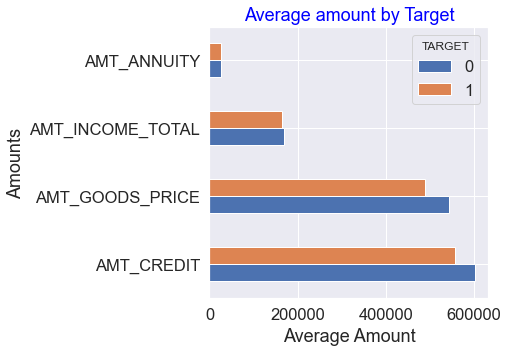

In [1621]:
amt_mean_df.T.loc[['AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY','AMT_GOODS_PRICE']
                 ].sort_values(by=0,ascending=False).plot(kind='barh',
          figsize=(5,5));
plt.title('Average amount by Target',color='blue')
plt.xlabel('Average Amount')
plt.ylabel('Amounts');

## Observations from above plot
- Target 
    - 0 - who pay regularly
    - 1 - who are loan defaulters or have difficulty in loan repayment
- Average annuity amount of people who pay regularly and who default on loan is almost same
- Average income amount of people who pay regularly and who default on loan is almost same
- Average credit amount of people who pay regularly is higher than average credit amount of loan defaulters

### CODE_GENDER

In [1622]:
application_df[['CODE_GENDER','TARGET']].groupby('TARGET')['CODE_GENDER'].value_counts()

TARGET  CODE_GENDER
0       F              188278
        M              94404 
        XNA            4     
1       F              14170 
        M              10655 
Name: CODE_GENDER, dtype: int64

In [1623]:
crosstab_df = pd.crosstab(application_df['TARGET'],
            application_df['CODE_GENDER']).apply(lambda x: round((x/x.sum())*100,2), axis=0)
crosstab_df

CODE_GENDER,F,M,XNA
TARGET,,,
0,93.0,89.86,100.0
1,7.0,10.14,0.0


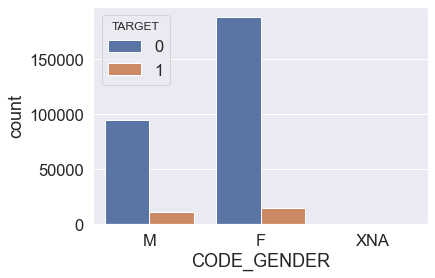

In [1624]:
sns.countplot(x='CODE_GENDER',data=application_df,hue='TARGET');

### Observations
- There are 3 types of Gender Code - Male, Female and XNA interpreted as Code not available
- Maximum number of loans is taken by Females and maximum defaulters are also females
- In comparison the percentage of repayment difficulty is more by males

### DAYS_BIRTH

In [1625]:
application_df['DAYS_BIRTH'].head()

0   -9461 
1   -16765
2   -19046
3   -19005
4   -19932
Name: DAYS_BIRTH, dtype: int64

#### Convert DAYS_BIRTH to absolute number

In [1626]:
#application_df['DAYS_BIRTH'] = abs(application_df['DAYS_BIRTH'])
application_df['DAYS_BIRTH'].head()

0   -9461 
1   -16765
2   -19046
3   -19005
4   -19932
Name: DAYS_BIRTH, dtype: int64

#### Create new column to convert DAYS_OF_BIRTH to age and then create bins of this age group to check major defaulters fall in which age group

In [1627]:
age_df = application_df[['DAYS_BIRTH','TARGET']]
age_df.head()

,DAYS_BIRTH,TARGET
0,-9461,1
1,-16765,0
2,-19046,0
3,-19005,0
4,-19932,0


In [1628]:
age_df['DAYS_BIRTH'] = abs(age_df['DAYS_BIRTH'])
age_df['YEARS_BIRTH'] = age_df['DAYS_BIRTH'] / 365
age_df['YEARS_BINNED'] = pd.cut(age_df['YEARS_BIRTH'], bins = np.linspace(20, 70, num = 11))
age_df.head(10)

,DAYS_BIRTH,TARGET,YEARS_BIRTH,YEARS_BINNED
0,9461,1,25.920548,"(25.0, 30.0]"
1,16765,0,45.931507,"(45.0, 50.0]"
2,19046,0,52.180822,"(50.0, 55.0]"
3,19005,0,52.068493,"(50.0, 55.0]"
4,19932,0,54.608219,"(50.0, 55.0]"
5,16941,0,46.413699,"(45.0, 50.0]"
6,13778,0,37.747945,"(35.0, 40.0]"
7,18850,0,51.643836,"(50.0, 55.0]"
8,20099,0,55.065753,"(55.0, 60.0]"
9,14469,0,39.641096,"(35.0, 40.0]"


In [1629]:
age_df['YEARS_BINNED'].value_counts()

(35.0, 40.0]    42868
(40.0, 45.0]    41406
(30.0, 35.0]    39440
(45.0, 50.0]    35135
(50.0, 55.0]    34942
(55.0, 60.0]    33120
(25.0, 30.0]    32862
(60.0, 65.0]    27476
(20.0, 25.0]    12159
(65.0, 70.0]    8103 
Name: YEARS_BINNED, dtype: int64

In [1630]:
crosstab_df = pd.crosstab(age_df['TARGET'],
            age_df['YEARS_BINNED']).apply(lambda x: round((x/x.sum())*100,2), axis=0)
crosstab_df

YEARS_BINNED,"(20.0, 25.0]","(25.0, 30.0]","(30.0, 35.0]","(35.0, 40.0]","(40.0, 45.0]","(45.0, 50.0]","(50.0, 55.0]","(55.0, 60.0]","(60.0, 65.0]","(65.0, 70.0]"
TARGET,,,,,,,,,,
0,87.7,88.86,89.72,91.06,92.15,92.58,93.3,94.47,94.73,96.27
1,12.3,11.14,10.28,8.94,7.85,7.42,6.7,5.53,5.27,3.73


In [1631]:
age_binned_df = age_df.groupby('YEARS_BINNED').mean()
age_binned_df

,DAYS_BIRTH,TARGET,YEARS_BIRTH
YEARS_BINNED,,,
"(20.0, 25.0]",8532.795625,0.123036,23.377522
"(25.0, 30.0]",10155.219250,0.111436,27.822518
"(30.0, 35.0]",11854.848377,0.102814,32.479037
"(35.0, 40.0]",13707.908253,0.089414,37.555913
"(40.0, 45.0]",15497.661233,0.078491,42.459346
"(45.0, 50.0]",17323.900441,0.074171,47.462741
"(50.0, 55.0]",19196.494791,0.066968,52.593136
"(55.0, 60.0]",20984.262742,0.055314,57.491131
"(60.0, 65.0]",22780.547460,0.052737,62.412459


Text(0.5, 1.0, 'Failure to Repay by Age Group')

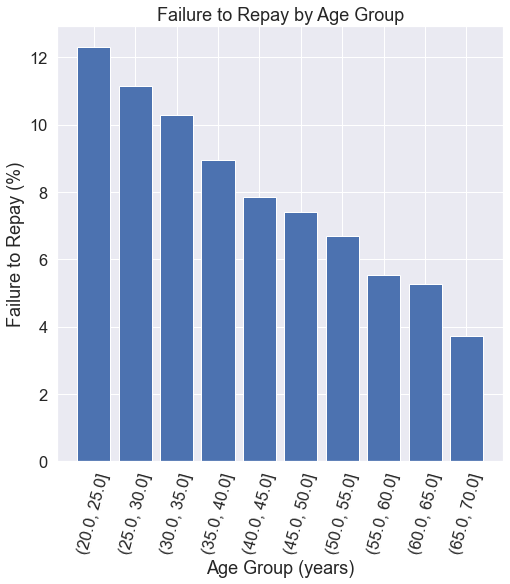

In [1632]:
plt.figure(figsize = (8,8))
plt.bar(age_binned_df.index.astype(str), 100 * age_binned_df['TARGET'])
plt.xticks(rotation = 75)
plt.xlabel('Age Group (years)')
plt.ylabel('Failure to Repay (%)')
plt.title('Failure to Repay by Age Group')

## Observation
- Majority of young people in the age group of 20-35 are defaulters. The highest defaulter falls in the age group of 20-25
- On the other hand aged people default less. Also count of aged people taking loan is less

### Lets analyse for DAYS_EOMPLOYED to see the employment of person

In [1633]:
application_df['DAYS_EMPLOYED'].isnull().sum()

0

Above cell shows that there are no observations with null values for Days of employment

In [1634]:
#check for datatype of DAYS_EMPLOYED column
application_df['DAYS_EMPLOYED'].dtype

dtype('int64')

In [1635]:
application_df['DAYS_EMPLOYED'].describe()

count    307511.000000
mean     63815.045904 
std      141275.766519
min     -17912.000000 
25%     -2760.000000  
50%     -1213.000000  
75%     -289.000000   
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

### From above cell maximum value of DAYS_EMPLOYED is 365243 while minimum value is -17912
- Its a very strange value that we have extreme positive value as well extreme negative value

### Lets plot distribution to understand more about DAYS_EMPLOYED

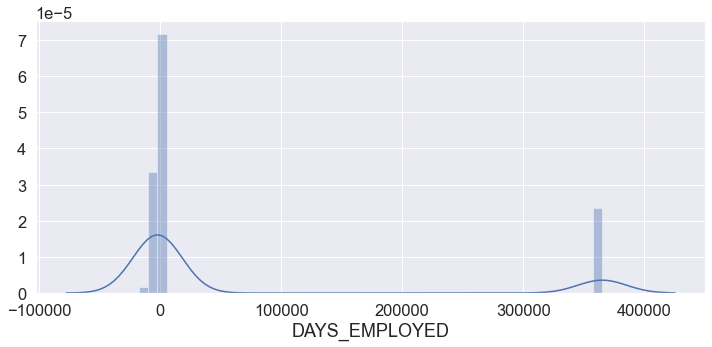

In [1636]:
plt.figure(figsize=(12,5))
sns.distplot(application_df['DAYS_EMPLOYED'],kde_kws={"bw":20000});

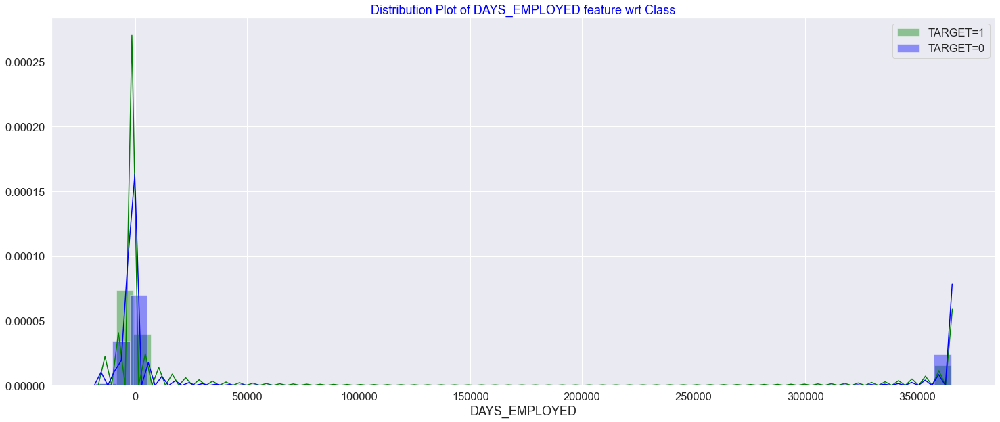

In [1637]:
subplot_histograms(application_df,['DAYS_EMPLOYED'],1)

In [1638]:
print('Number of observation with DAYS EMPLOYED less than 0: {0}'.
      format(application_df[application_df['DAYS_EMPLOYED']<0]['DAYS_EMPLOYED'].count()))
print('Number of observation with DAYS EMPLOYED equal to 0: {0}'.
      format(application_df[application_df['DAYS_EMPLOYED']==0]['DAYS_EMPLOYED'].count()))
print('Number of observation with DAYS EMPLOYED greater than 0: {0}'.
      format(application_df[application_df['DAYS_EMPLOYED']>0]['DAYS_EMPLOYED'].count()))

Number of observation with DAYS EMPLOYED less than 0: 252135
Number of observation with DAYS EMPLOYED equal to 0: 2
Number of observation with DAYS EMPLOYED greater than 0: 55374


## Observation from above plot
- Clearly there are outliers between the range of [300000,400000]
- There are two spikes that can be seen with kde bandwidth of 20000
- Maximum observations are within the range of [-100000,100000]
- With statistics
    - There are many observations(252135) where DAYS_EMPLOYED values are less than 0
    - There are few observations(2) where DAYS_EMPLOYED values are equal to 0
    - There are many observations(55374) where DAYS_EMPLOYED values are greater than 0

In [1639]:
application_df[application_df['DAYS_EMPLOYED']==365243]['TARGET'].value_counts()

0    52384
1    2990 
Name: TARGET, dtype: int64

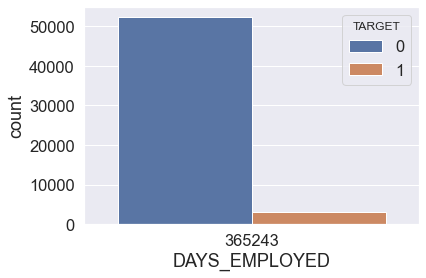

In [1640]:
sns.countplot(x='DAYS_EMPLOYED',data=application_df[application_df['DAYS_EMPLOYED']==365243],hue='TARGET');

In [1641]:
application_df[application_df['DAYS_EMPLOYED']==365243]['NAME_INCOME_TYPE'].value_counts()

Pensioner     55352
Unemployed    22   
Name: NAME_INCOME_TYPE, dtype: int64

## Observations for DAYS_EMPLOYED
- There are 55352 people who are pensioners who are not working since the DAYS_EMPLOYED 365243
    - However there are 10 people who are pensioners who are still working with DAYS_EMPLOYED<0. Perhaps these people are working on contract after retirement
- There are 22 people who are unemployed with DAYS_EMPLOYED = 365243

#### DAYS_EMPLOYED

In [1642]:
application_df['DAYS_EMPLOYED'].head()

0   -637 
1   -1188
2   -225 
3   -3039
4   -3038
Name: DAYS_EMPLOYED, dtype: int64

#### Convert DAYS_EMPLOYED to absolute number

In [1643]:
#application_df['DAYS_EMPLOYED'] = abs(application_df['DAYS_EMPLOYED'])
application_df['DAYS_EMPLOYED'].head()

0   -637 
1   -1188
2   -225 
3   -3039
4   -3038
Name: DAYS_EMPLOYED, dtype: int64

#### Create new column to convert DAYS_EMPLOYED to age and then create bins of this age group to check major defaulters fall in which age group

In [1644]:
employed_yr_df = application_df[['DAYS_EMPLOYED','TARGET']]
employed_yr_df.head()

,DAYS_EMPLOYED,TARGET
0,-637,1
1,-1188,0
2,-225,0
3,-3039,0
4,-3038,0


In [1645]:
employed_yr_df['DAYS_EMPLOYED'] = abs(employed_yr_df['DAYS_EMPLOYED'])
employed_yr_df['DAYS_EMPLOYED'].describe([0.25,0.5,0.75,0.8,0.81,0.85,0.9])

count    307511.000000
mean     67724.742149 
std      139443.751806
min      0.000000     
25%      933.000000   
50%      2219.000000  
75%      5707.000000  
80%      9188.000000  
81%      10913.100000 
85%      365243.000000
90%      365243.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

In [1646]:
employed_yr_df[employed_yr_df['DAYS_EMPLOYED']==365243].count()

DAYS_EMPLOYED    55374
TARGET           55374
dtype: int64

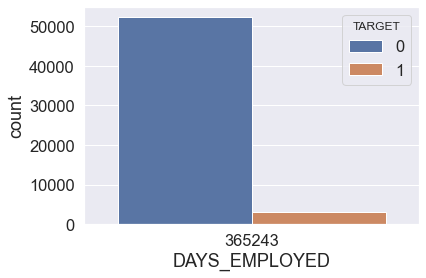

In [1647]:
sns.countplot(x='DAYS_EMPLOYED',data=employed_yr_df[employed_yr_df['DAYS_EMPLOYED']==365243],hue='TARGET');

#### replace DAYS_EMPLOYED outlier value of 365243 by 11000

In [1648]:
application_df['DAYS_EMPLOYED'].replace({365243:11000},inplace=True)
employed_yr_df['DAYS_EMPLOYED'].replace({365243:11000},inplace=True)
employed_yr_df['DAYS_EMPLOYED'].describe([0.25,0.5,0.75,0.8,0.81,0.85,0.9])

count    307511.000000
mean     3935.635802  
std      3929.817591  
min      0.000000     
25%      933.000000   
50%      2219.000000  
75%      5707.000000  
80%      9188.000000  
81%      10913.100000 
85%      11000.000000 
90%      11000.000000 
max      17912.000000 
Name: DAYS_EMPLOYED, dtype: float64

In [1649]:
employed_yr_df['YEARS_EMPLOYED'] = employed_yr_df['DAYS_EMPLOYED'] / 365
employed_yr_df['EMPLOYED_BINNED'] = pd.cut(employed_yr_df['YEARS_EMPLOYED'], bins = np.linspace(0, 40, num = 11))
employed_yr_df.head(10)

,DAYS_EMPLOYED,TARGET,YEARS_EMPLOYED,EMPLOYED_BINNED
0,637,1,1.745205,"(0.0, 4.0]"
1,1188,0,3.254795,"(0.0, 4.0]"
2,225,0,0.616438,"(0.0, 4.0]"
3,3039,0,8.326027,"(8.0, 12.0]"
4,3038,0,8.323288,"(8.0, 12.0]"
5,1588,0,4.350685,"(4.0, 8.0]"
6,3130,0,8.575342,"(8.0, 12.0]"
7,449,0,1.230137,"(0.0, 4.0]"
8,11000,0,30.136986,"(28.0, 32.0]"
9,2019,0,5.531507,"(4.0, 8.0]"


In [1650]:
employed_yr_df['EMPLOYED_BINNED'].value_counts()

(0.0, 4.0]      114553
(4.0, 8.0]      66217 
(28.0, 32.0]    57444 
(8.0, 12.0]     33664 
(12.0, 16.0]    17026 
(16.0, 20.0]    8119  
(20.0, 24.0]    5330  
(24.0, 28.0]    3045  
(32.0, 36.0]    1303  
(36.0, 40.0]    574   
Name: EMPLOYED_BINNED, dtype: int64

In [1651]:
crosstab_df = pd.crosstab(age_df['TARGET'],
            employed_yr_df['EMPLOYED_BINNED']).apply(lambda x: round((x/x.sum())*100,2), axis=0)
crosstab_df

EMPLOYED_BINNED,"(0.0, 4.0]","(4.0, 8.0]","(8.0, 12.0]","(12.0, 16.0]","(16.0, 20.0]","(20.0, 24.0]","(24.0, 28.0]","(28.0, 32.0]","(32.0, 36.0]","(36.0, 40.0]"
TARGET,,,,,,,,,,
0,89.15,91.83,93.6,94.57,95.17,95.35,95.96,94.63,96.24,98.26
1,10.85,8.17,6.4,5.43,4.83,4.65,4.04,5.37,3.76,1.74


In [1652]:
employed_binned_df = employed_yr_df.groupby('EMPLOYED_BINNED').mean()
employed_binned_df

,DAYS_EMPLOYED,TARGET,YEARS_EMPLOYED
EMPLOYED_BINNED,,,
"(0.0, 4.0]",717.329262,0.108474,1.965286
"(4.0, 8.0]",2110.642675,0.081746,5.782583
"(8.0, 12.0]",3546.866504,0.063956,9.717442
"(12.0, 16.0]",5025.508693,0.054270,13.768517
"(16.0, 20.0]",6531.400296,0.048282,17.894247
"(20.0, 24.0]",7949.472983,0.046529,21.779378
"(24.0, 28.0]",9420.021346,0.040394,25.808278
"(28.0, 32.0]",10995.702214,0.053704,30.125212
"(32.0, 36.0]",12356.511896,0.037606,33.853457


Text(0.5, 1.0, 'Failure to Repay by Employed Group')

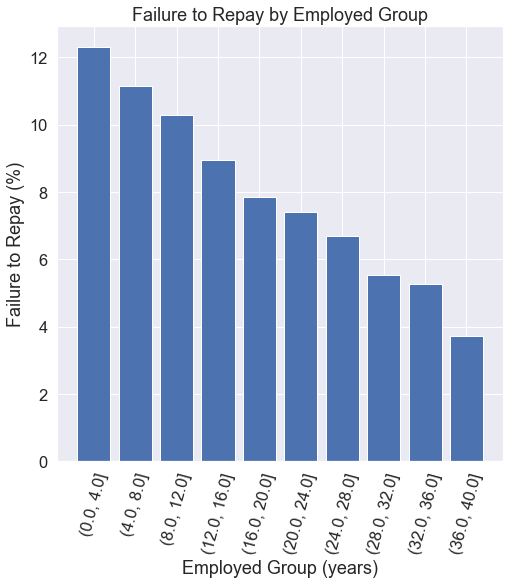

In [1653]:
plt.figure(figsize = (8,8))
plt.bar(employed_binned_df.index.astype(str), 100 * age_binned_df['TARGET'])
plt.xticks(rotation = 75)
plt.xlabel('Employed Group (years)')
plt.ylabel('Failure to Repay (%)')
plt.title('Failure to Repay by Employed Group')

## Observation
- Majority of defaulters are in the employed year group of 0-12. The highest defaulter falls in the year group of 0-4. The count of people taking loan in this group is also highest 
- On the other hand people who have been employed for long default less. Also this group of people take less loan

## Lets plot in which hours of day most of the loans were applied

In [1654]:
contract_count = application_df['WEEKDAY_APPR_PROCESS_START'].count()
application_df.groupby('WEEKDAY_APPR_PROCESS_START').apply(lambda x: x.count(0)/contract_count)['WEEKDAY_APPR_PROCESS_START'].sort_values(ascending=False)

WEEKDAY_APPR_PROCESS_START
TUESDAY      0.175282
WEDNESDAY    0.168885
MONDAY       0.164918
THURSDAY     0.164518
FRIDAY       0.163695
SATURDAY     0.110084
SUNDAY       0.052619
Name: WEEKDAY_APPR_PROCESS_START, dtype: float64

In [1655]:
## Lets groupby loan types and check different loan approval status percentage in each loan category
crosstab_df = pd.crosstab(application_df['WEEKDAY_APPR_PROCESS_START'],
            application_df['HOUR_APPR_PROCESS_START']).apply(lambda x: round((x/x.sum())*100,2), axis=0)
crosstab_df

HOUR_APPR_PROCESS_START,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
WEEKDAY_APPR_PROCESS_START,,,,,,,,,,,,,,,,,,,,,,,,
FRIDAY,25.0,16.28,15.41,19.35,17.56,16.74,16.26,16.62,16.25,16.90,15.71,15.63,15.91,16.04,16.56,16.97,17.64,16.90,16.93,16.48,15.13,12.59,16.67,17.07
MONDAY,17.5,15.12,16.39,14.39,16.65,15.81,16.48,16.36,16.42,16.12,15.42,16.12,15.98,16.13,16.68,17.29,17.57,17.83,19.26,18.30,16.81,16.05,24.67,12.20
SATURDAY,5.0,9.30,6.56,12.44,12.49,11.76,12.68,12.02,13.14,10.05,13.55,12.95,12.64,11.34,10.32,9.39,8.17,7.04,4.10,4.91,9.20,11.36,8.67,2.44
SUNDAY,12.5,3.49,3.93,5.04,5.17,5.20,5.07,5.60,5.31,4.27,6.11,6.22,6.23,5.89,5.34,4.73,3.98,2.91,2.54,4.26,7.02,11.36,10.00,19.51
THURSDAY,17.5,20.93,20.00,15.28,15.69,15.89,15.75,15.83,16.02,16.82,15.91,16.15,15.77,16.63,16.75,16.84,16.94,17.42,17.88,17.62,16.05,13.58,20.00,26.83
TUESDAY,10.0,13.95,20.00,16.50,16.65,18.61,17.20,16.84,16.71,18.08,16.84,16.93,17.30,17.36,17.34,17.65,18.08,19.18,20.44,19.05,17.98,17.28,12.00,14.63
WEDNESDAY,12.5,20.93,17.70,16.99,15.79,16.00,16.55,16.72,16.15,17.75,16.48,16.00,16.16,16.60,17.01,17.14,17.62,18.72,18.84,19.39,17.81,17.78,8.00,7.32


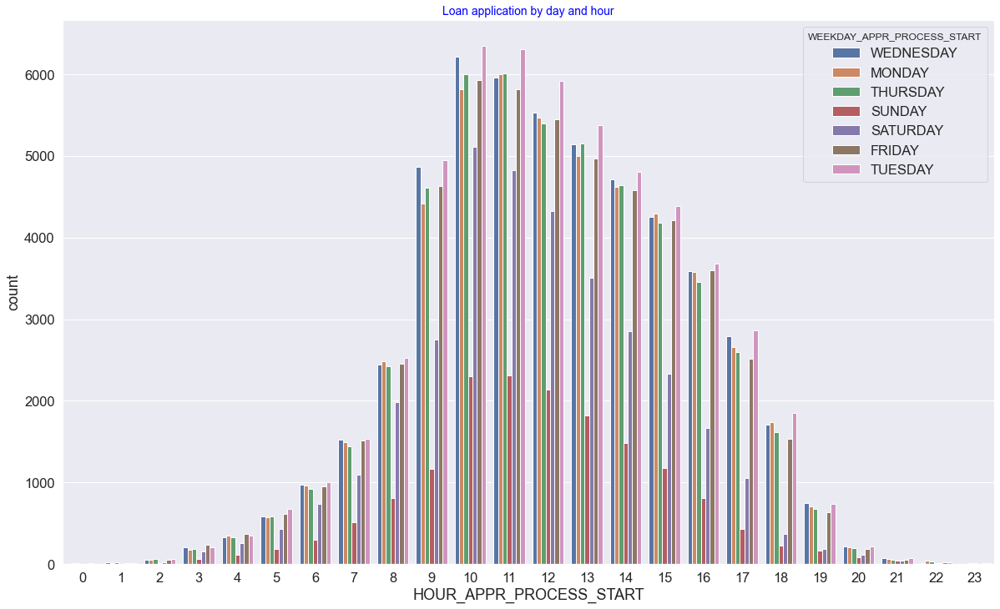

In [1656]:
plt.figure(figsize=(20,12))
plt.title('Loan application by day and hour',color='blue',fontsize=14)
sns.countplot(x='HOUR_APPR_PROCESS_START',data=application_df,hue='WEEKDAY_APPR_PROCESS_START');

## Observations from above plot
- The loans were applied mainly on Tuesday (17.53%) followed by Wednesday(16.89%)
- 9am - 2pm are peak hours for loan application

## Lets Plot Income Type and Car Ownership

In [1657]:
application_df['NAME_INCOME_TYPE'].value_counts()

Working                 158774
Commercial associate    71617 
Pensioner               55362 
State servant           21703 
Unemployed              22    
Student                 18    
Businessman             10    
Maternity leave         5     
Name: NAME_INCOME_TYPE, dtype: int64

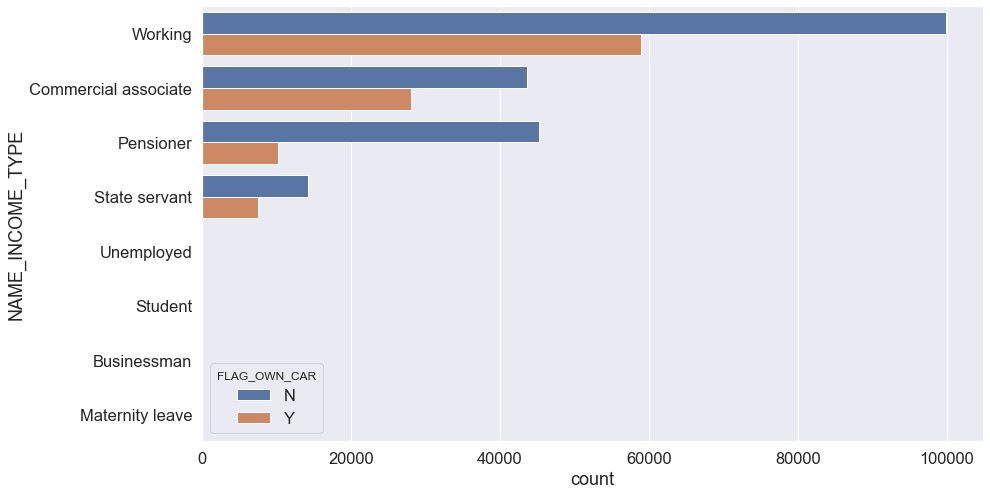

In [1658]:
plt.figure(figsize=(14,8))
sns.countplot(y='NAME_INCOME_TYPE', hue='FLAG_OWN_CAR', data=application_df,
             order = application_df['NAME_INCOME_TYPE'].value_counts().index);

## Observations from above plot
- Working Professionals mostly own car followed by Commercial associates and then pensioner

## Domain Specific Feature Engineering

In [1659]:
# EXT_SOURCE_X
application_df['APPS_EXT_SOURCE_MEAN'] = application_df[['EXT_SOURCE_1', 'EXT_SOURCE_2', 
                                                         'EXT_SOURCE_3']].mean(axis = 1)
application_df['APPS_EXT_SOURCE_STD'] = application_df[['EXT_SOURCE_1', 'EXT_SOURCE_2', 
                                                        'EXT_SOURCE_3']].std(axis=1)

# AMT_CREDIT
application_df['APPS_ANNUITY_CREDIT_RATIO'] = application_df['AMT_ANNUITY']/application_df['AMT_CREDIT']
application_df['APPS_GOODS_CREDIT_RATIO'] = application_df['AMT_GOODS_PRICE']/application_df['AMT_CREDIT']

# AMT_INCOME_TOTAL
application_df['APPS_ANNUITY_INCOME_RATIO'] = application_df['AMT_ANNUITY']/application_df['AMT_INCOME_TOTAL']
application_df['APPS_CREDIT_INCOME_RATIO'] = application_df['AMT_CREDIT']/application_df['AMT_INCOME_TOTAL']
application_df['APPS_GOODS_INCOME_RATIO'] = application_df['AMT_GOODS_PRICE']/application_df['AMT_INCOME_TOTAL']
application_df['APPS_CNT_FAM_INCOME_RATIO'] = application_df['AMT_INCOME_TOTAL']/application_df['CNT_FAM_MEMBERS']

# DAYS_BIRTH, DAYS_EMPLOYED
application_df['APPS_EMPLOYED_BIRTH_RATIO'] = application_df['DAYS_EMPLOYED']/application_df['DAYS_BIRTH']
application_df['APPS_INCOME_EMPLOYED_RATIO'] = application_df['AMT_INCOME_TOTAL']/application_df['DAYS_EMPLOYED']
application_df['APPS_INCOME_BIRTH_RATIO'] = application_df['AMT_INCOME_TOTAL']/application_df['DAYS_BIRTH']
application_df['APPS_CAR_BIRTH_RATIO'] = application_df['OWN_CAR_AGE'] / application_df['DAYS_BIRTH']
application_df['APPS_CAR_EMPLOYED_RATIO'] = application_df['OWN_CAR_AGE'] / application_df['DAYS_EMPLOYED']

application_df['APPS_ANNUITY_CREDIT_RATIO'].replace([np.nan, np.inf, -np.inf],0,inplace=True)
application_df['APPS_GOODS_CREDIT_RATIO'].replace([np.nan, np.inf, -np.inf],0,inplace=True)
application_df['APPS_ANNUITY_INCOME_RATIO'].replace([np.nan, np.inf, -np.inf],0,inplace=True)
application_df['APPS_CREDIT_INCOME_RATIO'].replace([np.nan, np.inf, -np.inf],0,inplace=True)
application_df['APPS_CNT_FAM_INCOME_RATIO'].replace([np.nan, np.inf, -np.inf],0,inplace=True)
application_df['APPS_EMPLOYED_BIRTH_RATIO'].replace([np.nan, np.inf, -np.inf],0,inplace=True)
application_df['APPS_INCOME_EMPLOYED_RATIO'].replace([np.nan, np.inf, -np.inf],0,inplace=True)
application_df['APPS_INCOME_BIRTH_RATIO'].replace([np.nan, np.inf, -np.inf],0,inplace=True)
application_df['APPS_CAR_BIRTH_RATIO'].replace([np.nan, np.inf, -np.inf],0,inplace=True)
application_df['APPS_CAR_EMPLOYED_RATIO'].replace([np.nan, np.inf, -np.inf],0,inplace=True)

### Please note that we can use SimpleImputer class to impute values using median or mean. But for now, we will replace these values with 0. As during our data analysis also we found that these are not the missing values by chance mostly. Also we need to replace the null values with valid values, else we will problem in standardization of data

## Save application data

In [1660]:
application_df.to_csv('./data/application_final.csv',index=False)

## Data Preparation

## <font color=blue>Lets calculate Weight of evidence (WOE) and Information Value (IV) of all features</font>

## Function to create monotonic binning

In [1661]:
import pandas.core.algorithms as algos
def create_monochromatic_bin(input_df,feature,target_var,feature_type,total_bins=10):
    # total_bins is the total number of bins
    # r is the spearman correlation coefficient between bin bucket variable and the target variable
    r=0
    # repeat this loop while r is less than 1
    if (feature_type == 'numeric'):
        while np.abs(r) < 1:
                try:
                    # Lets use qcut to bin into equal-sized buckets based on rank or based on sample quantiles
                    input_df['bin'] = pd.qcut(input_df[feature], total_bins).astype(str)

                    # Calculate a Spearman rank-order correlation coefficient and the p-value
                    # to test for non-correlation
                    # The Spearman correlation is a nonparametric measure of the monotonicity
                    # of the relationship between two datasets
                    r, p = stats.spearmanr(input_df.groupby('bin', as_index=True).mean()[feature], 
                                           input_df.groupby('bin', as_index=True).mean()[target_var])
                    total_bins = total_bins - 1 
                except Exception as e:
                    total_bins = total_bins - 1
        #If only one bin is formed then we will forcefully put 3 bins
        if len(input_df.groupby('bin', as_index=True)) == 1:
            total_bins = 3         
            bins = algos.quantile(input_df[feature], np.linspace(0, 1, total_bins))
            if len(np.unique(bins)) == 2:
                bins = np.insert(bins, 0, 1)
                bins[1] = bins[1]-(bins[1]/2)
            input_df['bin'] = pd.cut(input_df[feature], np.unique(bins),include_lowest=True) 
    else:
        input_df['bin'] = input_df[feature]
    
    #return dataframe with monochromatic bins
    return input_df

def calculate_woe_iv(input_df,feature,target_var,feature_type):
    
    # Lets group the input dataframe by bins and create another bucket dataframe
    if (feature_type == 'numeric'):
        bucket_df = input_df.groupby('bin', as_index=True)
    else:
        bucket_df = input_df.groupby(feature, as_index=True)
    
    # Lets create dataframe to weight of evidence (woe) and Information Value (IV) of variable
    output_df = pd.DataFrame(columns={'var_name',
                                     'min_val','max_val',
                                      'total_event_nonevent','event_count','nonevent_count',
                                     'event_pct','nonevent_pct',
                                     'woe','event_nonevent_pcnt_diff','iv'})

    #get the min value count in the bin
    if (feature_type == 'numeric'):
        output_df['min_val'] = bucket_df.min()[feature]
    #get the maximum value count in the bin
        output_df['max_val'] = bucket_df.max()[feature]
    else:
        output_df['min_val'] = bucket_df.sum()[target_var].index
        output_df['max_val'] = bucket_df.sum()[target_var].index
    
    #get the total number of events(target=1) and non-events(target=0)
    output_df['total_event_nonevent'] = bucket_df.count()[target_var].values
    #get total number of events(target=1)
    output_df['event_count'] = bucket_df.sum()[target_var].values
    #get total number of non-events(target=0)
    output_df['nonevent_count'] = bucket_df.count()[target_var].values - bucket_df.sum()[target_var].values
    
    # Adjustment for WOE
    output_df["event_count"] = output_df["event_count"].apply(lambda x : np.maximum(0.5,x))
    output_df["nonevent_count"] = output_df["nonevent_count"].apply(lambda x : np.maximum(0.5,x))
    
    #get event percentage
    output_df['event_pct'] = output_df["event_count"]/output_df.sum()["event_count"]
    #get non-event percentage
    output_df['nonevent_pct'] =  output_df["nonevent_count"]/output_df.sum()["nonevent_count"]
    #calculate weight of evidence
    output_df['woe'] = np.log(output_df['event_pct']/output_df['nonevent_pct'])
    output_df['event_nonevent_pcnt_diff'] = output_df['event_pct'] - output_df['nonevent_pct']
    #calculate information value
    output_df['iv'] = output_df['event_nonevent_pcnt_diff'] * output_df['woe']
    #output_df = output_df.reset_index(drop=True)
    #lets rearrange the columns in dataframe
    output_df = output_df[['var_name','min_val','max_val',
                       'total_event_nonevent','event_count','nonevent_count',
                       'event_pct','nonevent_pct',
                       'woe','event_nonevent_pcnt_diff','iv']]
    
    output_df = output_df.replace([np.inf, -np.inf], 0)
    
    output_df['var_name'] = feature
    output_df['iv'] = output_df['iv'].sum()
    
    output_df = output_df.reset_index(drop=True)
    #output_df

    # return the dataframe with woe and iv
    return output_df

## Lets calculate WOE and IV of all variables

In [1662]:
col_list = list(application_df.columns)
col_list.remove('TARGET')

result_df = pd.DataFrame(columns={'var_name',
                                     'min_val','max_val',
                                      'total_event_nonevent','event_count','nonevent_count',
                                     'event_pct','nonevent_pct',
                                     'woe','event_nonevent_pcnt_diff','iv'})

for col_name in col_list:
    if application_df[col_name].dtype == 'object':
        feature_type='string'
    else:
        feature_type='numeric'
    #create monochromatic binning using the function that we defined  
    bin_df = create_monochromatic_bin(application_df[[col_name,'TARGET']],col_name,'TARGET',feature_type,10)
    
    #calaculate woe and iv of each variable using the function that we defined
    woe_iv_df = calculate_woe_iv(bin_df,col_name,'TARGET',feature_type)
    
    if(result_df['var_name'].count()==0):
        result_df = woe_iv_df
    else:
        result_df = result_df.append(woe_iv_df,ignore_index=True)

result_df.head(30)

,var_name,min_val,max_val,total_event_nonevent,event_count,nonevent_count,event_pct,nonevent_pct,woe,event_nonevent_pcnt_diff,iv
0,SK_ID_CURR,100002,278202,153756,12541.0,141215.0,0.505176,0.499547,0.011205,0.005629,0.000127
1,SK_ID_CURR,278203,456255,153755,12284.0,141471.0,0.494824,0.500453,-0.011312,-0.005629,0.000127
2,NAME_CONTRACT_TYPE,Cash loans,Cash loans,278232,23221.0,255011.0,0.935388,0.902100,0.036236,0.033288,0.015039
3,NAME_CONTRACT_TYPE,Revolving loans,Revolving loans,29279,1604.0,27675.0,0.064612,0.097900,-0.415543,-0.033288,0.015039
4,CODE_GENDER,F,F,202448,14170.0,188278.0,0.570784,0.666032,-0.154327,-0.095248,0.038599
5,CODE_GENDER,M,M,105059,10655.0,94404.0,0.429196,0.333954,0.250911,0.095242,0.038599
6,CODE_GENDER,XNA,XNA,4,0.5,4.0,0.000020,0.000014,0.353024,0.000006,0.038599
7,FLAG_OWN_CAR,N,N,202924,17249.0,185675.0,0.694824,0.656824,0.056242,0.038000,0.006597
8,FLAG_OWN_CAR,Y,Y,104587,7576.0,97011.0,0.305176,0.343176,-0.117353,-0.038000,0.006597
9,FLAG_OWN_REALTY,N,N,94199,7842.0,86357.0,0.315891,0.305487,0.033490,0.010404,0.000505


In [1663]:
result_df

,var_name,min_val,max_val,total_event_nonevent,event_count,nonevent_count,event_pct,nonevent_pct,woe,event_nonevent_pcnt_diff,iv
0,SK_ID_CURR,100002,278202,153756,12541.0,141215.0,0.505176,0.499547,0.011205,0.005629,1.267482e-04
1,SK_ID_CURR,278203,456255,153755,12284.0,141471.0,0.494824,0.500453,-0.011312,-0.005629,1.267482e-04
2,NAME_CONTRACT_TYPE,Cash loans,Cash loans,278232,23221.0,255011.0,0.935388,0.902100,0.036236,0.033288,1.503877e-02
3,NAME_CONTRACT_TYPE,Revolving loans,Revolving loans,29279,1604.0,27675.0,0.064612,0.097900,-0.415543,-0.033288,1.503877e-02
4,CODE_GENDER,F,F,202448,14170.0,188278.0,0.570784,0.666032,-0.154327,-0.095248,3.859884e-02
5,CODE_GENDER,M,M,105059,10655.0,94404.0,0.429196,0.333954,0.250911,0.095242,3.859884e-02
6,CODE_GENDER,XNA,XNA,4,0.5,4.0,0.000020,0.000014,0.353024,0.000006,3.859884e-02
7,FLAG_OWN_CAR,N,N,202924,17249.0,185675.0,0.694824,0.656824,0.056242,0.038000,6.596552e-03
8,FLAG_OWN_CAR,Y,Y,104587,7576.0,97011.0,0.305176,0.343176,-0.117353,-0.038000,6.596552e-03
9,FLAG_OWN_REALTY,N,N,94199,7842.0,86357.0,0.315891,0.305487,0.033490,0.010404,5.054518e-04


### Get IV of variables

In [1664]:
iv_df = pd.DataFrame({'iv':result_df.groupby('var_name')['iv'].max()})
iv_df = iv_df.reset_index()
round(iv_df.sort_values(by='iv',ascending=False),5)

,var_name,iv
17,APPS_EXT_SOURCE_MEAN,0.61416
34,EXT_SOURCE_2,0.30325
35,EXT_SOURCE_3,0.29837
18,APPS_EXT_SOURCE_STD,0.09347
33,EXT_SOURCE_1,0.08778
26,DAYS_BIRTH,0.08384
22,APPS_INCOME_EMPLOYED_RATIO,0.07461
76,ORGANIZATION_TYPE,0.07337
19,APPS_GOODS_CREDIT_RATIO,0.05956
75,OCCUPATION_TYPE,0.05863


## As per definition 

        IV           |         Predictive Power
        -----------------------------------------
        <0.02        |    Useless for Prediction
        0.02 to 0.1  |    Weak Predictor
        0.1 to 0.3   |    Medium Predictor
        0.3 to 0.5   |    Strong Predictor
        >0.5         |    Suspicious or too good to be true

### Observations from above cell
- Going by Information Value, feature <b><u>'APPS_EXT_SOURCE_MEAN'</u></b> seems to be too good to be true. We will still consider it to be a good predictor.
- EXT_SOURCE_2 seems to be <b><u>strong predictors</u></b>
- EXT_SOURCE_3, DAYS_EMPLOYED  seem to be <b><u>medium predictors</u></b>
- APPS_EXT_SOURCE_STD, EXT_SOURCE_1, APPS_EMPLOYED_BIRTH_RATIO, DAYS_BIRTH, APPS_INCOME_EMPLOYED_RATIO, OCCUPATION_TYPE, NAME_INCOME_TYPE, NAME_EDUCATION_TYPE, DAYS_LAST_PHONE_CHANGE, CODE_GENDER, DAYS_ID_PUBLISH, AMT_GOODS_PRICE, DAYS_REGISTRATION seem to be <b><u>weak predictors</u></b>

We will build various models and check for model evaluation metrics and feature importance

## Get the list of numerical and catgeorical columns from main data frame

In [1718]:
object_cols = [col for col in application_df.select_dtypes(include=np.object).columns]
numerical_cols = [col for col in application_df.select_dtypes(include=np.number).columns]

print('Categorical Columns: \n{0}\n'.format(object_cols))
print('Numerical Columns: \n{0}'.format(numerical_cols))
            

Categorical Columns: 
[]

Numerical Columns: 
['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_

#### Remove TARGET from numerical columns list

In [1719]:
numerical_cols.remove('TARGET')
numerical_cols

['SK_ID_CURR',
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'OCCUPATION_TYPE',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'WEEKDAY_APPR_PROCESS_START',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'ORGANIZATION_TYPE',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_

### Use LabelEncoder to encode categorical values

#### Create copy of main dataframe

In [1667]:
#application_df_le = application_df.copy()

In [1668]:
#Lets create Label Encoder variable
le = LabelEncoder()
for col in object_cols:
    application_df[col] = le.fit_transform(application_df[col])
application_df.sample(10)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,APPS_EXT_SOURCE_MEAN,APPS_EXT_SOURCE_STD,APPS_ANNUITY_CREDIT_RATIO,APPS_GOODS_CREDIT_RATIO,APPS_ANNUITY_INCOME_RATIO,APPS_CREDIT_INCOME_RATIO,APPS_GOODS_INCOME_RATIO,APPS_CNT_FAM_INCOME_RATIO,APPS_EMPLOYED_BIRTH_RATIO,APPS_INCOME_EMPLOYED_RATIO,APPS_INCOME_BIRTH_RATIO,APPS_CAR_BIRTH_RATIO,APPS_CAR_EMPLOYED_RATIO
133813,255194,1,0,0,0,1,1,63000.0,254700.0,25321.5,225000.0,5,7,1,0,1,0.006852,-10213,-2195,-4037.0,-2880,0.0,1,1,1,1,0,0,6,3.0,3,3,5,10,0,0,0,0,0,0,42,0.505998,0.009225,0.474051,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.329758,0.278049,0.099417,0.883392,0.401929,4.042857,3.571429,21000.0,0.214922,-28.701595,-6.168609,-0.000000,-0.000000
114873,233203,1,0,0,0,0,1,135000.0,248760.0,26788.5,225000.0,6,4,2,2,1,0.072508,-20007,-1018,-10643.0,-3505,0.0,1,1,1,1,1,0,6,2.0,1,1,0,14,0,0,0,0,0,0,5,0.505998,0.581847,0.634706,0.0,0.0,0.0,0.0,-649.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0,0.574184,0.064695,0.107688,0.904486,0.198433,1.842667,1.666667,67500.0,0.050882,-132.612967,-6.747638,-0.000000,-0.000000
3499,104084,0,0,0,0,0,0,202500.0,315000.0,30685.5,315000.0,6,1,1,3,1,0.018029,-9225,-176,-3937.0,-1884,0.0,1,1,1,1,0,0,6,1.0,3,3,0,9,0,0,0,0,0,0,5,0.268151,0.331266,0.535276,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.378231,0.139618,0.097414,1.000000,0.151533,1.555556,1.555556,202500.0,0.019079,-1150.568182,-21.951220,-0.000000,-0.000000
139867,262185,0,0,0,0,0,0,112500.0,454500.0,21865.5,454500.0,6,7,4,1,1,0.008866,-10823,-1493,-1567.0,-2692,0.0,1,1,1,1,0,0,7,2.0,2,2,0,10,0,0,0,0,0,0,5,0.567313,0.365011,0.771362,1.0,0.0,1.0,0.0,-480.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.567895,0.203176,0.048109,1.000000,0.194360,4.040000,4.040000,56250.0,0.137947,-75.351641,-10.394530,-0.000000,-0.000000
116880,235539,0,0,0,0,0,0,94500.0,808650.0,23773.5,675000.0,6,7,1,2,2,0.031329,-21860,-13496,-13478.0,-4144,0.0,1,1,0,1,0,0,1,1.0,2,2,4,14,0,0,0,0,0,0,56,0.505998,0.683282,0.730987,0.0,0.0,0.0,0.0,-1225.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,3.0,0.0,3.0,0.640089,0.118551,0.029399,0.834725,0.251571,8.557143,7.142857,94500.0,0.617383,-7.002075,-4.322964,-0.000000,-0.000000
113605,231749,0,0,0,0,1,0,67500.0,147726.0,8608.5,130500.0,6,3,4,5,1,0.018634,-23912,11000,-2784.0,-4445,0.0,1,0,0,1,0,0,6,1.0,2,2,5,9,0,0,0,0,0,0,57,0.505998,0.223058,0.535276,2.0,0.0,2.0,0.0,-837.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.421444,0.172430,0.058273,0.883392,0.127533,2.188533,1.933333,67500.0,-0.460020,6.136364,-2.822850,-0.000000,0.00000

## Divide main dataframe into X and Y

In [1712]:
X = application_df.drop(columns=['TARGET'])
y = application_df['TARGET']
print('shape of X: {0}'.format(X.shape))
print('shape of y: {0}'.format(y.shape))

shape of X: (307511, 87)
shape of y: (307511,)


## Set X and y

### Splitting the data into train & test data
- <font color=blue size=3>Since the dataset is highly imbalanced so we will not use regular train-test-split. Instead we will use StratifiedKFold to create out train and test sets</font>

<b><font color=blue size=3>StratifyKFold to split data in train and test set</font></b>

In [1713]:
stratifykfold = StratifiedKFold(n_splits=5, random_state=42, shuffle=True)

# splitting the data
for train_index, test_index in stratifykfold.split(X, y):
    print("Train:", train_index, "Test:", test_index)
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

Train: [     0      1      2 ... 307507 307508 307509] Test: [     3      6     30 ... 307492 307500 307510]
Train: [     3      4      5 ... 307508 307509 307510] Test: [     0      1      2 ... 307497 307501 307505]
Train: [     0      1      2 ... 307506 307509 307510] Test: [     5      7     10 ... 307496 307507 307508]
Train: [     0      1      2 ... 307508 307509 307510] Test: [     4     14     20 ... 307498 307504 307506]
Train: [     0      1      2 ... 307507 307508 307510] Test: [     9     11     16 ... 307502 307503 307509]


In [1671]:
X_train.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,APPS_EXT_SOURCE_MEAN,APPS_EXT_SOURCE_STD,APPS_ANNUITY_CREDIT_RATIO,APPS_GOODS_CREDIT_RATIO,APPS_ANNUITY_INCOME_RATIO,APPS_CREDIT_INCOME_RATIO,APPS_GOODS_INCOME_RATIO,APPS_CNT_FAM_INCOME_RATIO,APPS_EMPLOYED_BIRTH_RATIO,APPS_INCOME_EMPLOYED_RATIO,APPS_INCOME_BIRTH_RATIO,APPS_CAR_BIRTH_RATIO,APPS_CAR_EMPLOYED_RATIO
0,100002,0,1,0,1,0,202500.0,406597.5,24700.5,351000.0,6,7,4,3,1,0.018801,-9461,-637,-3648.0,-2120,0.0,1,1,0,1,1,0,4,1.0,2,2,6,10,0,0,0,0,0,0,5,0.083037,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.161787,0.092026,0.060749,0.863262,0.121978,2.007889,1.733333,202500.0,0.067329,-317.896389,-21.403657,-0.000000,-0.00
1,100003,0,0,0,0,0,270000.0,1293502.5,35698.5,1129500.0,1,4,1,1,1,0.003541,-16765,-1188,-1186.0,-291,0.0,1,1,0,1,1,0,1,2.0,1,1,1,11,0,0,0,0,0,0,39,0.311267,0.622246,0.535276,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.489596,0.160443,0.027598,0.873211,0.132217,4.790750,4.183333,135000.0,0.070862,-227.272727,-16.104981,-0.000000,-0.00
2,100004,1,1,1,1,0,67500.0,135000.0,6750.0,135000.0,6,7,4,3,1,0.010032,-19046,-225,-4260.0,-2531,9.0,1,1,1,1,1,0,4,1.0,2,2,1,9,0,0,0,0,0,0,11,0.505998,0.555912,0.729567,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.597159,0.117353,0.050000,1.000000,0.100000,2.000000,2.000000,67500.0,0.011814,-300.000000,-3.544051,-0.000473,-0.04
3,100006,0,0,0,1,0,135000.0,312682.5,29686.5,297000.0,6,7,4,0,1,0.008019,-19005,-3039,-9833.0,-2437,0.0,1,1,0,1,0,0,4,2.0,2,2,6,17,0,0,0,0,0,0,5,0.505998,0.650442,0.535276,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.563905,0.076359,0.094941,0.949845,0.219900,2.316167,2.200000,67500.0,0.159905,-44.422507,-7.103394,-0.000000,-0.00
4,100007,0,1,0,1,0,121500.0,513000.0,21865.5,513000.0,6,7,4,3,1,0.028663,-19932,-3038,-4311.0,-3458,0.0,1,1,0,1,0,0,1,1.0,2,2,4,11,0,0,0,0,1,1,37,0.505998,0.322738,0.535276,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.454671,0.115191,0.042623,1.000000,0.179963,4.222222,4.222222,121500.0,0.152418,-39.993417,-6.095725,-0.000000,-0.00


##### Preserve X_test & y_test to evaluate on the test data once you build the model

In [1714]:
print(np.sum(y))
print(np.sum(y_train))
print(np.sum(y_test))

24825
19860
4965


In [1715]:
print('shape of X_train: {0}'.format(X_train.shape))
print('shape of y_train: {0}'.format(y_train.shape))
print('shape of X_test: {0}'.format(X_test.shape))
print('shape of y_test: {0}'.format(y_test.shape))

shape of X_train: (246009, 87)
shape of y_train: (246009,)
shape of X_test: (61502, 87)
shape of y_test: (61502,)


### We will drop SK_ID_CURR because that is loan application identifier and will not add any info to the model building

In [1716]:
X_train.drop(columns='SK_ID_CURR',inplace=True)
X_test.drop(columns='SK_ID_CURR',inplace=True)
X_train.head()

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,APPS_EXT_SOURCE_MEAN,APPS_EXT_SOURCE_STD,APPS_ANNUITY_CREDIT_RATIO,APPS_GOODS_CREDIT_RATIO,APPS_ANNUITY_INCOME_RATIO,APPS_CREDIT_INCOME_RATIO,APPS_GOODS_INCOME_RATIO,APPS_CNT_FAM_INCOME_RATIO,APPS_EMPLOYED_BIRTH_RATIO,APPS_INCOME_EMPLOYED_RATIO,APPS_INCOME_BIRTH_RATIO,APPS_CAR_BIRTH_RATIO,APPS_CAR_EMPLOYED_RATIO
0,0,1,0,1,0,202500.0,406597.5,24700.5,351000.0,6,7,4,3,1,0.018801,-9461,-637,-3648.0,-2120,0.0,1,1,0,1,1,0,4,1.0,2,2,6,10,0,0,0,0,0,0,5,0.083037,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.161787,0.092026,0.060749,0.863262,0.121978,2.007889,1.733333,202500.0,0.067329,-317.896389,-21.403657,-0.000000,-0.00
1,0,0,0,0,0,270000.0,1293502.5,35698.5,1129500.0,1,4,1,1,1,0.003541,-16765,-1188,-1186.0,-291,0.0,1,1,0,1,1,0,1,2.0,1,1,1,11,0,0,0,0,0,0,39,0.311267,0.622246,0.535276,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.489596,0.160443,0.027598,0.873211,0.132217,4.790750,4.183333,135000.0,0.070862,-227.272727,-16.104981,-0.000000,-0.00
2,1,1,1,1,0,67500.0,135000.0,6750.0,135000.0,6,7,4,3,1,0.010032,-19046,-225,-4260.0,-2531,9.0,1,1,1,1,1,0,4,1.0,2,2,1,9,0,0,0,0,0,0,11,0.505998,0.555912,0.729567,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.597159,0.117353,0.050000,1.000000,0.100000,2.000000,2.000000,67500.0,0.011814,-300.000000,-3.544051,-0.000473,-0.04
3,0,0,0,1,0,135000.0,312682.5,29686.5,297000.0,6,7,4,0,1,0.008019,-19005,-3039,-9833.0,-2437,0.0,1,1,0,1,0,0,4,2.0,2,2,6,17,0,0,0,0,0,0,5,0.505998,0.650442,0.535276,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.563905,0.076359,0.094941,0.949845,0.219900,2.316167,2.200000,67500.0,0.159905,-44.422507,-7.103394,-0.000000,-0.00
4,0,1,0,1,0,121500.0,513000.0,21865.5,513000.0,6,7,4,3,1,0.028663,-19932,-3038,-4311.0,-3458,0.0,1,1,0,1,0,0,1,1.0,2,2,4,11,0,0,0,0,1,1,37,0.505998,0.322738,0.535276,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.454671,0.115191,0.042623,1.000000,0.179963,4.222222,4.222222,121500.0,0.152418,-39.993417,-6.095725,-0.000000,-0.00


### drop SK_ID_CURR from the numerical columns list as well

In [1720]:
numerical_cols.remove('SK_ID_CURR')
numerical_cols

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'OCCUPATION_TYPE',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'WEEKDAY_APPR_PROCESS_START',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'ORGANIZATION_TYPE',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_

## Apply StandardScalar on all continuous numerical features

In [1721]:
sc = StandardScaler()
#sc = MinMaxScaler()

#Create X_train_scaled, X_test_scaled
X_train_scaled = X_train.copy()
X_test_scaled = X_test.copy()

#Fit and transform Train
X_train_scaled[numerical_cols] = sc.fit_transform(X_train[numerical_cols])

#Transform Test (No Fit)
X_test_scaled[numerical_cols] = sc.transform(X_test[numerical_cols])

In [1722]:
X_train_scaled.head()

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,APPS_EXT_SOURCE_MEAN,APPS_EXT_SOURCE_STD,APPS_ANNUITY_CREDIT_RATIO,APPS_GOODS_CREDIT_RATIO,APPS_ANNUITY_INCOME_RATIO,APPS_CREDIT_INCOME_RATIO,APPS_GOODS_INCOME_RATIO,APPS_CNT_FAM_INCOME_RATIO,APPS_EMPLOYED_BIRTH_RATIO,APPS_INCOME_EMPLOYED_RATIO,APPS_INCOME_BIRTH_RATIO,APPS_CAR_BIRTH_RATIO,APPS_CAR_EMPLOYED_RATIO
0,-0.325067,1.388304,-0.717370,0.664873,-0.577733,0.128977,-0.477884,-0.165144,-0.507194,0.438173,0.914947,0.624929,1.305591,-0.305165,-0.148545,1.506955,-0.118125,0.379474,0.576996,-0.717370,0.0,0.467846,-0.499557,0.043517,1.598177,-0.245749,-0.349302,-1.26514,-0.103061,-0.062525,1.355325,-0.630670,-0.122925,-0.230391,-0.205413,-0.290573,-0.547075,-0.467924,-1.194420,-3.017678,-1.319085,-2.154278,0.240072,4.149846,0.249338,5.226631,-0.207998,-0.006049,0.63870,-0.009017,-0.124264,-0.310301,-0.014258,-0.296974,-0.062787,-0.004939,-0.06223,-0.002016,-0.05947,-0.054629,-0.035117,-0.10013,-0.01675,-0.091307,-0.024535,-0.022816,-0.018482,-0.071236,-0.060011,-0.156357,-0.270305,-0.293417,-0.442203,-3.236650,-0.658348,0.314953,-0.366018,-0.623599,-0.725105,-0.746850,1.015242,0.106293,-0.188665,-0.486248,0.680838,0.202742
1,-0.325067,-0.720225,-0.717370,-1.504047,-0.577733,0.388071,1.727262,0.592659,1.602674,-2.383320,-0.264112,-1.684641,-0.404812,-0.305165,-1.251538,-0.167567,-0.217288,1.078863,1.787847,-0.717370,0.0,0.467846,-0.499557,0.043517,1.598177,-0.245749,-1.879086,-0.16810,-2.066649,-2.050610,-0.970950,-0.324391,-0.122925,-0.230391,-0.205413,-0.290573,-0.547075,-0.467924,0.467480,-1.382875,0.564486,0.112776,-0.173290,-0.319491,-0.167758,-0.274522,0.162277,-0.006049,0.63870,-0.009017,-0.124264,-0.310301,-0.014258,-0.296974,-0.062787,-0.004939,-0.06223,-0.002016,-0.05947,-0.054629,-0.035117,-0.10013,-0.01675,-0.091307,-0.024535,-0.022816,-0.018482,-0.071236,-0.060011,-0.156357,-0.270305,-0.293417,-1.008103,-0.202654,0.250450,-1.160860,-0.271442,-0.514978,0.311272,0.264452,0.388720,0.118718,-0.068850,-0.227017,0.680838,0.202742
2,3.076292,1.388304,1.393981,0.664873,-0.577733,-0.389211,-1.153167,-1.402000,-1.092590,0.438173,0.914947,0.624929,1.305591,-0.305165,-0.782369,-0.690511,-0.043978,0.205621,0.304903,1.393981,0.0,0.467846,2.001775,0.043517,1.598177,-0.245749,-0.349302,-1.26514,-0.103061,-0.062525,-0.970950,-0.936949,-0.122925,-0.230391,-0.205413,-0.290573,-0.547075,-0.467924,-0.901144,0.011971,0.216740,1.225346,-0.586651,-0.319491,-0.584853,-0.274522,0.178008,-0.006049,-1.56568,-0.009017,-0.124264,-0.310301,-0.014258,-0.296974,-0.062787,-0.004939,-0.06223,-0.002016,-0.05947,-0.054629,-0.035117,-0.10013,-0.01675,-0.091307,-0.024535,-0.022816,-0.018482,-0.071236,-0.060011,-0.156357,-0.270

### Lets use RFE for first 30 important features

In [1723]:
logreg = LogisticRegression()

In [1724]:
# Use RFE for feature selection
rfe = RFE(logreg,30)
rfe.fit(X_train_scaled,y_train)

RFE(estimator=LogisticRegression(), n_features_to_select=30)

In [1725]:
#List all features with importance/ranking
list(zip(X_train_scaled.columns,rfe.support_,rfe.ranking_))

[('NAME_CONTRACT_TYPE', False, 35),
 ('CODE_GENDER', True, 1),
 ('FLAG_OWN_CAR', False, 23),
 ('FLAG_OWN_REALTY', False, 33),
 ('CNT_CHILDREN', True, 1),
 ('AMT_INCOME_TOTAL', True, 1),
 ('AMT_CREDIT', True, 1),
 ('AMT_ANNUITY', True, 1),
 ('AMT_GOODS_PRICE', True, 1),
 ('NAME_TYPE_SUITE', False, 55),
 ('NAME_INCOME_TYPE', False, 13),
 ('NAME_EDUCATION_TYPE', True, 1),
 ('NAME_FAMILY_STATUS', True, 1),
 ('NAME_HOUSING_TYPE', False, 50),
 ('REGION_POPULATION_RELATIVE', False, 42),
 ('DAYS_BIRTH', True, 1),
 ('DAYS_EMPLOYED', True, 1),
 ('DAYS_REGISTRATION', False, 20),
 ('DAYS_ID_PUBLISH', True, 1),
 ('OWN_CAR_AGE', False, 7),
 ('FLAG_MOBIL', False, 57),
 ('FLAG_EMP_PHONE', True, 1),
 ('FLAG_WORK_PHONE', False, 2),
 ('FLAG_CONT_MOBILE', False, 52),
 ('FLAG_PHONE', False, 18),
 ('FLAG_EMAIL', False, 31),
 ('OCCUPATION_TYPE', False, 22),
 ('CNT_FAM_MEMBERS', True, 1),
 ('REGION_RATING_CLIENT', False, 8),
 ('REGION_RATING_CLIENT_W_CITY', True, 1),
 ('WEEKDAY_APPR_PROCESS_START', False, 32)

### List of 30 important features filtered by RFE

In [1726]:
rfe_col = list(X_train_scaled.columns[rfe.support_])
rfe_col

['CODE_GENDER',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_ID_PUBLISH',
 'FLAG_EMP_PHONE',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT_W_CITY',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'APPS_EXT_SOURCE_MEAN',
 'APPS_ANNUITY_CREDIT_RATIO',
 'APPS_GOODS_CREDIT_RATIO',
 'APPS_ANNUITY_INCOME_RATIO',
 'APPS_CREDIT_INCOME_RATIO',
 'APPS_GOODS_INCOME_RATIO',
 'APPS_EMPLOYED_BIRTH_RATIO',
 'APPS_INCOME_BIRTH_RATIO',
 'APPS_CAR_BIRTH_RATIO']

### Create X_train with RFE selected features

In [1727]:
X_train_scaled_rfe = X_train_scaled[rfe_col]
X_train_scaled_rfe.head()

,CODE_GENDER,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_ID_PUBLISH,FLAG_EMP_PHONE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT_W_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,APPS_EXT_SOURCE_MEAN,APPS_ANNUITY_CREDIT_RATIO,APPS_GOODS_CREDIT_RATIO,APPS_ANNUITY_INCOME_RATIO,APPS_CREDIT_INCOME_RATIO,APPS_GOODS_INCOME_RATIO,APPS_EMPLOYED_BIRTH_RATIO,APPS_INCOME_BIRTH_RATIO,APPS_CAR_BIRTH_RATIO
0,1.388304,-0.577733,0.128977,-0.477884,-0.165144,-0.507194,0.624929,1.305591,1.506955,-0.118125,0.576996,0.467846,-1.26514,-0.062525,-1.319085,-2.154278,0.240072,4.149846,0.249338,0.63870,-0.009017,-3.236650,0.314953,-0.366018,-0.623599,-0.725105,-0.746850,0.106293,-0.486248,0.680838
1,-0.720225,-0.577733,0.388071,1.727262,0.592659,1.602674,-1.684641,-0.404812,-0.167567,-0.217288,1.787847,0.467846,-0.16810,-2.050610,0.564486,0.112776,-0.173290,-0.319491,-0.167758,0.63870,-0.009017,-0.202654,-1.160860,-0.271442,-0.514978,0.311272,0.264452,0.118718,-0.227017,0.680838
2,1.388304,-0.577733,-0.389211,-1.153167,-1.402000,-1.092590,0.624929,1.305591,-0.690511,-0.043978,0.304903,0.467846,-1.26514,-0.062525,0.216740,1.225346,-0.586651,-0.319491,-0.584853,-1.56568,-0.009017,0.792876,-0.163583,0.933837,-0.856754,-0.728042,-0.636776,-0.088957,0.387512,-0.815362
3,-0.720225,-0.577733,-0.130117,-0.711388,0.178409,-0.653543,0.624929,-1.260013,-0.681111,-0.550410,0.367133,0.467846,-0.16810,-0.062525,0.712299,0.112776,0.240072,-0.319491,0.249338,0.63870,-0.009017,0.485102,1.837115,0.457059,0.415225,-0.610298,-0.554221,0.431887,0.213375,0.680838
4,1.388304,-0.577733,-0.181936,-0.213331,-0.360486,-0.068146,0.624929,1.305591,-0.893636,-0.550230,-0.308798,0.467846,-1.26514,-0.062525,-1.005645,0.112776,-0.586651,-0.319491,-0.584853,-1.56568,-0.009017,-0.525904,-0.492001,0.933837,-0.008453,0.099544,0.280505,0.405555,0.262674,0.680838


### Create X_test with RFE selected features

In [1728]:
X_test_scaled_rfe = X_test_scaled[rfe_col]
X_test_scaled_rfe.head()

,CODE_GENDER,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_ID_PUBLISH,FLAG_EMP_PHONE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT_W_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,APPS_EXT_SOURCE_MEAN,APPS_ANNUITY_CREDIT_RATIO,APPS_GOODS_CREDIT_RATIO,APPS_ANNUITY_INCOME_RATIO,APPS_CREDIT_INCOME_RATIO,APPS_GOODS_INCOME_RATIO,APPS_EMPLOYED_BIRTH_RATIO,APPS_INCOME_BIRTH_RATIO,APPS_CAR_BIRTH_RATIO
9,1.388304,-0.577733,-0.130117,-0.481856,-0.471800,-0.360845,0.624929,1.305591,0.358816,-0.366842,-0.662321,0.467846,-1.26514,-0.062525,1.216626,0.112776,0.240072,-0.319491,0.249338,-1.56568,-0.009017,0.781896,-0.163583,0.933837,-0.326321,-0.355628,-0.224000,0.360261,0.104427,0.680838
11,-0.720225,-0.577733,-0.500836,-1.119937,-1.131312,-1.092590,0.624929,-0.404812,-1.004828,1.976171,0.317481,-2.137455,-0.16810,-0.062525,0.212918,0.786308,-0.586651,-0.319491,-0.584853,-1.56568,-0.009017,1.220620,0.814679,0.077506,1.031030,-0.034702,-0.011886,-2.025368,0.468839,0.680838
16,1.388304,-0.577733,-0.233755,-0.221779,-0.065303,-0.409628,0.624929,-0.404812,0.711420,-0.240504,-0.578906,0.467846,-0.16810,-0.062525,-1.458379,-2.596766,-0.586651,-0.319491,-0.584853,0.63870,-0.009017,-2.252133,-0.105107,-1.353194,0.651003,0.284381,0.016786,0.227699,0.152287,0.680838
18,-0.720225,-0.577733,-0.216482,-1.097225,-1.324483,-1.031612,0.624929,3.015994,-0.386053,-1.407961,1.147003,0.467846,-1.26514,-2.050610,1.005803,0.235613,2.720243,-0.319491,2.751909,0.63870,-0.009017,0.724007,-0.163583,0.933837,-1.175014,-0.951491,-0.884442,1.418595,0.250260,0.680838
19,-0.720225,0.805059,-0.302847,-0.135034,-0.656910,-0.226691,-1.684641,1.305591,1.074340,-0.370261,-0.643784,0.467846,-0.16810,-0.062525,0.377707,-0.217215,-0.586651,-0.319491,-0.584853,0.63870,-0.009017,0.110408,-0.953477,-0.637295,0.152661,0.780197,0.622192,0.501123,0.172890,0.680838


## Functions to use RFE on fetures, build model and check VIF

In [1730]:
def check_rfe(X_df,y_df,col_list):
    logreg_model1 = LogisticRegression()
    logreg_model1.fit(X_df[col_list],y_df)
    # Use RFE for feature selection
    rfe1 = RFE(logreg_model1,30)
    rfe1.fit(X_train_scaled[col_list],y_df)
    #List all features with importance/ranking
    print(list(zip(col_list,rfe1.support_,rfe1.ranking_)))

In [1731]:
def build_statsmodel(X_df,y_df):
    #add constant. Its because intercept might not pass through origin
    #By default its not added in stats model
    #we have to add constant explicitly
    X_train_sm = sm.add_constant(X_df)
    lr = sm.GLM(y_df,X_train_sm, family = sm.families.Binomial()).fit()
    
    ## Print the params obtained
    print('************ feature - coefficients *****************')
    print(round(lr.params,4))
    print('*****************************************************')
    print()
    print()
    ## Print stats model summary
    print(lr.summary())
    return lr,X_train_sm

In [1732]:
def check_vif(X_df):
    vif = pd.DataFrame()
    vif['Features'] = X_df.columns
    vif['VIF'] = [variance_inflation_factor(X_df.values,i) for i in range(X_df.shape[1])]
    vif['VIF'] = round(vif['VIF'], 2)
    vif = vif.sort_values(by = "VIF", ascending = False)
    return vif

In [1733]:
def createfinaldf_and_checkscores(y_df,y_pred_df,y_pred_prob_df,prob_cutoff=0.5):
    try:
        y_pred_final_df = pd.DataFrame({'TARGET':y_df.values, 'TARGET_Prob':y_pred_prob_df})
    except:
        y_pred_final_df = pd.DataFrame({'TARGET':y_df, 'TARGET_Prob':y_pred_prob_df})
    #y_pred_final_df = pd.DataFrame({'response':y_df.values, 'response_Prob':y_pred_df})
    
    ## Lets create a new column that will determine the record uniquely
    y_pred_final_df['TARGETID'] = y_df.index
    
    
    # Creating new column 'predicted' with 1 if Converted_Prob > 0.5 else 0
    ## this means cut-off set is 0.5
    y_pred_final_df['predicted'] = y_pred_final_df['TARGET_Prob'].map(lambda x: 1 if x > prob_cutoff else 0)
    #print(y_train_pred_final.head())
    
    #Confusion matrix
    cm = confusion_matrix(y_pred_final_df['TARGET'],y_pred_final_df['predicted'])
    #print(conf_matrix)
    
    ax= plt.subplot()
    sns.heatmap(cm, annot=True, ax = ax,fmt='d',annot_kws={"size": 14}); #annot=True to annotate cells

    # labels, title and ticks
    ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
    ax.set_title('Confusion Matrix'); 
    ax.xaxis.set_ticklabels(['unsuccessfull', 'successfull']); ax.yaxis.set_ticklabels(['unsuccessfull', 'successfull']);
    plt.show();
    
    # Let's check the overall accuracy.
    print('Accuracy score: {0}'.format
          (accuracy_score(y_pred_final_df['TARGET'],y_pred_final_df['predicted'])))
    # Let's check sensitivity
    TP = cm[1,1] # true positive 
    TN = cm[0,0] # true negatives
    FP = cm[0,1] # false positives
    FN = cm[1,0] # false negatives
    sensitivity = TP / float(TP+FN)
    print('Sensitivity score: {0}'.format(sensitivity))
    # Lets check Specificity
    specificity = TN / float(TN + FP)
    print('Specificity score: {0}'.format(specificity))
    # Lets check f1-score
    print('f1-score: {0}'.format
          (f1_score(y_pred_final_df['TARGET'],y_pred_final_df['predicted'])))
    # Lets check precision score
    print('Precision score: {0}'.format
          (precision_score(y_pred_final_df['TARGET'],y_pred_final_df['predicted'])))
    # Lets check Recall Score
    print('Recall score: {0}'.format
          (recall_score(y_pred_final_df['TARGET'],y_pred_final_df['predicted'])))
    # Lets check Area Under the Curve
    print('AUC: {0}'.format
          (round(roc_auc_score(y_df,y_pred_prob_df),2)))
    
    
    
    return y_pred_final_df, cm
    

### Function to check probability cutoff

In [1734]:
def  check_cutoff(df):
    # Let's create columns with different probability cutoffs 
    numbers = [float(x)/10 for x in range(10)]
    for i in numbers:
        df[i]= df['TARGET_Prob'].map(lambda x: 1 if x > i else 0)
    
    # Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
    cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
    # TP = confusion[1,1] # true positive 
    # TN = confusion[0,0] # true negatives
    # FP = confusion[0,1] # false positives
    # FN = confusion[1,0] # false negatives

    num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
    for i in num:
        cm1 = confusion_matrix(df['TARGET'], df[i] )
        total1=sum(sum(cm1))
        accuracy = (cm1[0,0]+cm1[1,1])/total1

        speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
        sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
        cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
    return cutoff_df

### Create Results Dataframe

In [1735]:
results_df = pd.DataFrame(columns=['model_type','train_acc', 'train_sen', 'train_spec', 'train_f1', 
                      'test_acc', 'test_sen', 'test_spec', 'test_f1'])

### Function to store results in results dataframe for comparison

In [1736]:
#function to store results
def store_results(df,conf_matrix,model_name,location,set_type):
    TP = conf_matrix[1,1] # true positive 
    TN = conf_matrix[0,0] # true negatives
    FP = conf_matrix[0,1] # false positives
    FN = conf_matrix[1,0] # false negatives
    acc = accuracy_score(df['TARGET'], df['predicted'])
    f1 = f1_score(df['TARGET'],df['predicted'])
    sen = TP / (TP + FN)
    spec = TN / (TN + FP)
    prec = TP / (TP + FP)
    results_df.loc[location,'model_type']=model_name
    results_df.loc[location,set_type+'_acc'] = round(acc,2)
    results_df.loc[location,set_type+'_sen'] = round(sen,2)
    results_df.loc[location,set_type+'_spec'] = round(spec,2)
    results_df.loc[location,set_type+'_f1'] = round(f1,2)

### Function to plot ROC Curve

In [1737]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.show()

    return None

## Build stats model using RFE selected features

In [1738]:
stats_model,X_train_sm = build_statsmodel(X_train_scaled_rfe,y_train)

************ feature - coefficients *****************
const                         -2.7790
CODE_GENDER                    0.1906
CNT_CHILDREN                   0.1905
AMT_INCOME_TOTAL               0.6041
AMT_CREDIT                     0.8390
AMT_ANNUITY                    0.1681
AMT_GOODS_PRICE               -1.0995
NAME_EDUCATION_TYPE            0.1593
NAME_FAMILY_STATUS            -0.0907
DAYS_BIRTH                     0.1100
DAYS_EMPLOYED                  0.3229
DAYS_ID_PUBLISH                0.0700
FLAG_EMP_PHONE                 0.4597
CNT_FAM_MEMBERS               -0.2267
REGION_RATING_CLIENT_W_CITY    0.0822
EXT_SOURCE_2                  -0.1831
EXT_SOURCE_3                  -0.2587
OBS_30_CNT_SOCIAL_CIRCLE       0.1594
DEF_30_CNT_SOCIAL_CIRCLE       0.0751
OBS_60_CNT_SOCIAL_CIRCLE      -0.1666
FLAG_DOCUMENT_3                0.0855
FLAG_DOCUMENT_4               -0.1826
APPS_EXT_SOURCE_MEAN          -0.3917
APPS_ANNUITY_CREDIT_RATIO     -0.1596
APPS_GOODS_CREDIT_RATIO       -0.1

### Checking VIF

In [1739]:
check_vif(X_train_sm)

,Features,VIF
19,OBS_60_CNT_SOCIAL_CIRCLE,336.96
17,OBS_30_CNT_SOCIAL_CIRCLE,336.41
6,AMT_GOODS_PRICE,208.56
4,AMT_CREDIT,207.53
26,APPS_CREDIT_INCOME_RATIO,182.29
27,APPS_GOODS_INCOME_RATIO,177.68
3,AMT_INCOME_TOTAL,101.22
29,APPS_INCOME_BIRTH_RATIO,100.92
10,DAYS_EMPLOYED,70.96
28,APPS_EMPLOYED_BIRTH_RATIO,49.94


### Observations
- After checking variance inflation factor, there is high multicolinearity for variables OBS_60_CNT_SOCIAL_CIRCLE, OBS_30_CNT_SOCIAL_CIRCLE, AMT_GOODS_PRICE, AMT_CREDIT, APPS_CREDIT_INCOME_RATIO, APPS_GOODS_INCOME_RATIO
- We will check correlation of these features with TARGET variable as well and will decide to drop the feature 

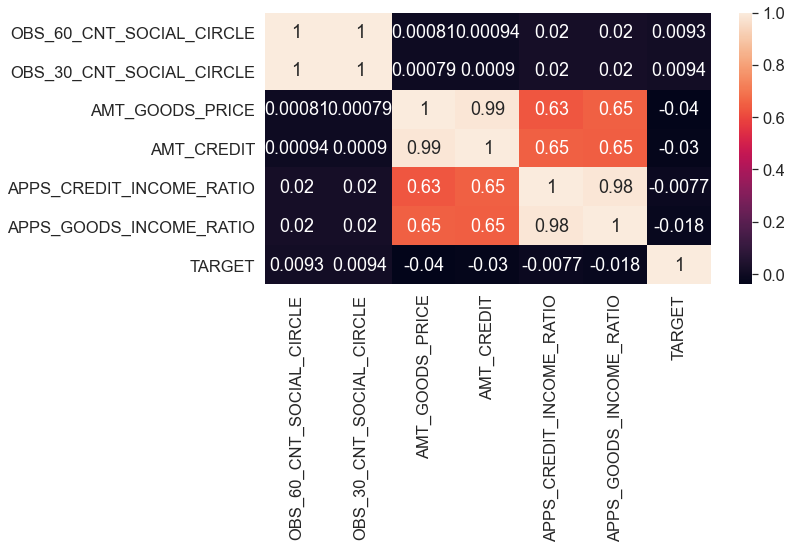

In [1740]:
plt.figure(figsize=(10,5))
sns.heatmap(application_df[['OBS_60_CNT_SOCIAL_CIRCLE','OBS_30_CNT_SOCIAL_CIRCLE','AMT_GOODS_PRICE',
                            'AMT_CREDIT','APPS_CREDIT_INCOME_RATIO','APPS_GOODS_INCOME_RATIO','TARGET']].corr(),
            annot=True)

<b>There seems to be high correlation between OBS_60_CNT_SOCIAL_CIRCLE and OBS_30_CNT_SOCIAL_CIRCLE sop we will drop FLAG_OWN_CAR</b>

### Statsmodel 2

In [1772]:
drop_cols_list = []
drop_cols_list.append('OBS_60_CNT_SOCIAL_CIRCLE')
drop_cols_list

['OBS_60_CNT_SOCIAL_CIRCLE']

In [1741]:
try:
    X_train_scaled_rfe.drop(columns=['OBS_60_CNT_SOCIAL_CIRCLE'],inplace=True)
except:
    print('column not found!')
stats_model,X_train_sm = build_statsmodel(X_train_scaled_rfe,list(y_train))

************ feature - coefficients *****************
const                         -2.7790
CODE_GENDER                    0.1906
CNT_CHILDREN                   0.1905
AMT_INCOME_TOTAL               0.6034
AMT_CREDIT                     0.8391
AMT_ANNUITY                    0.1681
AMT_GOODS_PRICE               -1.0997
NAME_EDUCATION_TYPE            0.1593
NAME_FAMILY_STATUS            -0.0907
DAYS_BIRTH                     0.1100
DAYS_EMPLOYED                  0.3227
DAYS_ID_PUBLISH                0.0701
FLAG_EMP_PHONE                 0.4596
CNT_FAM_MEMBERS               -0.2267
REGION_RATING_CLIENT_W_CITY    0.0822
EXT_SOURCE_2                  -0.1832
EXT_SOURCE_3                  -0.2586
OBS_30_CNT_SOCIAL_CIRCLE      -0.0067
DEF_30_CNT_SOCIAL_CIRCLE       0.0746
FLAG_DOCUMENT_3                0.0855
FLAG_DOCUMENT_4               -0.1826
APPS_EXT_SOURCE_MEAN          -0.3917
APPS_ANNUITY_CREDIT_RATIO     -0.1596
APPS_GOODS_CREDIT_RATIO       -0.1064
APPS_ANNUITY_INCOME_RATIO      0.1

In [1742]:
check_vif(X_train_sm)

,Features,VIF
6,AMT_GOODS_PRICE,208.56
4,AMT_CREDIT,207.53
25,APPS_CREDIT_INCOME_RATIO,182.29
26,APPS_GOODS_INCOME_RATIO,177.68
3,AMT_INCOME_TOTAL,101.21
28,APPS_INCOME_BIRTH_RATIO,100.91
10,DAYS_EMPLOYED,70.96
27,APPS_EMPLOYED_BIRTH_RATIO,49.94
13,CNT_FAM_MEMBERS,17.75
2,CNT_CHILDREN,13.30


### Observations
- After checking variance inflation factor, there is high multicolinearity for variables AMT_GOODS_PRICE, AMT_CREDIT, APPS_CREDIT_INCOME_RATIO, APPS_GOODS_INCOME_RATIO
- We will check correlation of these features with TARGET variable as well and will decide to drop the feature 

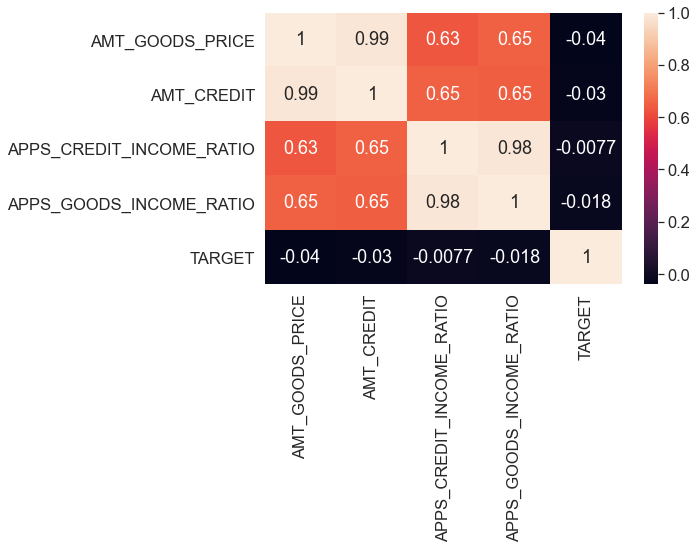

In [1743]:
plt.figure(figsize=(8,5))
sns.heatmap(application_df[['AMT_GOODS_PRICE',
                            'AMT_CREDIT',
                            'APPS_CREDIT_INCOME_RATIO','APPS_GOODS_INCOME_RATIO',
                            'TARGET']].corr(),
            annot=True)

<b>There seems to be high correlation between AMT_GOODS_PRICE, AMT_CREDIT sop we will drop AMT_GOODS_PRICE</b>

### Statsmodel 3

In [1773]:
drop_cols_list.append('AMT_GOODS_PRICE')

In [1744]:
try:
    X_train_scaled_rfe.drop(columns=['AMT_GOODS_PRICE'],inplace=True)
except:
    print('column not found!')
stats_model,X_train_sm = build_statsmodel(X_train_scaled_rfe,list(y_train))

************ feature - coefficients *****************
const                         -2.7755
CODE_GENDER                    0.1900
CNT_CHILDREN                   0.1913
AMT_INCOME_TOTAL               0.5882
AMT_CREDIT                    -0.1979
AMT_ANNUITY                    0.1391
NAME_EDUCATION_TYPE            0.1612
NAME_FAMILY_STATUS            -0.0907
DAYS_BIRTH                     0.1076
DAYS_EMPLOYED                  0.3228
DAYS_ID_PUBLISH                0.0711
FLAG_EMP_PHONE                 0.4640
CNT_FAM_MEMBERS               -0.2268
REGION_RATING_CLIENT_W_CITY    0.0801
EXT_SOURCE_2                  -0.1810
EXT_SOURCE_3                  -0.2577
OBS_30_CNT_SOCIAL_CIRCLE      -0.0068
DEF_30_CNT_SOCIAL_CIRCLE       0.0747
FLAG_DOCUMENT_3                0.0817
FLAG_DOCUMENT_4               -0.1829
APPS_EXT_SOURCE_MEAN          -0.3950
APPS_ANNUITY_CREDIT_RATIO     -0.1545
APPS_GOODS_CREDIT_RATIO       -0.1700
APPS_ANNUITY_INCOME_RATIO      0.1883
APPS_CREDIT_INCOME_RATIO      -0.0

In [1745]:
check_vif(X_train_sm)

,Features,VIF
24,APPS_CREDIT_INCOME_RATIO,101.99
3,AMT_INCOME_TOTAL,101.21
27,APPS_INCOME_BIRTH_RATIO,100.91
25,APPS_GOODS_INCOME_RATIO,93.87
9,DAYS_EMPLOYED,70.96
26,APPS_EMPLOYED_BIRTH_RATIO,49.94
12,CNT_FAM_MEMBERS,17.75
2,CNT_CHILDREN,13.30
4,AMT_CREDIT,12.76
11,FLAG_EMP_PHONE,11.88


### Observations
- After checking variance inflation factor, there is high multicolinearity for variables APPS_CREDIT_INCOME_RATIO, AMT_INCOME_TOTAL, APPS_INCOME_BIRTH_RATIO, APPS_GOODS_INCOME_RATIO, DAYS_EMPLOYED, APPS_EMPLOYED_BIRTH_RATIO
- We will check correlation of these features with TARGET variable as well and will decide to drop the feature 

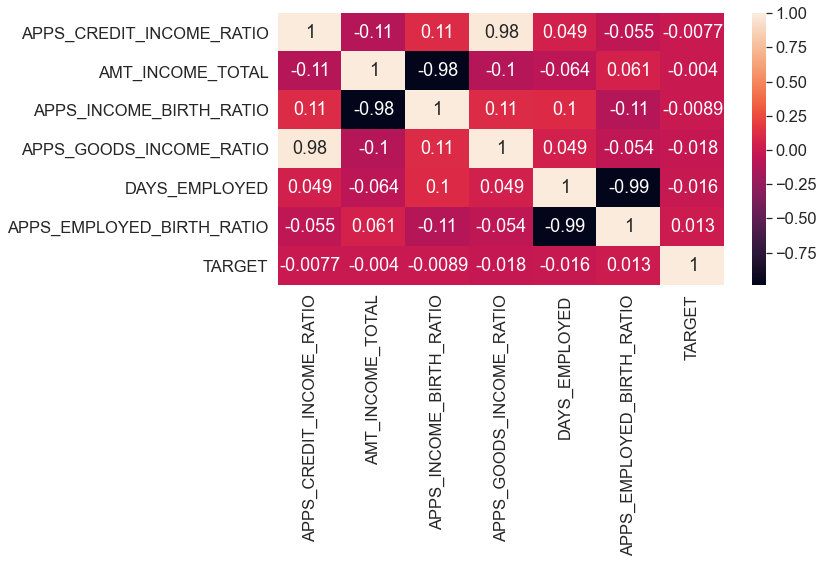

In [1747]:
plt.figure(figsize=(10,5))
sns.heatmap(application_df[['APPS_CREDIT_INCOME_RATIO', 'AMT_INCOME_TOTAL', 'APPS_INCOME_BIRTH_RATIO', 
                            'APPS_GOODS_INCOME_RATIO', 'DAYS_EMPLOYED', 'APPS_EMPLOYED_BIRTH_RATIO',
                            'TARGET']].corr(),
            annot=True)

<b>There seems to be high correlation between AMT_INCOME_TOTAL, APPS_INCOME_BIRTH_RATIO sop we will drop AMT_INCOME_TOTAL since it has a little bit less correlation with TARGET variable</b>

### Statsmodel 4

In [1774]:
drop_cols_list.append('AMT_INCOME_TOTAL')
drop_cols_list

['OBS_60_CNT_SOCIAL_CIRCLE', 'AMT_GOODS_PRICE', 'AMT_INCOME_TOTAL']

In [1748]:
try:
    X_train_scaled_rfe.drop(columns=['AMT_INCOME_TOTAL'],inplace=True)
except:
    print('column not found!')
stats_model,X_train_sm = build_statsmodel(X_train_scaled_rfe,list(y_train))

************ feature - coefficients *****************
const                         -2.7741
CODE_GENDER                    0.1875
CNT_CHILDREN                   0.1975
AMT_CREDIT                    -0.1837
AMT_ANNUITY                    0.1537
NAME_EDUCATION_TYPE            0.1617
NAME_FAMILY_STATUS            -0.0949
DAYS_BIRTH                     0.0109
DAYS_EMPLOYED                  0.2606
DAYS_ID_PUBLISH                0.0689
FLAG_EMP_PHONE                 0.4712
CNT_FAM_MEMBERS               -0.2267
REGION_RATING_CLIENT_W_CITY    0.0808
EXT_SOURCE_2                  -0.1816
EXT_SOURCE_3                  -0.2594
OBS_30_CNT_SOCIAL_CIRCLE      -0.0071
DEF_30_CNT_SOCIAL_CIRCLE       0.0748
FLAG_DOCUMENT_3                0.0832
FLAG_DOCUMENT_4               -0.1829
APPS_EXT_SOURCE_MEAN          -0.3913
APPS_ANNUITY_CREDIT_RATIO     -0.1567
APPS_GOODS_CREDIT_RATIO       -0.1690
APPS_ANNUITY_INCOME_RATIO      0.1776
APPS_CREDIT_INCOME_RATIO      -0.0948
APPS_GOODS_INCOME_RATIO       -0.0

In [1749]:
check_vif(X_train_sm)

,Features,VIF
23,APPS_CREDIT_INCOME_RATIO,101.98
24,APPS_GOODS_INCOME_RATIO,93.86
8,DAYS_EMPLOYED,70.02
25,APPS_EMPLOYED_BIRTH_RATIO,49.27
11,CNT_FAM_MEMBERS,17.75
2,CNT_CHILDREN,13.29
3,AMT_CREDIT,12.72
10,FLAG_EMP_PHONE,11.86
22,APPS_ANNUITY_INCOME_RATIO,10.23
4,AMT_ANNUITY,8.66


### Observation
- After checking variance inflation factor, there is high multicolinearity for variables APPS_CREDIT_INCOME_RATIO, APPS_GOODS_INCOME_RATIO, DAYS_EMPLOYED, APPS_EMPLOYED_BIRTH_RATIO, CNT_FAM_MEMBERS, CNT_CHILDREN
- We will check correlation of these features with TARGET variable as well and will decide to drop the feature 

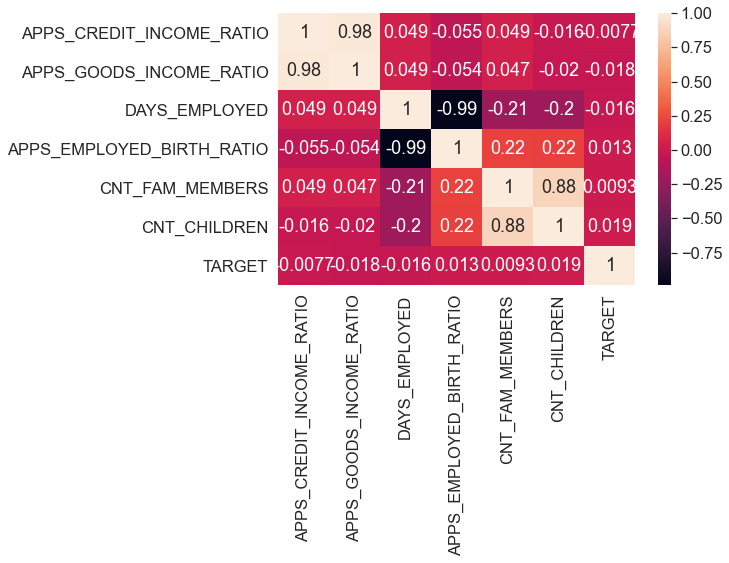

In [1750]:
plt.figure(figsize=(8,5))
sns.heatmap(application_df[['APPS_CREDIT_INCOME_RATIO', 'APPS_GOODS_INCOME_RATIO', 'DAYS_EMPLOYED', 
                            'APPS_EMPLOYED_BIRTH_RATIO', 'CNT_FAM_MEMBERS', 'CNT_CHILDREN',
                            'TARGET']].corr(),
            annot=True)

<b>There seems to be high correlation between APPS_CREDIT_INCOME_RATIO, APPS_GOODS_INCOME_RATIO sop we will drop APPS_CREDIT_INCOME_RATIO since it has a little bit less correlation with TARGET variable</b>

### Statsmodel 5

In [1775]:
drop_cols_list.append('APPS_CREDIT_INCOME_RATIO')

In [1751]:
try:
    X_train_scaled_rfe.drop(columns=['APPS_CREDIT_INCOME_RATIO'],inplace=True)
except:
    print('column not found!')
stats_model,X_train_sm = build_statsmodel(X_train_scaled_rfe,list(y_train))

************ feature - coefficients *****************
const                         -2.7740
CODE_GENDER                    0.1875
CNT_CHILDREN                   0.1973
AMT_CREDIT                    -0.1908
AMT_ANNUITY                    0.1597
NAME_EDUCATION_TYPE            0.1617
NAME_FAMILY_STATUS            -0.0949
DAYS_BIRTH                     0.0108
DAYS_EMPLOYED                  0.2607
DAYS_ID_PUBLISH                0.0688
FLAG_EMP_PHONE                 0.4708
CNT_FAM_MEMBERS               -0.2266
REGION_RATING_CLIENT_W_CITY    0.0807
EXT_SOURCE_2                  -0.1814
EXT_SOURCE_3                  -0.2594
OBS_30_CNT_SOCIAL_CIRCLE      -0.0071
DEF_30_CNT_SOCIAL_CIRCLE       0.0747
FLAG_DOCUMENT_3                0.0842
FLAG_DOCUMENT_4               -0.1829
APPS_EXT_SOURCE_MEAN          -0.3913
APPS_ANNUITY_CREDIT_RATIO     -0.1557
APPS_GOODS_CREDIT_RATIO       -0.1549
APPS_ANNUITY_INCOME_RATIO      0.1701
APPS_GOODS_INCOME_RATIO       -0.1114
APPS_EMPLOYED_BIRTH_RATIO     -0.1

In [1752]:
check_vif(X_train_sm)

,Features,VIF
8,DAYS_EMPLOYED,70.02
24,APPS_EMPLOYED_BIRTH_RATIO,49.27
11,CNT_FAM_MEMBERS,17.75
2,CNT_CHILDREN,13.29
23,APPS_GOODS_INCOME_RATIO,13.00
3,AMT_CREDIT,12.19
10,FLAG_EMP_PHONE,11.86
22,APPS_ANNUITY_INCOME_RATIO,9.40
4,AMT_ANNUITY,8.26
19,APPS_EXT_SOURCE_MEAN,6.71


### Observation
- After checking variance inflation factor, there is high multicolinearity for variables DAYS_EMPLOYED, APPS_EMPLOYED_BIRTH_RATIO, CNT_FAM_MEMBERS, CNT_CHILDREN, APPS_GOODS_INCOME_RATIO, AMT_CREDIT
- We will check correlation of these features with TARGET variable as well and will decide to drop the feature 

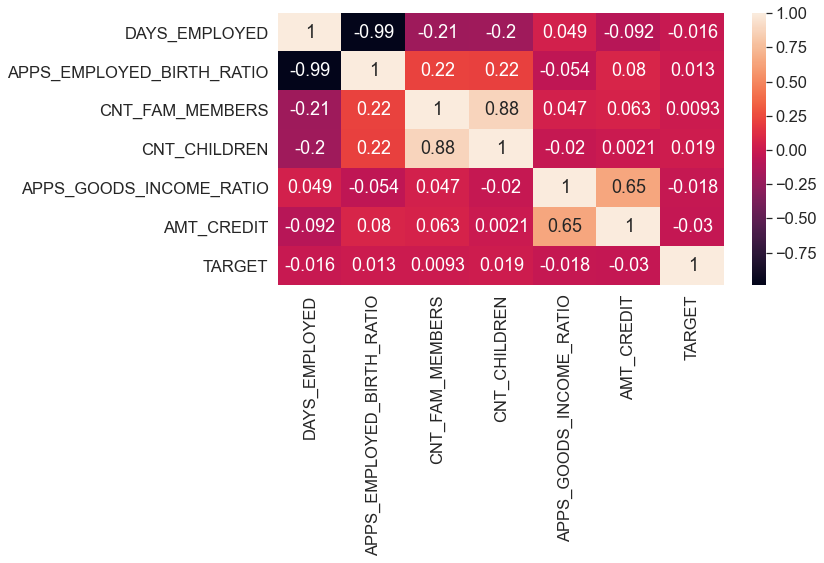

In [1753]:
plt.figure(figsize=(10,5))
sns.heatmap(application_df[['DAYS_EMPLOYED', 'APPS_EMPLOYED_BIRTH_RATIO', 'CNT_FAM_MEMBERS', 
                            'CNT_CHILDREN', 'APPS_GOODS_INCOME_RATIO', 'AMT_CREDIT',
                            'TARGET']].corr(),
            annot=True)

<b>There seems to be high correlation between DAYS_EMPLOYED, APPS_EMPLOYED_BIRTH_RATIO so we will drop DAYS_EMPLOYED since it has a little bit less correlation with TARGET variable</b>

### Statsmodel 6

In [1776]:
drop_cols_list.append('DAYS_EMPLOYED')

In [1754]:
try:
    X_train_scaled_rfe.drop(columns=['DAYS_EMPLOYED'],inplace=True)
except:
    print('column not found!')
stats_model,X_train_sm = build_statsmodel(X_train_scaled_rfe,list(y_train))

************ feature - coefficients *****************
const                         -2.7730
CODE_GENDER                    0.1872
CNT_CHILDREN                   0.1952
AMT_CREDIT                    -0.1902
AMT_ANNUITY                    0.1578
NAME_EDUCATION_TYPE            0.1611
NAME_FAMILY_STATUS            -0.0929
DAYS_BIRTH                     0.0286
DAYS_ID_PUBLISH                0.0662
FLAG_EMP_PHONE                 0.3944
CNT_FAM_MEMBERS               -0.2233
REGION_RATING_CLIENT_W_CITY    0.0804
EXT_SOURCE_2                  -0.1802
EXT_SOURCE_3                  -0.2583
OBS_30_CNT_SOCIAL_CIRCLE      -0.0068
DEF_30_CNT_SOCIAL_CIRCLE       0.0748
FLAG_DOCUMENT_3                0.0837
FLAG_DOCUMENT_4               -0.1829
APPS_EXT_SOURCE_MEAN          -0.3940
APPS_ANNUITY_CREDIT_RATIO     -0.1546
APPS_GOODS_CREDIT_RATIO       -0.1547
APPS_ANNUITY_INCOME_RATIO      0.1720
APPS_GOODS_INCOME_RATIO       -0.1129
APPS_EMPLOYED_BIRTH_RATIO     -0.3669
APPS_INCOME_BIRTH_RATIO       -0.0

In [1755]:
check_vif(X_train_sm)

,Features,VIF
10,CNT_FAM_MEMBERS,17.74
2,CNT_CHILDREN,13.28
22,APPS_GOODS_INCOME_RATIO,13.00
3,AMT_CREDIT,12.19
21,APPS_ANNUITY_INCOME_RATIO,9.39
4,AMT_ANNUITY,8.25
9,FLAG_EMP_PHONE,7.05
18,APPS_EXT_SOURCE_MEAN,6.70
23,APPS_EMPLOYED_BIRTH_RATIO,5.56
6,NAME_FAMILY_STATUS,4.12


### Observation
- After checking variance inflation factor, there is high multicolinearity for variables CNT_FAM_MEMBERS, CNT_CHILDREN, APPS_GOODS_INCOME_RATIO, AMT_CREDIT, APPS_ANNUITY_INCOME_RATIO, AMT_ANNUITY
- We will check correlation of these features with TARGET variable as well and will decide to drop the feature 

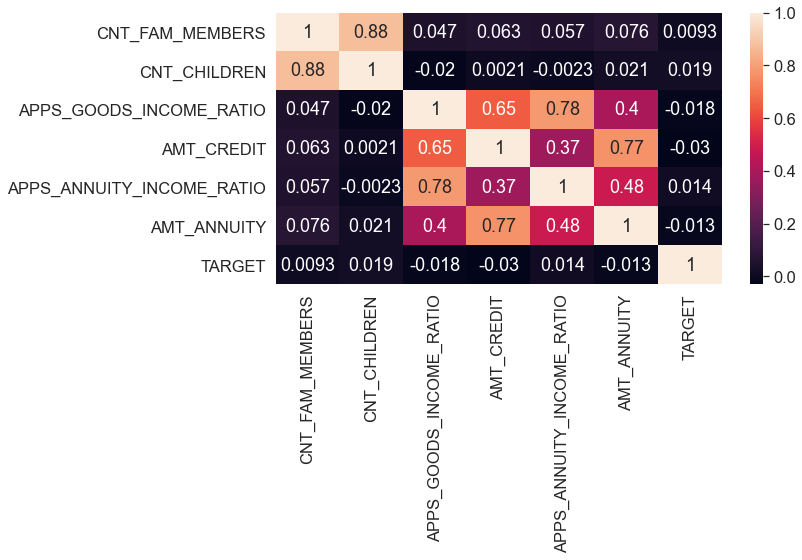

In [1756]:
plt.figure(figsize=(10,5))
sns.heatmap(application_df[['CNT_FAM_MEMBERS', 'CNT_CHILDREN', 'APPS_GOODS_INCOME_RATIO', 'AMT_CREDIT', 
                            'APPS_ANNUITY_INCOME_RATIO', 'AMT_ANNUITY',
                            'TARGET']].corr(),
            annot=True)

<b>There seems to be high correlation between CNT_FAM_MEMBERS, CNT_CHILDREN so we will drop CNT_FAM_MEMBERS since it has a little bit less correlation with TARGET variable</b>

### Statsmodel 6

In [1777]:
drop_cols_list.append('CNT_FAM_MEMBERS')

In [1757]:
try:
    X_train_scaled_rfe.drop(columns=['CNT_FAM_MEMBERS'],inplace=True)
except:
    print('column not found!')
stats_model,X_train_sm = build_statsmodel(X_train_scaled_rfe,list(y_train))

************ feature - coefficients *****************
const                         -2.7720
CODE_GENDER                    0.1866
CNT_CHILDREN                   0.0108
AMT_CREDIT                    -0.1929
AMT_ANNUITY                    0.1590
NAME_EDUCATION_TYPE            0.1604
NAME_FAMILY_STATUS             0.0042
DAYS_BIRTH                     0.0385
DAYS_ID_PUBLISH                0.0653
FLAG_EMP_PHONE                 0.4032
REGION_RATING_CLIENT_W_CITY    0.0795
EXT_SOURCE_2                  -0.1797
EXT_SOURCE_3                  -0.2565
OBS_30_CNT_SOCIAL_CIRCLE      -0.0078
DEF_30_CNT_SOCIAL_CIRCLE       0.0749
FLAG_DOCUMENT_3                0.0834
FLAG_DOCUMENT_4               -0.1829
APPS_EXT_SOURCE_MEAN          -0.3958
APPS_ANNUITY_CREDIT_RATIO     -0.1545
APPS_GOODS_CREDIT_RATIO       -0.1569
APPS_ANNUITY_INCOME_RATIO      0.1668
APPS_GOODS_INCOME_RATIO       -0.1130
APPS_EMPLOYED_BIRTH_RATIO     -0.3732
APPS_INCOME_BIRTH_RATIO       -0.0073
APPS_CAR_BIRTH_RATIO           0.1

In [1758]:
check_vif(X_train_sm)

,Features,VIF
21,APPS_GOODS_INCOME_RATIO,13.00
3,AMT_CREDIT,12.18
20,APPS_ANNUITY_INCOME_RATIO,9.38
4,AMT_ANNUITY,8.25
9,FLAG_EMP_PHONE,7.03
17,APPS_EXT_SOURCE_MEAN,6.70
22,APPS_EMPLOYED_BIRTH_RATIO,5.55
11,EXT_SOURCE_2,3.64
18,APPS_ANNUITY_CREDIT_RATIO,3.25
12,EXT_SOURCE_3,3.13


### Observation
- After checking variance inflation factor, there is high multicolinearity for variables APPS_GOODS_INCOME_RATIO, AMT_CREDIT, APPS_ANNUITY_INCOME_RATIO, AMT_ANNUITY
- We will check correlation of these features with TARGET variable as well and will decide to drop the feature 

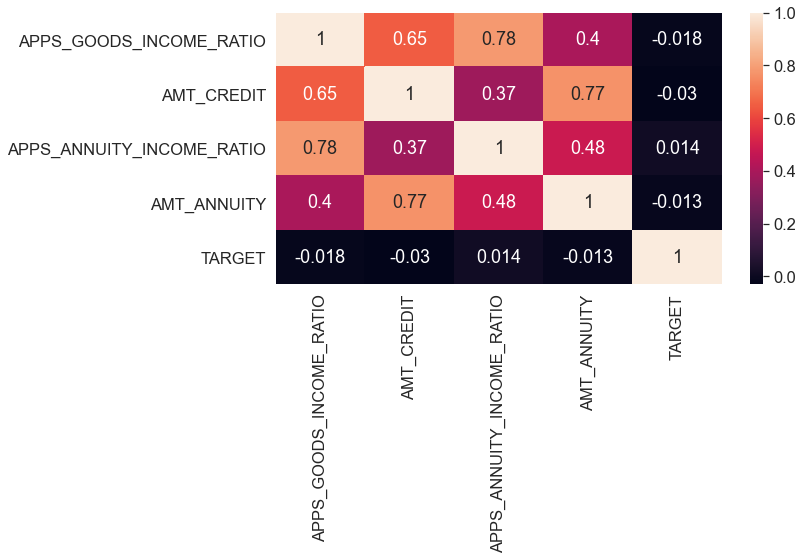

In [1759]:
plt.figure(figsize=(10,5))
sns.heatmap(application_df[['APPS_GOODS_INCOME_RATIO', 'AMT_CREDIT', 
                            'APPS_ANNUITY_INCOME_RATIO', 'AMT_ANNUITY',
                            'TARGET']].corr(),
            annot=True)

<b>We will drop AMT_ANNUITY since it has a little bit less correlation with TARGET variable</b>

### Statsmodel 6

In [1778]:
drop_cols_list.append('AMT_ANNUITY')

In [1760]:
try:
    X_train_scaled_rfe.drop(columns=['AMT_ANNUITY'],inplace=True)
except:
    print('column not found!')
stats_model,X_train_sm = build_statsmodel(X_train_scaled_rfe,list(y_train))

************ feature - coefficients *****************
const                         -2.7704
CODE_GENDER                    0.1888
CNT_CHILDREN                   0.0108
AMT_CREDIT                    -0.0204
NAME_EDUCATION_TYPE            0.1588
NAME_FAMILY_STATUS             0.0041
DAYS_BIRTH                     0.0323
DAYS_ID_PUBLISH                0.0651
FLAG_EMP_PHONE                 0.4059
REGION_RATING_CLIENT_W_CITY    0.0770
EXT_SOURCE_2                  -0.1789
EXT_SOURCE_3                  -0.2584
OBS_30_CNT_SOCIAL_CIRCLE      -0.0079
DEF_30_CNT_SOCIAL_CIRCLE       0.0747
FLAG_DOCUMENT_3                0.0830
FLAG_DOCUMENT_4               -0.1828
APPS_EXT_SOURCE_MEAN          -0.3954
APPS_ANNUITY_CREDIT_RATIO     -0.1268
APPS_GOODS_CREDIT_RATIO       -0.1379
APPS_ANNUITY_INCOME_RATIO      0.2721
APPS_GOODS_INCOME_RATIO       -0.2291
APPS_EMPLOYED_BIRTH_RATIO     -0.3724
APPS_INCOME_BIRTH_RATIO       -0.0400
APPS_CAR_BIRTH_RATIO           0.1211
dtype: float64
*******************

In [1761]:
check_vif(X_train_sm)

,Features,VIF
20,APPS_GOODS_INCOME_RATIO,8.33
8,FLAG_EMP_PHONE,7.03
16,APPS_EXT_SOURCE_MEAN,6.70
21,APPS_EMPLOYED_BIRTH_RATIO,5.55
19,APPS_ANNUITY_INCOME_RATIO,5.46
10,EXT_SOURCE_2,3.64
11,EXT_SOURCE_3,3.13
17,APPS_ANNUITY_CREDIT_RATIO,3.00
3,AMT_CREDIT,2.40
6,DAYS_BIRTH,2.25


### Observation
We will not drop any more feature now

## When cutoff is 0.5

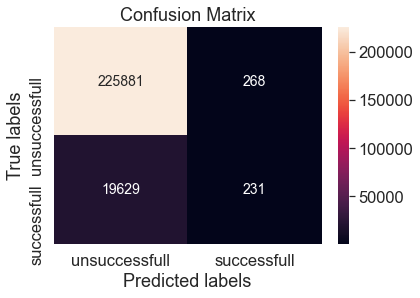

Accuracy score: 0.9191208451723311
Sensitivity score: 0.01163141993957704
Specificity score: 0.9988149405922644
f1-score: 0.022692666633921117
Precision score: 0.46292585170340683
Recall score: 0.01163141993957704
AUC: 0.74


In [1762]:
y_train_pred = pd.DataFrame({'TARGET':stats_model.predict(X_train_sm)})
y_train_pred_prob = y_train_pred['TARGET'].values.reshape(-1)
y_train_pred_final, conf_matrix = createfinaldf_and_checkscores(y_train,y_train_pred,y_train_pred_prob)

### <font size=3 color=blue>Lets check if we need to change the cutoff and see if senstivity and specificty can change</font>

In [1763]:
#check_cutoff(y_train_pred_final)
cutoff_df = check_cutoff(y_train_pred_final)
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0  0.0   0.080729  1.000000  0.000000
0.1  0.1   0.755493  0.575277  0.771319
0.2  0.2   0.887390  0.248036  0.943537
0.3  0.3   0.912967  0.106344  0.983803
0.4  0.4   0.918308  0.042346  0.995233
0.5  0.5   0.919121  0.011631  0.998815
0.6  0.6   0.919320  0.002669  0.999819
0.7  0.7   0.919275  0.000201  0.999987
0.8  0.8   0.919271  0.000050  0.999996
0.9  0.9   0.919271  0.000050  0.999996


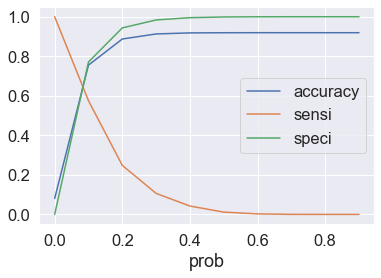

In [1764]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

### Observations from above plot
- 0.1 is the optimum point to take it as cutoff probability

### Based on the probability cutoff lets do predictions mapping again

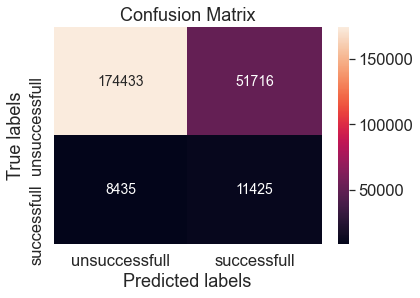

Accuracy score: 0.7554926852269632
Sensitivity score: 0.57527693856999
Specificity score: 0.7713189092147212
f1-score: 0.27529788797725335
Precision score: 0.180944235916441
Recall score: 0.57527693856999
AUC: 0.74


In [1765]:
y_train_pred_final, conf_matrix = createfinaldf_and_checkscores(y_train,y_train_pred,y_train_pred_prob,
                                                                prob_cutoff=0.1)

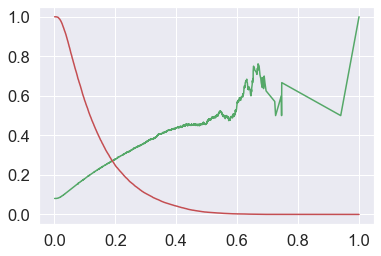

In [1766]:
p, r, thresholds = precision_recall_curve(y_train_pred_final['TARGET'], y_train_pred_final['TARGET_Prob'])
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

### Lets store results in results_df

In [1767]:
store_results(y_train_pred_final, #dataframe
              conf_matrix, #confusion_matrix
              'StatsModel', #model_name
              0, #location or index
              'train' #train or test set
             )

## Evaluate model on test data and check the score

In [1768]:
X_train_scaled_rfe.head()

,CODE_GENDER,CNT_CHILDREN,AMT_CREDIT,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,DAYS_BIRTH,DAYS_ID_PUBLISH,FLAG_EMP_PHONE,REGION_RATING_CLIENT_W_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,APPS_EXT_SOURCE_MEAN,APPS_ANNUITY_CREDIT_RATIO,APPS_GOODS_CREDIT_RATIO,APPS_ANNUITY_INCOME_RATIO,APPS_GOODS_INCOME_RATIO,APPS_EMPLOYED_BIRTH_RATIO,APPS_INCOME_BIRTH_RATIO,APPS_CAR_BIRTH_RATIO
0,1.388304,-0.577733,-0.477884,0.624929,1.305591,1.506955,0.576996,0.467846,-0.062525,-1.319085,-2.154278,0.240072,4.149846,0.63870,-0.009017,-3.236650,0.314953,-0.366018,-0.623599,-0.746850,0.106293,-0.486248,0.680838
1,-0.720225,-0.577733,1.727262,-1.684641,-0.404812,-0.167567,1.787847,0.467846,-2.050610,0.564486,0.112776,-0.173290,-0.319491,0.63870,-0.009017,-0.202654,-1.160860,-0.271442,-0.514978,0.264452,0.118718,-0.227017,0.680838
2,1.388304,-0.577733,-1.153167,0.624929,1.305591,-0.690511,0.304903,0.467846,-0.062525,0.216740,1.225346,-0.586651,-0.319491,-1.56568,-0.009017,0.792876,-0.163583,0.933837,-0.856754,-0.636776,-0.088957,0.387512,-0.815362
3,-0.720225,-0.577733,-0.711388,0.624929,-1.260013,-0.681111,0.367133,0.467846,-0.062525,0.712299,0.112776,0.240072,-0.319491,0.63870,-0.009017,0.485102,1.837115,0.457059,0.415225,-0.554221,0.431887,0.213375,0.680838
4,1.388304,-0.577733,-0.213331,0.624929,1.305591,-0.893636,-0.308798,0.467846,-0.062525,-1.005645,0.112776,-0.586651,-0.319491,-1.56568,-0.009017,-0.525904,-0.492001,0.933837,-0.008453,0.280505,0.405555,0.262674,0.680838


In [1769]:
X_test_scaled_rfe.head()

,CODE_GENDER,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_ID_PUBLISH,FLAG_EMP_PHONE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT_W_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,APPS_EXT_SOURCE_MEAN,APPS_ANNUITY_CREDIT_RATIO,APPS_GOODS_CREDIT_RATIO,APPS_ANNUITY_INCOME_RATIO,APPS_CREDIT_INCOME_RATIO,APPS_GOODS_INCOME_RATIO,APPS_EMPLOYED_BIRTH_RATIO,APPS_INCOME_BIRTH_RATIO,APPS_CAR_BIRTH_RATIO
9,1.388304,-0.577733,-0.130117,-0.481856,-0.471800,-0.360845,0.624929,1.305591,0.358816,-0.366842,-0.662321,0.467846,-1.26514,-0.062525,1.216626,0.112776,0.240072,-0.319491,0.249338,-1.56568,-0.009017,0.781896,-0.163583,0.933837,-0.326321,-0.355628,-0.224000,0.360261,0.104427,0.680838
11,-0.720225,-0.577733,-0.500836,-1.119937,-1.131312,-1.092590,0.624929,-0.404812,-1.004828,1.976171,0.317481,-2.137455,-0.16810,-0.062525,0.212918,0.786308,-0.586651,-0.319491,-0.584853,-1.56568,-0.009017,1.220620,0.814679,0.077506,1.031030,-0.034702,-0.011886,-2.025368,0.468839,0.680838
16,1.388304,-0.577733,-0.233755,-0.221779,-0.065303,-0.409628,0.624929,-0.404812,0.711420,-0.240504,-0.578906,0.467846,-0.16810,-0.062525,-1.458379,-2.596766,-0.586651,-0.319491,-0.584853,0.63870,-0.009017,-2.252133,-0.105107,-1.353194,0.651003,0.284381,0.016786,0.227699,0.152287,0.680838
18,-0.720225,-0.577733,-0.216482,-1.097225,-1.324483,-1.031612,0.624929,3.015994,-0.386053,-1.407961,1.147003,0.467846,-1.26514,-2.050610,1.005803,0.235613,2.720243,-0.319491,2.751909,0.63870,-0.009017,0.724007,-0.163583,0.933837,-1.175014,-0.951491,-0.884442,1.418595,0.250260,0.680838
19,-0.720225,0.805059,-0.302847,-0.135034,-0.656910,-0.226691,-1.684641,1.305591,1.074340,-0.370261,-0.643784,0.467846,-0.16810,-0.062525,0.377707,-0.217215,-0.586651,-0.319491,-0.584853,0.63870,-0.009017,0.110408,-0.953477,-0.637295,0.152661,0.780197,0.622192,0.501123,0.172890,0.680838


In [1779]:
X_test_scaled_rfe.drop(columns=drop_cols_list,inplace=True)

In [1780]:
# add constant to test data
X_test_sm = sm.add_constant(X_test_scaled_rfe)

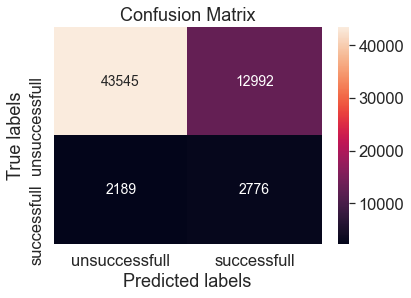

Accuracy score: 0.7531624987805274
Sensitivity score: 0.5591137965760322
Specificity score: 0.7702035834939951
f1-score: 0.26778565571793755
Precision score: 0.17605276509386097
Recall score: 0.5591137965760322
AUC: 0.73


In [1781]:
y_test_pred = pd.DataFrame({'TARGET':stats_model.predict(X_test_sm)})
y_test_pred_prob = y_test_pred['TARGET'].values.reshape(-1)
y_test_pred_final, conf_matrix = createfinaldf_and_checkscores(y_test,y_test_pred,y_test_pred_prob,
                                                               prob_cutoff=0.1)## probability cutoff found is 0.1

### Draw ROC Curve

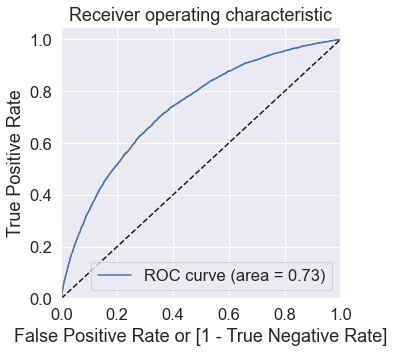

In [1782]:
draw_roc(y_test_pred_final['TARGET'],y_test_pred_final['TARGET_Prob'])

### Lets store results in results_df

In [1783]:
store_results(y_test_pred_final, #dataframe
              conf_matrix, #confusion_matrix
              'StatsModel', #model_name
              0, #location or index
              'test' #train or test set
             )

In [1784]:
results_df

,model_type,train_acc,train_sen,train_spec,train_f1,test_acc,test_sen,test_spec,test_f1
0,StatsModel,0.76,0.58,0.77,0.28,0.75,0.56,0.77,0.27


## Logistic Regression

### Lets filter scaled X_train and X_test with features from final stats model

In [1785]:
X_train_sm.drop(columns=['const'],inplace=True)
filtered_columns = list(X_train_sm.columns)
print('final list of columns: \n{0}'.format(filtered_columns))

final list of columns: 
['CODE_GENDER', 'CNT_CHILDREN', 'AMT_CREDIT', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'DAYS_BIRTH', 'DAYS_ID_PUBLISH', 'FLAG_EMP_PHONE', 'REGION_RATING_CLIENT_W_CITY', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'APPS_EXT_SOURCE_MEAN', 'APPS_ANNUITY_CREDIT_RATIO', 'APPS_GOODS_CREDIT_RATIO', 'APPS_ANNUITY_INCOME_RATIO', 'APPS_GOODS_INCOME_RATIO', 'APPS_EMPLOYED_BIRTH_RATIO', 'APPS_INCOME_BIRTH_RATIO', 'APPS_CAR_BIRTH_RATIO']


In [1786]:
# Note that we will filter columns of X_train which is not scaled dataframe
# This is because we will pass standardization scaling as pipeline step in gridsearch
X_train_selected = X_train[filtered_columns]
X_test_selected = X_test[filtered_columns]

In [1787]:
X_train_selected.head()

,CODE_GENDER,CNT_CHILDREN,AMT_CREDIT,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,DAYS_BIRTH,DAYS_ID_PUBLISH,FLAG_EMP_PHONE,REGION_RATING_CLIENT_W_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,APPS_EXT_SOURCE_MEAN,APPS_ANNUITY_CREDIT_RATIO,APPS_GOODS_CREDIT_RATIO,APPS_ANNUITY_INCOME_RATIO,APPS_GOODS_INCOME_RATIO,APPS_EMPLOYED_BIRTH_RATIO,APPS_INCOME_BIRTH_RATIO,APPS_CAR_BIRTH_RATIO
0,1,0,406597.5,4,3,-9461,-2120,1,2,0.262949,0.139376,2.0,2.0,1,0,0.161787,0.060749,0.863262,0.121978,1.733333,0.067329,-21.403657,-0.000000
1,0,0,1293502.5,1,1,-16765,-291,1,1,0.622246,0.535276,1.0,0.0,1,0,0.489596,0.027598,0.873211,0.132217,4.183333,0.070862,-16.104981,-0.000000
2,1,0,135000.0,4,3,-19046,-2531,1,2,0.555912,0.729567,0.0,0.0,0,0,0.597159,0.050000,1.000000,0.100000,2.000000,0.011814,-3.544051,-0.000473
3,0,0,312682.5,4,0,-19005,-2437,1,2,0.650442,0.535276,2.0,0.0,1,0,0.563905,0.094941,0.949845,0.219900,2.200000,0.159905,-7.103394,-0.000000
4,1,0,513000.0,4,3,-19932,-3458,1,2,0.322738,0.535276,0.0,0.0,0,0,0.454671,0.042623,1.000000,0.179963,4.222222,0.152418,-6.095725,-0.000000


In [1788]:
#Use Transformer to use scalar only on continuous variables
transformer = ColumnTransformer(transformers=[('std_scaler', StandardScaler(), filtered_columns)],
                                remainder='passthrough')

#create Logistic Regression variable
#instead of using class_weight as 'balanced', lets give actual weight for classes
logistic_reg = LogisticRegression(class_weight='balanced')#'{1:0.9, 0:0.1}')

#create steps variable
#these steps will be used in Pipeline during model building
steps = [('transform_scaler', transformer),
         ('logistic', logistic_reg)
        ]

#create pipeline
pipeline = Pipeline(steps)

#create parameters that will be used during gridsearch
params = {
    'logistic__C':[0.1,0.5,0.8,1,2,5], #regularization term. smaller number means more regularization
    'logistic__penalty':['l1','l2'], #norm used in penalization
    'logistic__solver':['liblinear','saga']
    }

#create GridSearchCV object to find best param that we will use in our final model building process
logistic_gridsearch = GridSearchCV(estimator = pipeline, param_grid=params, verbose=1, scoring='roc_auc', 
                          n_jobs=-1, return_train_score=True
                         )

## Fit the model

In [1789]:
logistic_gridsearch.fit(X_train_selected,y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


GridSearchCV(estimator=Pipeline(steps=[('transform_scaler',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('std_scaler',
                                                                         StandardScaler(),
                                                                         ['CODE_GENDER',
                                                                          'CNT_CHILDREN',
                                                                          'AMT_CREDIT',
                                                                          'NAME_EDUCATION_TYPE',
                                                                          'NAME_FAMILY_STATUS',
                                                                          'DAYS_BIRTH',
                                                                          'DAYS_ID_PUBLISH',
                                      

In [1790]:
# printing the optimal accuracy score and hyperparameters
print("best accuracy", logistic_gridsearch.best_score_)
print(logistic_gridsearch.best_params_)

best accuracy 0.7438195839834034
{'logistic__C': 0.1, 'logistic__penalty': 'l1', 'logistic__solver': 'saga'}


In [1791]:
# scores of GridSearch CV
scores = logistic_gridsearch.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_logistic__C,param_logistic__penalty,param_logistic__solver,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,9.680218,0.452048,0.147885,0.017193,0.1,l1,liblinear,"{'logistic__C': 0.1, 'logistic__penalty': 'l1', 'logistic__solver': 'liblinear'}",0.746200,0.741684,0.742527,0.744364,0.744275,0.743810,0.001575,13,0.743596,0.744773,0.744487,0.744182,0.744072,0.744222,0.000397
1,23.296532,6.096871,0.094099,0.010534,0.1,l1,saga,"{'logistic__C': 0.1, 'logistic__penalty': 'l1', 'logistic__solver': 'saga'}",0.746200,0.741707,0.742529,0.744376,0.744285,0.743820,0.001570,1,0.743596,0.744766,0.744485,0.744176,0.744066,0.744218,0.000396
2,5.791155,0.574724,0.115387,0.022910,0.1,l2,liblinear,"{'logistic__C': 0.1, 'logistic__penalty': 'l2', 'logistic__solver': 'liblinear'}",0.746207,0.741676,0.742544,0.744359,0.744255,0.743808,0.001575,14,0.743596,0.744774,0.744488,0.744183,0.744074,0.744223,0.000398
3,20.519293,0.084232,0.091342,0.011500,0.1,l2,saga,"{'logistic__C': 0.1, 'logistic__penalty': 'l2', 'logistic__solver': 'saga'}",0.746207,0.741703,0.742543,0.744371,0.744270,0.743819,0.001570,6,0.743596,0.744769,0.744486,0.744178,0.744069,0.744220,0.000396
4,4.743656,0.353177,0.098146,0.009087,0.5,l1,liblinear,"{'logistic__C': 0.5, 'logistic__penalty': 'l1', 'logistic__solver': 'liblinear'}",0.746206,0.741676,0.742540,0.744359,0.744260,0.743808,0.001576,15,0.743596,0.744774,0.744488,0.744183,0.744073,0.744223,0.000398


### predict y_train data

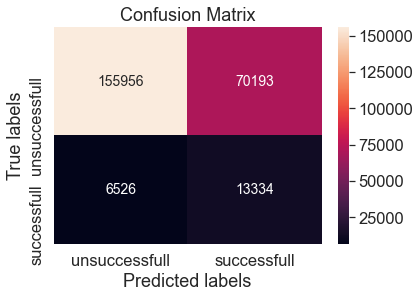

Accuracy score: 0.688145555650403
Sensitivity score: 0.6713997985901309
Specificity score: 0.6896161380328898
f1-score: 0.257943455173281
Precision score: 0.15963700360362518
Recall score: 0.6713997985901309
AUC: 0.74


In [1824]:
y_train_pred = logistic_gridsearch.predict(X_train_selected)
# check area under curve
y_train_pred_prob = logistic_gridsearch.predict_proba(X_train_selected)[:, 1]
y_train_pred_final, conf_matrix = createfinaldf_and_checkscores(y_train,y_train_pred,y_train_pred_prob)

### <font size=3 color=blue>Lets check if we need to change the cutoff and see if senstivity and specificty can change</font>

In [1825]:
#check_cutoff(y_train_pred_final)
cutoff_df = check_cutoff(y_train_pred_final)
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0  0.0   0.080729  1.000000  0.000000
0.1  0.1   0.093919  0.998238  0.014504
0.2  0.2   0.202712  0.977341  0.134686
0.3  0.3   0.375059  0.915760  0.327576
0.4  0.4   0.545569  0.810171  0.522333
0.5  0.5   0.688146  0.671400  0.689616
0.6  0.6   0.795329  0.507402  0.820614
0.7  0.7   0.866253  0.328046  0.913517
0.8  0.8   0.905605  0.156143  0.971421
0.9  0.9   0.918666  0.029204  0.996776


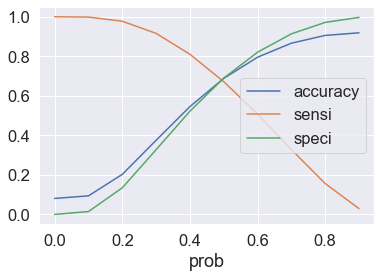

In [1826]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

### Observations from above plot
- 0.5 is the optimum point to take it as cutoff probability

### Based on the probability cutoff lets do predictions mapping again

In [1795]:
threshold_cutoff_prob = 0.55

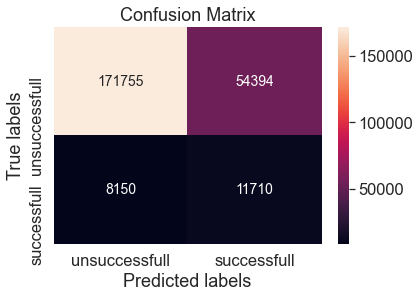

Accuracy score: 0.7457653988268722
Sensitivity score: 0.5896273917421954
Specificity score: 0.7594771588642886
f1-score: 0.2724396258899074
Precision score: 0.17714510468352898
Recall score: 0.5896273917421954
AUC: 0.74


In [1827]:
y_train_pred_final, conf_matrix = createfinaldf_and_checkscores(y_train,y_train_pred,y_train_pred_prob,
                                                                prob_cutoff=0.55)

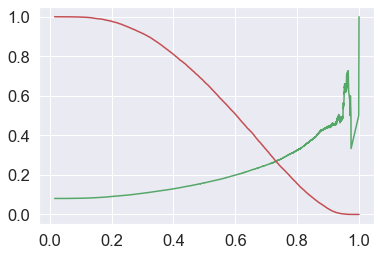

In [1828]:
p, r, thresholds = precision_recall_curve(y_train_pred_final['TARGET'], y_train_pred_final['TARGET_Prob'])
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")### Based on the probability cutoff lets do predictions mapping again

plt.show()

### Draw ROC Curve

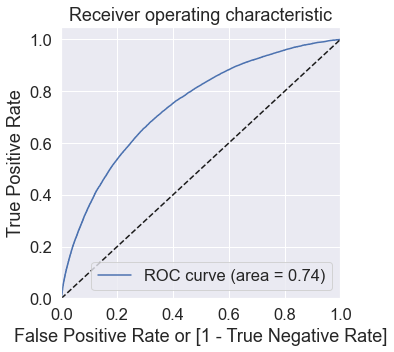

In [1829]:
draw_roc(y_train_pred_final['TARGET'],y_train_pred_final['TARGET_Prob'])

### Lets store results in results_df

In [1830]:
store_results(y_train_pred_final, #dataframe
              conf_matrix, #confusion_matrix
              'Logistic_RFE', #model_name
              1, #location or index
              'train' #train or test set
             )

## Evaluate model on test data and check the score

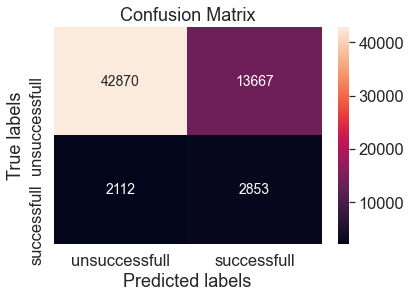

Accuracy score: 0.743439237748366
Sensitivity score: 0.5746223564954682
Specificity score: 0.7582644993544051
f1-score: 0.26558063765417733
Precision score: 0.1726997578692494
Recall score: 0.5746223564954682
AUC: 0.73


In [1801]:
# predict churn on test data
y_test_pred = logistic_gridsearch.predict(X_test_selected)

# check area under curve
y_pred_prob = logistic_gridsearch.predict_proba(X_test_selected)[:, 1]### Test model on test data and check the score 

# use funtcion to final predictions and confusion matrix
y_test_pred_final, conf_matrix = createfinaldf_and_checkscores(y_test,y_test_pred,y_pred_prob,
                                                              prob_cutoff=0.55)#cutoff probability found is 0.55

### Draw ROC Curve

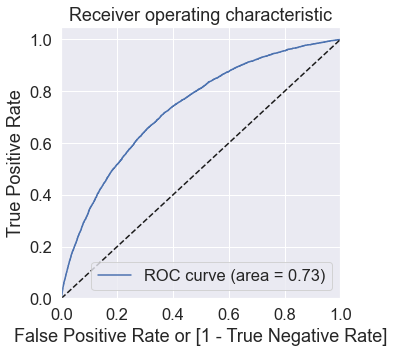

In [1802]:
draw_roc(y_test_pred_final['TARGET'],y_test_pred_final['TARGET_Prob'])

### Lets store results in results_df

In [1803]:
store_results(y_test_pred_final, #dataframe
              conf_matrix, #confusion_matrix
              'Logistic_RFE', #model_name
              1, #location or index
              'test' #train or test set
             )

In [1831]:
results_df

,model_type,train_acc,train_sen,train_spec,train_f1,test_acc,test_sen,test_spec,test_f1
0,StatsModel,0.76,0.58,0.77,0.28,0.75,0.56,0.77,0.27
1,Logistic_RFE,0.75,0.59,0.76,0.27,0.74,0.57,0.76,0.27


### Feature Importance

In [1805]:
logistic_gridsearch.best_estimator_

Pipeline(steps=[('transform_scaler',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('std_scaler',
                                                  StandardScaler(),
                                                  ['CODE_GENDER',
                                                   'CNT_CHILDREN', 'AMT_CREDIT',
                                                   'NAME_EDUCATION_TYPE',
                                                   'NAME_FAMILY_STATUS',
                                                   'DAYS_BIRTH',
                                                   'DAYS_ID_PUBLISH',
                                                   'FLAG_EMP_PHONE',
                                                   'REGION_RATING_CLIENT_W_CITY',
                                                   'EXT_SOURCE_2',
                                                   'EXT_SOURCE_3',
                                                   'OBS_3

In [1806]:
#features list
features_list = logistic_gridsearch.best_estimator_.named_steps['transform_scaler'].transformers[0][2]

#features importance
features_importance = list(logistic_gridsearch.best_estimator_.named_steps['logistic'].coef_.round(4).tolist()[0])

#create dataframe with feature importance in percentage
params_df = pd.DataFrame({'feature':features_list,'coefficient':features_importance})
params_df = params_df.sort_values(by='coefficient',ascending=False).reset_index(drop=True)
params_df

,feature,coefficient
0,FLAG_EMP_PHONE,0.3811
1,APPS_ANNUITY_INCOME_RATIO,0.2472
2,CODE_GENDER,0.1956
3,NAME_EDUCATION_TYPE,0.1609
4,APPS_CAR_BIRTH_RATIO,0.1286
5,FLAG_DOCUMENT_3,0.0833
6,DEF_30_CNT_SOCIAL_CIRCLE,0.0808
7,REGION_RATING_CLIENT_W_CITY,0.0763
8,DAYS_ID_PUBLISH,0.0680
9,DAYS_BIRTH,0.0485


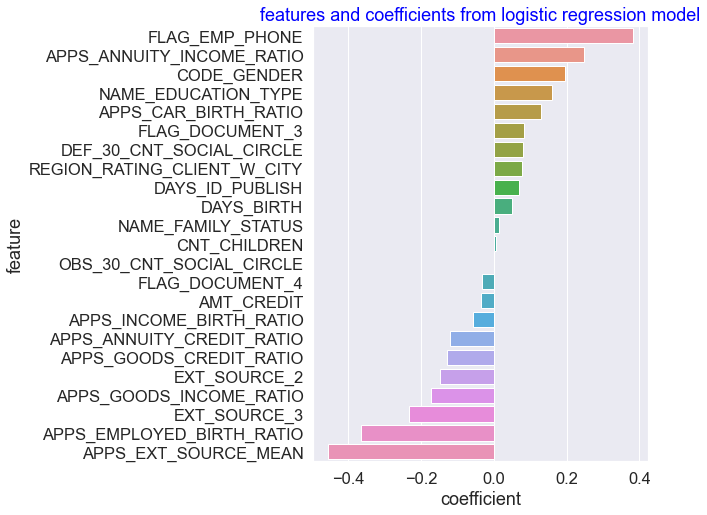

In [1808]:
plt.figure(figsize=(6,8))
plt.title('features and coefficients from logistic regression model',color='blue')
sns.barplot(y='feature',x='coefficient',data=params_df);

## Model 4 - Random Forest

In [1812]:
#Lets use all columns of original X_train and apply transformation on only numerical continuous columns
#Use Transformer to only use scalar on continuous variables
transformer = ColumnTransformer(transformers=[('std_scaler', StandardScaler(), numerical_cols)])

#create RandomForest variable
#instead of using class_weight as 'balanced', lets give actual weight for classes
random_forest = RandomForestClassifier(class_weight='balanced')#'{1:0.9, 0:0.1}')

#create steps variable
#these steps will be used in Pipeline during model building
steps = [('transform_scaler', transformer),
         ('randomforest', random_forest)
        ]

#create pipeline
pipeline = Pipeline(steps)

#create parameters that will be used during gridsearch
params = {
    'randomforest__max_depth': [8,10],#[4,8,10], # maximum depth of the tree,
    'randomforest__min_samples_leaf': [50],#[50,80,100,120], #minimum sample observations at the leaf
    'randomforest__min_samples_split': [50],#[50,80,100,120], #minmum sample observations at the node during split
    'randomforest__n_estimators': [100],#[100,200,300], # no. of trees to be build
    'randomforest__max_features': [15,20], # number of features
    'randomforest__criterion': ['gini','entropy'] #function to measure quality of split
}

#create RandomizedSearchCV object to find best param that we will use in our final model building process
randomforest_randomsearch = RandomizedSearchCV(estimator = pipeline, param_distributions=params, verbose=1, scoring='roc_auc', 
                          n_jobs=-1, return_train_score=True, n_iter=100
                         )

## Fit the model

In [1813]:
randomforest_randomsearch.fit(X_train,y_train)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


RandomizedSearchCV(estimator=Pipeline(steps=[('transform_scaler',
                                              ColumnTransformer(transformers=[('std_scaler',
                                                                               StandardScaler(),
                                                                               ['NAME_CONTRACT_TYPE',
                                                                                'CODE_GENDER',
                                                                                'FLAG_OWN_CAR',
                                                                                'FLAG_OWN_REALTY',
                                                                                'CNT_CHILDREN',
                                                                                'AMT_INCOME_TOTAL',
                                                                                'AMT_CREDIT',
                                                              

In [1814]:
# printing the optimal accuracy score and hyperparameters
print("best accuracy", randomforest_randomsearch.best_score_)
print(randomforest_randomsearch.best_params_)

best accuracy 0.7487939020400052
{'randomforest__n_estimators': 100, 'randomforest__min_samples_split': 50, 'randomforest__min_samples_leaf': 50, 'randomforest__max_features': 15, 'randomforest__max_depth': 10, 'randomforest__criterion': 'gini'}


In [1815]:
# scores of GridSearch CV
scores = randomforest_randomsearch.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_randomforest__n_estimators,param_randomforest__min_samples_split,param_randomforest__min_samples_leaf,param_randomforest__max_features,param_randomforest__max_depth,param_randomforest__criterion,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,134.054560,0.804791,1.498592,0.120740,100,50,50,15,8,gini,"{'randomforest__n_estimators': 100, 'randomforest__min_samples_split': 50, 'randomforest__min_samples_leaf': 50, 'randomforest__max_features': 15, 'randomforest__max_depth': 8, 'randomforest__criterion': 'gini'}",0.747107,0.746341,0.741053,0.746002,0.748857,0.745872,0.002604,5,0.772786,0.773601,0.774393,0.774035,0.774300,0.773823,0.000587
1,169.689789,0.888708,1.445854,0.044727,100,50,50,20,8,gini,"{'randomforest__n_estimators': 100, 'randomforest__min_samples_split': 50, 'randomforest__min_samples_leaf': 50, 'randomforest__max_features': 20, 'randomforest__max_depth': 8, 'randomforest__criterion': 'gini'}",0.745571,0.745429,0.740599,0.745059,0.747825,0.744897,0.002358,8,0.773304,0.773951,0.775011,0.773994,0.773722,0.773996,0.000563
2,148.799003,5.966177,1.536328,0.076807,100,50,50,15,10,gini,"{'randomforest__n_estimators': 100, 'randomforest__min_samples_split': 50, 'randomforest__min_samples_leaf': 50, 'randomforest__max_features': 15, 'randomforest__max_depth': 10, 'randomforest__criterion': 'gini'}",0.750112,0.749665,0.744560,0.748616,0.751017,0.748794,0.002254,1,0.804229,0.805279,0.805054,0.804989,0.803144,0.804539,0.000782
3,196.365429,2.473357,1.777174,0.383980,100,50,50,20,10,gini,"{'randomforest__n_estimators': 100, 'randomforest__min_samples_split': 50, 'randomforest__min_samples_leaf': 50, 'randomforest__max_features': 20, 'randomforest__max_depth': 10, 'randomforest__criterion': 'gini'}",0.749890,0.748421,0.744628,0.748625,0.750924,0.748498,0.002137,2,0.807137,0.807769,0.807840,0.807166,0.807340,0.807450,0.000298
4,140.912812,1.671596,1.444144,0.189189,100,50,50,15,8,entropy,"{'randomforest__n_estimators': 100, 'randomforest__min_samples_split': 50, 'randomforest__min_samples_leaf': 50, 'randomforest__max_features': 15, 'randomforest__max_depth': 8, 'randomforest__criterion': 'entropy'}",0.745877,0.746377,0.741405,0.745102,0.748595,0.745471,0.002341,6,0.771370,0.772295,0.772938,0.772183,0.771809,0.772119,0.000522


### predict y_train data

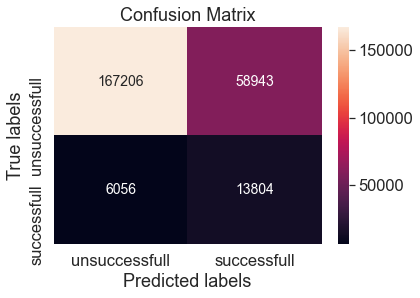

Accuracy score: 0.7357860891268205
Sensitivity score: 0.6950654582074521
Specificity score: 0.7393621019770151
f1-score: 0.2981200125260509
Precision score: 0.1897535293551624
Recall score: 0.6950654582074521
AUC: 0.8


In [1832]:
y_train_pred = randomforest_randomsearch.predict(X_train)
# check area under curve
y_train_pred_prob = randomforest_randomsearch.predict_proba(X_train)[:, 1]
y_train_pred_final, conf_matrix = createfinaldf_and_checkscores(y_train,y_train_pred,y_train_pred_prob)

### <font size=3 color=blue>Lets check if we need to change the cutoff and see if senstivity and specificty can change</font>

In [1833]:
#check_cutoff(y_train_pred_final)
cutoff_df = check_cutoff(y_train_pred_final)
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0  0.0   0.080729  1.000000  0.000000
0.1  0.1   0.085464  1.000000  0.005151
0.2  0.2   0.212720  0.997080  0.143839
0.3  0.3   0.409757  0.951863  0.362151
0.4  0.4   0.595214  0.850806  0.572768
0.5  0.5   0.735786  0.695065  0.739362
0.6  0.6   0.833364  0.515710  0.861260
0.7  0.7   0.898008  0.294008  0.951050
0.8  0.8   0.919816  0.075428  0.993969
0.9  0.9   0.919288  0.000201  1.000000


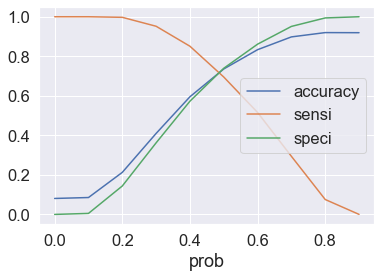

In [1834]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

### Observations from above plot
- 0.55 is the optimum point to take it as cutoff probability

### Based on the probability cutoff lets do predictions mapping again

In [1835]:
threshold_cutoff_prob = 0.55

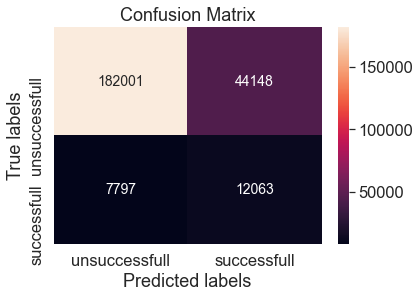

Accuracy score: 0.7888491884443252
Sensitivity score: 0.6074018126888218
Specificity score: 0.8047835718928671
f1-score: 0.31715108254131014
Precision score: 0.21460212413940333
Recall score: 0.6074018126888218
AUC: 0.8


In [1836]:
y_train_pred_final, conf_matrix = createfinaldf_and_checkscores(y_train,y_train_pred,y_train_pred_prob,
                                                                prob_cutoff=0.55)

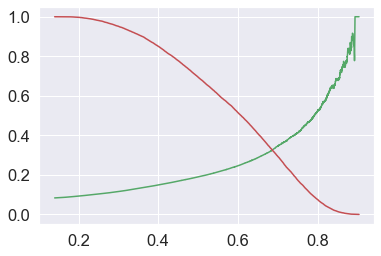

In [1837]:
p, r, thresholds = precision_recall_curve(y_train_pred_final['TARGET'], y_train_pred_final['TARGET_Prob'])
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

### Draw ROC Curve

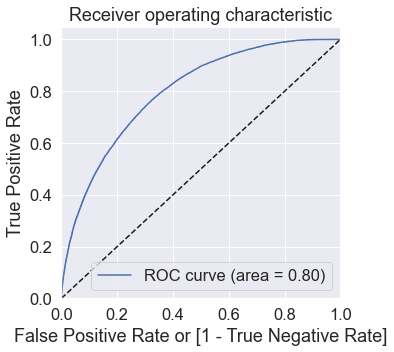

In [1838]:
draw_roc(y_train_pred_final['TARGET'],y_train_pred_final['TARGET_Prob'])

### Lets store results in results_df

In [1839]:
store_results(y_train_pred_final, #dataframe
              conf_matrix, #confusion_matrix
              'RandomForest', #model_name
              2, #location or index
              'train' #train or test set
             )

## Evaluate model on test data and check the score

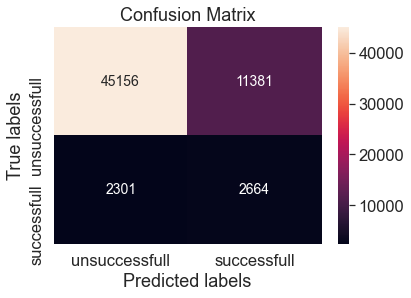

Accuracy score: 0.7775356898962635
Sensitivity score: 0.5365558912386706
Specificity score: 0.7986981976404832
f1-score: 0.28027354024197787
Precision score: 0.18967604129583482
Recall score: 0.5365558912386706
AUC: 0.74


In [1840]:
# predict churn on test data
y_test_pred = randomforest_randomsearch.predict(X_test)

# check area under curve
y_pred_prob = randomforest_randomsearch.predict_proba(X_test)[:, 1]### Test model on test data and check the score 

# use funtcion to final predictions and confusion matrix
y_test_pred_final, conf_matrix = createfinaldf_and_checkscores(y_test,y_test_pred,y_pred_prob,
                                                               prob_cutoff=0.55)#cutoff probability found is 0.55

### Draw ROC Curve

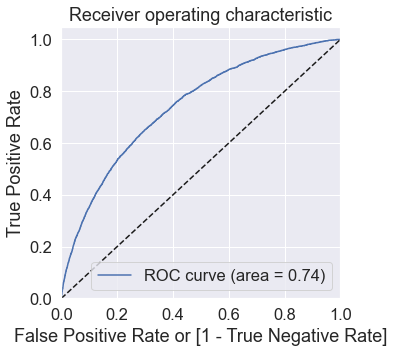

In [1841]:
draw_roc(y_test_pred_final['TARGET'],y_test_pred_final['TARGET_Prob'])

### Lets store results in results_df

In [1842]:
store_results(y_test_pred_final, #dataframe
              conf_matrix, #confusion_matrix
              'RandomForest', #model_name
              2, #location or index
              'test' #train or test set
             )

In [1843]:
results_df

,model_type,train_acc,train_sen,train_spec,train_f1,test_acc,test_sen,test_spec,test_f1
0,StatsModel,0.76,0.58,0.77,0.28,0.75,0.56,0.77,0.27
1,Logistic_RFE,0.75,0.59,0.76,0.27,0.74,0.57,0.76,0.27
2,RandomForest,0.79,0.61,0.8,0.32,0.78,0.54,0.8,0.28


### Feature Importance

In [1844]:
randomforest_randomsearch.best_estimator_

Pipeline(steps=[('transform_scaler',
                 ColumnTransformer(transformers=[('std_scaler',
                                                  StandardScaler(),
                                                  ['NAME_CONTRACT_TYPE',
                                                   'CODE_GENDER',
                                                   'FLAG_OWN_CAR',
                                                   'FLAG_OWN_REALTY',
                                                   'CNT_CHILDREN',
                                                   'AMT_INCOME_TOTAL',
                                                   'AMT_CREDIT', 'AMT_ANNUITY',
                                                   'AMT_GOODS_PRICE',
                                                   'NAME_TYPE_SUITE',
                                                   'NAME_INCOME_TYPE',
                                                   'NAME_EDUCATION_TYPE',
                                                   '

In [1845]:
#features list
features_list = randomforest_randomsearch.best_estimator_.named_steps['transform_scaler'].transformers[0][2]

#features importance
features_importance = list(randomforest_randomsearch.best_estimator_.named_steps['randomforest'].feature_importances_)

#create dataframe with feature importance in percentage
params_df = pd.DataFrame({'feature':features_list,'coefficient':features_importance})
params_df = params_df.sort_values(by='coefficient',ascending=False).reset_index(drop=True)
params_df

,feature,coefficient
0,APPS_EXT_SOURCE_MEAN,0.277270
1,EXT_SOURCE_2,0.139490
2,EXT_SOURCE_3,0.124802
3,APPS_EXT_SOURCE_STD,0.042957
4,EXT_SOURCE_1,0.036802
5,APPS_GOODS_CREDIT_RATIO,0.033484
6,APPS_INCOME_EMPLOYED_RATIO,0.026376
7,APPS_ANNUITY_CREDIT_RATIO,0.025581
8,DAYS_BIRTH,0.023747
9,NAME_EDUCATION_TYPE,0.020724


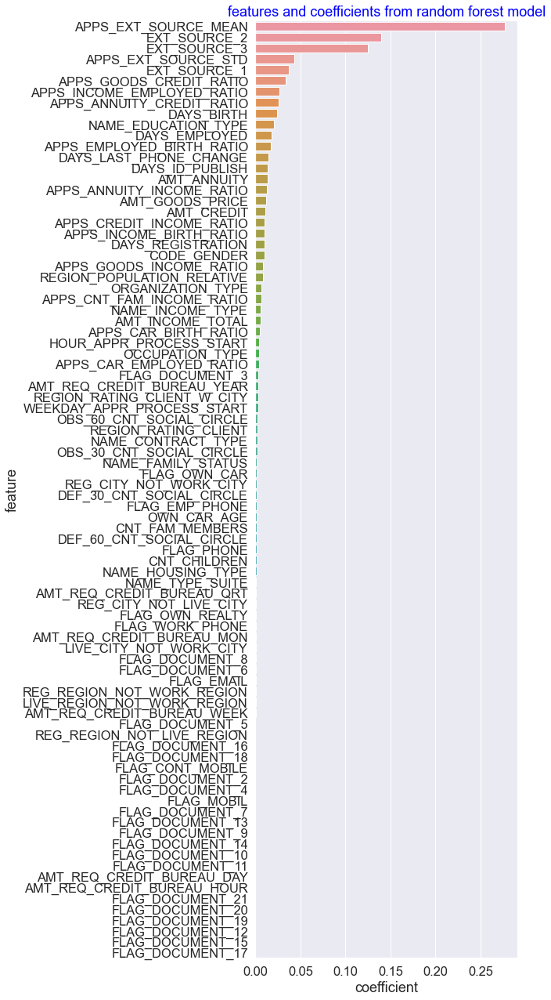

In [1846]:
plt.figure(figsize=(6,22))
plt.title('features and coefficients from random forest model',color='blue')
sns.barplot(y='feature',x='coefficient',data=params_df);

### Observation from above plot
- EXT_SOURCE, GOODS_CREDIT_RATIO, ANNUITY_CREDIT_RATIO, INCOME_EMPLOYED_RATIO are important features in predicting loan default. 
- Also all the above listed features are positively correlated with the TARGET

## Balancing Algorithm

We used above alogorithms withoutr balancing the TARGET class. We know that the class is highly imbalanced so we will use the SMOTE algorithm to balance the target class and will apply random forest algorithm after that

### SMOTE

#### Create X_train and y_train using SMOTE on original X_train and y_train

In [1847]:
#print('Original dataset shape %s' % Counter(y))
print('Original dataset shape \n{0}'.format(y_train.value_counts()))
smote = SMOTE(random_state=42)
X_train_smote,y_train_smote = smote.fit_resample(X_train,y_train)
#print('Resampled dataset shape %s' % Counter(y_oversampler))
print('Resampled dataset shape \n{0}'.format(
    pd.DataFrame(y_train_smote,columns=['TARGET'])['TARGET'].value_counts()))

Original dataset shape 
0    226149
1    19860 
Name: TARGET, dtype: int64
Resampled dataset shape 
1    226149
0    226149
Name: TARGET, dtype: int64


In [1848]:
X_train_smote.head()

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,APPS_EXT_SOURCE_MEAN,APPS_EXT_SOURCE_STD,APPS_ANNUITY_CREDIT_RATIO,APPS_GOODS_CREDIT_RATIO,APPS_ANNUITY_INCOME_RATIO,APPS_CREDIT_INCOME_RATIO,APPS_GOODS_INCOME_RATIO,APPS_CNT_FAM_INCOME_RATIO,APPS_EMPLOYED_BIRTH_RATIO,APPS_INCOME_EMPLOYED_RATIO,APPS_INCOME_BIRTH_RATIO,APPS_CAR_BIRTH_RATIO,APPS_CAR_EMPLOYED_RATIO
0,0,1,0,1,0,202500.0,406597.5,24700.5,351000.0,6,7,4,3,1,0.018801,-9461,-637,-3648.0,-2120,0.0,1,1,0,1,1,0,4,1.0,2,2,6,10,0,0,0,0,0,0,5,0.083037,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.161787,0.092026,0.060749,0.863262,0.121978,2.007889,1.733333,202500.0,0.067329,-317.896389,-21.403657,-0.000000,-0.00
1,0,0,0,0,0,270000.0,1293502.5,35698.5,1129500.0,1,4,1,1,1,0.003541,-16765,-1188,-1186.0,-291,0.0,1,1,0,1,1,0,1,2.0,1,1,1,11,0,0,0,0,0,0,39,0.311267,0.622246,0.535276,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.489596,0.160443,0.027598,0.873211,0.132217,4.790750,4.183333,135000.0,0.070862,-227.272727,-16.104981,-0.000000,-0.00
2,1,1,1,1,0,67500.0,135000.0,6750.0,135000.0,6,7,4,3,1,0.010032,-19046,-225,-4260.0,-2531,9.0,1,1,1,1,1,0,4,1.0,2,2,1,9,0,0,0,0,0,0,11,0.505998,0.555912,0.729567,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.597159,0.117353,0.050000,1.000000,0.100000,2.000000,2.000000,67500.0,0.011814,-300.000000,-3.544051,-0.000473,-0.04
3,0,0,0,1,0,135000.0,312682.5,29686.5,297000.0,6,7,4,0,1,0.008019,-19005,-3039,-9833.0,-2437,0.0,1,1,0,1,0,0,4,2.0,2,2,6,17,0,0,0,0,0,0,5,0.505998,0.650442,0.535276,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.563905,0.076359,0.094941,0.949845,0.219900,2.316167,2.200000,67500.0,0.159905,-44.422507,-7.103394,-0.000000,-0.00
4,0,1,0,1,0,121500.0,513000.0,21865.5,513000.0,6,7,4,3,1,0.028663,-19932,-3038,-4311.0,-3458,0.0,1,1,0,1,0,0,1,1.0,2,2,4,11,0,0,0,0,1,1,37,0.505998,0.322738,0.535276,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.454671,0.115191,0.042623,1.000000,0.179963,4.222222,4.222222,121500.0,0.152418,-39.993417,-6.095725,-0.000000,-0.00


In [1849]:
#Convert into dataframe
X_train_smote = pd.DataFrame(X_train_smote,columns=X_train.columns)
y_train_smote = pd.Series(y_train_smote)

## Model 4 - Random Forest with SMOTE

In [1850]:
#Lets use all columns of original X_train and apply transformation on only numerical continuous columns
#Use Transformer to only use scalar on continuous variables
transformer = ColumnTransformer(transformers=[('std_scaler', StandardScaler(), numerical_cols)])

#create RandomForest variable
#instead of using class_weight as 'balanced', lets give actual weight for classes
randomforest = RandomForestClassifier(class_weight='balanced')#'{1:0.9, 0:0.1}')

#initiate smote
smote = SMOTE(random_state=42)

#create pipeline
pipeline = make_pipeline(smote,transformer,randomforest)


#create parameters that will be used during randomsearch
params = {
    'randomforestclassifier__max_depth': [8,10],#[4,8,10], # maximum depth of the tree,
    'randomforestclassifier__min_samples_leaf': [50],#[50,80,100,120], #minimum sample observations at the leaf
    'randomforestclassifier__min_samples_split': [50],#[50,80,100,120], #minmum sample observations at the node during split
    'randomforestclassifier__max_features': [15,20],#[5,8,10,12,15,20], # number of features
    'randomforestclassifier__criterion': ['gini','entropy'],#['gini','entropy'], #function to measure quality of split
    'randomforestclassifier__n_estimators': [100],#[100,200,300], # no. of trees to be build
    }

#create RandomizedSearchCV object to find best param that we will use in our final model building process
randomforest_smote_randomsearch = RandomizedSearchCV(estimator = pipeline, param_distributions=params, verbose=1, scoring='roc_auc', 
                          n_jobs=-1,
                                                     return_train_score=True, n_iter=100
                         )

## Fit the model

In [1851]:
randomforest_smote_randomsearch.fit(X_train,y_train)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


RandomizedSearchCV(estimator=Pipeline(steps=[('smote', SMOTE(random_state=42)),
                                             ('columntransformer',
                                              ColumnTransformer(transformers=[('std_scaler',
                                                                               StandardScaler(),
                                                                               ['NAME_CONTRACT_TYPE',
                                                                                'CODE_GENDER',
                                                                                'FLAG_OWN_CAR',
                                                                                'FLAG_OWN_REALTY',
                                                                                'CNT_CHILDREN',
                                                                                'AMT_INCOME_TOTAL',
                                                                           

In [1852]:
# printing the optimal accuracy score and hyperparameters
print("best accuracy", randomforest_smote_randomsearch.best_score_)
print(randomforest_smote_randomsearch.best_params_)

best accuracy 0.687831220080624
{'randomforestclassifier__n_estimators': 100, 'randomforestclassifier__min_samples_split': 50, 'randomforestclassifier__min_samples_leaf': 50, 'randomforestclassifier__max_features': 20, 'randomforestclassifier__max_depth': 10, 'randomforestclassifier__criterion': 'gini'}


In [1853]:
# scores of RandomizedSearchCV
scores = randomforest_smote_randomsearch.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_randomforestclassifier__n_estimators,param_randomforestclassifier__min_samples_split,param_randomforestclassifier__min_samples_leaf,param_randomforestclassifier__max_features,param_randomforestclassifier__max_depth,param_randomforestclassifier__criterion,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,497.920477,0.945660,1.415876,0.041056,100,50,50,15,8,gini,"{'randomforestclassifier__n_estimators': 100, 'randomforestclassifier__min_samples_split': 50, 'randomforestclassifier__min_samples_leaf': 50, 'randomforestclassifier__max_features': 15, 'randomforestclassifier__max_depth': 8, 'randomforestclassifier__criterion': 'gini'}",0.683595,0.683484,0.682058,0.677757,0.686081,0.682595,0.002744,6,0.693451,0.694260,0.696839,0.693203,0.692918,0.694134,0.001424
1,567.781349,11.955192,1.547983,0.157622,100,50,50,20,8,gini,"{'randomforestclassifier__n_estimators': 100, 'randomforestclassifier__min_samples_split': 50, 'randomforestclassifier__min_samples_leaf': 50, 'randomforestclassifier__max_features': 20, 'randomforestclassifier__max_depth': 8, 'randomforestclassifier__criterion': 'gini'}",0.685886,0.684525,0.682560,0.678730,0.686651,0.683671,0.002834,5,0.696227,0.695602,0.696917,0.694870,0.694590,0.695641,0.000857
2,415.948486,106.832982,1.589325,0.093492,100,50,50,15,10,gini,"{'randomforestclassifier__n_estimators': 100, 'randomforestclassifier__min_samples_split': 50, 'randomforestclassifier__min_samples_leaf': 50, 'randomforestclassifier__max_features': 15, 'randomforestclassifier__max_depth': 10, 'randomforestclassifier__criterion': 'gini'}",0.689612,0.687013,0.685939,0.683586,0.690313,0.687293,0.002455,2,0.714415,0.712140,0.715476,0.713107,0.713413,0.713710,0.001143
3,403.622086,4.647234,1.658072,0.193420,100,50,50,20,10,gini,"{'randomforestclassifier__n_estimators': 100, 'randomforestclassifier__min_samples_split': 50, 'randomforestclassifier__min_samples_leaf': 50, 'randomforestclassifier__max_features': 20, 'randomforestclassifier__max_depth': 10, 'randomforestclassifier__criterion': 'gini'}",0.689874,0.687348,0.687325,0.684571,0.690039,0.687831,0.002008,1,0.716619,0.715054,0.717904,0.714878,0.714570,0.715805,0.001266
4,311.143535,4.585312,1.214396,0.021819,100,50,50,15,8,entropy,"{'randomforestclassifier__n_estimators': 100, 'randomforestclassifier__min_samples_split': 50, 'randomforestclassifier__min_samples_leaf': 50, 'randomforestclassifier__max_features': 15, 'randomforestclassifier__max_depth': 8, 'randomforestclassifier__criterion': 'entropy'}",0.683761,0.681891,0.680250,0.677344,0.686195,0.681888,0.003013,8,0.693130,0.691731,0.694437,0.692239,0.692627,0.692833,0.000924


### predict y_train data

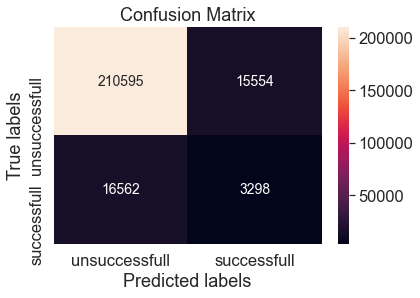

Accuracy score: 0.8694519306204245
Sensitivity score: 0.16606243705941592
Specificity score: 0.9312223357167178
f1-score: 0.17038644348005785
Precision score: 0.17494165075323573
Recall score: 0.16606243705941592
AUC: 0.71


In [1854]:
y_train_pred = randomforest_smote_randomsearch.predict(X_train)
# check area under curve
y_train_pred_prob = randomforest_smote_randomsearch.predict_proba(X_train)[:, 1]
y_train_pred_final, conf_matrix = createfinaldf_and_checkscores(y_train,
                                                                y_train_pred,y_train_pred_prob)

### <font size=3 color=blue>Lets check if we need to change the cutoff and see if senstivity and specificty can change</font>

In [1855]:
#check_cutoff(y_train_pred_final)
cutoff_df = check_cutoff(y_train_pred_final)
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0  0.0   0.080729  1.000000  0.000000
0.1  0.1   0.294306  0.953827  0.236388
0.2  0.2   0.542090  0.798691  0.519556
0.3  0.3   0.703925  0.583837  0.714471
0.4  0.4   0.806816  0.337613  0.848021
0.5  0.5   0.869452  0.166062  0.931222
0.6  0.6   0.901910  0.067724  0.975167
0.7  0.7   0.915723  0.014250  0.994888
0.8  0.8   0.919275  0.000151  0.999991
0.9  0.9   0.919271  0.000000  1.000000


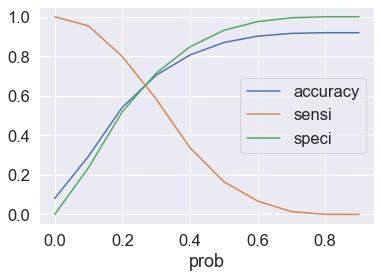

In [1856]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

### Observations from above plot
- 0.35 is the optimum point to take it as cutoff probability

### Based on the probability cutoff lets do predictions mapping again

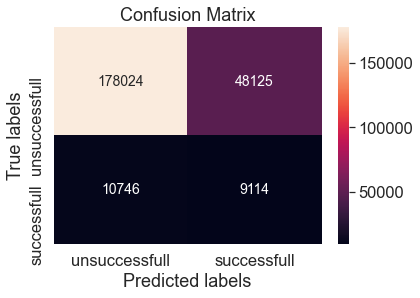

Accuracy score: 0.7606957469035686
Sensitivity score: 0.4589123867069486
Specificity score: 0.787197820905686
f1-score: 0.23642329991309877
Precision score: 0.159227100403571
Recall score: 0.4589123867069486
AUC: 0.71


In [1857]:
y_train_pred_final, conf_matrix = createfinaldf_and_checkscores(y_train,y_train_pred,y_train_pred_prob,
                                                                prob_cutoff=0.35)

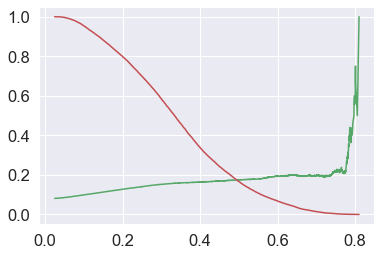

In [1858]:
p, r, thresholds = precision_recall_curve(y_train_pred_final['TARGET'], y_train_pred_final['TARGET_Prob'])
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

### Draw ROC Curve

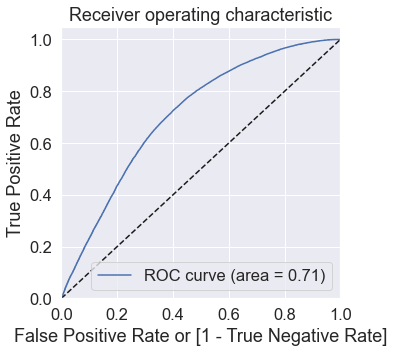

In [1859]:
draw_roc(y_train_pred_final['TARGET'],y_train_pred_final['TARGET_Prob'])

### Lets store results in results_df

In [1860]:
store_results(y_train_pred_final, #dataframe
              conf_matrix, #confusion_matrix
              'RandomForest_SMOTE', #model_name
              3, #location or index
              'train' #train or test set
             )

## Evaluate model on test data and check the score

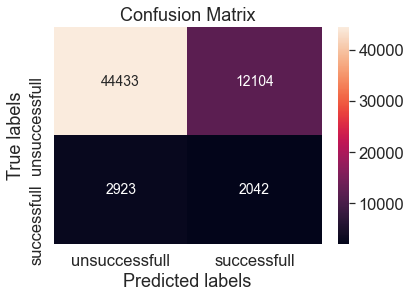

Accuracy score: 0.7556664823908166
Sensitivity score: 0.41127895266868075
Specificity score: 0.7859101119620779
f1-score: 0.21369891685416775
Precision score: 0.14435176021490173
Recall score: 0.41127895266868075
AUC: 0.68


In [1861]:
# predict fraud on test data
y_test_pred = randomforest_smote_randomsearch.predict(X_test)

# check area under curve
y_pred_prob = randomforest_smote_randomsearch.predict_proba(X_test)[:, 1]### Test model on test data and check the score 

# use funtcion to final predictions and confusion matrix
y_test_pred_final, conf_matrix = createfinaldf_and_checkscores(y_test,
                                                               y_test_pred,y_pred_prob,
                                                              prob_cutoff=0.35)# cutoff probability is 0.35

### Draw ROC Curve

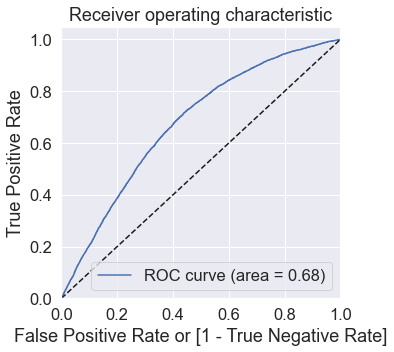

In [1862]:
draw_roc(y_test_pred_final['TARGET'],y_test_pred_final['TARGET_Prob'])

### Lets store results in results_df

In [1863]:
store_results(y_test_pred_final, #dataframe
              conf_matrix, #confusion_matrix
              'RandomForest_SMOTE', #model_name
              3, #location or index
              'test' #train or test set
             )

In [1864]:
results_df

,model_type,train_acc,train_sen,train_spec,train_f1,test_acc,test_sen,test_spec,test_f1
0,StatsModel,0.76,0.58,0.77,0.28,0.75,0.56,0.77,0.27
1,Logistic_RFE,0.75,0.59,0.76,0.27,0.74,0.57,0.76,0.27
2,RandomForest,0.79,0.61,0.8,0.32,0.78,0.54,0.8,0.28
3,RandomForest_SMOTE,0.76,0.46,0.79,0.24,0.76,0.41,0.79,0.21


### Feature Importance

In [1865]:
randomforest_smote_randomsearch.best_estimator_

Pipeline(steps=[('smote', SMOTE(random_state=42)),
                ('columntransformer',
                 ColumnTransformer(transformers=[('std_scaler',
                                                  StandardScaler(),
                                                  ['NAME_CONTRACT_TYPE',
                                                   'CODE_GENDER',
                                                   'FLAG_OWN_CAR',
                                                   'FLAG_OWN_REALTY',
                                                   'CNT_CHILDREN',
                                                   'AMT_INCOME_TOTAL',
                                                   'AMT_CREDIT', 'AMT_ANNUITY',
                                                   'AMT_GOODS_PRICE',
                                                   'NAME_TYPE_SUITE',
                                                   'NAME_INCOME_TYPE',
                                                   'NAME_EDUCATION_TYPE',


In [1866]:
#features list
features_list = randomforest_smote_randomsearch.best_estimator_.named_steps['columntransformer'].transformers[0][2]

#features importance
features_importance = list(randomforest_smote_randomsearch.best_estimator_.named_steps['randomforestclassifier'].feature_importances_)

#create dataframe with feature importance in percentage
params_df = pd.DataFrame({'feature':features_list,'coefficient':features_importance})
params_df = params_df.sort_values(by='coefficient',ascending=False).reset_index(drop=True)
params_df

,feature,coefficient
0,OWN_CAR_AGE,1.277124e-01
1,APPS_EXT_SOURCE_MEAN,1.195437e-01
2,EXT_SOURCE_3,9.055970e-02
3,OBS_60_CNT_SOCIAL_CIRCLE,8.979655e-02
4,OBS_30_CNT_SOCIAL_CIRCLE,8.692211e-02
5,AMT_REQ_CREDIT_BUREAU_YEAR,7.839123e-02
6,APPS_CAR_BIRTH_RATIO,6.793932e-02
7,EXT_SOURCE_2,5.798922e-02
8,FLAG_PHONE,4.866128e-02
9,APPS_CAR_EMPLOYED_RATIO,4.712856e-02


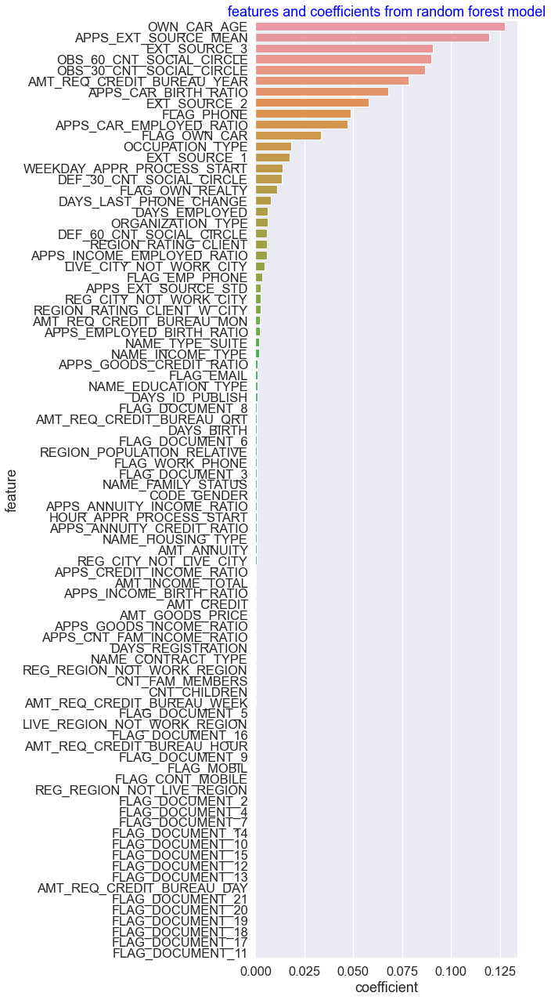

In [1867]:
plt.figure(figsize=(6,22))
plt.title('features and coefficients from random forest model',color='blue')
sns.barplot(y='feature',x='coefficient',data=params_df);

### Observation from above plot
- EXT_SOURCE, GOODS_CREDIT_RATIO, ANNUITY_CREDIT_RATIO, INCOME_EMPLOYED_RATIO are important features in predicting loan default. 
- Also all the above listed features are positively correlated with the TARGET

## XGBoost

In [1868]:
#Lets use all columns of original X_train and apply transformation on only numerical continuous columns
#Use Transformer to only use scalar on continuous variables
transformer = ColumnTransformer(transformers=[('std_scaler', StandardScaler(), numerical_cols)])

#create XGBoost variable
#using class_weight as 'balanced'
xgboost = XGBClassifier(class_weight='balanced')#'{1:0.9, 0:0.1}')

#initiate smote
smote = SMOTE(random_state=42)

#create pipeline
pipeline = make_pipeline(smote,transformer,xgboost)


# {'decisontree__criterion': 'entropy', 'decisontree__max_depth': 4, 'decisontree__max_features': 20, 
#  'decisontree__min_samples_leaf': 100, 'decisontree__min_samples_split': 120}

#create parameters that will be used during randomsearch
params = {
    'xgbclassifier__learning_rate': [0.02],#[0.01,0.02,0.03],# learning rate,
    'xgbclassifier__min_child_weight': [8],#[5,6,7,8,9], #minimum sum of weights of all observations required in a child
    'xgbclassifier__gamma': [2.5],#[1, 1.5, 2, 2.5, 3], #minimum loss reduction required to make a split
    'xgbclassifier__n_estimators': [250],#[200,250,300], # no. of trees to be build
    'xgbclassifier__colsample_bytree': [0.8],#[0.6, 0.8, 0.9, 1.0] #fraction of columns to be randomly samples for each tree
    }


#create RandomizedSearchCV object to find best param that we will use in our final model building process
xgboost_smote_randomsearch = RandomizedSearchCV(estimator = pipeline, param_distributions=params, verbose=1, scoring='roc_auc', 
                          n_jobs=-1, return_train_score=True
                         )

## Fit the model

In [1869]:
xgboost_smote_randomsearch.fit(X_train,y_train)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[12:28:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { class_weight } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:28:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


RandomizedSearchCV(estimator=Pipeline(steps=[('smote', SMOTE(random_state=42)),
                                             ('columntransformer',
                                              ColumnTransformer(transformers=[('std_scaler',
                                                                               StandardScaler(),
                                                                               ['NAME_CONTRACT_TYPE',
                                                                                'CODE_GENDER',
                                                                                'FLAG_OWN_CAR',
                                                                                'FLAG_OWN_REALTY',
                                                                                'CNT_CHILDREN',
                                                                                'AMT_INCOME_TOTAL',
                                                                           

In [1870]:
# printing the optimal accuracy score and hyperparameters
print("best accuracy", xgboost_smote_randomsearch.best_score_)
print(xgboost_smote_randomsearch.best_params_)

best accuracy 0.70586803505186
{'xgbclassifier__n_estimators': 250, 'xgbclassifier__min_child_weight': 8, 'xgbclassifier__learning_rate': 0.02, 'xgbclassifier__gamma': 2.5, 'xgbclassifier__colsample_bytree': 0.8}


In [1871]:
# scores of RandomizedSearchCV
scores = xgboost_smote_randomsearch.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_xgbclassifier__n_estimators,param_xgbclassifier__min_child_weight,param_xgbclassifier__learning_rate,param_xgbclassifier__gamma,param_xgbclassifier__colsample_bytree,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,515.579238,0.176663,0.354434,0.023547,250,8,0.02,2.5,0.8,"{'xgbclassifier__n_estimators': 250, 'xgbclassifier__min_child_weight': 8, 'xgbclassifier__learning_rate': 0.02, 'xgbclassifier__gamma': 2.5, 'xgbclassifier__colsample_bytree': 0.8}",0.706647,0.706624,0.702671,0.70634,0.707058,0.705868,0.001615,1,0.722617,0.724407,0.725398,0.723478,0.723378,0.723856,0.000958


### predict y_train data

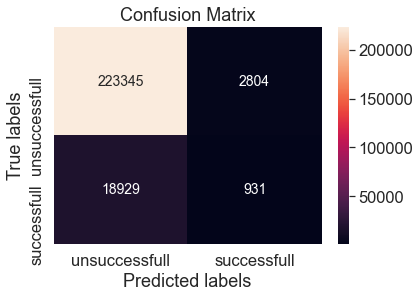

Accuracy score: 0.9116577035799504
Sensitivity score: 0.04687814702920443
Specificity score: 0.9876010948533931
f1-score: 0.07891502436956982
Precision score: 0.24926372155287818
Recall score: 0.04687814702920443
AUC: 0.72


In [1872]:
y_train_pred = xgboost_smote_randomsearch.predict(X_train)
# check area under curve
y_train_pred_prob = xgboost_smote_randomsearch.predict_proba(X_train)[:, 1]
y_train_pred_final, conf_matrix = createfinaldf_and_checkscores(y_train,
                                                                y_train_pred,y_train_pred_prob)

### <font size=3 color=blue>Lets check if we need to change the cutoff and see if senstivity and specificty can change</font>

In [1873]:
#check_cutoff(y_train_pred_final)
cutoff_df = check_cutoff(y_train_pred_final)
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0  0.0   0.080729  1.000000  0.000000
0.1  0.1   0.441752  0.869990  0.404145
0.2  0.2   0.718892  0.587059  0.730470
0.3  0.3   0.838181  0.329456  0.882856
0.4  0.4   0.890845  0.143051  0.956515
0.5  0.5   0.911658  0.046878  0.987601
0.6  0.6   0.917820  0.010473  0.997502
0.7  0.7   0.919190  0.001360  0.999792
0.8  0.8   0.919267  0.000000  0.999996
0.9  0.9   0.919271  0.000000  1.000000


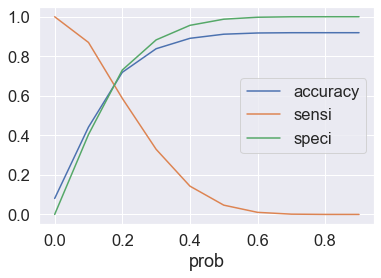

In [1874]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

### Observations from above plot
- 0.18 is the optimum point to take it as cutoff probability

### Based on the probability cutoff lets do predictions mapping again

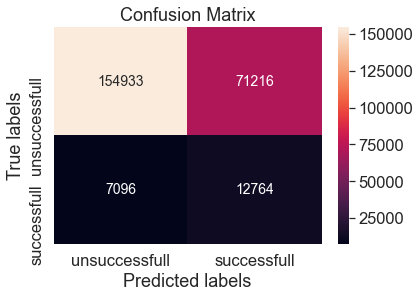

Accuracy score: 0.6816701827981904
Sensitivity score: 0.6426988922457201
Specificity score: 0.6850925717115707
f1-score: 0.24583975346687212
Precision score: 0.15198856870683497
Recall score: 0.6426988922457201
AUC: 0.72


In [1875]:
y_train_pred_final, conf_matrix = createfinaldf_and_checkscores(y_train,
                                                                y_train_pred,y_train_pred_prob,
                                                                prob_cutoff=0.18)#cutoff probability is 0.18

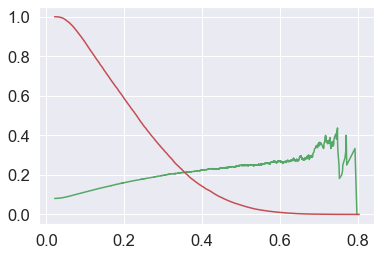

In [1876]:
p, r, thresholds = precision_recall_curve(y_train_pred_final['TARGET'], y_train_pred_final['TARGET_Prob'])
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

### Draw ROC Curve

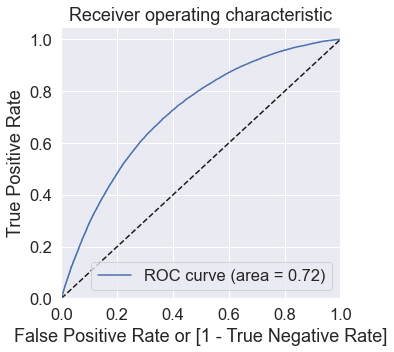

In [1877]:
draw_roc(y_train_pred_final['TARGET'],y_train_pred_final['TARGET_Prob'])

### Lets store results in results_df

In [1878]:
store_results(y_train_pred_final, #dataframe
              conf_matrix, #confusion_matrix
              'XGBoost_Smote', #model_name
              4, #location or index
              'train' #train or test set
             )

## Evaluate model on test data and check the score

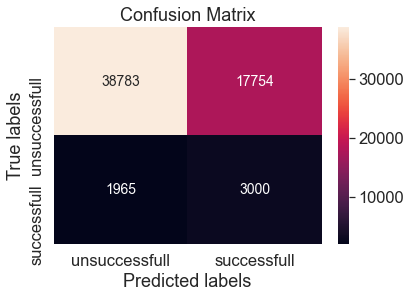

Accuracy score: 0.6793762804461644
Sensitivity score: 0.6042296072507553
Specificity score: 0.6859755558306949
f1-score: 0.23329056339671056
Precision score: 0.14455044810638912
Recall score: 0.6042296072507553
AUC: 0.7


In [1880]:
# predict fraud on test data
y_test_pred = xgboost_smote_randomsearch.predict(X_test)

# check area under curve
y_pred_prob = xgboost_smote_randomsearch.predict_proba(X_test)[:, 1]### Test model on test data and check the score 

# use funtcion to final predictions and confusion matrix
y_test_pred_final, conf_matrix = createfinaldf_and_checkscores(y_test,
                                                               y_test_pred,y_pred_prob,
                                                              prob_cutoff=0.18)# cutoff probability is 0.18

### Draw ROC Curve

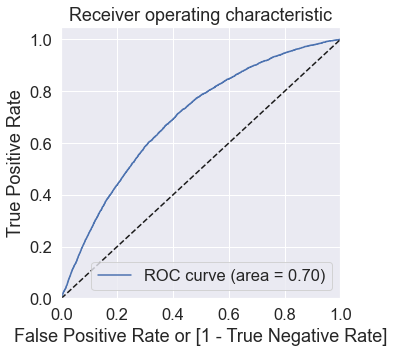

In [1881]:
draw_roc(y_test_pred_final['TARGET'],y_test_pred_final['TARGET_Prob'])

### Lets store results in results_df

In [1882]:
store_results(y_test_pred_final, #dataframe
              conf_matrix, #confusion_matrix
              'XGBoost_Smote', #model_name
              4, #location or index
              'test' #train or test set
             )

In [1884]:
results_df

,model_type,train_acc,train_sen,train_spec,train_f1,test_acc,test_sen,test_spec,test_f1
0,StatsModel,0.76,0.58,0.77,0.28,0.75,0.56,0.77,0.27
1,Logistic_RFE,0.75,0.59,0.76,0.27,0.74,0.57,0.76,0.27
2,RandomForest,0.79,0.61,0.8,0.32,0.78,0.54,0.8,0.28
3,RandomForest_SMOTE,0.76,0.46,0.79,0.24,0.76,0.41,0.79,0.21
4,XGBoost_Smote,0.68,0.64,0.69,0.25,0.68,0.6,0.69,0.23


# Conclusion
- RandomForest did a good job. RandomForest with Balancing Algorithm of SMOTE also did a good job.
- We will take RandomForest as the final model and will calculate Credit Score using this model

## Calculate Credit Score

### Lets merge LoanId again with the final predicted train and test dataframes

### For that lets get the full application_train dataframe prediction using final model

In [1885]:
X_copy = X.copy()

In [1886]:
X.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,APPS_EXT_SOURCE_MEAN,APPS_EXT_SOURCE_STD,APPS_ANNUITY_CREDIT_RATIO,APPS_GOODS_CREDIT_RATIO,APPS_ANNUITY_INCOME_RATIO,APPS_CREDIT_INCOME_RATIO,APPS_GOODS_INCOME_RATIO,APPS_CNT_FAM_INCOME_RATIO,APPS_EMPLOYED_BIRTH_RATIO,APPS_INCOME_EMPLOYED_RATIO,APPS_INCOME_BIRTH_RATIO,APPS_CAR_BIRTH_RATIO,APPS_CAR_EMPLOYED_RATIO
0,100002,0,1,0,1,0,202500.0,406597.5,24700.5,351000.0,6,7,4,3,1,0.018801,-9461,-637,-3648.0,-2120,0.0,1,1,0,1,1,0,4,1.0,2,2,6,10,0,0,0,0,0,0,5,0.083037,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.161787,0.092026,0.060749,0.863262,0.121978,2.007889,1.733333,202500.0,0.067329,-317.896389,-21.403657,-0.000000,-0.00
1,100003,0,0,0,0,0,270000.0,1293502.5,35698.5,1129500.0,1,4,1,1,1,0.003541,-16765,-1188,-1186.0,-291,0.0,1,1,0,1,1,0,1,2.0,1,1,1,11,0,0,0,0,0,0,39,0.311267,0.622246,0.535276,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.489596,0.160443,0.027598,0.873211,0.132217,4.790750,4.183333,135000.0,0.070862,-227.272727,-16.104981,-0.000000,-0.00
2,100004,1,1,1,1,0,67500.0,135000.0,6750.0,135000.0,6,7,4,3,1,0.010032,-19046,-225,-4260.0,-2531,9.0,1,1,1,1,1,0,4,1.0,2,2,1,9,0,0,0,0,0,0,11,0.505998,0.555912,0.729567,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.597159,0.117353,0.050000,1.000000,0.100000,2.000000,2.000000,67500.0,0.011814,-300.000000,-3.544051,-0.000473,-0.04
3,100006,0,0,0,1,0,135000.0,312682.5,29686.5,297000.0,6,7,4,0,1,0.008019,-19005,-3039,-9833.0,-2437,0.0,1,1,0,1,0,0,4,2.0,2,2,6,17,0,0,0,0,0,0,5,0.505998,0.650442,0.535276,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.563905,0.076359,0.094941,0.949845,0.219900,2.316167,2.200000,67500.0,0.159905,-44.422507,-7.103394,-0.000000,-0.00
4,100007,0,1,0,1,0,121500.0,513000.0,21865.5,513000.0,6,7,4,3,1,0.028663,-19932,-3038,-4311.0,-3458,0.0,1,1,0,1,0,0,1,1.0,2,2,4,11,0,0,0,0,1,1,37,0.505998,0.322738,0.535276,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.454671,0.115191,0.042623,1.000000,0.179963,4.222222,4.222222,121500.0,0.152418,-39.993417,-6.095725,-0.000000,-0.00


In [1887]:
X.drop(columns='SK_ID_CURR',inplace=True)

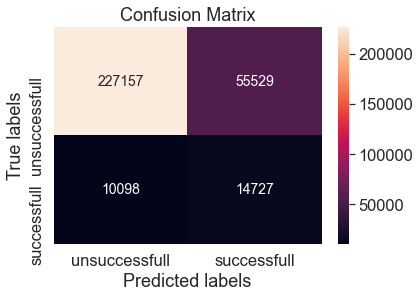

Accuracy score: 0.7865864960928227
Sensitivity score: 0.5932326283987915
Specificity score: 0.8035665013477852
f1-score: 0.30977797877599095
Precision score: 0.20961910726485994
Recall score: 0.5932326283987915
AUC: 0.79


In [1888]:
y_pred_complete = randomforest_randomsearch.predict(X)
# check area under curve
y_pred_prob_complete = randomforest_randomsearch.predict_proba(X)[:, 1]
y_pred_complete_final, conf_matrix = createfinaldf_and_checkscores(y,y_pred_complete,y_pred_prob_complete,
                                                               prob_cutoff=0.55)

In [1889]:
y_pred_complete_final.head()

,TARGET,TARGET_Prob,TARGETID,predicted
0,1,0.832193,0,1
1,0,0.365475,1,0
2,0,0.254110,2,0
3,0,0.313176,3,0
4,0,0.534037,4,0


In [1890]:
y_pred_complete_final.drop(columns='TARGETID',inplace=True)

In [1891]:
y_pred_complete_final.head()

,TARGET,TARGET_Prob,predicted
0,1,0.832193,1
1,0,0.365475,0
2,0,0.254110,0
3,0,0.313176,0
4,0,0.534037,0


In [1892]:
pred_df = pd.concat([X_copy['SK_ID_CURR'],y_pred_complete_final],axis=1)
pred_df.head()

,SK_ID_CURR,TARGET,TARGET_Prob,predicted
0,100002,1,0.832193,1
1,100003,0,0.365475,0
2,100004,0,0.254110,0
3,100006,0,0.313176,0
4,100007,0,0.534037,0


In [1893]:
pred_df = pred_df[['SK_ID_CURR','TARGET_Prob','TARGET','predicted']]
pred_df.head()

,SK_ID_CURR,TARGET_Prob,TARGET,predicted
0,100002,0.832193,1,1
1,100003,0.365475,0,0
2,100004,0.254110,0,0
3,100006,0.313176,0,0
4,100007,0.534037,0,0


### Calculate Credit Score

In [1894]:
#Function to calculate Credit Score
def calculate_application_score(target_prob_df):
    odd_good = (1-target_prob_df['TARGET_Prob'])/target_prob_df['TARGET_Prob']
    slope = 20/(np.log(20)-np.log(10))
    score = 400 + slope * (np.log(odd_good) - np.log(10))
    return score

In [1895]:
pred_df['Score'] = calculate_application_score(pred_df)
pred_df.head()

,SK_ID_CURR,TARGET_Prob,TARGET,predicted,Score
0,100002,0.832193,1,1,287.359046
1,100003,0.365475,0,0,349.479517
2,100004,0.254110,0,0,364.631640
3,100006,0.313176,0,0,356.220802
4,100007,0.534037,0,0,329.626911


### Calculate threshold Cutoff credit score

In [1896]:
odd_good = (1-threshold_cutoff_prob)/threshold_cutoff_prob
slope = 20/(np.log(20)-np.log(10))
threshold_credit_score = 400 + slope * (np.log(odd_good) - np.log(10))
print('Threshold credit score: {0}'.format(threshold_credit_score))

Threshold credit score: 327.771305758353


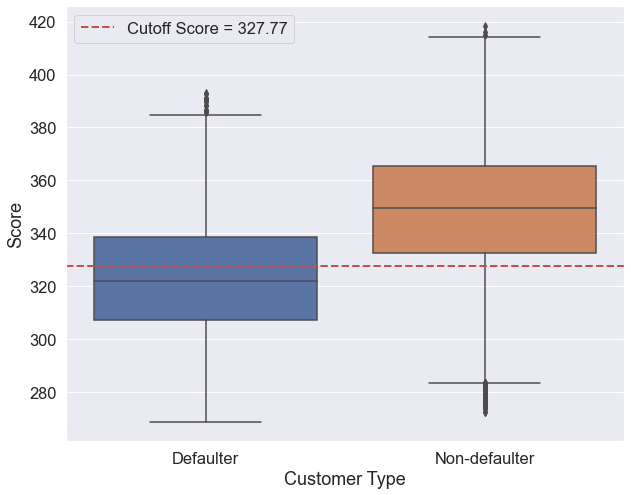

In [1897]:
plt.figure(figsize=(10,8))
ax = sns.boxplot(y=pred_df['Score'],x=pred_df['TARGET'].apply(lambda x:'Non-defaulter' if x==0 else 'Defaulter'))
plt.axhline(threshold_credit_score, label='Cutoff Score = %0.2f' %threshold_credit_score,color='r',linestyle='--',linewidth=2)
ax.set_xlabel('Customer Type')
plt.legend(loc="upper left")
plt.show()

### Observation
- Mean and median of Non-defaulter is higher than the defaulters
- There are some outliers in defaulters with high credit score as well

### Min and max credit scores of defaulters and non-defaulters

In [1898]:
print('Minimum credit score of non-defaulter is : {0}'.format(round(pred_df[pred_df['TARGET']==0]['Score'].min(),2)))

Minimum credit score of non-defaulter is : 272.25


In [1899]:
print('Maximum credit score of non-defaulter is : {0}'.format(round(pred_df[pred_df['TARGET']==0]['Score'].max(),2)))

Maximum credit score of non-defaulter is : 418.29


In [1900]:
print('Minimum credit score of defaulter is : {0}'.format(round(pred_df[pred_df['TARGET']==1]['Score'].min(),2)))

Minimum credit score of defaulter is : 268.79


In [1901]:
print('Maximum credit score of defaulter is : {0}'.format(round(pred_df[pred_df['TARGET']==1]['Score'].max(),2)))

Maximum credit score of defaulter is : 392.86


## Gain and Lift Charts

#### Lets create deciles based on Target Probabilities

In [1902]:
decile_df = pred_df[['TARGET_Prob','TARGET','predicted']].copy()
decile_df.head()

,TARGET_Prob,TARGET,predicted
0,0.832193,1,1
1,0.365475,0,0
2,0.254110,0,0
3,0.313176,0,0
4,0.534037,0,0


In [1903]:
decile_df['decile'] = pd.qcut(decile_df['TARGET_Prob'].rank(method='first'), 10, labels=np.arange(10, 0, -1))
decile_df.head()

,TARGET_Prob,TARGET,predicted,decile
0,0.832193,1,1,1
1,0.365475,0,0,6
2,0.254110,0,0,8
3,0.313176,0,0,7
4,0.534037,0,0,3


In [1904]:
lift_df = decile_df.groupby('decile')['TARGET_Prob'].count().reset_index()
lift_df.rename({'TARGET_Prob':'total'}, axis=1, inplace=True)

In [1905]:
lift_df_pred = decile_df[decile_df['TARGET']==1].groupby('decile')['TARGET'].count().reset_index()
lift_df_pred.head()

,decile,TARGET
0,10,103
1,9,347
2,8,681
3,7,961
4,6,1352


In [1906]:
lift_df_final = lift_df.merge(lift_df_pred,on = 'decile')
lift_df_final = lift_df_final.sort_values(['decile'], ascending=False)
lift_df_final['cum_default'] = lift_df_final['TARGET'].cumsum()
lift_df_final['gain_pcnt'] = 100*(lift_df_final['cum_default']/sum(lift_df_final['TARGET']))
lift_df_final['cumlift'] = lift_df_final['gain_pcnt']/(lift_df_final['decile'].astype('int')*(100/10))
lift_df_final.reset_index(drop=True)

,decile,total,TARGET,cum_default,gain_pcnt,cumlift
0,1,30751,8981,8981,36.177241,3.617724
1,2,30751,4714,13695,55.166163,2.758308
2,3,30751,3298,16993,68.451158,2.281705
3,4,30751,2513,19506,78.574018,1.964350
4,5,30751,1875,21381,86.126888,1.722538
5,6,30751,1352,22733,91.573011,1.526217
6,7,30751,961,23694,95.444109,1.363487
7,8,30751,681,24375,98.187311,1.227341
8,9,30751,347,24722,99.585096,1.106501
9,10,30752,103,24825,100.000000,1.000000


### Observation
- We can conclude that we can predict 85% of the total defaulters by analysing only 50% of the client base

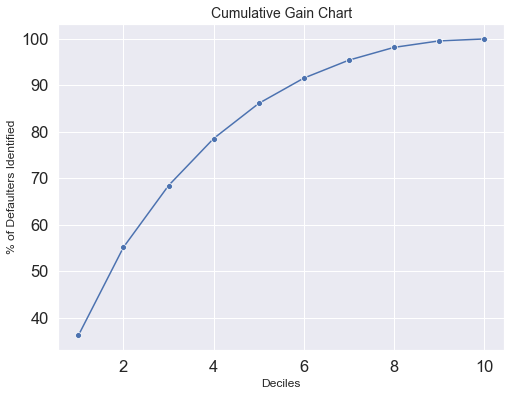

In [1907]:
plt.figure(figsize=(8,6))
ax = sns.lineplot(data=lift_df_final,x='decile', y='gain_pcnt', marker="o")
ax.set_title("Cumulative Gain Chart",fontsize=14)
ax.set_xlabel("Deciles",fontsize=12)
ax.set_ylabel("% of Defaulters Identified",fontsize=12)
plt.show()

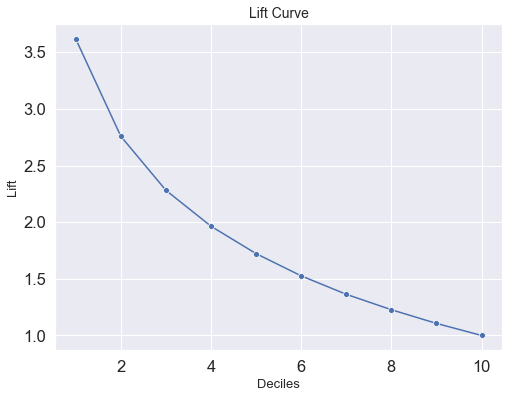

In [1908]:
plt.figure(figsize=(8,6))
ax = sns.lineplot(data=lift_df_final,x='decile', y='cumlift',marker="o")
ax.set_title("Lift Curve",fontsize=14)
ax.set_xlabel("Deciles",fontsize=13)
ax.set_ylabel("Lift",fontsize=13)
plt.show()

# <font color=darkblue size=6>Using all other files</font>

# <font color=darkblue size=6>previous_application.csv</font>

In [1909]:
prev_app_df = pd.read_csv('./data/previous_application.csv')
prev_app_df.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


# Check for Data Types and Column Names

In [1910]:
prev_app_df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

## Observation from above data info
- There are total 37 columns
- 16 Columns are categorical
- 21 Columns are numerical

## Check for missing values

In [1911]:
pd.DataFrame([[prev_app_df.shape],
             [prev_app_df.isnull().sum().sum()],
             [prev_app_df.duplicated().sum()]
             ],
            columns=['Previous applications data set'],
            index=['Shape','Missingness','Duplicates'])

,Previous applications data set
Shape,"(1670214, 37)"
Missingness,11109336
Duplicates,0


## Look for missing value percentage

In [1912]:
percent_missing = prev_app_df.isnull().sum()*100/len(prev_app_df)
missing_df = pd.DataFrame({'column_name':prev_app_df.columns,
                          'missing_percentage':percent_missing})
missing_df

,column_name,missing_percentage
SK_ID_PREV,SK_ID_PREV,0.000000
SK_ID_CURR,SK_ID_CURR,0.000000
NAME_CONTRACT_TYPE,NAME_CONTRACT_TYPE,0.000000
AMT_ANNUITY,AMT_ANNUITY,22.286665
AMT_APPLICATION,AMT_APPLICATION,0.000000
AMT_CREDIT,AMT_CREDIT,0.000060
AMT_DOWN_PAYMENT,AMT_DOWN_PAYMENT,53.636480
AMT_GOODS_PRICE,AMT_GOODS_PRICE,23.081773
WEEKDAY_APPR_PROCESS_START,WEEKDAY_APPR_PROCESS_START,0.000000
HOUR_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,0.000000


Group by SK_ID_CURR and chek for the number of previous applications ids per SK_ID_CURR

In [1913]:
prev_app_df.groupby('SK_ID_CURR')['SK_ID_CURR'].value_counts().head()

SK_ID_CURR  SK_ID_CURR
100001      100001        1
100002      100002        1
100003      100003        3
100004      100004        1
100005      100005        2
Name: SK_ID_CURR, dtype: int64

### Observation
- We can see there are many previous applications ids available per SK_ID_CURR
- We will aggregate the data of these various bureau ids per SK_ID_CURR. We will create new columns for this purpose
- We will then concatenate update bureau data frame (grouped by SK_ID_CURR) with main application dataframe

In [1914]:
prev_app_df.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1670214.00000,1670214.00000,1297979.00000,1670214.00000,1670213.00000,774370.00000,1284699.00000,1670214.00000,1670214.00000,774370.00000,5951.00000,5951.00000,1670214.00000,1670214.00000,1297984.00000,997149.00000,997149.00000,997149.00000,997149.00000,997149.00000,997149.00000
mean,1923089.13533,278357.17410,15955.12066,175233.86036,196114.02122,6697.40214,227847.27928,12.48418,0.99647,0.07964,0.18836,0.77350,-880.67967,313.95112,16.05408,342209.85504,13826.26934,33767.77405,76582.40306,81992.34384,0.33257
std,532597.95870,102814.82385,14782.13733,292779.76239,318574.61655,20921.49541,315396.55794,3.33403,0.05933,0.10782,0.08767,0.10088,779.09967,7127.44346,14.56729,88916.11583,72444.86971,106857.03479,149647.41512,153303.51673,0.47113
min,1000001.00000,100001.00000,0.00000,0.00000,0.00000,-0.90000,0.00000,0.00000,0.00000,-0.00001,0.03478,0.37315,-2922.00000,-1.00000,0.00000,-2922.00000,-2892.00000,-2801.00000,-2889.00000,-2874.00000,0.00000
25%,1461857.25000,189329.00000,6321.78000,18720.00000,24160.50000,0.00000,50841.00000,10.00000,1.00000,0.00000,0.16072,0.71564,-1300.00000,-1.00000,6.00000,365243.00000,-1628.00000,-1242.00000,-1314.00000,-1270.00000,0.00000
50%,1923110.50000,278714.50000,11250.00000,71046.00000,80541.00000,1638.00000,112320.00000,12.00000,1.00000,0.05161,0.18912,0.83510,-581.00000,3.00000,12.00000,365243.00000,-831.00000,-361.00000,-537.00000,-499.00000,0.00000
75%,2384279.75000,367514.00000,20658.42000,180360.00000,216418.50000,7740.00000,234000.00000,15.00000,1.00000,0.10891,0.19333,0.85254,-280.00000,82.00000,24.00000,365243.00000,-411.00000,129.00000,-74.00000,-44.00000,1.00000
max,2845382.00000,456255.00000,418058.14500,6905160.00000,6905160.00000,3060045.00000,6905160.00000,23.00000,1.00000,1.00000,1.00000,1.00000,-1.00000,4000000.00000,84.00000,365243.00000,365243.00000,365243.00000,365243.00000,365243.00000,1.00000


## Data Analysis

## SK_ID_CURR wrt NAME_CONTRACT_STATUS

In [1915]:
status_list = list(prev_app_df['NAME_CONTRACT_STATUS'].value_counts().index)
status_list

['Approved', 'Canceled', 'Refused', 'Unused offer']

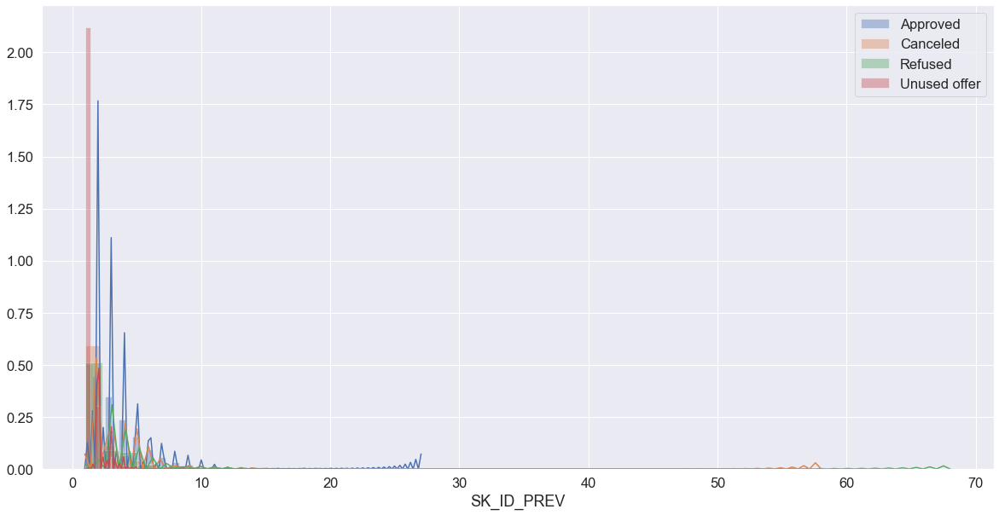

In [1916]:
plt.figure(figsize=(20,10))
for status in status_list:
    sns.distplot(prev_app_df[prev_app_df['NAME_CONTRACT_STATUS']==status].
                 groupby('SK_ID_CURR')['SK_ID_PREV'].count(), label=status , kde_kws={'bw':0.01})
plt.legend();

### LOAN STATUS AND REASON

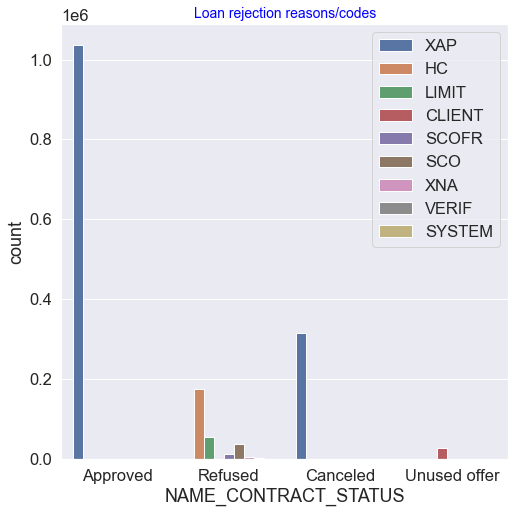

In [1917]:
plt.figure(figsize=(8,8))
plt.title('Loan rejection reasons/codes',color='blue',fontsize=14)
sns.countplot(x='NAME_CONTRACT_STATUS',data=prev_app_df,hue='CODE_REJECT_REASON');
plt.legend(loc='upper right');

## Feature Engineering

#### Lets get the difference of application amount and credit amount,goods price, days last due etc. 

In [1918]:
prev_app_df['CREDIT_DIFF'] = prev_app_df['AMT_APPLICATION'] - prev_app_df['AMT_CREDIT']
prev_app_df['GOODS_DIFF'] = prev_app_df['AMT_APPLICATION'] - prev_app_df['AMT_GOODS_PRICE']
prev_app_df['CREDIT_APPL_RATIO'] = prev_app_df['AMT_CREDIT']/prev_app_df['AMT_APPLICATION']
prev_app_df['GOODS_APPL_RATIO'] = prev_app_df['AMT_GOODS_PRICE']/prev_app_df['AMT_APPLICATION']

# Data Cleansing
prev_app_df['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
prev_app_df['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
prev_app_df['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
prev_app_df['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
prev_app_df['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)

# substraction between DAYS_LAST_DUE_1ST_VERSION and DAYS_LAST_DUE
prev_app_df['DAYS_LAST_DUE_DIFF'] = prev_app_df['DAYS_LAST_DUE_1ST_VERSION'] - prev_app_df['DAYS_LAST_DUE']

# 1.Calculate the interest rate
all_pay = prev_app_df['AMT_ANNUITY'] * prev_app_df['CNT_PAYMENT']
prev_app_df['INTERESTS_RATE'] = (all_pay/prev_app_df['AMT_CREDIT'] - 1)/prev_app_df['CNT_PAYMENT']
prev_app_df.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL,CREDIT_DIFF,GOODS_DIFF,CREDIT_APPL_RATIO,GOODS_APPL_RATIO,DAYS_LAST_DUE_DIFF,INTERESTS_RATE
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,NaN,-42.0,300.0,-42.0,-37.0,0.0,0.0,0.0,1.00000,1.0,342.0,0.017596
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,NaN,-134.0,916.0,NaN,NaN,1.0,-72171.0,0.0,1.11880,1.0,NaN,0.009282
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,NaN,-271.0,59.0,NaN,NaN,1.0,-23944.5,0.0,1.21284,1.0,NaN,0.027047
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,NaN,-482.0,-152.0,-182.0,-177.0,1.0,-20790.0,0.0,1.04620,1.0,30.0,0.016587
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN,-66555.0,0.0,1.19720,1.0,NaN,0.037343


#### Lets aggregate original previous application data using min, max, mean, sum aggregate operations. We will average out the data

In [1919]:
#create a dictionary with column names as keys and aggregate operations to be performed as values
prev_app_agg_dict = {
    'SK_ID_CURR':['count'], # this will give us count of how many bureau ids per SK_ID_CURR
    'AMT_CREDIT':['mean', 'max', 'sum'],
    'AMT_ANNUITY':['mean', 'max', 'sum'], 
    'AMT_APPLICATION':['mean', 'max', 'sum'],
    'AMT_DOWN_PAYMENT':['mean', 'max', 'sum'],
    'AMT_GOODS_PRICE':['mean', 'max', 'sum'],
    'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
    'DAYS_DECISION': ['min', 'max', 'mean'],
    'CNT_PAYMENT': ['mean', 'sum'],
    # Also aggregate our own created new columns
    'CREDIT_DIFF':['mean', 'max', 'sum'], 
    'CREDIT_APPL_RATIO':['mean', 'max'],
    'GOODS_DIFF':['mean', 'max', 'sum'],
    'GOODS_APPL_RATIO':['mean', 'max'],
    'DAYS_LAST_DUE_DIFF':['mean', 'max', 'sum'],
    'INTERESTS_RATE':['mean', 'max']
  }
prev_app_group = prev_app_df.groupby('SK_ID_CURR')
prev_app_agg_amt_df = prev_app_group.agg(prev_app_agg_dict)

prev_app_agg_amt_df.columns = ['PREV_'+ ('_').join(column).upper() for column in prev_app_agg_amt_df.columns.ravel()]

prev_app_agg_amt_df = prev_app_agg_amt_df.reset_index()

print(prev_app_agg_amt_df.shape)
prev_app_agg_amt_df.head()

(338857, 40)


,SK_ID_CURR,PREV_SK_ID_CURR_COUNT,PREV_AMT_CREDIT_MEAN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_SUM,PREV_AMT_ANNUITY_MEAN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_SUM,PREV_AMT_APPLICATION_MEAN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_SUM,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_SUM,PREV_AMT_GOODS_PRICE_MEAN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_SUM,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,PREV_CREDIT_DIFF_MEAN,PREV_CREDIT_DIFF_MAX,PREV_CREDIT_DIFF_SUM,PREV_CREDIT_APPL_RATIO_MEAN,PREV_CREDIT_APPL_RATIO_MAX,PREV_GOODS_DIFF_MEAN,PREV_GOODS_DIFF_MAX,PREV_GOODS_DIFF_SUM,PREV_GOODS_APPL_RATIO_MEAN,PREV_GOODS_APPL_RATIO_MAX,PREV_DAYS_LAST_DUE_DIFF_MEAN,PREV_DAYS_LAST_DUE_DIFF_MAX,PREV_DAYS_LAST_DUE_DIFF_SUM,PREV_INTERESTS_RATE_MEAN,PREV_INTERESTS_RATE_MAX
0,100001,1,23787.00,23787.0,23787.0,3951.000,3951.000,3951.000,24835.50,24835.5,24835.5,2520.0,2520.0,2520.0,24835.5,24835.5,24835.5,0.104326,0.104326,0.104326,-1740,-1740,-1740.0,8.0,8.0,1048.5,1048.5,1048.5,0.957782,0.957782,0.0,0.0,0.0,1.0,1.0,120.0,120.0,120.0,0.041099,0.041099
1,100002,1,179055.00,179055.0,179055.0,9251.775,9251.775,9251.775,179055.00,179055.0,179055.0,0.0,0.0,0.0,179055.0,179055.0,179055.0,0.000000,0.000000,0.000000,-606,-606,-606.0,24.0,24.0,0.0,0.0,0.0,1.000000,1.000000,0.0,0.0,0.0,1.0,1.0,150.0,150.0,150.0,0.010003,0.010003
2,100003,3,484191.00,1035882.0,1452573.0,56553.990,98356.995,169661.970,435436.50,900000.0,1306309.5,3442.5,6885.0,6885.0,435436.5,900000.0,1306309.5,0.000000,0.100061,0.050030,-2341,-746,-1305.0,10.0,30.0,-48754.5,756.0,-146263.5,1.057664,1.150980,0.0,0.0,0.0,1.0,1.0,50.0,150.0,150.0,0.015272,0.018533
3,100004,1,20106.00,20106.0,20106.0,5357.250,5357.250,5357.250,24282.00,24282.0,24282.0,4860.0,4860.0,4860.0,24282.0,24282.0,24282.0,0.212008,0.212008,0.212008,-815,-815,-815.0,4.0,4.0,4176.0,4176.0,4176.0,0.828021,0.828021,0.0,0.0,0.0,1.0,1.0,30.0,30.0,30.0,0.016450,0.016450
4,100005,2,20076.75,40153.5,40153.5,4813.200,4813.200,4813.200,22308.75,44617.5,44617.5,4464.0,4464.0,4464.0,44617.5,44617.5,44617.5,0.108964,0.108964,0.108964,-757,-315,-536.0,12.0,12.0,2232.0,4464.0,4464.0,0.899950,0.899950,0.0,0.0,0.0,1.0,1.0,90.0,90.0,90.0,0.036537,0.036537


#### Lets aggregate previous approved and refused applications 

In [1920]:
prev_app_df.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL,CREDIT_DIFF,GOODS_DIFF,CREDIT_APPL_RATIO,GOODS_APPL_RATIO,DAYS_LAST_DUE_DIFF,INTERESTS_RATE
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,NaN,-42.0,300.0,-42.0,-37.0,0.0,0.0,0.0,1.00000,1.0,342.0,0.017596
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,NaN,-134.0,916.0,NaN,NaN,1.0,-72171.0,0.0,1.11880,1.0,NaN,0.009282
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,NaN,-271.0,59.0,NaN,NaN,1.0,-23944.5,0.0,1.21284,1.0,NaN,0.027047
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,NaN,-482.0,-152.0,-182.0,-177.0,1.0,-20790.0,0.0,1.04620,1.0,30.0,0.016587
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN,-66555.0,0.0,1.19720,1.0,NaN,0.037343


In [1921]:
prev_app_appr_ref_group = prev_app_df[prev_app_df['NAME_CONTRACT_STATUS'
                                   ].isin(['Approved', 'Refused'])
                              ].groupby([ 'SK_ID_CURR', 'NAME_CONTRACT_STATUS'])
# unstack() 
prev_app_agg_appr_ref_df = prev_app_appr_ref_group['SK_ID_CURR'].count().unstack()

# rename column 
prev_app_agg_appr_ref_df.columns = ['PREV_APPROVED_COUNT', 'PREV_REFUSED_COUNT' ]

prev_app_agg_appr_ref_df = prev_app_agg_appr_ref_df.fillna(0)
print(prev_app_agg_appr_ref_df.shape)
prev_app_agg_appr_ref_df.head()

(338402, 2)


,PREV_APPROVED_COUNT,PREV_REFUSED_COUNT
SK_ID_CURR,,
100001,1.0,0.0
100002,1.0,0.0
100003,3.0,0.0
100004,1.0,0.0
100005,1.0,0.0


#### Lets aggregate original previous application data using min, max, mean, sum aggregate operations. We will average out the data

In [1922]:
prev_app_days365 = prev_app_df['DAYS_DECISION'] > -365
prev_app_days365_grp = prev_app_df[prev_app_days365].groupby('SK_ID_CURR')

#create a dictionary with column names as keys and aggregate operations to be performed as values
agg_dict = { 
  'SK_ID_CURR':['count'],
  'AMT_CREDIT':['mean', 'max', 'sum'],
  'AMT_ANNUITY':['mean', 'max', 'sum'], 
  'AMT_APPLICATION':['mean', 'max', 'sum'],
  'AMT_DOWN_PAYMENT':['mean', 'max', 'sum'],
  'AMT_GOODS_PRICE':['mean', 'max', 'sum'],
  'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
  'DAYS_DECISION': ['min', 'max', 'mean'],
  'CNT_PAYMENT': ['mean', 'sum'],
  # Also aggregate our own created new columns
  'CREDIT_DIFF':['mean', 'max', 'sum'], 
  'CREDIT_APPL_RATIO':['mean', 'max'],
  'GOODS_DIFF':['mean', 'max', 'sum'],
  'GOODS_APPL_RATIO':['mean', 'max'],
  'DAYS_LAST_DUE_DIFF':['mean', 'max', 'sum'],
  'INTERESTS_RATE':['mean', 'max']
}

prev_app_agg_days365_df = prev_app_days365_grp.agg(agg_dict)

prev_app_agg_days365_df.columns = ['PREV_365_'+ ('_').join(column).upper() for column in prev_app_agg_days365_df.columns.ravel()]

prev_app_agg_days365_df = prev_app_agg_days365_df.reset_index()

print(prev_app_agg_days365_df.shape)
prev_app_agg_days365_df.head()


(195158, 40)


,SK_ID_CURR,PREV_365_SK_ID_CURR_COUNT,PREV_365_AMT_CREDIT_MEAN,PREV_365_AMT_CREDIT_MAX,PREV_365_AMT_CREDIT_SUM,PREV_365_AMT_ANNUITY_MEAN,PREV_365_AMT_ANNUITY_MAX,PREV_365_AMT_ANNUITY_SUM,PREV_365_AMT_APPLICATION_MEAN,PREV_365_AMT_APPLICATION_MAX,PREV_365_AMT_APPLICATION_SUM,PREV_365_AMT_DOWN_PAYMENT_MEAN,PREV_365_AMT_DOWN_PAYMENT_MAX,PREV_365_AMT_DOWN_PAYMENT_SUM,PREV_365_AMT_GOODS_PRICE_MEAN,PREV_365_AMT_GOODS_PRICE_MAX,PREV_365_AMT_GOODS_PRICE_SUM,PREV_365_RATE_DOWN_PAYMENT_MIN,PREV_365_RATE_DOWN_PAYMENT_MAX,PREV_365_RATE_DOWN_PAYMENT_MEAN,PREV_365_DAYS_DECISION_MIN,PREV_365_DAYS_DECISION_MAX,PREV_365_DAYS_DECISION_MEAN,PREV_365_CNT_PAYMENT_MEAN,PREV_365_CNT_PAYMENT_SUM,PREV_365_CREDIT_DIFF_MEAN,PREV_365_CREDIT_DIFF_MAX,PREV_365_CREDIT_DIFF_SUM,PREV_365_CREDIT_APPL_RATIO_MEAN,PREV_365_CREDIT_APPL_RATIO_MAX,PREV_365_GOODS_DIFF_MEAN,PREV_365_GOODS_DIFF_MAX,PREV_365_GOODS_DIFF_SUM,PREV_365_GOODS_APPL_RATIO_MEAN,PREV_365_GOODS_APPL_RATIO_MAX,PREV_365_DAYS_LAST_DUE_DIFF_MEAN,PREV_365_DAYS_LAST_DUE_DIFF_MAX,PREV_365_DAYS_LAST_DUE_DIFF_SUM,PREV_365_INTERESTS_RATE_MEAN,PREV_365_INTERESTS_RATE_MAX
0,100005,1,0.000000,0.0,0.0,NaN,NaN,0.000,0.000000,0.0,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,-315,-315,-315.000000,NaN,0.0,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN
1,100006,7,302792.142857,906615.0,2119545.0,24867.405,32696.10,99469.620,281202.428571,688500.0,1968417.0,66987.0,66987.0,66987.0,492104.25,688500.0,1968417.0,0.217830,0.217830,0.217830,-311,-181,-199.571429,27.000000,108.0,-21589.714286,66987.0,-151128.0,1.029197,1.316797,0.0,0.0,0.0,1.0,1.0,1410.0,1410.0,1410.0,-inf,0.025007
2,100008,1,0.000000,0.0,0.0,NaN,NaN,0.000,0.000000,0.0,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,-82,-82,-82.000000,NaN,0.0,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN
3,100009,3,57300.000000,88632.0,171900.0,8913.555,10418.67,26740.665,61057.500000,95841.0,183172.5,7704.0,14377.5,23112.0,61057.50,95841.0,183172.5,0.103378,0.152009,0.119599,-308,-74,-229.000000,7.333333,22.0,3757.500000,7209.0,11272.5,0.943909,0.953504,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.025346,0.030703
4,100012,1,0.000000,0.0,0.0,NaN,NaN,0.000,0.000000,0.0,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,-107,-107,-107.000000,NaN,0.0,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN


### Merge previous application data with aggregations of previous applications

In [1923]:
prev_app_agg_final_df = prev_app_agg_amt_df.merge(prev_app_agg_appr_ref_df, on='SK_ID_CURR', how='left')
print(prev_app_agg_final_df.shape)
prev_app_agg_final_df = prev_app_agg_final_df.merge(prev_app_agg_days365_df, on='SK_ID_CURR', how='left')
print(prev_app_agg_final_df.shape)

(338857, 42)
(338857, 81)


In [1924]:
prev_app_agg_final_df.head()

,SK_ID_CURR,PREV_SK_ID_CURR_COUNT,PREV_AMT_CREDIT_MEAN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_SUM,PREV_AMT_ANNUITY_MEAN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_SUM,PREV_AMT_APPLICATION_MEAN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_SUM,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_SUM,PREV_AMT_GOODS_PRICE_MEAN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_SUM,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,PREV_CREDIT_DIFF_MEAN,PREV_CREDIT_DIFF_MAX,PREV_CREDIT_DIFF_SUM,PREV_CREDIT_APPL_RATIO_MEAN,PREV_CREDIT_APPL_RATIO_MAX,PREV_GOODS_DIFF_MEAN,PREV_GOODS_DIFF_MAX,PREV_GOODS_DIFF_SUM,PREV_GOODS_APPL_RATIO_MEAN,PREV_GOODS_APPL_RATIO_MAX,PREV_DAYS_LAST_DUE_DIFF_MEAN,PREV_DAYS_LAST_DUE_DIFF_MAX,PREV_DAYS_LAST_DUE_DIFF_SUM,PREV_INTERESTS_RATE_MEAN,PREV_INTERESTS_RATE_MAX,PREV_APPROVED_COUNT,PREV_REFUSED_COUNT,PREV_365_SK_ID_CURR_COUNT,PREV_365_AMT_CREDIT_MEAN,PREV_365_AMT_CREDIT_MAX,PREV_365_AMT_CREDIT_SUM,PREV_365_AMT_ANNUITY_MEAN,PREV_365_AMT_ANNUITY_MAX,PREV_365_AMT_ANNUITY_SUM,PREV_365_AMT_APPLICATION_MEAN,PREV_365_AMT_APPLICATION_MAX,PREV_365_AMT_APPLICATION_SUM,PREV_365_AMT_DOWN_PAYMENT_MEAN,PREV_365_AMT_DOWN_PAYMENT_MAX,PREV_365_AMT_DOWN_PAYMENT_SUM,PREV_365_AMT_GOODS_PRICE_MEAN,PREV_365_AMT_GOODS_PRICE_MAX,PREV_365_AMT_GOODS_PRICE_SUM,PREV_365_RATE_DOWN_PAYMENT_MIN,PREV_365_RATE_DOWN_PAYMENT_MAX,PREV_365_RATE_DOWN_PAYMENT_MEAN,PREV_365_DAYS_DECISION_MIN,PREV_365_DAYS_DECISION_MAX,PREV_365_DAYS_DECISION_MEAN,PREV_365_CNT_PAYMENT_MEAN,PREV_365_CNT_PAYMENT_SUM,PREV_365_CREDIT_DIFF_MEAN,PREV_365_CREDIT_DIFF_MAX,PREV_365_CREDIT_DIFF_SUM,PREV_365_CREDIT_APPL_RATIO_MEAN,PREV_365_CREDIT_APPL_RATIO_MAX,PREV_365_GOODS_DIFF_MEAN,PREV_365_GOODS_DIFF_MAX,PREV_365_GOODS_DIFF_SUM,PREV_365_GOODS_APPL_RATIO_MEAN,PREV_365_GOODS_APPL_RATIO_MAX,PREV_365_DAYS_LAST_DUE_DIFF_MEAN,PREV_365_DAYS_LAST_DUE_DIFF_MAX,PREV_365_DAYS_LAST_DUE_DIFF_SUM,PREV_365_INTERESTS_RATE_MEAN,PREV_365_INTERESTS_RATE_MAX
0,100001,1,23787.00,23787.0,23787.0,3951.000,3951.000,3951.000,24835.50,24835.5,24835.5,2520.0,2520.0,2520.0,24835.5,24835.5,24835.5,0.104326,0.104326,0.104326,-1740,-1740,-1740.0,8.0,8.0,1048.5,1048.5,1048.5,0.957782,0.957782,0.0,0.0,0.0,1.0,1.0,120.0,120.0,120.0,0.041099,0.041099,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,100002,1,179055.00,179055.0,179055.0,9251.775,9251.775,9251.775,179055.00,179055.0,179055.0,0.0,0.0,0.0,179055.0,179055.0,179055.0,0.000000,0.000000,0.000000,-606,-606,-606.0,24.0,24.0,0.0,0.0,0.0,1.000000,1.000000,0.0,0.0,0.0,1.0,1.0,150.0,150.0,150.0,0.010003,0.010003,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,100003,3,484191.00,1035882.0,1452573.0,56553.990,98356.995,169661.970,435436.50,900000.0,1306309.5,3442.5,6885.0,6885.0,435436.5,900000.0,1306309.5,0.000000,0.100061,0.050030,-2341,-746,-1305.0,10.0,30.0,-48754.5,756.0,-146263.5,1.057664,1.150980,0.0,0.0,0.0,1.0,1.0,50.0,150.0,150.0,0.015272,0.018533,3.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,100004,1,20106.00,20106.0,20106.0,5357.250,5357.250,5357.250,24282.00,24282.0,24282.0,4860.0,4860.0,4860.0,24282.0,24282.0,24282.0,0.212008,0.212008,0.212008,-815,-815,-815.0,4.0,4.0,4176.0,4176.0,4176.0,0.828021,0.828021,0.0,0.0,0.0,1.0,1.0,30.0,30.0,30.0,0.016450,0.016450,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,100005,2,20076.75,40153.5,40153.5,4813.200,4813.200,4813.200,22308.75,44617.5,44617.5,4464.0,4464.0,4464.0,44617.5,446

# <font color=darkblue size=6>bureau.csv</font>

In [1925]:
bureau_df = pd.read_csv('./data/bureau.csv')
bureau_df.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


# Check for Data Types and Column Names

In [1926]:
bureau_df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int64  
 1   SK_ID_BUREAU            int64  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int64  
 5   CREDIT_DAY_OVERDUE      int64  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int64  
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int64  
 16  AMT_ANNUITY             float64
dtypes: float64(8), int64(6), object(3)
memory usage: 222.6+ MB


## Observation from above data info
- There are total 17 columns
- 3 Columns are categorical
- 14 Columns are numerical

## Check for missing values

In [1927]:
pd.DataFrame([[bureau_df.shape],
             [bureau_df.isnull().sum().sum()],
             [bureau_df.duplicated().sum()]
             ],
            columns=['Bureau data set'],
            index=['Shape','Missingness','Duplicates'])

,Bureau data set
Shape,"(1716428, 17)"
Missingness,3939947
Duplicates,0


## Look for missing value percentage

In [1928]:
percent_missing = bureau_df.isnull().sum()*100/len(bureau_df)
missing_df = pd.DataFrame({'column_name':bureau_df.columns,
                          'missing_percentage':percent_missing})
missing_df

,column_name,missing_percentage
SK_ID_CURR,SK_ID_CURR,0.000000
SK_ID_BUREAU,SK_ID_BUREAU,0.000000
CREDIT_ACTIVE,CREDIT_ACTIVE,0.000000
CREDIT_CURRENCY,CREDIT_CURRENCY,0.000000
DAYS_CREDIT,DAYS_CREDIT,0.000000
CREDIT_DAY_OVERDUE,CREDIT_DAY_OVERDUE,0.000000
DAYS_CREDIT_ENDDATE,DAYS_CREDIT_ENDDATE,6.149573
DAYS_ENDDATE_FACT,DAYS_ENDDATE_FACT,36.916958
AMT_CREDIT_MAX_OVERDUE,AMT_CREDIT_MAX_OVERDUE,65.513264
CNT_CREDIT_PROLONG,CNT_CREDIT_PROLONG,0.000000


Group by SK_ID_CURR and chek for the number of bureau ids per SK_ID_CURR

In [1929]:
bureau_df.groupby('SK_ID_CURR')['SK_ID_CURR'].value_counts().head()

SK_ID_CURR  SK_ID_CURR
100001      100001        7
100002      100002        8
100003      100003        4
100004      100004        2
100005      100005        3
Name: SK_ID_CURR, dtype: int64

### Observation
- We can see there are many bureau ids available per SK_ID_CURR
- We will aggregate the data of these various bureau ids per SK_ID_CURR. We will create new columns for this purpose
- We will then concatenate update bureau data frame (grouped by SK_ID_CURR) with main application dataframe

In [1930]:
bureau_df.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,SK_ID_CURR,SK_ID_BUREAU,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
count,1716428.00000,1716428.00000,1716428.00000,1716428.00000,1610875.00000,1082775.00000,591940.00000,1716428.00000,1716415.00000,1458759.00000,1124648.00000,1716428.00000,1716428.00000,489637.00000
mean,278214.93364,5924434.48903,-1142.10768,0.81817,510.51736,-1017.43715,3825.41766,0.00641,354994.59192,137085.11995,6229.51498,37.91276,-593.74832,15712.75770
std,102938.55811,532265.72855,795.16493,36.54443,4994.21984,714.01063,206031.60621,0.09622,1149811.34398,677401.13095,45032.03148,5937.65003,720.74731,325826.94905
min,100001.00000,5000000.00000,-2922.00000,0.00000,-42060.00000,-42023.00000,0.00000,0.00000,0.00000,-4705600.32000,-586406.11500,0.00000,-41947.00000,0.00000
25%,188866.75000,5463953.75000,-1666.00000,0.00000,-1138.00000,-1489.00000,0.00000,0.00000,51300.00000,0.00000,0.00000,0.00000,-908.00000,0.00000
50%,278055.00000,5926303.50000,-987.00000,0.00000,-330.00000,-897.00000,0.00000,0.00000,125518.50000,0.00000,0.00000,0.00000,-395.00000,0.00000
75%,367426.00000,6385681.25000,-474.00000,0.00000,474.00000,-425.00000,0.00000,0.00000,315000.00000,40153.50000,0.00000,0.00000,-33.00000,13500.00000
max,456255.00000,6843457.00000,0.00000,2792.00000,31199.00000,0.00000,115987185.00000,9.00000,585000000.00000,170100000.00000,4705600.32000,3756681.00000,372.00000,118453423.50000


## Data Analysis

## DAYS_CREDIT

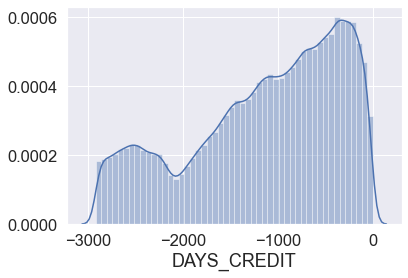

In [1931]:
sns.distplot(bureau_df['DAYS_CREDIT']);

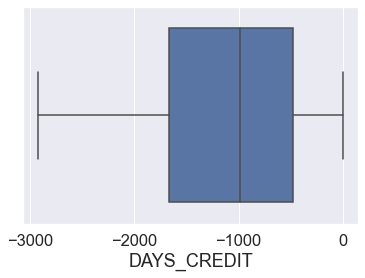

In [1932]:
#Lets check for outlier of car age
sns.boxplot(bureau_df['DAYS_CREDIT']);

In [1933]:
bureau_df['DAYS_CREDIT'].describe()

count    1.716428e+06
mean    -1.142108e+03
std      7.951649e+02
min     -2.922000e+03
25%     -1.666000e+03
50%     -9.870000e+02
75%     -4.740000e+02
max      0.000000e+00
Name: DAYS_CREDIT, dtype: float64

### Observation
- The data is left skewed with most of the values between -500 to -1500

## CREDIT_DAY_OVERDUE

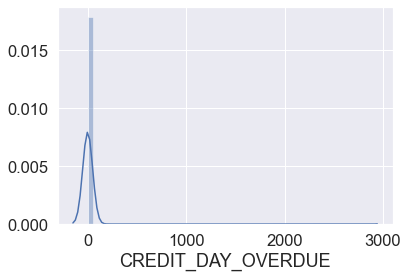

In [1934]:
sns.distplot(bureau_df['CREDIT_DAY_OVERDUE'],kde_kws={'bw':50});

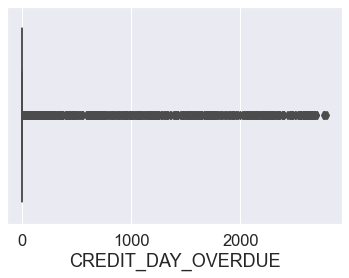

In [1935]:
#Lets check for outlier of car age
sns.boxplot(bureau_df['CREDIT_DAY_OVERDUE']);

In [1936]:
bureau_df['CREDIT_DAY_OVERDUE'].describe()

count    1.716428e+06
mean     8.181666e-01
std      3.654443e+01
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      2.792000e+03
Name: CREDIT_DAY_OVERDUE, dtype: float64

In [1937]:
bureau_df['CREDIT_DAY_OVERDUE'].max()

2792

### Observation
- The data is right skewed with most of the values between 0 to 1
- There are many outliers with maximum value of 2792

## Feature Engineering

#### Lets get the difference of credit days, amount. Also lets map overdue to create days pas due i.e. dpd

In [1938]:
bureau_df['ENDDATE_FACT_DIFF'] = bureau_df['DAYS_CREDIT_ENDDATE'] - bureau_df['DAYS_ENDDATE_FACT']
bureau_df['CREDIT_FACT_DIFF'] = bureau_df['DAYS_CREDIT'] - bureau_df['DAYS_ENDDATE_FACT']
bureau_df['CREDIT_ENDDATE_DIFF'] = bureau_df['DAYS_CREDIT'] - bureau_df['DAYS_CREDIT_ENDDATE']

bureau_df['CREDIT_DEBT_RATIO']=bureau_df['AMT_CREDIT_SUM_DEBT']/bureau_df['AMT_CREDIT_SUM']
bureau_df['CREDIT_DEBT_DIFF'] = bureau_df['AMT_CREDIT_SUM_DEBT'] - bureau_df['AMT_CREDIT_SUM']

bureau_df['IS_DPD'] = bureau_df['CREDIT_DAY_OVERDUE'].apply(lambda x: 1 if x > 0 else 0)
bureau_df['IS_DPD_OVER120'] = bureau_df['CREDIT_DAY_OVERDUE'].apply(lambda x: 1 if x >120 else 0)

bureau_df.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY,ENDDATE_FACT_DIFF,CREDIT_FACT_DIFF,CREDIT_ENDDATE_DIFF,CREDIT_DEBT_RATIO,CREDIT_DEBT_DIFF,IS_DPD,IS_DPD_OVER120
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN,0.0,-344.0,-344.0,0.00000,-91323.0,0,0
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN,NaN,NaN,-1283.0,0.76152,-53658.0,0,0
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN,NaN,NaN,-731.0,NaN,NaN,0,0
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN,NaN,NaN,NaN,NaN,NaN,0,0
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN,NaN,NaN,-1826.0,NaN,NaN,0,0


#### Lets aggregate original bureau data using min, max, mean, sum aggregate operations. We will average out the data

In [1939]:
#create a dictionary with column names as keys and aggregate operations to be performed as values
bureau_agg_dict = {
    'SK_ID_BUREAU':['count'], # this will give us count of how many bureau ids per SK_ID_CURR
    'DAYS_CREDIT':['min', 'max', 'mean'],
    'CREDIT_DAY_OVERDUE':['min', 'max', 'mean'],
    'DAYS_CREDIT_ENDDATE':['min', 'max', 'mean'],
    'DAYS_ENDDATE_FACT':['min', 'max', 'mean'],
    'AMT_CREDIT_MAX_OVERDUE': ['max', 'mean'],
    'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
    'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
    'AMT_CREDIT_SUM_OVERDUE': ['max', 'mean', 'sum'],
    'AMT_ANNUITY': ['max', 'mean', 'sum'],
    # Also aggregate our own created new columns
    'ENDDATE_FACT_DIFF':['min', 'max', 'mean'],
    'CREDIT_FACT_DIFF':['min', 'max', 'mean'],
    'CREDIT_ENDDATE_DIFF':['min', 'max', 'mean'],
    'CREDIT_DEBT_RATIO':['min', 'max', 'mean'],
    'CREDIT_DEBT_DIFF':['min', 'max', 'mean'],
    'IS_DPD':['mean', 'sum'],
    'IS_DPD_OVER120':['mean', 'sum']
  }

bureau_grp_df = bureau_df.groupby('SK_ID_CURR')#create new data frame with averaged out data wrt SK_ID_CURR
bureau_agg_amt_df = bureau_grp_df.agg(bureau_agg_dict)
bureau_agg_amt_df.columns = ['BU_'+('_').join(column).upper() for column in bureau_agg_amt_df.columns.ravel()]

bureau_agg_amt_df = bureau_agg_amt_df.reset_index()

print(bureau_agg_amt_df.shape)
bureau_agg_amt_df.head()

(305811, 47)


,SK_ID_CURR,BU_SK_ID_BUREAU_COUNT,BU_DAYS_CREDIT_MIN,BU_DAYS_CREDIT_MAX,BU_DAYS_CREDIT_MEAN,BU_CREDIT_DAY_OVERDUE_MIN,BU_CREDIT_DAY_OVERDUE_MAX,BU_CREDIT_DAY_OVERDUE_MEAN,BU_DAYS_CREDIT_ENDDATE_MIN,BU_DAYS_CREDIT_ENDDATE_MAX,BU_DAYS_CREDIT_ENDDATE_MEAN,BU_DAYS_ENDDATE_FACT_MIN,BU_DAYS_ENDDATE_FACT_MAX,BU_DAYS_ENDDATE_FACT_MEAN,BU_AMT_CREDIT_MAX_OVERDUE_MAX,BU_AMT_CREDIT_MAX_OVERDUE_MEAN,BU_AMT_CREDIT_SUM_MAX,BU_AMT_CREDIT_SUM_MEAN,BU_AMT_CREDIT_SUM_SUM,BU_AMT_CREDIT_SUM_DEBT_MAX,BU_AMT_CREDIT_SUM_DEBT_MEAN,BU_AMT_CREDIT_SUM_DEBT_SUM,BU_AMT_CREDIT_SUM_OVERDUE_MAX,BU_AMT_CREDIT_SUM_OVERDUE_MEAN,BU_AMT_CREDIT_SUM_OVERDUE_SUM,BU_AMT_ANNUITY_MAX,BU_AMT_ANNUITY_MEAN,BU_AMT_ANNUITY_SUM,BU_ENDDATE_FACT_DIFF_MIN,BU_ENDDATE_FACT_DIFF_MAX,BU_ENDDATE_FACT_DIFF_MEAN,BU_CREDIT_FACT_DIFF_MIN,BU_CREDIT_FACT_DIFF_MAX,BU_CREDIT_FACT_DIFF_MEAN,BU_CREDIT_ENDDATE_DIFF_MIN,BU_CREDIT_ENDDATE_DIFF_MAX,BU_CREDIT_ENDDATE_DIFF_MEAN,BU_CREDIT_DEBT_RATIO_MIN,BU_CREDIT_DEBT_RATIO_MAX,BU_CREDIT_DEBT_RATIO_MEAN,BU_CREDIT_DEBT_DIFF_MIN,BU_CREDIT_DEBT_DIFF_MAX,BU_CREDIT_DEBT_DIFF_MEAN,BU_IS_DPD_MEAN,BU_IS_DPD_SUM,BU_IS_DPD_OVER120_MEAN,BU_IS_DPD_OVER120_SUM
0,100001,7,-1572,-49,-735.000000,0,0,0.0,-1329.0,1778.0,82.428571,-1328.0,-544.0,-825.500000,NaN,NaN,378000.0,207623.571429,1453365.000,373239.0,85240.928571,596686.5,0.0,0.0,0.0,10822.5,3545.357143,24817.5,-1.0,698.0,197.0,-335.0,-32.0,-228.750000,-1827.0,-243.0,-817.428571,0.0,0.987405,0.282518,-279720.0,-4761.0,-122382.642857,0.0,0,0.0,0
1,100002,8,-1437,-103,-874.000000,0,0,0.0,-1072.0,780.0,-349.000000,-1185.0,-36.0,-697.500000,5043.645,1681.029,450000.0,108131.945625,865055.565,245781.0,49156.200000,245781.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,1029.0,252.6,-609.0,-76.0,-277.000000,-1822.0,-87.0,-719.833333,0.0,0.546180,0.136545,-204219.0,0.0,-98388.513000,0.0,0,0.0,0
2,100003,4,-2586,-606,-1400.750000,0,0,0.0,-2434.0,1216.0,-544.500000,-2131.0,-540.0,-1097.333333,0.000,0.000,810000.0,254350.125000,1017400.500,0.0,0.000000,0.0,0.0,0.0,0.0,NaN,NaN,0.0,-303.0,201.0,-34.0,-1096.0,-154.0,-568.333333,-1822.0,-152.0,-856.250000,0.0,0.000000,0.000000,-810000.0,-22248.0,-254350.125000,0.0,0,0.0,0
3,100004,2,-1326,-408,-867.000000,0,0,0.0,-595.0,-382.0,-488.500000,-683.0,-382.0,-532.500000,0.000,0.000,94537.8,94518.900000,189037.800,0.0,0.000000,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,88.0,44.0,-643.0,-26.0,-334.500000,-731.0,-26.0,-378.500000,0.0,0.000000,0.000000,-94537.8,-94500.0,-94518.900000,0.0,0,0.0,0
4,100005,3,-373,-62,-190.666667,0,0,0.0,-128.0,1324.0,439.333333,-123.0,-123.0,-123.000000,0.000,0.000,568800.0,219042.000000,657126.000,543087.0,189469.500000,568408.5,0.0,0.0,0.0,4261.5,1420.500000,4261.5,-5.0,-5.0,-5.0,-250.0,-250.0,-250.000000,-1461.0,-184.0,-630.000000,0.0,0.954794,0.601256,-58500.0,-4504.5,-29572.500000,0.0,0,0.0,0


#### Lets aggregate active credit bureau data using min, max, mean, sum aggregate operations using original bureau data

In [1940]:
type(bureau_df['CREDIT_ACTIVE']=='Active')

pandas.core.series.Series

In [1941]:
#create a dictionary with column names as keys and aggregate operations to be performed as values
bureau_agg_dict = {
    'SK_ID_BUREAU':['count'],
    'DAYS_CREDIT':['min', 'max', 'mean'],
    'CREDIT_DAY_OVERDUE':['min', 'max', 'mean'],
    'DAYS_CREDIT_ENDDATE':['min', 'max', 'mean'],
    'DAYS_ENDDATE_FACT':['min', 'max', 'mean'],
    'AMT_CREDIT_MAX_OVERDUE': ['max', 'mean'],
    'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
    'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
    'AMT_CREDIT_SUM_OVERDUE': ['max', 'mean', 'sum'],
    'AMT_ANNUITY': ['max', 'mean', 'sum'],
    #Also the newly created columns which we added in orginial bureau dataframe
    'ENDDATE_FACT_DIFF':['min', 'max', 'mean'],
    'CREDIT_FACT_DIFF':['min', 'max', 'mean'],
    'CREDIT_ENDDATE_DIFF':['min', 'max', 'mean'],
    'CREDIT_DEBT_RATIO':['min', 'max', 'mean'],
    'CREDIT_DEBT_DIFF':['min', 'max', 'mean'],
    'IS_DPD':['mean', 'sum'],
    'IS_DPD_OVER120':['mean', 'sum']
  }

#get the series of Active credits
bureau_active = bureau_df['CREDIT_ACTIVE']=='Active' 
#group Active credit bureau ids wrt SK_ID_CURR
bureau_active_grp = bureau_df[bureau_active].groupby(['SK_ID_CURR']) 

#aggregate active bureau credits using aggregate operations defined in aggregate dictionary
bureau_agg_active_df = bureau_active_grp.agg(bureau_agg_dict)
bureau_agg_active_df.columns = ['BU_ACT_'+('_').join(column).upper() for column in bureau_agg_active_df.columns.ravel()]

bureau_agg_active_df = bureau_agg_active_df.reset_index()

print(bureau_agg_active_df.shape)
bureau_agg_active_df.head()

(251815, 47)


,SK_ID_CURR,BU_ACT_SK_ID_BUREAU_COUNT,BU_ACT_DAYS_CREDIT_MIN,BU_ACT_DAYS_CREDIT_MAX,BU_ACT_DAYS_CREDIT_MEAN,BU_ACT_CREDIT_DAY_OVERDUE_MIN,BU_ACT_CREDIT_DAY_OVERDUE_MAX,BU_ACT_CREDIT_DAY_OVERDUE_MEAN,BU_ACT_DAYS_CREDIT_ENDDATE_MIN,BU_ACT_DAYS_CREDIT_ENDDATE_MAX,BU_ACT_DAYS_CREDIT_ENDDATE_MEAN,BU_ACT_DAYS_ENDDATE_FACT_MIN,BU_ACT_DAYS_ENDDATE_FACT_MAX,BU_ACT_DAYS_ENDDATE_FACT_MEAN,BU_ACT_AMT_CREDIT_MAX_OVERDUE_MAX,BU_ACT_AMT_CREDIT_MAX_OVERDUE_MEAN,BU_ACT_AMT_CREDIT_SUM_MAX,BU_ACT_AMT_CREDIT_SUM_MEAN,BU_ACT_AMT_CREDIT_SUM_SUM,BU_ACT_AMT_CREDIT_SUM_DEBT_MAX,BU_ACT_AMT_CREDIT_SUM_DEBT_MEAN,BU_ACT_AMT_CREDIT_SUM_DEBT_SUM,BU_ACT_AMT_CREDIT_SUM_OVERDUE_MAX,BU_ACT_AMT_CREDIT_SUM_OVERDUE_MEAN,BU_ACT_AMT_CREDIT_SUM_OVERDUE_SUM,BU_ACT_AMT_ANNUITY_MAX,BU_ACT_AMT_ANNUITY_MEAN,BU_ACT_AMT_ANNUITY_SUM,BU_ACT_ENDDATE_FACT_DIFF_MIN,BU_ACT_ENDDATE_FACT_DIFF_MAX,BU_ACT_ENDDATE_FACT_DIFF_MEAN,BU_ACT_CREDIT_FACT_DIFF_MIN,BU_ACT_CREDIT_FACT_DIFF_MAX,BU_ACT_CREDIT_FACT_DIFF_MEAN,BU_ACT_CREDIT_ENDDATE_DIFF_MIN,BU_ACT_CREDIT_ENDDATE_DIFF_MAX,BU_ACT_CREDIT_ENDDATE_DIFF_MEAN,BU_ACT_CREDIT_DEBT_RATIO_MIN,BU_ACT_CREDIT_DEBT_RATIO_MAX,BU_ACT_CREDIT_DEBT_RATIO_MEAN,BU_ACT_CREDIT_DEBT_DIFF_MIN,BU_ACT_CREDIT_DEBT_DIFF_MAX,BU_ACT_CREDIT_DEBT_DIFF_MEAN,BU_ACT_IS_DPD_MEAN,BU_ACT_IS_DPD_SUM,BU_ACT_IS_DPD_OVER120_MEAN,BU_ACT_IS_DPD_OVER120_SUM
0,100001,3,-559,-49,-309.333333,0,0,0.0,411.0,1778.0,1030.333333,NaN,NaN,NaN,NaN,NaN,378000.0,294675.0000,884025.000,373239.0,198895.50,596686.5,0.0,0.0,0.0,10822.5,8272.50,24817.5,NaN,NaN,NaN,NaN,NaN,NaN,-1827.0,-731.0,-1339.666667,0.335128,0.987405,0.659208,-224514.0,-4761.000,-95779.5000,0.0,0,0.0,0
1,100002,2,-1042,-103,-572.500000,0,0,0.0,780.0,780.0,780.000000,NaN,NaN,NaN,40.5,40.5,450000.0,240994.2825,481988.565,245781.0,122890.50,245781.0,0.0,0.0,0.0,0.0,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,-1822.0,-1822.0,-1822.000000,0.000000,0.546180,0.273090,-204219.0,-31988.565,-118103.7825,0.0,0,0.0,0
2,100003,1,-606,-606,-606.000000,0,0,0.0,1216.0,1216.0,1216.000000,NaN,NaN,NaN,0.0,0.0,810000.0,810000.0000,810000.000,0.0,0.00,0.0,0.0,0.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,-1822.0,-1822.0,-1822.000000,0.000000,0.000000,0.000000,-810000.0,-810000.000,-810000.0000,0.0,0,0.0,0
3,100005,2,-137,-62,-99.500000,0,0,0.0,122.0,1324.0,723.000000,NaN,NaN,NaN,0.0,0.0,568800.0,299313.0000,598626.000,543087.0,284204.25,568408.5,0.0,0.0,0.0,4261.5,2130.75,4261.5,NaN,NaN,NaN,NaN,NaN,NaN,-1461.0,-184.0,-822.500000,0.848974,0.954794,0.901884,-25713.0,-4504.500,-15108.7500,0.0,0,0.0,0
4,100008,1,-78,-78,-78.000000,0,0,0.0,471.0,471.0,471.000000,NaN,NaN,NaN,0.0,0.0,267606.0,267606.0000,267606.000,240057.0,240057.00,240057.0,0.0,0.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,-549.0,-549.0,-549.000000,0.897054,0.897054,0.897054,-27549.0,-27549.000,-27549.0000,0.0,0,0.0,0


#### Lets aggregate credit bureau data using min, max, mean, sum aggregate operations for Days credit >-750

In [1942]:
bureau_df[bureau_df['DAYS_CREDIT']>-750].head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY,ENDDATE_FACT_DIFF,CREDIT_FACT_DIFF,CREDIT_ENDDATE_DIFF,CREDIT_DEBT_RATIO,CREDIT_DEBT_DIFF,IS_DPD,IS_DPD_OVER120
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN,0.0,-344.0,-344.0,0.00000,-91323.0,0,0
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN,NaN,NaN,-1283.0,0.76152,-53658.0,0,0
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN,NaN,NaN,-731.0,NaN,NaN,0,0
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN,NaN,NaN,NaN,NaN,NaN,0,0
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN,NaN,NaN,-1826.0,NaN,NaN,0,0


In [1943]:
#create a dictionary with column names as keys and aggregate operations to be performed as values
bureau_agg_dict = {
    'SK_ID_BUREAU':['count'],
    'DAYS_CREDIT':['min', 'max', 'mean'],
    'CREDIT_DAY_OVERDUE':['min', 'max', 'mean'],
    'DAYS_CREDIT_ENDDATE':['min', 'max', 'mean'],
    'DAYS_ENDDATE_FACT':['min', 'max', 'mean'],
    'AMT_CREDIT_MAX_OVERDUE': ['max', 'mean'],
    'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
    'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
    'AMT_CREDIT_SUM_OVERDUE': ['max', 'mean', 'sum'],
    'AMT_ANNUITY': ['max', 'mean', 'sum'],
    #Also the newly created columns which we added in orginial bureau dataframe
    'ENDDATE_FACT_DIFF':['min', 'max', 'mean'],
    'CREDIT_FACT_DIFF':['min', 'max', 'mean'],
    'CREDIT_ENDDATE_DIFF':['min', 'max', 'mean'],
    'CREDIT_DEBT_RATIO':['min', 'max', 'mean'],
    'CREDIT_DEBT_DIFF':['min', 'max', 'mean'],
    'IS_DPD':['mean', 'sum'],
    'IS_DPD_OVER120':['mean', 'sum']
  }

#get the series of Active credits
bureau_days750 = bureau_df['DAYS_CREDIT']>-750
#group credit bureau ids of credit days more than -750 wrt SK_ID_CURR
bureau_days750_grp = bureau_df[bureau_days750].groupby('SK_ID_CURR')

#aggregate days750 bureau credits using aggregate operations defined in aggregate dictionary
bureau_agg_days750_df = bureau_days750_grp.agg(bureau_agg_dict)
bureau_agg_days750_df.columns = ['BU_750_'+('_').join(column).upper() for column in bureau_agg_days750_df.columns.ravel()]
bureau_agg_days750_df = bureau_agg_days750_df.reset_index()

print(bureau_agg_days750_df.shape)
bureau_agg_days750_df.head()


(245428, 47)


,SK_ID_CURR,BU_750_SK_ID_BUREAU_COUNT,BU_750_DAYS_CREDIT_MIN,BU_750_DAYS_CREDIT_MAX,BU_750_DAYS_CREDIT_MEAN,BU_750_CREDIT_DAY_OVERDUE_MIN,BU_750_CREDIT_DAY_OVERDUE_MAX,BU_750_CREDIT_DAY_OVERDUE_MEAN,BU_750_DAYS_CREDIT_ENDDATE_MIN,BU_750_DAYS_CREDIT_ENDDATE_MAX,BU_750_DAYS_CREDIT_ENDDATE_MEAN,BU_750_DAYS_ENDDATE_FACT_MIN,BU_750_DAYS_ENDDATE_FACT_MAX,BU_750_DAYS_ENDDATE_FACT_MEAN,BU_750_AMT_CREDIT_MAX_OVERDUE_MAX,BU_750_AMT_CREDIT_MAX_OVERDUE_MEAN,BU_750_AMT_CREDIT_SUM_MAX,BU_750_AMT_CREDIT_SUM_MEAN,BU_750_AMT_CREDIT_SUM_SUM,BU_750_AMT_CREDIT_SUM_DEBT_MAX,BU_750_AMT_CREDIT_SUM_DEBT_MEAN,BU_750_AMT_CREDIT_SUM_DEBT_SUM,BU_750_AMT_CREDIT_SUM_OVERDUE_MAX,BU_750_AMT_CREDIT_SUM_OVERDUE_MEAN,BU_750_AMT_CREDIT_SUM_OVERDUE_SUM,BU_750_AMT_ANNUITY_MAX,BU_750_AMT_ANNUITY_MEAN,BU_750_AMT_ANNUITY_SUM,BU_750_ENDDATE_FACT_DIFF_MIN,BU_750_ENDDATE_FACT_DIFF_MAX,BU_750_ENDDATE_FACT_DIFF_MEAN,BU_750_CREDIT_FACT_DIFF_MIN,BU_750_CREDIT_FACT_DIFF_MAX,BU_750_CREDIT_FACT_DIFF_MEAN,BU_750_CREDIT_ENDDATE_DIFF_MIN,BU_750_CREDIT_ENDDATE_DIFF_MAX,BU_750_CREDIT_ENDDATE_DIFF_MEAN,BU_750_CREDIT_DEBT_RATIO_MIN,BU_750_CREDIT_DEBT_RATIO_MAX,BU_750_CREDIT_DEBT_RATIO_MEAN,BU_750_CREDIT_DEBT_DIFF_MIN,BU_750_CREDIT_DEBT_DIFF_MAX,BU_750_CREDIT_DEBT_DIFF_MEAN,BU_750_IS_DPD_MEAN,BU_750_IS_DPD_SUM,BU_750_IS_DPD_OVER120_MEAN,BU_750_IS_DPD_OVER120_SUM
0,100001,3,-559,-49,-309.333333,0,0,0.0,411.0,1778.0,1030.333333,NaN,NaN,NaN,NaN,NaN,378000.0,294675.000,884025.000,373239.0,198895.5,596686.5,0.0,0.0,0.0,10822.5,8272.5,24817.5,NaN,NaN,NaN,NaN,NaN,NaN,-1827.0,-731.0,-1339.666667,0.335128,0.987405,0.659208,-224514.0,-4761.0,-95779.500,0.0,0,0.0,0
1,100002,3,-645,-103,-408.000000,0,0,0.0,85.0,85.0,85.000000,-48.0,-36.0,-42.0,5043.645,2542.0725,120735.0,50907.855,152723.565,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,121.0,121.0,121.0,-609.0,-428.0,-518.5,-730.0,-730.0,-730.000000,0.000000,0.000000,0.000000,-120735.0,0.0,-50907.855,0.0,0,0.0,0
2,100003,1,-606,-606,-606.000000,0,0,0.0,1216.0,1216.0,1216.000000,NaN,NaN,NaN,0.000,0.0000,810000.0,810000.000,810000.000,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,-1822.0,-1822.0,-1822.000000,0.000000,0.000000,0.000000,-810000.0,-810000.0,-810000.000,0.0,0,0.0,0
3,100004,1,-408,-408,-408.000000,0,0,0.0,-382.0,-382.0,-382.000000,-382.0,-382.0,-382.0,0.000,0.0000,94537.8,94537.800,94537.800,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,-26.0,-26.0,-26.0,-26.0,-26.0,-26.000000,0.000000,0.000000,0.000000,-94537.8,-94537.8,-94537.800,0.0,0,0.0,0
4,100005,3,-373,-62,-190.666667,0,0,0.0,-128.0,1324.0,439.333333,-123.0,-123.0,-123.0,0.000,0.0000,568800.0,219042.000,657126.000,543087.0,189469.5,568408.5,0.0,0.0,0.0,4261.5,1420.5,4261.5,-5.0,-5.0,-5.0,-250.0,-250.0,-250.0,-1461.0,-184.0,-630.000000,0.000000,0.954794,0.601256,-58500.0,-4504.5,-29572.500,0.0,0,0.0,0


# <font color=darkblue size=6>bureau_balance.csv</font>

In [1944]:
bureau_bal_df = pd.read_csv('./data/bureau_balance.csv')
bureau_bal_df.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


# Check for Data Types and Column Names

In [1945]:
bureau_bal_df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   SK_ID_BUREAU    int64 
 1   MONTHS_BALANCE  int64 
 2   STATUS          object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB


## Observation from above data info
- There are total 3 columns
- 1 Column is categorical
- 2 Columns are numerical

## Check for missing values

In [1946]:
pd.DataFrame([[bureau_bal_df.shape],
             [bureau_bal_df.isnull().sum().sum()],
             [bureau_bal_df.duplicated().sum()]
             ],
            columns=['Bureau Balance data set'],
            index=['Shape','Missingness','Duplicates'])

,Bureau Balance data set
Shape,"(27299925, 3)"
Missingness,0
Duplicates,0


Group by SK_ID_CURR and chek for the number of bureau ids per SK_ID_CURR

In [1947]:
bureau_df.groupby('SK_ID_CURR')['SK_ID_CURR'].value_counts().head()

SK_ID_CURR  SK_ID_CURR
100001      100001        7
100002      100002        8
100003      100003        4
100004      100004        2
100005      100005        3
Name: SK_ID_CURR, dtype: int64

### Observation
- We can see there are many balance rows available per SK_ID_CURR
- We will aggregate the data of these balances per SK_ID_CURR. We will create new columns for this purpose
- We will then concatenate update bureau data frame (grouped by SK_ID_CURR) with main application dataframe

In [1948]:
bureau_bal_df.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,SK_ID_BUREAU,MONTHS_BALANCE
count,27299925.00000,27299925.00000
mean,6036297.33297,-30.74169
std,492348.85690,23.86451
min,5001709.00000,-96.00000
25%,5730933.00000,-46.00000
50%,6070821.00000,-25.00000
75%,6431951.00000,-11.00000
max,6842888.00000,0.00000


In [101]:
bureau_bal_df['STATUS'].value_counts()

C    13646993
0    7499507 
X    5810482 
1    242347  
5    62406   
2    23419   
3    8924    
4    5847    
Name: STATUS, dtype: int64

### As per data dictionary
- Status of Credit Bureau loan during the month active, closed, DPD0-30,
- C means closed, X means status unknown, 0 means no DPD, 1 means maximal did during month between 1-30, 2 means DPD 31-60, 5 means DPD 120+ or sold or written off

## Feature Engineering

#### Lets map overdue to create days past due i.e. dpd

In [1949]:
bureau_bal_df['IS_DPD'] = bureau_bal_df['STATUS'].apply(lambda x: 1 if x in ['1','2','3','4','5'] else 0)
bureau_bal_df['IS_DPD_OVER120'] = bureau_bal_df['STATUS'].apply(lambda x: 1 if x =='5' else 0)

bureau_bal_df.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS,IS_DPD,IS_DPD_OVER120
0,5715448,0,C,0,0
1,5715448,-1,C,0,0
2,5715448,-2,C,0,0
3,5715448,-3,C,0,0
4,5715448,-4,C,0,0


#### To aggregate Bureau balance details, we will need SK_ID_CURR which is parent Id. So we will merge SK_ID_CURR of main bureau data with bureau balance data on SK_ID_BUREAU

In [1950]:
print('shape of bureau balance df before merge: {0}'.format(bureau_bal_df.shape))
bureau_bal_df = bureau_bal_df.merge(bureau_df[['SK_ID_CURR','SK_ID_BUREAU']],on='SK_ID_BUREAU',how='left')
print('shape of bureau balance df after merge: {0}'.format(bureau_bal_df.shape))

shape of bureau balance df before merge: (27299925, 5)
shape of bureau balance df after merge: (27299925, 6)


In [1951]:
bureau_bal_df = bureau_bal_df[['SK_ID_CURR','SK_ID_BUREAU','STATUS','MONTHS_BALANCE','IS_DPD','IS_DPD_OVER120']]
bureau_bal_df.head()

,SK_ID_CURR,SK_ID_BUREAU,STATUS,MONTHS_BALANCE,IS_DPD,IS_DPD_OVER120
0,380361.0,5715448,C,0,0,0
1,380361.0,5715448,C,-1,0,0
2,380361.0,5715448,C,-2,0,0
3,380361.0,5715448,C,-3,0,0
4,380361.0,5715448,C,-4,0,0


#### Lets aggregate bureau balance data using min, max, mean, sum aggregate operations wrt SK_ID_BUREAU

In [105]:
#bureau_bal_df.groupby('SK_ID_CURR').head()

In [1952]:
#create a dictionary with column names as keys and aggregate operations to be performed as values
bureau_bal_agg_dict = {
    'SK_ID_BUREAU':['count'],
    'MONTHS_BALANCE':['min', 'max', 'mean'],
    #Also the newly created columns which we added in orginial bureau dataframe
    'IS_DPD':['mean', 'sum'],
    'IS_DPD_OVER120':['mean', 'sum']
  }

#group bureau balance wrt SK_ID_CURR
bureau_bal_grp = bureau_bal_df.groupby('SK_ID_CURR')
#aggregate active bureau balance using aggregate operations defined in aggregate dictionary
bureau_bal_agg_df = bureau_bal_grp.agg(bureau_bal_agg_dict)
bureau_bal_agg_df.columns = ['BU_BAL_'+('_').join(column).upper() for column in bureau_bal_agg_df.columns.ravel()]

bureau_bal_agg_df = bureau_bal_agg_df.reset_index()

print(bureau_bal_agg_df.shape)
bureau_bal_agg_df.head()

(134542, 9)


,SK_ID_CURR,BU_BAL_SK_ID_BUREAU_COUNT,BU_BAL_MONTHS_BALANCE_MIN,BU_BAL_MONTHS_BALANCE_MAX,BU_BAL_MONTHS_BALANCE_MEAN,BU_BAL_IS_DPD_MEAN,BU_BAL_IS_DPD_SUM,BU_BAL_IS_DPD_OVER120_MEAN,BU_BAL_IS_DPD_OVER120_SUM
0,100001.0,172,-51,0,-16.279070,0.005814,1,0.0,0
1,100002.0,110,-47,0,-24.554545,0.245455,27,0.0,0
2,100005.0,21,-12,0,-4.333333,0.000000,0,0.0,0
3,100010.0,72,-90,-2,-46.000000,0.000000,0,0.0,0
4,100013.0,230,-68,0,-29.373913,0.030435,7,0.0,0


# <font color=darkblue size=6>Merge bureau data with bureau balance data</font>

In [1953]:
bureau_agg_active_df.head()

,SK_ID_CURR,BU_ACT_SK_ID_BUREAU_COUNT,BU_ACT_DAYS_CREDIT_MIN,BU_ACT_DAYS_CREDIT_MAX,BU_ACT_DAYS_CREDIT_MEAN,BU_ACT_CREDIT_DAY_OVERDUE_MIN,BU_ACT_CREDIT_DAY_OVERDUE_MAX,BU_ACT_CREDIT_DAY_OVERDUE_MEAN,BU_ACT_DAYS_CREDIT_ENDDATE_MIN,BU_ACT_DAYS_CREDIT_ENDDATE_MAX,BU_ACT_DAYS_CREDIT_ENDDATE_MEAN,BU_ACT_DAYS_ENDDATE_FACT_MIN,BU_ACT_DAYS_ENDDATE_FACT_MAX,BU_ACT_DAYS_ENDDATE_FACT_MEAN,BU_ACT_AMT_CREDIT_MAX_OVERDUE_MAX,BU_ACT_AMT_CREDIT_MAX_OVERDUE_MEAN,BU_ACT_AMT_CREDIT_SUM_MAX,BU_ACT_AMT_CREDIT_SUM_MEAN,BU_ACT_AMT_CREDIT_SUM_SUM,BU_ACT_AMT_CREDIT_SUM_DEBT_MAX,BU_ACT_AMT_CREDIT_SUM_DEBT_MEAN,BU_ACT_AMT_CREDIT_SUM_DEBT_SUM,BU_ACT_AMT_CREDIT_SUM_OVERDUE_MAX,BU_ACT_AMT_CREDIT_SUM_OVERDUE_MEAN,BU_ACT_AMT_CREDIT_SUM_OVERDUE_SUM,BU_ACT_AMT_ANNUITY_MAX,BU_ACT_AMT_ANNUITY_MEAN,BU_ACT_AMT_ANNUITY_SUM,BU_ACT_ENDDATE_FACT_DIFF_MIN,BU_ACT_ENDDATE_FACT_DIFF_MAX,BU_ACT_ENDDATE_FACT_DIFF_MEAN,BU_ACT_CREDIT_FACT_DIFF_MIN,BU_ACT_CREDIT_FACT_DIFF_MAX,BU_ACT_CREDIT_FACT_DIFF_MEAN,BU_ACT_CREDIT_ENDDATE_DIFF_MIN,BU_ACT_CREDIT_ENDDATE_DIFF_MAX,BU_ACT_CREDIT_ENDDATE_DIFF_MEAN,BU_ACT_CREDIT_DEBT_RATIO_MIN,BU_ACT_CREDIT_DEBT_RATIO_MAX,BU_ACT_CREDIT_DEBT_RATIO_MEAN,BU_ACT_CREDIT_DEBT_DIFF_MIN,BU_ACT_CREDIT_DEBT_DIFF_MAX,BU_ACT_CREDIT_DEBT_DIFF_MEAN,BU_ACT_IS_DPD_MEAN,BU_ACT_IS_DPD_SUM,BU_ACT_IS_DPD_OVER120_MEAN,BU_ACT_IS_DPD_OVER120_SUM
0,100001,3,-559,-49,-309.333333,0,0,0.0,411.0,1778.0,1030.333333,NaN,NaN,NaN,NaN,NaN,378000.0,294675.0000,884025.000,373239.0,198895.50,596686.5,0.0,0.0,0.0,10822.5,8272.50,24817.5,NaN,NaN,NaN,NaN,NaN,NaN,-1827.0,-731.0,-1339.666667,0.335128,0.987405,0.659208,-224514.0,-4761.000,-95779.5000,0.0,0,0.0,0
1,100002,2,-1042,-103,-572.500000,0,0,0.0,780.0,780.0,780.000000,NaN,NaN,NaN,40.5,40.5,450000.0,240994.2825,481988.565,245781.0,122890.50,245781.0,0.0,0.0,0.0,0.0,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,-1822.0,-1822.0,-1822.000000,0.000000,0.546180,0.273090,-204219.0,-31988.565,-118103.7825,0.0,0,0.0,0
2,100003,1,-606,-606,-606.000000,0,0,0.0,1216.0,1216.0,1216.000000,NaN,NaN,NaN,0.0,0.0,810000.0,810000.0000,810000.000,0.0,0.00,0.0,0.0,0.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,-1822.0,-1822.0,-1822.000000,0.000000,0.000000,0.000000,-810000.0,-810000.000,-810000.0000,0.0,0,0.0,0
3,100005,2,-137,-62,-99.500000,0,0,0.0,122.0,1324.0,723.000000,NaN,NaN,NaN,0.0,0.0,568800.0,299313.0000,598626.000,543087.0,284204.25,568408.5,0.0,0.0,0.0,4261.5,2130.75,4261.5,NaN,NaN,NaN,NaN,NaN,NaN,-1461.0,-184.0,-822.500000,0.848974,0.954794,0.901884,-25713.0,-4504.500,-15108.7500,0.0,0,0.0,0
4,100008,1,-78,-78,-78.000000,0,0,0.0,471.0,471.0,471.000000,NaN,NaN,NaN,0.0,0.0,267606.0,267606.0000,267606.000,240057.0,240057.00,240057.0,0.0,0.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,-549.0,-549.0,-549.000000,0.897054,0.897054,0.897054,-27549.0,-27549.000,-27549.0000,0.0,0,0.0,0


In [1954]:
bureau_bal_agg_df.head()

,SK_ID_CURR,BU_BAL_SK_ID_BUREAU_COUNT,BU_BAL_MONTHS_BALANCE_MIN,BU_BAL_MONTHS_BALANCE_MAX,BU_BAL_MONTHS_BALANCE_MEAN,BU_BAL_IS_DPD_MEAN,BU_BAL_IS_DPD_SUM,BU_BAL_IS_DPD_OVER120_MEAN,BU_BAL_IS_DPD_OVER120_SUM
0,100001.0,172,-51,0,-16.279070,0.005814,1,0.0,0
1,100002.0,110,-47,0,-24.554545,0.245455,27,0.0,0
2,100005.0,21,-12,0,-4.333333,0.000000,0,0.0,0
3,100010.0,72,-90,-2,-46.000000,0.000000,0,0.0,0
4,100013.0,230,-68,0,-29.373913,0.030435,7,0.0,0


In [1955]:
bureau_agg_days750_df.head()

,SK_ID_CURR,BU_750_SK_ID_BUREAU_COUNT,BU_750_DAYS_CREDIT_MIN,BU_750_DAYS_CREDIT_MAX,BU_750_DAYS_CREDIT_MEAN,BU_750_CREDIT_DAY_OVERDUE_MIN,BU_750_CREDIT_DAY_OVERDUE_MAX,BU_750_CREDIT_DAY_OVERDUE_MEAN,BU_750_DAYS_CREDIT_ENDDATE_MIN,BU_750_DAYS_CREDIT_ENDDATE_MAX,BU_750_DAYS_CREDIT_ENDDATE_MEAN,BU_750_DAYS_ENDDATE_FACT_MIN,BU_750_DAYS_ENDDATE_FACT_MAX,BU_750_DAYS_ENDDATE_FACT_MEAN,BU_750_AMT_CREDIT_MAX_OVERDUE_MAX,BU_750_AMT_CREDIT_MAX_OVERDUE_MEAN,BU_750_AMT_CREDIT_SUM_MAX,BU_750_AMT_CREDIT_SUM_MEAN,BU_750_AMT_CREDIT_SUM_SUM,BU_750_AMT_CREDIT_SUM_DEBT_MAX,BU_750_AMT_CREDIT_SUM_DEBT_MEAN,BU_750_AMT_CREDIT_SUM_DEBT_SUM,BU_750_AMT_CREDIT_SUM_OVERDUE_MAX,BU_750_AMT_CREDIT_SUM_OVERDUE_MEAN,BU_750_AMT_CREDIT_SUM_OVERDUE_SUM,BU_750_AMT_ANNUITY_MAX,BU_750_AMT_ANNUITY_MEAN,BU_750_AMT_ANNUITY_SUM,BU_750_ENDDATE_FACT_DIFF_MIN,BU_750_ENDDATE_FACT_DIFF_MAX,BU_750_ENDDATE_FACT_DIFF_MEAN,BU_750_CREDIT_FACT_DIFF_MIN,BU_750_CREDIT_FACT_DIFF_MAX,BU_750_CREDIT_FACT_DIFF_MEAN,BU_750_CREDIT_ENDDATE_DIFF_MIN,BU_750_CREDIT_ENDDATE_DIFF_MAX,BU_750_CREDIT_ENDDATE_DIFF_MEAN,BU_750_CREDIT_DEBT_RATIO_MIN,BU_750_CREDIT_DEBT_RATIO_MAX,BU_750_CREDIT_DEBT_RATIO_MEAN,BU_750_CREDIT_DEBT_DIFF_MIN,BU_750_CREDIT_DEBT_DIFF_MAX,BU_750_CREDIT_DEBT_DIFF_MEAN,BU_750_IS_DPD_MEAN,BU_750_IS_DPD_SUM,BU_750_IS_DPD_OVER120_MEAN,BU_750_IS_DPD_OVER120_SUM
0,100001,3,-559,-49,-309.333333,0,0,0.0,411.0,1778.0,1030.333333,NaN,NaN,NaN,NaN,NaN,378000.0,294675.000,884025.000,373239.0,198895.5,596686.5,0.0,0.0,0.0,10822.5,8272.5,24817.5,NaN,NaN,NaN,NaN,NaN,NaN,-1827.0,-731.0,-1339.666667,0.335128,0.987405,0.659208,-224514.0,-4761.0,-95779.500,0.0,0,0.0,0
1,100002,3,-645,-103,-408.000000,0,0,0.0,85.0,85.0,85.000000,-48.0,-36.0,-42.0,5043.645,2542.0725,120735.0,50907.855,152723.565,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,121.0,121.0,121.0,-609.0,-428.0,-518.5,-730.0,-730.0,-730.000000,0.000000,0.000000,0.000000,-120735.0,0.0,-50907.855,0.0,0,0.0,0
2,100003,1,-606,-606,-606.000000,0,0,0.0,1216.0,1216.0,1216.000000,NaN,NaN,NaN,0.000,0.0000,810000.0,810000.000,810000.000,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,-1822.0,-1822.0,-1822.000000,0.000000,0.000000,0.000000,-810000.0,-810000.0,-810000.000,0.0,0,0.0,0
3,100004,1,-408,-408,-408.000000,0,0,0.0,-382.0,-382.0,-382.000000,-382.0,-382.0,-382.0,0.000,0.0000,94537.8,94537.800,94537.800,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,-26.0,-26.0,-26.0,-26.0,-26.0,-26.000000,0.000000,0.000000,0.000000,-94537.8,-94537.8,-94537.800,0.0,0,0.0,0
4,100005,3,-373,-62,-190.666667,0,0,0.0,-128.0,1324.0,439.333333,-123.0,-123.0,-123.0,0.000,0.0000,568800.0,219042.000,657126.000,543087.0,189469.5,568408.5,0.0,0.0,0.0,4261.5,1420.5,4261.5,-5.0,-5.0,-5.0,-250.0,-250.0,-250.0,-1461.0,-184.0,-630.000000,0.000000,0.954794,0.601256,-58500.0,-4504.5,-29572.500,0.0,0,0.0,0


In [1956]:
bureau_final_df = bureau_agg_amt_df.merge(bureau_agg_active_df, on='SK_ID_CURR', how='left')
print(bureau_final_df.shape)
bureau_final_df = bureau_final_df.merge(bureau_bal_agg_df, on='SK_ID_CURR', how='left')
print(bureau_final_df.shape)
bureau_final_df = bureau_final_df.merge(bureau_agg_days750_df, on='SK_ID_CURR', how='left') 
print(bureau_final_df.shape)
bureau_final_df.head()

(305811, 93)
(305811, 101)
(305811, 147)


,SK_ID_CURR,BU_SK_ID_BUREAU_COUNT,BU_DAYS_CREDIT_MIN,BU_DAYS_CREDIT_MAX,BU_DAYS_CREDIT_MEAN,BU_CREDIT_DAY_OVERDUE_MIN,BU_CREDIT_DAY_OVERDUE_MAX,BU_CREDIT_DAY_OVERDUE_MEAN,BU_DAYS_CREDIT_ENDDATE_MIN,BU_DAYS_CREDIT_ENDDATE_MAX,BU_DAYS_CREDIT_ENDDATE_MEAN,BU_DAYS_ENDDATE_FACT_MIN,BU_DAYS_ENDDATE_FACT_MAX,BU_DAYS_ENDDATE_FACT_MEAN,BU_AMT_CREDIT_MAX_OVERDUE_MAX,BU_AMT_CREDIT_MAX_OVERDUE_MEAN,BU_AMT_CREDIT_SUM_MAX,BU_AMT_CREDIT_SUM_MEAN,BU_AMT_CREDIT_SUM_SUM,BU_AMT_CREDIT_SUM_DEBT_MAX,BU_AMT_CREDIT_SUM_DEBT_MEAN,BU_AMT_CREDIT_SUM_DEBT_SUM,BU_AMT_CREDIT_SUM_OVERDUE_MAX,BU_AMT_CREDIT_SUM_OVERDUE_MEAN,BU_AMT_CREDIT_SUM_OVERDUE_SUM,BU_AMT_ANNUITY_MAX,BU_AMT_ANNUITY_MEAN,BU_AMT_ANNUITY_SUM,BU_ENDDATE_FACT_DIFF_MIN,BU_ENDDATE_FACT_DIFF_MAX,BU_ENDDATE_FACT_DIFF_MEAN,BU_CREDIT_FACT_DIFF_MIN,BU_CREDIT_FACT_DIFF_MAX,BU_CREDIT_FACT_DIFF_MEAN,BU_CREDIT_ENDDATE_DIFF_MIN,BU_CREDIT_ENDDATE_DIFF_MAX,BU_CREDIT_ENDDATE_DIFF_MEAN,BU_CREDIT_DEBT_RATIO_MIN,BU_CREDIT_DEBT_RATIO_MAX,BU_CREDIT_DEBT_RATIO_MEAN,BU_CREDIT_DEBT_DIFF_MIN,BU_CREDIT_DEBT_DIFF_MAX,BU_CREDIT_DEBT_DIFF_MEAN,BU_IS_DPD_MEAN,BU_IS_DPD_SUM,BU_IS_DPD_OVER120_MEAN,BU_IS_DPD_OVER120_SUM,BU_ACT_SK_ID_BUREAU_COUNT,BU_ACT_DAYS_CREDIT_MIN,BU_ACT_DAYS_CREDIT_MAX,BU_ACT_DAYS_CREDIT_MEAN,BU_ACT_CREDIT_DAY_OVERDUE_MIN,BU_ACT_CREDIT_DAY_OVERDUE_MAX,BU_ACT_CREDIT_DAY_OVERDUE_MEAN,BU_ACT_DAYS_CREDIT_ENDDATE_MIN,BU_ACT_DAYS_CREDIT_ENDDATE_MAX,BU_ACT_DAYS_CREDIT_ENDDATE_MEAN,BU_ACT_DAYS_ENDDATE_FACT_MIN,BU_ACT_DAYS_ENDDATE_FACT_MAX,BU_ACT_DAYS_ENDDATE_FACT_MEAN,BU_ACT_AMT_CREDIT_MAX_OVERDUE_MAX,BU_ACT_AMT_CREDIT_MAX_OVERDUE_MEAN,BU_ACT_AMT_CREDIT_SUM_MAX,BU_ACT_AMT_CREDIT_SUM_MEAN,BU_ACT_AMT_CREDIT_SUM_SUM,BU_ACT_AMT_CREDIT_SUM_DEBT_MAX,BU_ACT_AMT_CREDIT_SUM_DEBT_MEAN,BU_ACT_AMT_CREDIT_SUM_DEBT_SUM,BU_ACT_AMT_CREDIT_SUM_OVERDUE_MAX,BU_ACT_AMT_CREDIT_SUM_OVERDUE_MEAN,BU_ACT_AMT_CREDIT_SUM_OVERDUE_SUM,BU_ACT_AMT_ANNUITY_MAX,BU_ACT_AMT_ANNUITY_MEAN,BU_ACT_AMT_ANNUITY_SUM,BU_ACT_ENDDATE_FACT_DIFF_MIN,BU_ACT_ENDDATE_FACT_DIFF_MAX,BU_ACT_ENDDATE_FACT_DIFF_MEAN,BU_ACT_CREDIT_FACT_DIFF_MIN,BU_ACT_CREDIT_FACT_DIFF_MAX,BU_ACT_CREDIT_FACT_DIFF_MEAN,BU_ACT_CREDIT_ENDDATE_DIFF_MIN,BU_ACT_CREDIT_ENDDATE_DIFF_MAX,BU_ACT_CREDIT_ENDDATE_DIFF_MEAN,BU_ACT_CREDIT_DEBT_RATIO_MIN,BU_ACT_CREDIT_DEBT_RATIO_MAX,BU_ACT_CREDIT_DEBT_RATIO_MEAN,BU_ACT_CREDIT_DEBT_DIFF_MIN,BU_ACT_CREDIT_DEBT_DIFF_MAX,BU_ACT_CREDIT_DEBT_DIFF_MEAN,BU_ACT_IS_DPD_MEAN,BU_ACT_IS_DPD_SUM,BU_ACT_IS_DPD_OVER120_MEAN,BU_ACT_IS_DPD_OVER120_SUM,BU_BAL_SK_ID_BUREAU_COUNT,BU_BAL_MONTHS_BALANCE_MIN,BU_BAL_MONTHS_BALANCE_MAX,BU_BAL_MONTHS_BALANCE_MEAN,BU_BAL_IS_DPD_MEAN,BU_BAL_IS_DPD_SUM,BU_BAL_IS_DPD_OVER120_MEAN,BU_BAL_IS_DPD_OVER120_SUM,BU_750_SK_ID_BUREAU_COUNT,BU_750_DAYS_CREDIT_MIN,BU_750_DAYS_CREDIT_MAX,BU_750_DAYS_CREDIT_MEAN,BU_750_CREDIT_DAY_OVERDUE_MIN,BU_750_CREDIT_DAY_OVERDUE_MAX,BU_750_CREDIT_DAY_OVERDUE_MEAN,BU_750_DAYS_CREDIT_ENDDATE_MIN,BU_750_DAYS_CREDIT_ENDDATE_MAX,BU_750_DAYS_CREDIT_ENDDATE_MEAN,BU_750_DAYS_ENDDATE_FACT_MIN,BU_750_DAYS_ENDDATE_FACT_MAX,BU_750_DAYS_ENDDATE_FACT_MEAN,BU_750_AMT_CREDIT_MAX_OVERDUE_MAX,BU_750_AMT_CREDIT_MAX_OVERDUE_MEAN,BU_750_AMT_CREDIT_SUM_MAX,BU_750_AMT_CREDIT_SUM_MEAN,BU_750_AMT_CREDIT_SUM_SUM,BU_750_AMT_CREDIT_SUM_DEBT_MAX,BU_750_AMT_CREDIT_SUM_DEBT_MEAN,BU_750_AMT_CREDIT_SUM_DEBT_SUM,BU_750_AMT_CREDIT_SUM_OVERDUE_MAX,BU_750_AMT_CREDIT_SUM_OVERDUE_MEAN,BU_750_AMT_CREDIT_SUM_OVERDUE_SUM,BU_750_AMT_ANNUITY_MAX,BU_750_AMT_ANNUITY_MEAN,BU_750_AMT_ANNUITY_SUM,BU_750_ENDDATE_FACT_DIFF_MIN,BU_750_ENDDATE_FACT_DIFF_MAX,BU_750_ENDDATE_FACT_DIFF_MEAN,BU_750_CREDIT_FACT_DIFF_MIN,BU_750_CREDIT_FACT_DIFF_MAX,BU_750_CREDIT_FACT_DIFF_MEAN,BU_750_CREDIT_ENDDATE_DIFF_MIN,BU_750_CREDIT_ENDDATE_DIFF_MAX,BU_750_CREDIT_ENDDATE_DIFF_MEAN,BU_750_CREDIT_DEBT_RATIO_MIN,BU_750_CREDIT_DEBT_RATIO_MAX,BU_750_CREDIT_DEBT_RATIO_MEAN,BU_750_CREDIT_DEBT_DIFF_MIN,BU_750_CREDIT_DEBT_DIFF_MAX,BU_750_CREDIT_DEBT_DIFF_MEAN,BU_750_IS_DPD_MEAN,BU_750_IS_DPD_SUM,BU_750_IS_DPD_OVER120_MEAN,BU_750_IS_DPD_OVER120_SUM
0,100001,7,-1572,-49,-735.000000,0,

In [1957]:
bureau_final_df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 305811 entries, 0 to 305810
Data columns (total 147 columns):
 #   Column                              Dtype  
---  ------                              -----  
 0   SK_ID_CURR                          int64  
 1   BU_SK_ID_BUREAU_COUNT               int64  
 2   BU_DAYS_CREDIT_MIN                  int64  
 3   BU_DAYS_CREDIT_MAX                  int64  
 4   BU_DAYS_CREDIT_MEAN                 float64
 5   BU_CREDIT_DAY_OVERDUE_MIN           int64  
 6   BU_CREDIT_DAY_OVERDUE_MAX           int64  
 7   BU_CREDIT_DAY_OVERDUE_MEAN          float64
 8   BU_DAYS_CREDIT_ENDDATE_MIN          float64
 9   BU_DAYS_CREDIT_ENDDATE_MAX          float64
 10  BU_DAYS_CREDIT_ENDDATE_MEAN         float64
 11  BU_DAYS_ENDDATE_FACT_MIN            float64
 12  BU_DAYS_ENDDATE_FACT_MAX            float64
 13  BU_DAYS_ENDDATE_FACT_MEAN           float64
 14  BU_AMT_CREDIT_MAX_OVERDUE_MAX       float64
 15  BU_AMT_CREDIT_MAX_OVERDUE_MEAN      float64
 16  B

In [1958]:
bureau_final_df.isnull().sum()

SK_ID_CURR                            0     
BU_SK_ID_BUREAU_COUNT                 0     
BU_DAYS_CREDIT_MIN                    0     
BU_DAYS_CREDIT_MAX                    0     
BU_DAYS_CREDIT_MEAN                   0     
BU_CREDIT_DAY_OVERDUE_MIN             0     
BU_CREDIT_DAY_OVERDUE_MAX             0     
BU_CREDIT_DAY_OVERDUE_MEAN            0     
BU_DAYS_CREDIT_ENDDATE_MIN            2585  
BU_DAYS_CREDIT_ENDDATE_MAX            2585  
BU_DAYS_CREDIT_ENDDATE_MEAN           2585  
BU_DAYS_ENDDATE_FACT_MIN              37656 
BU_DAYS_ENDDATE_FACT_MAX              37656 
BU_DAYS_ENDDATE_FACT_MEAN             37656 
BU_AMT_CREDIT_MAX_OVERDUE_MAX         92840 
BU_AMT_CREDIT_MAX_OVERDUE_MEAN        92840 
BU_AMT_CREDIT_SUM_MAX                 2     
BU_AMT_CREDIT_SUM_MEAN                2     
BU_AMT_CREDIT_SUM_SUM                 0     
BU_AMT_CREDIT_SUM_DEBT_MAX            8372  
BU_AMT_CREDIT_SUM_DEBT_MEAN           8372  
BU_AMT_CREDIT_SUM_DEBT_SUM            0     
BU_AMT_CRE

# <font color=darkblue size=6>installments_payments.csv</font>

In [2068]:
installments_df = pd.read_csv('./data/installments_payments.csv')
installments_df.head()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


# Check for Data Types and Column Names

In [2056]:
installments_df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_PREV              int64  
 1   SK_ID_CURR              int64  
 2   NUM_INSTALMENT_VERSION  float64
 3   NUM_INSTALMENT_NUMBER   int64  
 4   DAYS_INSTALMENT         float64
 5   DAYS_ENTRY_PAYMENT      float64
 6   AMT_INSTALMENT          float64
 7   AMT_PAYMENT             float64
dtypes: float64(5), int64(3)
memory usage: 830.4 MB


## Observation from above data info
- There are total 8 columns
- All Columns are numerical

## Check for missing values

In [2057]:
pd.DataFrame([[installments_df.shape],
             [installments_df.isnull().sum().sum()],
             [installments_df.duplicated().sum()]
             ],
            columns=['Installments Payments data set'],
            index=['Shape','Missingness','Duplicates'])

,Installments Payments data set
Shape,"(13605401, 8)"
Missingness,5810
Duplicates,0


Group by SK_ID_CURR and chek for the number of bureau ids per SK_ID_CURR

In [2058]:
installments_df.groupby('SK_ID_CURR')['SK_ID_CURR'].value_counts().head()

SK_ID_CURR  SK_ID_CURR
100001      100001        7 
100002      100002        19
100003      100003        25
100004      100004        3 
100005      100005        9 
Name: SK_ID_CURR, dtype: int64

### Observation
- We can see there are many installments rows available per SK_ID_CURR
- We will aggregate the data of these installments per SK_ID_CURR. We will create new columns for this purpose
- We will then concatenate update installments payments data frame (grouped by SK_ID_CURR) with main application dataframe

In [2059]:
installments_df.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
count,13605401.00000,13605401.00000,13605401.00000,13605401.00000,13605401.00000,13602496.00000,13605401.00000,13602496.00000
mean,1903364.96955,278444.88174,0.85664,18.87090,-1042.26999,-1051.11368,17050.90699,17238.22325
std,536202.90555,102718.31041,1.03522,26.66407,800.94628,800.58588,50570.25443,54735.78398
min,1000001.00000,100001.00000,0.00000,1.00000,-2922.00000,-4921.00000,0.00000,0.00000
25%,1434191.00000,189639.00000,0.00000,4.00000,-1654.00000,-1662.00000,4226.08500,3398.26500
50%,1896520.00000,278685.00000,1.00000,8.00000,-818.00000,-827.00000,8884.08000,8125.51500
75%,2369094.00000,367530.00000,1.00000,19.00000,-361.00000,-370.00000,16710.21000,16108.42500
max,2843499.00000,456255.00000,178.00000,277.00000,-1.00000,-1.00000,3771487.84500,3771487.84500


## Feature Engineering

#### Lets calculate Amount difference in scheduled installment amount and actual paument amount

In [2069]:
installments_df['AMT_DIFF'] = installments_df['AMT_INSTALMENT'] - installments_df['AMT_PAYMENT']
installments_df['AMT_RATIO'] = installments_df['AMT_PAYMENT'] / installments_df['AMT_INSTALMENT']

#### As per data dictionary
- DAYS_INSTALMENT	- When the installment of previous credit was supposed to be paid (relative to application date of current loan)
- DAYS_ENTRY_PAYMENT	- When was the installments of previous credit paid actually (relative to application date of current loan)
- Using this inofrmation we will create a flag of days past due as Yes or no and we will also calculate how many days past due i.e. more than 30,60,90,120 etc.

In [2070]:
installments_df['DPD_DAYS'] = installments_df['DAYS_ENTRY_PAYMENT'] - installments_df['DAYS_INSTALMENT']
installments_df['IS_DPD'] = installments_df['DPD_DAYS'].apply(lambda x: 1 if x>0 else 0)
installments_df['IS_DPD_BELOW_120'] = installments_df['DPD_DAYS'].apply(lambda x: 1 if (x>0) & (x<120) else 0 )
installments_df['IS_DPD_OVER_120'] = installments_df['DPD_DAYS'].apply(lambda x: 1 if x>120 else 0)
installments_df.head()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT,AMT_DIFF,AMT_RATIO,DPD_DAYS,IS_DPD,IS_DPD_BELOW_120,IS_DPD_OVER_120
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360,0.000,1.000000,-7.0,0,0,0
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525,0.000,1.000000,0.0,0,0,0
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000,0.000,1.000000,0.0,0,0,0
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130,0.000,1.000000,-8.0,0,0,0
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585,4.455,0.997942,17.0,1,1,0


#### Lets aggregate installments data wrt SK_ID_CURR
As per data dictionary
- NUM_INSTALMENT_VERSION - Version of installment calendar (0 is for credit card) of previous credit. Change of installment version from month to month signifies that some parameter of payment calendar has changed
- NUM_INSTALMENT_NUMBER - On which installment we observe payment
- Using this data we will find unique number of installment version group by SK_ID_CURR
- - We dont need instalment number so we will ignore this column in aggregation

In [2075]:
installments_agg_dict = {
    'SK_ID_CURR':['count'],
    'NUM_INSTALMENT_VERSION':['nunique'], 
    'DAYS_ENTRY_PAYMENT':['mean', 'max', 'sum'],
    'DAYS_INSTALMENT':['mean', 'max', 'sum'],
    'AMT_INSTALMENT':['mean', 'max', 'sum'],
    'AMT_PAYMENT':['mean', 'max','sum'],
    # Our own newly created columns
    'AMT_DIFF':['mean','min', 'max','sum'],
    'AMT_RATIO':['mean', 'max'],
    'DPD_DAYS':['mean', 'min', 'max'],
    'IS_DPD':['mean', 'sum'],
    'IS_DPD_BELOW_120':['mean', 'sum'],
    'IS_DPD_OVER_120':['mean', 'sum']    
}

installments_grp_df = installments_df.groupby('SK_ID_CURR')

installments_agg_df = installments_grp_df.agg(installments_agg_dict)
installments_agg_df.columns = ['INS_'+('_').join(column).upper() for column in installments_agg_df.columns.ravel()]

#installments_agg_df = installments_agg_df.reset_index()
print(installments_df.shape)
installments_agg_df.head()

(13605401, 14)


,INS_SK_ID_CURR_COUNT,INS_NUM_INSTALMENT_VERSION_NUNIQUE,INS_DAYS_ENTRY_PAYMENT_MEAN,INS_DAYS_ENTRY_PAYMENT_MAX,INS_DAYS_ENTRY_PAYMENT_SUM,INS_DAYS_INSTALMENT_MEAN,INS_DAYS_INSTALMENT_MAX,INS_DAYS_INSTALMENT_SUM,INS_AMT_INSTALMENT_MEAN,INS_AMT_INSTALMENT_MAX,INS_AMT_INSTALMENT_SUM,INS_AMT_PAYMENT_MEAN,INS_AMT_PAYMENT_MAX,INS_AMT_PAYMENT_SUM,INS_AMT_DIFF_MEAN,INS_AMT_DIFF_MIN,INS_AMT_DIFF_MAX,INS_AMT_DIFF_SUM,INS_AMT_RATIO_MEAN,INS_AMT_RATIO_MAX,INS_DPD_DAYS_MEAN,INS_DPD_DAYS_MIN,INS_DPD_DAYS_MAX,INS_IS_DPD_MEAN,INS_IS_DPD_SUM,INS_IS_DPD_BELOW_120_MEAN,INS_IS_DPD_BELOW_120_SUM,INS_IS_DPD_OVER_120_MEAN,INS_IS_DPD_OVER_120_SUM
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100001,7,2,-2195.000000,-1628.0,-15365.0,-2187.714286,-1619.0,-15314.0,5885.132143,17397.900,41195.925,5885.132143,17397.900,41195.925,0.0,0.0,0.0,0.0,1.0,1.0,-7.285714,-36.0,11.0,0.142857,1,0.142857,1,0.0,0
100002,19,2,-315.421053,-49.0,-5993.0,-295.000000,-25.0,-5605.0,11559.247105,53093.745,219625.695,11559.247105,53093.745,219625.695,0.0,0.0,0.0,0.0,1.0,1.0,-20.421053,-31.0,-12.0,0.000000,0,0.000000,0,0.0,0
100003,25,2,-1385.320000,-544.0,-34633.0,-1378.160000,-536.0,-34454.0,64754.586000,560835.360,1618864.650,64754.586000,560835.360,1618864.650,0.0,0.0,0.0,0.0,1.0,1.0,-7.160000,-14.0,-1.0,0.000000,0,0.000000,0,0.0,0
100004,3,2,-761.666667,-727.0,-2285.0,-754.000000,-724.0,-2262.0,7096.155000,10573.965,21288.465,7096.155000,10573.965,21288.465,0.0,0.0,0.0,0.0,1.0,1.0,-7.666667,-11.0,-3.0,0.000000,0,0.000000,0,0.0,0
100005,9,2,-609.555556,-470.0,-5486.0,-586.000000,-466.0,-5274.0,6240.205000,17656.245,56161.845,6240.205000,17656.245,56161.845,0.0,0.0,0.0,0.0,1.0,1.0,-23.555556,-37.0,1.0,0.111111,1,0.111111,1,0.0,0


#### Lets also aggregate data based on entry payment days exceeding 365 days

In [2076]:
installments_days365_agg_dict = {
    'SK_ID_CURR':['count'],
    'NUM_INSTALMENT_VERSION':['nunique'], 
    'DAYS_ENTRY_PAYMENT':['mean', 'max', 'sum'],
    'DAYS_INSTALMENT':['mean', 'max', 'sum'],
    'AMT_INSTALMENT':['mean', 'max', 'sum'],
    'AMT_PAYMENT':['mean', 'max','sum'],
    #  Our newly created columns
    'AMT_DIFF':['mean','min', 'max','sum'],
    'AMT_RATIO':['mean', 'max'],
    'DPD_DAYS':['mean', 'min', 'max'],
    'IS_DPD':['mean', 'sum'],
    'IS_DPD_BELOW_120':['mean', 'sum'],
    'IS_DPD_OVER_120':['mean', 'sum']    
}

installments_days365_df = installments_df['DAYS_ENTRY_PAYMENT'] >= -365
installments_days365_grp_df = installments_df[installments_days365_df].groupby('SK_ID_CURR')

installments_agg_days365_df = installments_days365_grp_df.agg(installments_days365_agg_dict)
installments_agg_days365_df.columns = ['INS_D365'+('_').join(column).upper() 
                                       for column in installments_agg_days365_df.columns.ravel()]

#merge 365days data with previous installments aggregated data
installments_agg_df = installments_agg_df.merge(installments_agg_days365_df, on='SK_ID_CURR', how='left')
installments_agg_df = installments_agg_df.reset_index()
print(installments_df.shape)
installments_agg_df.head()

(13605401, 14)


,SK_ID_CURR,INS_SK_ID_CURR_COUNT,INS_NUM_INSTALMENT_VERSION_NUNIQUE,INS_DAYS_ENTRY_PAYMENT_MEAN,INS_DAYS_ENTRY_PAYMENT_MAX,INS_DAYS_ENTRY_PAYMENT_SUM,INS_DAYS_INSTALMENT_MEAN,INS_DAYS_INSTALMENT_MAX,INS_DAYS_INSTALMENT_SUM,INS_AMT_INSTALMENT_MEAN,INS_AMT_INSTALMENT_MAX,INS_AMT_INSTALMENT_SUM,INS_AMT_PAYMENT_MEAN,INS_AMT_PAYMENT_MAX,INS_AMT_PAYMENT_SUM,INS_AMT_DIFF_MEAN,INS_AMT_DIFF_MIN,INS_AMT_DIFF_MAX,INS_AMT_DIFF_SUM,INS_AMT_RATIO_MEAN,INS_AMT_RATIO_MAX,INS_DPD_DAYS_MEAN,INS_DPD_DAYS_MIN,INS_DPD_DAYS_MAX,INS_IS_DPD_MEAN,INS_IS_DPD_SUM,INS_IS_DPD_BELOW_120_MEAN,INS_IS_DPD_BELOW_120_SUM,INS_IS_DPD_OVER_120_MEAN,INS_IS_DPD_OVER_120_SUM,INS_D365SK_ID_CURR_COUNT,INS_D365NUM_INSTALMENT_VERSION_NUNIQUE,INS_D365DAYS_ENTRY_PAYMENT_MEAN,INS_D365DAYS_ENTRY_PAYMENT_MAX,INS_D365DAYS_ENTRY_PAYMENT_SUM,INS_D365DAYS_INSTALMENT_MEAN,INS_D365DAYS_INSTALMENT_MAX,INS_D365DAYS_INSTALMENT_SUM,INS_D365AMT_INSTALMENT_MEAN,INS_D365AMT_INSTALMENT_MAX,INS_D365AMT_INSTALMENT_SUM,INS_D365AMT_PAYMENT_MEAN,INS_D365AMT_PAYMENT_MAX,INS_D365AMT_PAYMENT_SUM,INS_D365AMT_DIFF_MEAN,INS_D365AMT_DIFF_MIN,INS_D365AMT_DIFF_MAX,INS_D365AMT_DIFF_SUM,INS_D365AMT_RATIO_MEAN,INS_D365AMT_RATIO_MAX,INS_D365DPD_DAYS_MEAN,INS_D365DPD_DAYS_MIN,INS_D365DPD_DAYS_MAX,INS_D365IS_DPD_MEAN,INS_D365IS_DPD_SUM,INS_D365IS_DPD_BELOW_120_MEAN,INS_D365IS_DPD_BELOW_120_SUM,INS_D365IS_DPD_OVER_120_MEAN,INS_D365IS_DPD_OVER_120_SUM
0,100001,7,2,-2195.000000,-1628.0,-15365.0,-2187.714286,-1619.0,-15314.0,5885.132143,17397.900,41195.925,5885.132143,17397.900,41195.925,0.0,0.0,0.0,0.0,1.0,1.0,-7.285714,-36.0,11.0,0.142857,1,0.142857,1,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,100002,19,2,-315.421053,-49.0,-5993.0,-295.000000,-25.0,-5605.0,11559.247105,53093.745,219625.695,11559.247105,53093.745,219625.695,0.0,0.0,0.0,0.0,1.0,1.0,-20.421053,-31.0,-12.0,0.000000,0,0.000000,0,0.0,0,11.0,2.0,-192.363636,-49.0,-2116.0,-175.0,-25.0,-1925.0,13237.408636,53093.745,145611.495,13237.408636,53093.745,145611.495,0.0,0.0,0.0,0.0,1.0,1.0,-17.363636,-24.0,-12.0,0.0,0.0,0.0,0.0,0.0,0.0
2,100003,25,2,-1385.320000,-544.0,-34633.0,-1378.160000,-536.0,-34454.0,64754.586000,560835.360,1618864.650,64754.586000,560835.360,1618864.650,0.0,0.0,0.0,0.0,1.0,1.0,-7.160000,-14.0,-1.0,0.000000,0,0.000000,0,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,100004,3,2,-761.666667,-727.0,-2285.0,-754.000000,-724.0,-2262.0,7096.155000,10573.965,21288.465,7096.155000,10573.965,21288.465,0.0,0.0,0.0,0.0,1.0,1.0,-7.666667,-11.0,-3.0,0.000000,0,0.000000,0,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,100005,9,2,-609.555556,-470.0,-5486.0,-586.000000,-466.0,-5274.0,6240.205000,17656.245,56161.845,6240.205000,17656.245,56161.845,0.0,0.0,0.0,0.0,1.0,1.0,-23.555556,-37.0,1.0,0.111111,1,0.111111,1,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# <font color=darkblue size=6>Merge with application dataframe</font>

# Load Application.csv

In [2077]:
application_df = pd.read_csv('./data/application_final.csv')
#application_copy_df = application_df.copy()

application_df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,APPS_EXT_SOURCE_MEAN,APPS_EXT_SOURCE_STD,APPS_ANNUITY_CREDIT_RATIO,APPS_GOODS_CREDIT_RATIO,APPS_ANNUITY_INCOME_RATIO,APPS_CREDIT_INCOME_RATIO,APPS_GOODS_INCOME_RATIO,APPS_CNT_FAM_INCOME_RATIO,APPS_EMPLOYED_BIRTH_RATIO,APPS_INCOME_EMPLOYED_RATIO,APPS_INCOME_BIRTH_RATIO,APPS_CAR_BIRTH_RATIO,APPS_CAR_EMPLOYED_RATIO
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,0.0,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.161787,0.092026,0.060749,0.863262,0.121978,2.007889,1.733333,202500.0,0.067329,-317.896389,-21.403657,-0.000000,-0.00
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,0.0,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,0.535276,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.489596,0.160443,0.027598,0.873211,0.132217,4.790750,4.183333,135000.0,0.070862,-227.272727,-16.104981,-0.000000,-0.00
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,9.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.505998,0.555912,0.729567,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.597159,0.117353,0.050000,1.000000,0.100000,2.000000,2.000000,67500.0,0.011814,-300.000000,-3.544051,-0.000473,-0.04
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,0.0,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.505998,0.650442,0.535276,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.563905,0.076359,0.094941,0.949845,0.219900,2.316167,2.200000,67500.0,0.159905,-44.422507,-7.103394,-0.000000,-0.00
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,0.0,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.505998,0.322738,0.535276,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,

In [2078]:
# Merge with application_df
print('shape of application_df before merge with previous app df: {0}'.format(application_df.shape))
application_df = application_df.merge(prev_app_agg_final_df, on='SK_ID_CURR', how='left')
print('shape of application_df after merge with previous app df: {0}'.format(application_df.shape))
application_df = application_df.merge(bureau_final_df, on='SK_ID_CURR', how='left')
print('shape of application_df after merge with bureau final df: {0}'.format(application_df.shape))
application_df = application_df.merge(installments_agg_df, on='SK_ID_CURR', how='left')
print('shape of application_df after merge with installments final df: {0}'.format(application_df.shape))
application_df.head()

shape of application_df before merge with previous app df: (307511, 88)
shape of application_df after merge with previous app df: (307511, 168)
shape of application_df after merge with bureau final df: (307511, 314)
shape of application_df after merge with installments final df: (307511, 372)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,APPS_EXT_SOURCE_MEAN,APPS_EXT_SOURCE_STD,APPS_ANNUITY_CREDIT_RATIO,APPS_GOODS_CREDIT_RATIO,APPS_ANNUITY_INCOME_RATIO,APPS_CREDIT_INCOME_RATIO,APPS_GOODS_INCOME_RATIO,APPS_CNT_FAM_INCOME_RATIO,APPS_EMPLOYED_BIRTH_RATIO,APPS_INCOME_EMPLOYED_RATIO,APPS_INCOME_BIRTH_RATIO,APPS_CAR_BIRTH_RATIO,APPS_CAR_EMPLOYED_RATIO,PREV_SK_ID_CURR_COUNT,PREV_AMT_CREDIT_MEAN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_SUM,PREV_AMT_ANNUITY_MEAN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_SUM,PREV_AMT_APPLICATION_MEAN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_SUM,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_SUM,PREV_AMT_GOODS_PRICE_MEAN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_SUM,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,PREV_CREDIT_DIFF_MEAN,PREV_CREDIT_DIFF_MAX,PREV_CREDIT_DIFF_SUM,PREV_CREDIT_APPL_RATIO_MEAN,PREV_CREDIT_APPL_RATIO_MAX,PREV_GOODS_DIFF_MEAN,PREV_GOODS_DIFF_MAX,PREV_GOODS_DIFF_SUM,PREV_GOODS_APPL_RATIO_MEAN,PREV_GOODS_APPL_RATIO_MAX,PREV_DAYS_LAST_DUE_DIFF_MEAN,PREV_DAYS_LAST_DUE_DIFF_MAX,PREV_DAYS_LAST_DUE_DIFF_SUM,PREV_INTERESTS_RATE_MEAN,PREV_INTERESTS_RATE_MAX,PREV_APPROVED_COUNT,PREV_REFUSED_COUNT,PREV_365_SK_ID_CURR_COUNT,PREV_365_AMT_CREDIT_MEAN,PREV_365_AMT_CREDIT_MAX,PREV_365_AMT_CREDIT_SUM,PREV_365_AMT_ANNUITY_MEAN,PREV_365_AMT_ANNUITY_MAX,PREV_365_AMT_ANNUITY_SUM,PREV_365_AMT_APPLICATION_MEAN,PREV_365_AMT_APPLICATION_MAX,PREV_365_AMT_APPLICATION_SUM,PREV_365_AMT_DOWN_PAYMENT_MEAN,PREV_365_AMT_DOWN_PAYMENT_MAX,PREV_365_AMT_DOWN_PAYMENT_SUM,PREV_365_AMT_GOODS_PRICE_MEAN,PREV_365_AMT_GOODS_PRICE_MAX,PREV_365_AMT_GOODS_PRICE_SUM,PREV_365_RATE_DOWN_PAYMENT_MIN,PREV_365_RATE_DOWN_PAYMENT_MAX,PREV_365_RATE_DOWN_PAYMENT_MEAN,PREV_365_DAYS_DECISION_MIN,PREV_365_DAYS_DECISION_MAX,PREV_365_DAYS_DECISION_MEAN,PREV_365_CNT_PAYMENT_MEAN,PREV_365_CNT_PAYMENT_SUM,PREV_365_CREDIT_DIFF_MEAN,PREV_365_CREDIT_DIFF_MAX,PREV_365_CREDIT_DIFF_SUM,PREV_365_CREDIT_APPL_RATIO_MEAN,PREV_365_CREDIT_APPL_RATIO_MAX,PREV_365_GOODS_DIFF_MEAN,PREV_365_GOODS_DIFF_MAX,PREV_365_GOODS_DIFF_SUM,PREV_365_GOODS_APPL_RATIO_MEAN,PREV_365_GOODS_APPL_RATIO_MAX,PREV_365_DAYS_LAST_DUE_DIFF_MEAN,PREV_365_DAYS_LAST_DUE_DIFF_MAX,PREV_365_DAYS_LAST_DUE_DIFF_SUM,PREV_365_INTERESTS_RATE_MEAN,PREV_365_INTERESTS_RATE_MAX,BU_SK_ID_BUREAU_COUNT,BU_DAYS_CREDIT_MIN,BU_DAYS_CREDIT_MAX,BU_DAYS_CREDIT_MEAN,BU_CREDIT_DAY_OVERDUE_MIN,BU_CREDIT_DAY_OVERDUE_MAX,BU_CREDIT_DAY_OVERDUE_MEAN,BU_DAYS_CREDIT_ENDDATE_MIN,BU_DAYS_CREDIT_ENDDATE_MAX,BU_DAYS_CREDIT_ENDDATE_MEA

## Lets calculate WOE and IV of all variables

In [2079]:
col_list = list(application_df.columns)
col_list.remove('TARGET')

result_df = pd.DataFrame(columns={'var_name',
                                     'min_val','max_val',
                                      'total_event_nonevent','event_count','nonevent_count',
                                     'event_pct','nonevent_pct',
                                     'woe','event_nonevent_pcnt_diff','iv'})

for col_name in col_list:
    if application_df[col_name].dtype == 'object':
        feature_type='string'
    else:
        feature_type='numeric'
    #create monochromatic binning using the function that we defined  
    bin_df = create_monochromatic_bin(application_df[[col_name,'TARGET']],col_name,'TARGET',feature_type,10)
    
    #calaculate woe and iv of each variable using the function that we defined
    woe_iv_df = calculate_woe_iv(bin_df,col_name,'TARGET',feature_type)
    
    if(result_df['var_name'].count()==0):
        result_df = woe_iv_df
    else:
        result_df = result_df.append(woe_iv_df,ignore_index=True)

result_df.head(30)

,var_name,min_val,max_val,total_event_nonevent,event_count,nonevent_count,event_pct,nonevent_pct,woe,event_nonevent_pcnt_diff,iv
0,SK_ID_CURR,100002,278202,153756,12541.0,141215.0,0.505176,0.499547,0.011205,0.005629,0.000127
1,SK_ID_CURR,278203,456255,153755,12284.0,141471.0,0.494824,0.500453,-0.011312,-0.005629,0.000127
2,NAME_CONTRACT_TYPE,Cash loans,Cash loans,278232,23221.0,255011.0,0.935388,0.902100,0.036236,0.033288,0.015039
3,NAME_CONTRACT_TYPE,Revolving loans,Revolving loans,29279,1604.0,27675.0,0.064612,0.097900,-0.415543,-0.033288,0.015039
4,CODE_GENDER,F,F,202448,14170.0,188278.0,0.570784,0.666032,-0.154327,-0.095248,0.038599
5,CODE_GENDER,M,M,105059,10655.0,94404.0,0.429196,0.333954,0.250911,0.095242,0.038599
6,CODE_GENDER,XNA,XNA,4,0.5,4.0,0.000020,0.000014,0.353024,0.000006,0.038599
7,FLAG_OWN_CAR,N,N,202924,17249.0,185675.0,0.694824,0.656824,0.056242,0.038000,0.006597
8,FLAG_OWN_CAR,Y,Y,104587,7576.0,97011.0,0.305176,0.343176,-0.117353,-0.038000,0.006597
9,FLAG_OWN_REALTY,N,N,94199,7842.0,86357.0,0.315891,0.305487,0.033490,0.010404,0.000505


In [2080]:
result_df

,var_name,min_val,max_val,total_event_nonevent,event_count,nonevent_count,event_pct,nonevent_pct,woe,event_nonevent_pcnt_diff,iv
0,SK_ID_CURR,100002,278202,153756,12541.0,141215.0,0.505176,0.499547,0.011205,0.005629,1.267482e-04
1,SK_ID_CURR,278203,456255,153755,12284.0,141471.0,0.494824,0.500453,-0.011312,-0.005629,1.267482e-04
2,NAME_CONTRACT_TYPE,Cash loans,Cash loans,278232,23221.0,255011.0,0.935388,0.902100,0.036236,0.033288,1.503877e-02
3,NAME_CONTRACT_TYPE,Revolving loans,Revolving loans,29279,1604.0,27675.0,0.064612,0.097900,-0.415543,-0.033288,1.503877e-02
4,CODE_GENDER,F,F,202448,14170.0,188278.0,0.570784,0.666032,-0.154327,-0.095248,3.859884e-02
5,CODE_GENDER,M,M,105059,10655.0,94404.0,0.429196,0.333954,0.250911,0.095242,3.859884e-02
6,CODE_GENDER,XNA,XNA,4,0.5,4.0,0.000020,0.000014,0.353024,0.000006,3.859884e-02
7,FLAG_OWN_CAR,N,N,202924,17249.0,185675.0,0.694824,0.656824,0.056242,0.038000,6.596552e-03
8,FLAG_OWN_CAR,Y,Y,104587,7576.0,97011.0,0.305176,0.343176,-0.117353,-0.038000,6.596552e-03
9,FLAG_OWN_REALTY,N,N,94199,7842.0,86357.0,0.315891,0.305487,0.033490,0.010404,5.054518e-04


### Get IV of variables

In [2081]:
iv_df = pd.DataFrame({'iv':result_df.groupby('var_name')['iv'].max()})
iv_df = iv_df.reset_index()
round(iv_df.sort_values(by='iv',ascending=False),5)

,var_name,iv
17,APPS_EXT_SOURCE_MEAN,0.61416
180,EXT_SOURCE_2,0.30325
181,EXT_SOURCE_3,0.29837
143,BU_CREDIT_DEBT_RATIO_MAX,0.14350
144,BU_CREDIT_DEBT_RATIO_MEAN,0.13603
89,BU_ACT_CREDIT_DEBT_RATIO_MAX,0.12782
140,BU_CREDIT_DEBT_DIFF_MAX,0.12756
43,BU_750_CREDIT_DEBT_RATIO_MAX,0.12505
156,BU_DAYS_CREDIT_MEAN,0.12277
86,BU_ACT_CREDIT_DEBT_DIFF_MAX,0.12158


## As per definition 

        IV           |         Predictive Power
        -----------------------------------------
        <0.02        |    Useless for Prediction
        0.02 to 0.1  |    Weak Predictor
        0.1 to 0.3   |    Medium Predictor
        0.3 to 0.5   |    Strong Predictor
        >0.5         |    Suspicious or too good to be true

### Observations from above cell
- Going by Information Value, feature <b><u>'APPS_EXT_SOURCE_MEAN'</u></b> seems to be too good to be true. We will still consider it to be a good predictor.
- EXT_SOURCE_2 seems to be <b><u>strong predictors</u></b>
- EXT_SOURCE_3, BU_CREDIT_DEBT_RATIO_MAX, BU_CREDIT_DEBT_RATIO_MEAN, BU_ACT_CREDIT_DEBT_RATIO_MAX, BU_CREDIT_DEBT_DIFF_MAX  seem to be <b><u>medium predictors</u></b>
- APPS_EXT_SOURCE_STD, EXT_SOURCE_1, APPS_EMPLOYED_BIRTH_RATIO, DAYS_BIRTH, APPS_INCOME_EMPLOYED_RATIO, OCCUPATION_TYPE, NAME_INCOME_TYPE, NAME_EDUCATION_TYPE, DAYS_LAST_PHONE_CHANGE, CODE_GENDER, DAYS_ID_PUBLISH, AMT_GOODS_PRICE, DAYS_REGISTRATION seem to be <b><u>weak predictors</u></b>

We will build various models and check for model evaluation metrics and feature importance

### Replace all null and infinite values with 0

In [2082]:
#application_df.replace({np.nan:0, np.inf:0},inplace=True)
application_df.replace([np.inf, -np.inf], 0, inplace=True)
application_df.fillna(0,inplace=True)
application_df.isna().sum()

SK_ID_CURR                                0
TARGET                                    0
NAME_CONTRACT_TYPE                        0
CODE_GENDER                               0
FLAG_OWN_CAR                              0
FLAG_OWN_REALTY                           0
CNT_CHILDREN                              0
AMT_INCOME_TOTAL                          0
AMT_CREDIT                                0
AMT_ANNUITY                               0
AMT_GOODS_PRICE                           0
NAME_TYPE_SUITE                           0
NAME_INCOME_TYPE                          0
NAME_EDUCATION_TYPE                       0
NAME_FAMILY_STATUS                        0
NAME_HOUSING_TYPE                         0
REGION_POPULATION_RELATIVE                0
DAYS_BIRTH                                0
DAYS_EMPLOYED                             0
DAYS_REGISTRATION                         0
DAYS_ID_PUBLISH                           0
OWN_CAR_AGE                               0
FLAG_MOBIL                      

In [2083]:
application_df.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307511 entries, 0 to 307510
Data columns (total 372 columns):
 #   Column                                  Dtype  
---  ------                                  -----  
 0   SK_ID_CURR                              int64  
 1   TARGET                                  int64  
 2   NAME_CONTRACT_TYPE                      object 
 3   CODE_GENDER                             object 
 4   FLAG_OWN_CAR                            object 
 5   FLAG_OWN_REALTY                         object 
 6   CNT_CHILDREN                            int64  
 7   AMT_INCOME_TOTAL                        float64
 8   AMT_CREDIT                              float64
 9   AMT_ANNUITY                             float64
 10  AMT_GOODS_PRICE                         float64
 11  NAME_TYPE_SUITE                         object 
 12  NAME_INCOME_TYPE                        object 
 13  NAME_EDUCATION_TYPE                     object 
 14  NAME_FAMILY_STATUS                 

## Get the list of numerical and catgeorical columns from main data frame

In [2084]:
object_cols = [col for col in application_df.select_dtypes(include=np.object).columns]
numerical_cols = [col for col in application_df.select_dtypes(include=np.number).columns]

print('Categorical Columns: \n{0}\n'.format(object_cols))
print('Numerical Columns: \n{0}'.format(numerical_cols))
            

Categorical Columns: 
['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE']

Numerical Columns: 
['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CN

#### Remove TARGET from numerical columns list

In [2085]:
numerical_cols.remove('TARGET')
numerical_cols

['SK_ID_CURR',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUME

### Use LabelEncoder to encode categorical values

In [2086]:
#Lets create Label Encoder variable
le = LabelEncoder()
for col in object_cols:
    application_df[col] = le.fit_transform(application_df[col])
application_df.sample(10)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,APPS_EXT_SOURCE_MEAN,APPS_EXT_SOURCE_STD,APPS_ANNUITY_CREDIT_RATIO,APPS_GOODS_CREDIT_RATIO,APPS_ANNUITY_INCOME_RATIO,APPS_CREDIT_INCOME_RATIO,APPS_GOODS_INCOME_RATIO,APPS_CNT_FAM_INCOME_RATIO,APPS_EMPLOYED_BIRTH_RATIO,APPS_INCOME_EMPLOYED_RATIO,APPS_INCOME_BIRTH_RATIO,APPS_CAR_BIRTH_RATIO,APPS_CAR_EMPLOYED_RATIO,PREV_SK_ID_CURR_COUNT,PREV_AMT_CREDIT_MEAN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_SUM,PREV_AMT_ANNUITY_MEAN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_SUM,PREV_AMT_APPLICATION_MEAN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_SUM,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_SUM,PREV_AMT_GOODS_PRICE_MEAN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_SUM,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,PREV_CREDIT_DIFF_MEAN,PREV_CREDIT_DIFF_MAX,PREV_CREDIT_DIFF_SUM,PREV_CREDIT_APPL_RATIO_MEAN,PREV_CREDIT_APPL_RATIO_MAX,PREV_GOODS_DIFF_MEAN,PREV_GOODS_DIFF_MAX,PREV_GOODS_DIFF_SUM,PREV_GOODS_APPL_RATIO_MEAN,PREV_GOODS_APPL_RATIO_MAX,PREV_DAYS_LAST_DUE_DIFF_MEAN,PREV_DAYS_LAST_DUE_DIFF_MAX,PREV_DAYS_LAST_DUE_DIFF_SUM,PREV_INTERESTS_RATE_MEAN,PREV_INTERESTS_RATE_MAX,PREV_APPROVED_COUNT,PREV_REFUSED_COUNT,PREV_365_SK_ID_CURR_COUNT,PREV_365_AMT_CREDIT_MEAN,PREV_365_AMT_CREDIT_MAX,PREV_365_AMT_CREDIT_SUM,PREV_365_AMT_ANNUITY_MEAN,PREV_365_AMT_ANNUITY_MAX,PREV_365_AMT_ANNUITY_SUM,PREV_365_AMT_APPLICATION_MEAN,PREV_365_AMT_APPLICATION_MAX,PREV_365_AMT_APPLICATION_SUM,PREV_365_AMT_DOWN_PAYMENT_MEAN,PREV_365_AMT_DOWN_PAYMENT_MAX,PREV_365_AMT_DOWN_PAYMENT_SUM,PREV_365_AMT_GOODS_PRICE_MEAN,PREV_365_AMT_GOODS_PRICE_MAX,PREV_365_AMT_GOODS_PRICE_SUM,PREV_365_RATE_DOWN_PAYMENT_MIN,PREV_365_RATE_DOWN_PAYMENT_MAX,PREV_365_RATE_DOWN_PAYMENT_MEAN,PREV_365_DAYS_DECISION_MIN,PREV_365_DAYS_DECISION_MAX,PREV_365_DAYS_DECISION_MEAN,PREV_365_CNT_PAYMENT_MEAN,PREV_365_CNT_PAYMENT_SUM,PREV_365_CREDIT_DIFF_MEAN,PREV_365_CREDIT_DIFF_MAX,PREV_365_CREDIT_DIFF_SUM,PREV_365_CREDIT_APPL_RATIO_MEAN,PREV_365_CREDIT_APPL_RATIO_MAX,PREV_365_GOODS_DIFF_MEAN,PREV_365_GOODS_DIFF_MAX,PREV_365_GOODS_DIFF_SUM,PREV_365_GOODS_APPL_RATIO_MEAN,PREV_365_GOODS_APPL_RATIO_MAX,PREV_365_DAYS_LAST_DUE_DIFF_MEAN,PREV_365_DAYS_LAST_DUE_DIFF_MAX,PREV_365_DAYS_LAST_DUE_DIFF_SUM,PREV_365_INTERESTS_RATE_MEAN,PREV_365_INTERESTS_RATE_MAX,BU_SK_ID_BUREAU_COUNT,BU_DAYS_CREDIT_MIN,BU_DAYS_CREDIT_MAX,BU_DAYS_CREDIT_MEAN,BU_CREDIT_DAY_OVERDUE_MIN,BU_CREDIT_DAY_OVERDUE_MAX,BU_CREDIT_DAY_OVERDUE_MEAN,BU_DAYS_CREDIT_ENDDATE_MIN,BU_DAYS_CREDIT_ENDDATE_MAX,BU_DAYS_CREDIT_ENDDATE_MEA

## Divide main dataframe into X and Y

In [2087]:
X = application_df.drop(columns=['TARGET'])
y = application_df['TARGET']
print('shape of X: {0}'.format(X.shape))
print('shape of y: {0}'.format(y.shape))

shape of X: (307511, 371)
shape of y: (307511,)


## Set X and y

### Splitting the data into train & test data
- <font color=blue size=3>Since the dataset is highly imbalanced so we will not use regular train-test-split. Instead we will use StratifiedKFold to create out train and test sets</font>

<b><font color=blue size=3>StratifyKFold to split data in train and test set</font></b>

In [2088]:
stratifykfold = StratifiedKFold(n_splits=5, random_state=42, shuffle=True)

# splitting the data
for train_index, test_index in stratifykfold.split(X, y):
    print("Train:", train_index, "Test:", test_index)
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

Train: [     0      1      2 ... 307507 307508 307509] Test: [     3      6     30 ... 307492 307500 307510]
Train: [     3      4      5 ... 307508 307509 307510] Test: [     0      1      2 ... 307497 307501 307505]
Train: [     0      1      2 ... 307506 307509 307510] Test: [     5      7     10 ... 307496 307507 307508]
Train: [     0      1      2 ... 307508 307509 307510] Test: [     4     14     20 ... 307498 307504 307506]
Train: [     0      1      2 ... 307507 307508 307510] Test: [     9     11     16 ... 307502 307503 307509]


In [2089]:
X_train.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,APPS_EXT_SOURCE_MEAN,APPS_EXT_SOURCE_STD,APPS_ANNUITY_CREDIT_RATIO,APPS_GOODS_CREDIT_RATIO,APPS_ANNUITY_INCOME_RATIO,APPS_CREDIT_INCOME_RATIO,APPS_GOODS_INCOME_RATIO,APPS_CNT_FAM_INCOME_RATIO,APPS_EMPLOYED_BIRTH_RATIO,APPS_INCOME_EMPLOYED_RATIO,APPS_INCOME_BIRTH_RATIO,APPS_CAR_BIRTH_RATIO,APPS_CAR_EMPLOYED_RATIO,PREV_SK_ID_CURR_COUNT,PREV_AMT_CREDIT_MEAN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_SUM,PREV_AMT_ANNUITY_MEAN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_SUM,PREV_AMT_APPLICATION_MEAN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_SUM,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_SUM,PREV_AMT_GOODS_PRICE_MEAN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_SUM,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,PREV_CREDIT_DIFF_MEAN,PREV_CREDIT_DIFF_MAX,PREV_CREDIT_DIFF_SUM,PREV_CREDIT_APPL_RATIO_MEAN,PREV_CREDIT_APPL_RATIO_MAX,PREV_GOODS_DIFF_MEAN,PREV_GOODS_DIFF_MAX,PREV_GOODS_DIFF_SUM,PREV_GOODS_APPL_RATIO_MEAN,PREV_GOODS_APPL_RATIO_MAX,PREV_DAYS_LAST_DUE_DIFF_MEAN,PREV_DAYS_LAST_DUE_DIFF_MAX,PREV_DAYS_LAST_DUE_DIFF_SUM,PREV_INTERESTS_RATE_MEAN,PREV_INTERESTS_RATE_MAX,PREV_APPROVED_COUNT,PREV_REFUSED_COUNT,PREV_365_SK_ID_CURR_COUNT,PREV_365_AMT_CREDIT_MEAN,PREV_365_AMT_CREDIT_MAX,PREV_365_AMT_CREDIT_SUM,PREV_365_AMT_ANNUITY_MEAN,PREV_365_AMT_ANNUITY_MAX,PREV_365_AMT_ANNUITY_SUM,PREV_365_AMT_APPLICATION_MEAN,PREV_365_AMT_APPLICATION_MAX,PREV_365_AMT_APPLICATION_SUM,PREV_365_AMT_DOWN_PAYMENT_MEAN,PREV_365_AMT_DOWN_PAYMENT_MAX,PREV_365_AMT_DOWN_PAYMENT_SUM,PREV_365_AMT_GOODS_PRICE_MEAN,PREV_365_AMT_GOODS_PRICE_MAX,PREV_365_AMT_GOODS_PRICE_SUM,PREV_365_RATE_DOWN_PAYMENT_MIN,PREV_365_RATE_DOWN_PAYMENT_MAX,PREV_365_RATE_DOWN_PAYMENT_MEAN,PREV_365_DAYS_DECISION_MIN,PREV_365_DAYS_DECISION_MAX,PREV_365_DAYS_DECISION_MEAN,PREV_365_CNT_PAYMENT_MEAN,PREV_365_CNT_PAYMENT_SUM,PREV_365_CREDIT_DIFF_MEAN,PREV_365_CREDIT_DIFF_MAX,PREV_365_CREDIT_DIFF_SUM,PREV_365_CREDIT_APPL_RATIO_MEAN,PREV_365_CREDIT_APPL_RATIO_MAX,PREV_365_GOODS_DIFF_MEAN,PREV_365_GOODS_DIFF_MAX,PREV_365_GOODS_DIFF_SUM,PREV_365_GOODS_APPL_RATIO_MEAN,PREV_365_GOODS_APPL_RATIO_MAX,PREV_365_DAYS_LAST_DUE_DIFF_MEAN,PREV_365_DAYS_LAST_DUE_DIFF_MAX,PREV_365_DAYS_LAST_DUE_DIFF_SUM,PREV_365_INTERESTS_RATE_MEAN,PREV_365_INTERESTS_RATE_MAX,BU_SK_ID_BUREAU_COUNT,BU_DAYS_CREDIT_MIN,BU_DAYS_CREDIT_MAX,BU_DAYS_CREDIT_MEAN,BU_CREDIT_DAY_OVERDUE_MIN,BU_CREDIT_DAY_OVERDUE_MAX,BU_CREDIT_DAY_OVERDUE_MEAN,BU_DAYS_CREDIT_ENDDATE_MIN,BU_DAYS_CREDIT_ENDDATE_MAX,BU_DAYS_CREDIT_ENDDATE_MEAN,BU_DA

##### Preserve X_test & y_test to evaluate on the test data once you build the model

In [2090]:
print(np.sum(y))
print(np.sum(y_train))
print(np.sum(y_test))

24825
19860
4965


In [2091]:
print('shape of X_train: {0}'.format(X_train.shape))
print('shape of y_train: {0}'.format(y_train.shape))
print('shape of X_test: {0}'.format(X_test.shape))
print('shape of y_test: {0}'.format(y_test.shape))

shape of X_train: (246009, 371)
shape of y_train: (246009,)
shape of X_test: (61502, 371)
shape of y_test: (61502,)


### We will drop SK_ID_CURR because that is loan application identifier and will not add any info to the model building

In [2092]:
X_train.drop(columns='SK_ID_CURR',inplace=True)
X_test.drop(columns='SK_ID_CURR',inplace=True)
X_train.head()

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,APPS_EXT_SOURCE_MEAN,APPS_EXT_SOURCE_STD,APPS_ANNUITY_CREDIT_RATIO,APPS_GOODS_CREDIT_RATIO,APPS_ANNUITY_INCOME_RATIO,APPS_CREDIT_INCOME_RATIO,APPS_GOODS_INCOME_RATIO,APPS_CNT_FAM_INCOME_RATIO,APPS_EMPLOYED_BIRTH_RATIO,APPS_INCOME_EMPLOYED_RATIO,APPS_INCOME_BIRTH_RATIO,APPS_CAR_BIRTH_RATIO,APPS_CAR_EMPLOYED_RATIO,PREV_SK_ID_CURR_COUNT,PREV_AMT_CREDIT_MEAN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_SUM,PREV_AMT_ANNUITY_MEAN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_SUM,PREV_AMT_APPLICATION_MEAN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_SUM,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_SUM,PREV_AMT_GOODS_PRICE_MEAN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_SUM,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,PREV_CREDIT_DIFF_MEAN,PREV_CREDIT_DIFF_MAX,PREV_CREDIT_DIFF_SUM,PREV_CREDIT_APPL_RATIO_MEAN,PREV_CREDIT_APPL_RATIO_MAX,PREV_GOODS_DIFF_MEAN,PREV_GOODS_DIFF_MAX,PREV_GOODS_DIFF_SUM,PREV_GOODS_APPL_RATIO_MEAN,PREV_GOODS_APPL_RATIO_MAX,PREV_DAYS_LAST_DUE_DIFF_MEAN,PREV_DAYS_LAST_DUE_DIFF_MAX,PREV_DAYS_LAST_DUE_DIFF_SUM,PREV_INTERESTS_RATE_MEAN,PREV_INTERESTS_RATE_MAX,PREV_APPROVED_COUNT,PREV_REFUSED_COUNT,PREV_365_SK_ID_CURR_COUNT,PREV_365_AMT_CREDIT_MEAN,PREV_365_AMT_CREDIT_MAX,PREV_365_AMT_CREDIT_SUM,PREV_365_AMT_ANNUITY_MEAN,PREV_365_AMT_ANNUITY_MAX,PREV_365_AMT_ANNUITY_SUM,PREV_365_AMT_APPLICATION_MEAN,PREV_365_AMT_APPLICATION_MAX,PREV_365_AMT_APPLICATION_SUM,PREV_365_AMT_DOWN_PAYMENT_MEAN,PREV_365_AMT_DOWN_PAYMENT_MAX,PREV_365_AMT_DOWN_PAYMENT_SUM,PREV_365_AMT_GOODS_PRICE_MEAN,PREV_365_AMT_GOODS_PRICE_MAX,PREV_365_AMT_GOODS_PRICE_SUM,PREV_365_RATE_DOWN_PAYMENT_MIN,PREV_365_RATE_DOWN_PAYMENT_MAX,PREV_365_RATE_DOWN_PAYMENT_MEAN,PREV_365_DAYS_DECISION_MIN,PREV_365_DAYS_DECISION_MAX,PREV_365_DAYS_DECISION_MEAN,PREV_365_CNT_PAYMENT_MEAN,PREV_365_CNT_PAYMENT_SUM,PREV_365_CREDIT_DIFF_MEAN,PREV_365_CREDIT_DIFF_MAX,PREV_365_CREDIT_DIFF_SUM,PREV_365_CREDIT_APPL_RATIO_MEAN,PREV_365_CREDIT_APPL_RATIO_MAX,PREV_365_GOODS_DIFF_MEAN,PREV_365_GOODS_DIFF_MAX,PREV_365_GOODS_DIFF_SUM,PREV_365_GOODS_APPL_RATIO_MEAN,PREV_365_GOODS_APPL_RATIO_MAX,PREV_365_DAYS_LAST_DUE_DIFF_MEAN,PREV_365_DAYS_LAST_DUE_DIFF_MAX,PREV_365_DAYS_LAST_DUE_DIFF_SUM,PREV_365_INTERESTS_RATE_MEAN,PREV_365_INTERESTS_RATE_MAX,BU_SK_ID_BUREAU_COUNT,BU_DAYS_CREDIT_MIN,BU_DAYS_CREDIT_MAX,BU_DAYS_CREDIT_MEAN,BU_CREDIT_DAY_OVERDUE_MIN,BU_CREDIT_DAY_OVERDUE_MAX,BU_CREDIT_DAY_OVERDUE_MEAN,BU_DAYS_CREDIT_ENDDATE_MIN,BU_DAYS_CREDIT_ENDDATE_MAX,BU_DAYS_CREDIT_ENDDATE_MEAN,BU_DAYS_ENDDATE_

### drop SK_ID_CURR from the numerical columns list as well

In [2093]:
numerical_cols.remove('SK_ID_CURR')
numerical_cols

['CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_11',
 'FLAG_

# Model Building

## Model 4 - Random Forest

In [2094]:
#Lets use all columns of original X_train and apply transformation on only numerical continuous columns
#Use Transformer to only use scalar on continuous variables
transformer = ColumnTransformer(transformers=[('std_scaler', StandardScaler(), numerical_cols)])

#create RandomForest variable
#instead of using class_weight as 'balanced', lets give actual weight for classes
random_forest = RandomForestClassifier(class_weight='balanced')#'{1:0.9, 0:0.1}')

#create steps variable
#these steps will be used in Pipeline during model building
steps = [('transform_scaler', transformer),
         ('randomforest', random_forest)
        ]

#create pipeline
pipeline = Pipeline(steps)

#create parameters that will be used during gridsearch
params = {
    'randomforest__max_depth': [8,10],#[4,8,10], # maximum depth of the tree,
    'randomforest__min_samples_leaf': [50],#[50,80,100,120], #minimum sample observations at the leaf
    'randomforest__min_samples_split': [50],#[50,80,100,120], #minmum sample observations at the node during split
    'randomforest__n_estimators': [100],#[100,200,300], # no. of trees to be build
    'randomforest__max_features': [15,20], # number of features
    'randomforest__criterion': ['gini','entropy'] #function to measure quality of split
}

#create RandomizedSearchCV object to find best param that we will use in our final model building process
randomforest_randomsearch = RandomizedSearchCV(estimator = pipeline, param_distributions=params, verbose=1, scoring='roc_auc', 
                          n_jobs=-1, return_train_score=True, n_iter=100
                         )

## Fit the model

In [2095]:
randomforest_randomsearch.fit(X_train,y_train)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


RandomizedSearchCV(estimator=Pipeline(steps=[('transform_scaler',
                                              ColumnTransformer(transformers=[('std_scaler',
                                                                               StandardScaler(),
                                                                               ['CNT_CHILDREN',
                                                                                'AMT_INCOME_TOTAL',
                                                                                'AMT_CREDIT',
                                                                                'AMT_ANNUITY',
                                                                                'AMT_GOODS_PRICE',
                                                                                'REGION_POPULATION_RELATIVE',
                                                                                'DAYS_BIRTH',
                                                        

In [2096]:
# printing the optimal accuracy score and hyperparameters
print("best accuracy", randomforest_randomsearch.best_score_)
print(randomforest_randomsearch.best_params_)

best accuracy 0.7600942415598769
{'randomforest__n_estimators': 100, 'randomforest__min_samples_split': 50, 'randomforest__min_samples_leaf': 50, 'randomforest__max_features': 20, 'randomforest__max_depth': 10, 'randomforest__criterion': 'entropy'}


In [2097]:
# scores of GridSearch CV
scores = randomforest_randomsearch.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_randomforest__n_estimators,param_randomforest__min_samples_split,param_randomforest__min_samples_leaf,param_randomforest__max_features,param_randomforest__max_depth,param_randomforest__criterion,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,240.071532,0.750150,2.797439,0.432841,100,50,50,15,8,gini,"{'randomforest__n_estimators': 100, 'randomforest__min_samples_split': 50, 'randomforest__min_samples_leaf': 50, 'randomforest__max_features': 15, 'randomforest__max_depth': 8, 'randomforest__criterion': 'gini'}",0.755407,0.752542,0.750455,0.754584,0.756099,0.753818,0.002062,8,0.793195,0.792624,0.793088,0.793026,0.791968,0.792780,0.000450
1,290.327084,0.496062,4.449972,0.340317,100,50,50,20,8,gini,"{'randomforest__n_estimators': 100, 'randomforest__min_samples_split': 50, 'randomforest__min_samples_leaf': 50, 'randomforest__max_features': 20, 'randomforest__max_depth': 8, 'randomforest__criterion': 'gini'}",0.756987,0.754599,0.753473,0.756294,0.757472,0.755765,0.001503,5,0.794470,0.793632,0.795297,0.793183,0.794474,0.794211,0.000736
2,245.406520,24.429894,3.920165,0.894149,100,50,50,15,10,gini,"{'randomforest__n_estimators': 100, 'randomforest__min_samples_split': 50, 'randomforest__min_samples_leaf': 50, 'randomforest__max_features': 15, 'randomforest__max_depth': 10, 'randomforest__criterion': 'gini'}",0.760819,0.757969,0.755421,0.758797,0.759682,0.758537,0.001823,3,0.831054,0.829960,0.831605,0.829353,0.830850,0.830564,0.000804
3,286.367524,13.813349,3.872182,0.737547,100,50,50,20,10,gini,"{'randomforest__n_estimators': 100, 'randomforest__min_samples_split': 50, 'randomforest__min_samples_leaf': 50, 'randomforest__max_features': 20, 'randomforest__max_depth': 10, 'randomforest__criterion': 'gini'}",0.760307,0.759641,0.756332,0.761178,0.761042,0.759700,0.001772,2,0.832301,0.832341,0.831676,0.832788,0.831511,0.832124,0.000468
4,201.940432,6.052802,2.361406,0.113993,100,50,50,15,8,entropy,"{'randomforest__n_estimators': 100, 'randomforest__min_samples_split': 50, 'randomforest__min_samples_leaf': 50, 'randomforest__max_features': 15, 'randomforest__max_depth': 8, 'randomforest__criterion': 'entropy'}",0.754129,0.753129,0.752142,0.755377,0.755885,0.754132,0.001385,7,0.792127,0.792383,0.793769,0.792508,0.791250,0.792407,0.000810


### predict y_train data

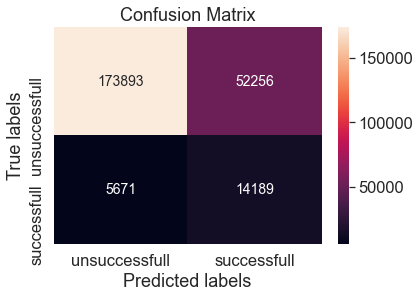

Accuracy score: 0.764533004890065
Sensitivity score: 0.7144511581067472
Specificity score: 0.7689311029454032
f1-score: 0.3288106135218122
Precision score: 0.21354503724885243
Recall score: 0.7144511581067472
AUC: 0.82


In [2098]:
y_train_pred = randomforest_randomsearch.predict(X_train)
# check area under curve
y_train_pred_prob = randomforest_randomsearch.predict_proba(X_train)[:, 1]
y_train_pred_final, conf_matrix = createfinaldf_and_checkscores(y_train,y_train_pred,y_train_pred_prob)

### <font size=3 color=blue>Lets check if we need to change the cutoff and see if senstivity and specificty can change</font>

In [2099]:
#check_cutoff(y_train_pred_final)
cutoff_df = check_cutoff(y_train_pred_final)
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0  0.0   0.080729  1.000000  0.000000
0.1  0.1   0.080745  1.000000  0.000018
0.2  0.2   0.134654  0.999194  0.058731
0.3  0.3   0.349930  0.971551  0.295341
0.4  0.4   0.586145  0.882175  0.560148
0.5  0.5   0.764533  0.714451  0.768931
0.6  0.6   0.873899  0.477492  0.908711
0.7  0.7   0.918515  0.208359  0.980880
0.8  0.8   0.920714  0.025076  0.999368
0.9  0.9   0.919271  0.000000  1.000000


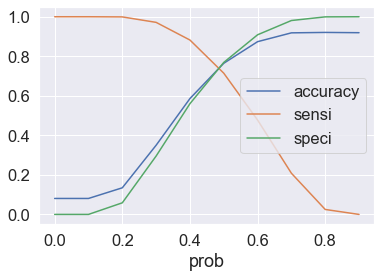

In [2100]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

### Observations from above plot
- 0.55 is the optimum point to take it as cutoff probability

### Based on the probability cutoff lets do predictions mapping again

In [2101]:
threshold_cutoff_prob = 0.55

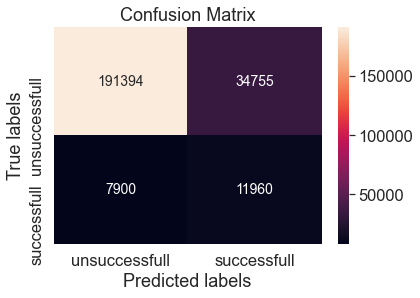

Accuracy score: 0.8266120345190623
Sensitivity score: 0.6022155085599195
Specificity score: 0.8463181353886154
f1-score: 0.35929402929027415
Precision score: 0.2560205501444932
Recall score: 0.6022155085599195
AUC: 0.82


In [2102]:
y_train_pred_final, conf_matrix = createfinaldf_and_checkscores(y_train,y_train_pred,y_train_pred_prob,
                                                                prob_cutoff=0.55)

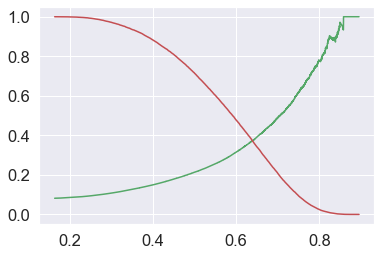

In [2103]:
p, r, thresholds = precision_recall_curve(y_train_pred_final['TARGET'], y_train_pred_final['TARGET_Prob'])
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

### Draw ROC Curve

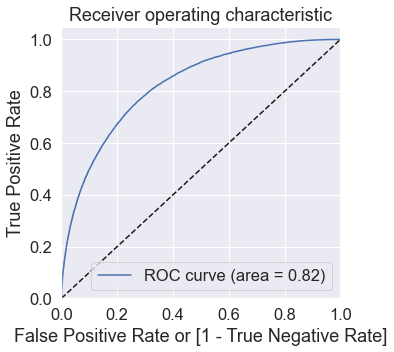

In [2104]:
draw_roc(y_train_pred_final['TARGET'],y_train_pred_final['TARGET_Prob'])

### Lets store results in results_df

In [2105]:
store_results(y_train_pred_final, #dataframe
              conf_matrix, #confusion_matrix
              'RandomForest_AllFiles', #model_name
              5, #location or index
              'train' #train or test set
             )

## Evaluate model on test data and check the score

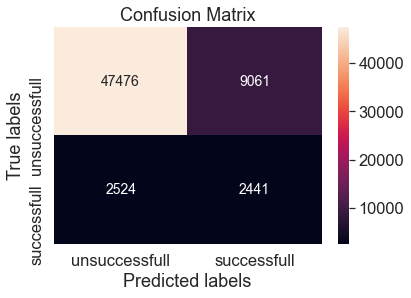

Accuracy score: 0.8116321420441611
Sensitivity score: 0.49164149043303124
Specificity score: 0.8397332720165556
f1-score: 0.2964717313414708
Precision score: 0.21222396105025212
Recall score: 0.49164149043303124
AUC: 0.75


In [2106]:
# predict churn on test data
y_test_pred = randomforest_randomsearch.predict(X_test)

# check area under curve
y_pred_prob = randomforest_randomsearch.predict_proba(X_test)[:, 1]### Test model on test data and check the score 

# use funtcion to final predictions and confusion matrix
y_test_pred_final, conf_matrix = createfinaldf_and_checkscores(y_test,y_test_pred,y_pred_prob,
                                                               prob_cutoff=0.55)#cutoff probability found is 0.55

### Draw ROC Curve

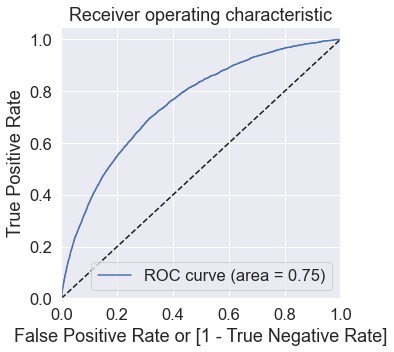

In [2107]:
draw_roc(y_test_pred_final['TARGET'],y_test_pred_final['TARGET_Prob'])

### Lets store results in results_df

In [2108]:
store_results(y_test_pred_final, #dataframe
              conf_matrix, #confusion_matrix
              'RandomForest_AllFiles', #model_name
              5, #location or index
              'test' #train or test set
             )

In [2109]:
results_df

,model_type,train_acc,train_sen,train_spec,train_f1,test_acc,test_sen,test_spec,test_f1
0,StatsModel,0.76,0.58,0.77,0.28,0.75,0.56,0.77,0.27
1,Logistic_RFE,0.75,0.59,0.76,0.27,0.74,0.57,0.76,0.27
2,RandomForest,0.79,0.61,0.8,0.32,0.78,0.54,0.8,0.28
3,RandomForest_SMOTE,0.76,0.46,0.79,0.24,0.76,0.41,0.79,0.21
4,XGBoost_Smote,0.68,0.64,0.69,0.25,0.68,0.6,0.69,0.23
5,RandomForest_AllFiles,0.83,0.6,0.85,0.36,0.81,0.49,0.84,0.3


## Model Conclusion
- RandomForest with all files gave better specificity score. We will use this model as our final model to calculate the credit scores

### Feature Importance

In [2110]:
randomforest_randomsearch.best_estimator_

Pipeline(steps=[('transform_scaler',
                 ColumnTransformer(transformers=[('std_scaler',
                                                  StandardScaler(),
                                                  ['CNT_CHILDREN',
                                                   'AMT_INCOME_TOTAL',
                                                   'AMT_CREDIT', 'AMT_ANNUITY',
                                                   'AMT_GOODS_PRICE',
                                                   'REGION_POPULATION_RELATIVE',
                                                   'DAYS_BIRTH',
                                                   'DAYS_EMPLOYED',
                                                   'DAYS_REGISTRATION',
                                                   'DAYS_ID_PUBLISH',
                                                   'OWN_CAR_AGE', 'FLAG_MOBIL',
                                                   'FLAG_EMP_PHONE',
                                      

In [2111]:
#features list
features_list = randomforest_randomsearch.best_estimator_.named_steps['transform_scaler'].transformers[0][2]

#features importance
features_importance = list(randomforest_randomsearch.best_estimator_.named_steps['randomforest'].feature_importances_)

#create dataframe with feature importance in percentage
params_df = pd.DataFrame({'feature':features_list,'coefficient':features_importance})
params_df = params_df.sort_values(by='coefficient',ascending=False).reset_index(drop=True)
params_df

,feature,coefficient
0,APPS_EXT_SOURCE_MEAN,0.153550
1,EXT_SOURCE_2,0.085095
2,EXT_SOURCE_3,0.057503
3,APPS_EXT_SOURCE_STD,0.026724
4,EXT_SOURCE_1,0.025817
5,BU_DAYS_CREDIT_MEAN,0.017584
6,BU_CREDIT_DEBT_RATIO_MAX,0.014981
7,APPS_GOODS_CREDIT_RATIO,0.014849
8,APPS_INCOME_EMPLOYED_RATIO,0.014112
9,BU_750_CREDIT_DEBT_RATIO_MAX,0.013032


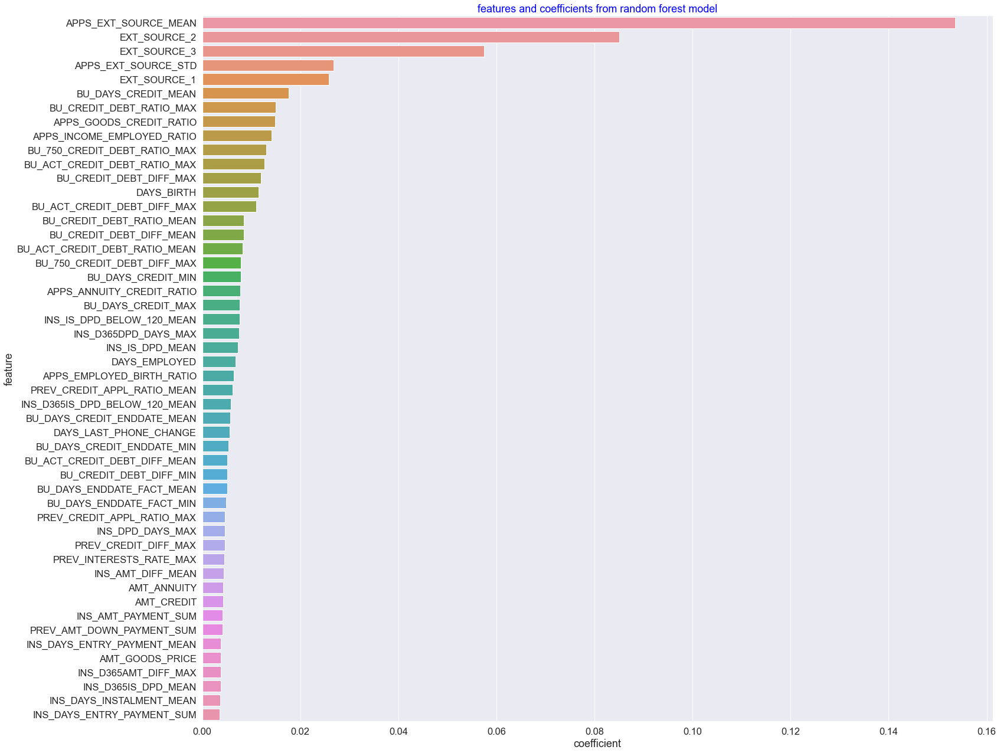

In [2180]:
plt.figure(figsize=(24,22))
plt.title('features and coefficients from random forest model',color='blue')
sns.barplot(y='feature',x='coefficient',data=params_df.head(50));
plt.savefig('features_importance.png')

### Observation from above plot
- EXT_SOURCE, GOODS_CREDIT_RATIO, ANNUITY_CREDIT_RATIO, BU_750_CREDIT_DEBT_RATIO_MAX, BU_DAYS_CREDIT_MEAN, APPS_INCOME_EMPLOYED_RATIO are important features in predicting loan default. 
- Also all the above listed features are positively correlated with the TARGET

## Calculate Credit Score

### Lets merge LoanId again with the final predicted train and test dataframes

### For that lets get the full application_train dataframe prediction using final model

In [2113]:
X_copy = X.copy()

In [2114]:
X.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,APPS_EXT_SOURCE_MEAN,APPS_EXT_SOURCE_STD,APPS_ANNUITY_CREDIT_RATIO,APPS_GOODS_CREDIT_RATIO,APPS_ANNUITY_INCOME_RATIO,APPS_CREDIT_INCOME_RATIO,APPS_GOODS_INCOME_RATIO,APPS_CNT_FAM_INCOME_RATIO,APPS_EMPLOYED_BIRTH_RATIO,APPS_INCOME_EMPLOYED_RATIO,APPS_INCOME_BIRTH_RATIO,APPS_CAR_BIRTH_RATIO,APPS_CAR_EMPLOYED_RATIO,PREV_SK_ID_CURR_COUNT,PREV_AMT_CREDIT_MEAN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_SUM,PREV_AMT_ANNUITY_MEAN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_SUM,PREV_AMT_APPLICATION_MEAN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_SUM,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_SUM,PREV_AMT_GOODS_PRICE_MEAN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_SUM,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,PREV_CREDIT_DIFF_MEAN,PREV_CREDIT_DIFF_MAX,PREV_CREDIT_DIFF_SUM,PREV_CREDIT_APPL_RATIO_MEAN,PREV_CREDIT_APPL_RATIO_MAX,PREV_GOODS_DIFF_MEAN,PREV_GOODS_DIFF_MAX,PREV_GOODS_DIFF_SUM,PREV_GOODS_APPL_RATIO_MEAN,PREV_GOODS_APPL_RATIO_MAX,PREV_DAYS_LAST_DUE_DIFF_MEAN,PREV_DAYS_LAST_DUE_DIFF_MAX,PREV_DAYS_LAST_DUE_DIFF_SUM,PREV_INTERESTS_RATE_MEAN,PREV_INTERESTS_RATE_MAX,PREV_APPROVED_COUNT,PREV_REFUSED_COUNT,PREV_365_SK_ID_CURR_COUNT,PREV_365_AMT_CREDIT_MEAN,PREV_365_AMT_CREDIT_MAX,PREV_365_AMT_CREDIT_SUM,PREV_365_AMT_ANNUITY_MEAN,PREV_365_AMT_ANNUITY_MAX,PREV_365_AMT_ANNUITY_SUM,PREV_365_AMT_APPLICATION_MEAN,PREV_365_AMT_APPLICATION_MAX,PREV_365_AMT_APPLICATION_SUM,PREV_365_AMT_DOWN_PAYMENT_MEAN,PREV_365_AMT_DOWN_PAYMENT_MAX,PREV_365_AMT_DOWN_PAYMENT_SUM,PREV_365_AMT_GOODS_PRICE_MEAN,PREV_365_AMT_GOODS_PRICE_MAX,PREV_365_AMT_GOODS_PRICE_SUM,PREV_365_RATE_DOWN_PAYMENT_MIN,PREV_365_RATE_DOWN_PAYMENT_MAX,PREV_365_RATE_DOWN_PAYMENT_MEAN,PREV_365_DAYS_DECISION_MIN,PREV_365_DAYS_DECISION_MAX,PREV_365_DAYS_DECISION_MEAN,PREV_365_CNT_PAYMENT_MEAN,PREV_365_CNT_PAYMENT_SUM,PREV_365_CREDIT_DIFF_MEAN,PREV_365_CREDIT_DIFF_MAX,PREV_365_CREDIT_DIFF_SUM,PREV_365_CREDIT_APPL_RATIO_MEAN,PREV_365_CREDIT_APPL_RATIO_MAX,PREV_365_GOODS_DIFF_MEAN,PREV_365_GOODS_DIFF_MAX,PREV_365_GOODS_DIFF_SUM,PREV_365_GOODS_APPL_RATIO_MEAN,PREV_365_GOODS_APPL_RATIO_MAX,PREV_365_DAYS_LAST_DUE_DIFF_MEAN,PREV_365_DAYS_LAST_DUE_DIFF_MAX,PREV_365_DAYS_LAST_DUE_DIFF_SUM,PREV_365_INTERESTS_RATE_MEAN,PREV_365_INTERESTS_RATE_MAX,BU_SK_ID_BUREAU_COUNT,BU_DAYS_CREDIT_MIN,BU_DAYS_CREDIT_MAX,BU_DAYS_CREDIT_MEAN,BU_CREDIT_DAY_OVERDUE_MIN,BU_CREDIT_DAY_OVERDUE_MAX,BU_CREDIT_DAY_OVERDUE_MEAN,BU_DAYS_CREDIT_ENDDATE_MIN,BU_DAYS_CREDIT_ENDDATE_MAX,BU_DAYS_CREDIT_ENDDATE_MEAN,BU_DA

In [2115]:
X.drop(columns='SK_ID_CURR',inplace=True)

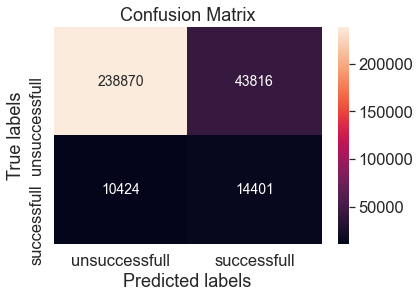

Accuracy score: 0.8236160657667531
Sensitivity score: 0.5801007049345418
Specificity score: 0.8450011673729863
f1-score: 0.3468365405457479
Precision score: 0.24736760739990038
Recall score: 0.5801007049345418
AUC: 0.81


In [2116]:
y_pred_complete = randomforest_randomsearch.predict(X)
# check area under curve
y_pred_prob_complete = randomforest_randomsearch.predict_proba(X)[:, 1]
y_pred_complete_final, conf_matrix = createfinaldf_and_checkscores(y,y_pred_complete,y_pred_prob_complete,
                                                               prob_cutoff=0.55)

### KS Statistics
- KS statistic is an indicator of how well your model discriminates between the two classes
- A good model is one for which the KS statistic:
    - is equal to 40% or more
    - lies in the top deciles, i.e. 1st, 2nd, 3rd or 4th

In [2181]:
from scipy.stats import ks_2samp
pred_probs_true = [j for i,j in zip(pred_df['TARGET'],pred_df['TARGET_Prob']) if i==0]
pred_probs_false = [j for i,j in zip(pred_df['TARGET'],pred_df['TARGET_Prob']) if i==1]
print(ks_2samp(pred_probs_true,pred_probs_false))

KstestResult(statistic=0.46486473923622007, pvalue=0.0)


### Since KS statistic is 46%, so we can say our model is good

In [2117]:
y_pred_complete_final.head()

,TARGET,TARGET_Prob,TARGETID,predicted
0,1,0.608943,0,1
1,0,0.301166,1,0
2,0,0.248231,2,0
3,0,0.347419,3,0
4,0,0.458261,4,0


In [2118]:
y_pred_complete_final.drop(columns='TARGETID',inplace=True)

In [2119]:
y_pred_complete_final.head()

,TARGET,TARGET_Prob,predicted
0,1,0.608943,1
1,0,0.301166,0
2,0,0.248231,0
3,0,0.347419,0
4,0,0.458261,0


In [2120]:
pred_df = pd.concat([X_copy['SK_ID_CURR'],y_pred_complete_final],axis=1)
pred_df.head()

,SK_ID_CURR,TARGET,TARGET_Prob,predicted
0,100002,1,0.608943,1
1,100003,0,0.301166,0
2,100004,0,0.248231,0
3,100006,0,0.347419,0
4,100007,0,0.458261,0


In [2161]:
pred_df = pred_df[['SK_ID_CURR','TARGET_Prob','TARGET','predicted']]
pred_df.head()

,SK_ID_CURR,TARGET_Prob,TARGET,predicted
0,100002,0.608943,1,1
1,100003,0.301166,0,0
2,100004,0.248231,0,0
3,100006,0.347419,0,0
4,100007,0.458261,0,0


### Calculate Credit Score

### Lets build an application scorecard with the good to bad odds of 10 to 1 at a score of 400 doubling every 20 points.

In [2122]:
#Function to calculate Credit Score
def calculate_application_score(target_prob_df):
    odd_good = (1-target_prob_df['TARGET_Prob'])/target_prob_df['TARGET_Prob']
    slope = 20/(np.log(20)-np.log(10))
    score = 400 + slope * (np.log(odd_good) - np.log(10))
    return score

In [2162]:
pred_df['Score'] = calculate_application_score(pred_df)
pred_df.head()

,SK_ID_CURR,TARGET_Prob,TARGET,predicted,Score
0,100002,0.608943,1,1,320.782915
1,100003,0.301166,0,0,357.849266
2,100004,0.248231,0,0,365.533573
3,100006,0.347419,0,0,351.751028
4,100007,0.458261,0,0,338.390033


### Calculate threshold Cutoff credit score

In [2124]:
odd_good = (1-threshold_cutoff_prob)/threshold_cutoff_prob
slope = 20/(np.log(20)-np.log(10))
threshold_credit_score = 400 + slope * (np.log(odd_good) - np.log(10))
print('Threshold credit score: {0}'.format(threshold_credit_score))

Threshold credit score: 327.771305758353


In [2125]:
pred_df[pred_df['TARGET']==1]['Score'].count()

24825

In [2126]:
print('Total number of defaulters with Credit Score more than or equal to cut-off score: {0}'.format(
    pred_df[(pred_df['TARGET']==1)&(pred_df['Score']>=threshold_credit_score)]['Score'].count()))

Total number of defaulters with Credit Score more than or equal to cut-off score: 10424


In [2127]:
print('Total number of defaulters with Credit Score less than cut-off score: {0}'.format(
    pred_df[(pred_df['TARGET']==1)&(pred_df['Score']<threshold_credit_score)]['Score'].count()))

Total number of defaulters with Credit Score less than cut-off score: 14401


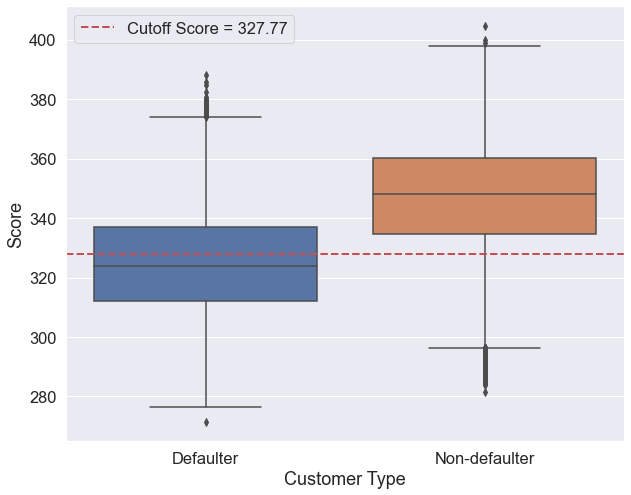

In [2128]:
plt.figure(figsize=(10,8))
ax = sns.boxplot(y=pred_df['Score'],x=pred_df['TARGET'].apply(lambda x:'Non-defaulter' if x==0 else 'Defaulter'))
plt.axhline(threshold_credit_score, label='Cutoff Score = %0.2f' %threshold_credit_score,color='r',linestyle='--',linewidth=2)
ax.set_xlabel('Customer Type')
plt.legend(loc="upper left")
plt.show()

### Observation
- Cut-ff Credit Score is 327.77
- Mean and median of Non-defaulter is higher than the defaulters
- There are some outliers in defaulters with high credit score as well

### Min and max credit scores of defaulters and non-defaulters

In [2129]:
print('Minimum credit score of non-defaulter is : {0}'.format(round(pred_df[pred_df['TARGET']==0]['Score'].min(),2)))

Minimum credit score of non-defaulter is : 281.66


In [2130]:
print('Maximum credit score of non-defaulter is : {0}'.format(round(pred_df[pred_df['TARGET']==0]['Score'].max(),2)))

Maximum credit score of non-defaulter is : 404.54


In [2131]:
print('Minimum credit score of defaulter is : {0}'.format(round(pred_df[pred_df['TARGET']==1]['Score'].min(),2)))

Minimum credit score of defaulter is : 271.56


In [2132]:
print('Maximum credit score of defaulter is : {0}'.format(round(pred_df[pred_df['TARGET']==1]['Score'].max(),2)))

Maximum credit score of defaulter is : 388.28


## Gain and Lift Charts

#### Lets create deciles based on Target Probabilities

In [2020]:
decile_df = pred_df[['TARGET_Prob','TARGET','predicted']].copy()
decile_df.head()

,TARGET_Prob,TARGET,predicted
0,0.605762,1,1
1,0.318005,0,0
2,0.250581,0,0
3,0.422921,0,0
4,0.456331,0,0


In [2133]:
decile_df['decile'] = pd.qcut(decile_df['TARGET_Prob'].rank(method='first'), 10, labels=np.arange(10, 0, -1))
decile_df.head()

,TARGET_Prob,TARGET,predicted,decile
0,0.605762,1,1,2
1,0.318005,0,0,7
2,0.250581,0,0,9
3,0.422921,0,0,5
4,0.456331,0,0,4


In [2134]:
lift_df = decile_df.groupby('decile')['TARGET_Prob'].count().reset_index()
lift_df.rename({'TARGET_Prob':'total'}, axis=1, inplace=True)

In [2135]:
lift_df_pred = decile_df[decile_df['TARGET']==1].groupby('decile')['TARGET'].count().reset_index()
lift_df_pred.head()

,decile,TARGET
0,10,142
1,9,320
2,8,574
3,7,832
4,6,1263


In [2136]:
lift_df_final = lift_df.merge(lift_df_pred,on = 'decile')
lift_df_final = lift_df_final.sort_values(['decile'], ascending=False)
lift_df_final['cum_default'] = lift_df_final['TARGET'].cumsum()
lift_df_final['gain_pcnt'] = 100*(lift_df_final['cum_default']/sum(lift_df_final['TARGET']))
lift_df_final['cumlift'] = lift_df_final['gain_pcnt']/(lift_df_final['decile'].astype('int')*(100/10))
lift_df_final.reset_index(drop=True)

,decile,total,TARGET,cum_default,gain_pcnt,cumlift
0,1,30751,9599,9599,38.666667,3.866667
1,2,30751,4863,14462,58.255791,2.912790
2,3,30751,3249,17711,71.343404,2.378113
3,4,30751,2317,20028,80.676737,2.016918
4,5,30751,1666,21694,87.387714,1.747754
5,6,30751,1263,22957,92.475327,1.541255
6,7,30751,832,23789,95.826788,1.368954
7,8,30751,574,24363,98.138973,1.226737
8,9,30751,320,24683,99.427996,1.104756
9,10,30752,142,24825,100.000000,1.000000


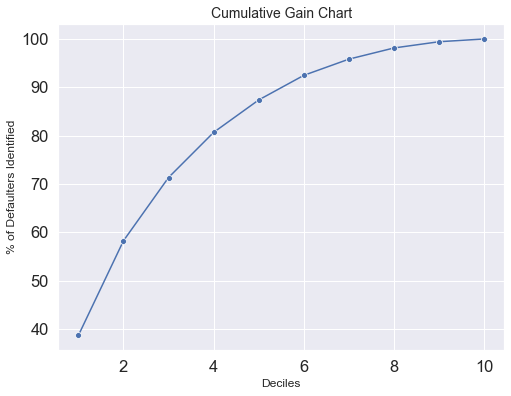

In [2137]:
plt.figure(figsize=(8,6))
ax = sns.lineplot(data=lift_df_final,x='decile', y='gain_pcnt', marker="o")
ax.set_title("Cumulative Gain Chart",fontsize=14)
ax.set_xlabel("Deciles",fontsize=12)
ax.set_ylabel("% of Defaulters Identified",fontsize=12)
plt.show()

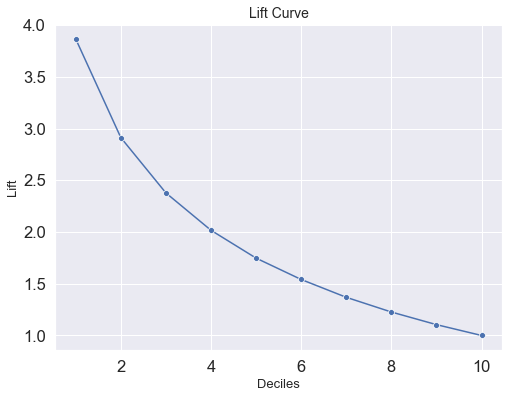

In [2138]:
plt.figure(figsize=(8,6))
ax = sns.lineplot(data=lift_df_final,x='decile', y='cumlift',marker="o")
ax.set_title("Lift Curve",fontsize=14)
ax.set_xlabel("Deciles",fontsize=13)
ax.set_ylabel("Lift",fontsize=13)
plt.show()

# <font color=purple size=6>Conclusion and Recommendation</font>
- EXT_SOURCE, GOODS_CREDIT_RATIO, ANNUITY_CREDIT_RATIO, BU_750_CREDIT_DEBT_RATIO_MAX, BU_DAYS_CREDIT_MEAN, APPS_INCOME_EMPLOYED_RATIO are important features in predicting loan default. 
- The cutoff Credit score is 327.77
- Total number of defaulters with Credit Score more than or equal to cut-off score: 10424
- Total number of defaulters with Credit Score less than cut-off score: 14401
- We can conclude that we can predict 87% of the total defaulters by analysing only 50% of the client base

## Credit Loss saved
- The candidates who have been selected by the bank and have defaulted are responsible for the credit loss to the bank.
- We will calculate the percentage of credit loss we were able to avert by using the model.

In [2163]:
pred_df.head()

,SK_ID_CURR,TARGET_Prob,TARGET,predicted,Score
0,100002,0.608943,1,1,320.782915
1,100003,0.301166,0,0,357.849266
2,100004,0.248231,0,0,365.533573
3,100006,0.347419,0,0,351.751028
4,100007,0.458261,0,0,338.390033


In [2169]:
defaulter_model =len(pred_df[(pred_df['predicted']==0) & (pred_df['TARGET']==1)])

total_defaulters = len(pred_df[pred_df['TARGET']==1])
total_num_customers = len(pred_df)
print('Total no. of customers who are actual defaulters and predicted as non-defaulters with model: {0}'.
      format(defaulter_model))
print('Total Actual defaulters : {0}'.format(total_defaulters))
print('Total Customers: {0}'.format(total_num_customers))

percent_defaulters_without_model = round(100*total_defaulters/total_num_customers,2)
percent_defaulters_with_model = round(100*defaulter_model/total_num_customers,2)

print("% of candidates approved and then defaulted when model was not used : {0}%".format(
    percent_defaulters_without_model))
print("% of candidates approved and then defaulted when model was used : {0}%".format(
    percent_defaulters_with_model))
print("% of Credit Loss saved : {}%".format(
    round(percent_defaulters_without_model-percent_defaulters_with_model,2)))


Total no. of customers who are actual defaulters and predicted as non-defaulters with model: 10424
Total Actual defaulters : 24825
Total Customers: 307511
% of candidates approved and then defaulted when model was not used : 8.07%
% of candidates approved and then defaulted when model was used : 3.39%
% of Credit Loss saved : 4.68%


## Revenue Loss
- It occurs when good customers are identified as bad customers i.e. non-defaulters identified as defaulters here

In [2175]:
non_defaulter_model =len(pred_df[(pred_df['predicted']==1) & (pred_df['TARGET']==0)])

total_non_defaulters = len(pred_df[pred_df['TARGET']==0])

print('Total no. of customers who are actual non-defaulters and predicted as defaulters with model: {0}'.
      format(non_defaulter_model))
print('Total Actual non-defaulters : {0}'.format(total_non_defaulters))
print("Total non-defaulters correctly identified by model : {0}".format(total_non_defaulters-non_defaulter_model))
print("% of good customers identified by our model : {:.2f}%".format(non_defaulter_model/total_non_defaulters*100))


Total no. of customers who are actual non-defaulters and predicted as defaulters with model: 43816
Total Actual non-defaulters : 282686
Total non-defaulters correctly identified by model : 238870
% of good customers identified by our model : 15.50%


## Evaluating Financial Benefits of the Model :
- We will make some assumptions regarding the average credit loss for each defaulted customers and the profit obtained from each non-defaulters. 
- We will analyse the overall financial benefit of the model and calculate the net financial gain obtained by using the model.

Let's assume the average credit loss for each defaulted customer is CURR 100000/- and profit for each non-defaulters be CURR 10000/-

In [2168]:
profit_without_model = (total_non_defaulters*10000 - total_defaulters*100000)/10000000
profit_with_model = ((total_non_defaulters-non_defaulter_model)*10000 - defaulter_model*100000)/10000000
print("Net profit without model : Curr {:.2f} Million".format(profit_without_model))
print("Net profit with model : Curr {:.2f} Million".format(profit_with_model))
print("Net Financial gain using the model : Curr {:.2f} Million".format(profit_with_model-profit_without_model))
print("% Financial Gain : {:.2f}%".format((profit_with_model-profit_without_model)/profit_without_model*100))

Net profit without model : Curr 34.44 Million
Net profit with model : Curr 134.63 Million
Net Financial gain using the model : Curr 100.19 Million
% Financial Gain : 290.96%
